# Create the data

https://cs231n.github.io/convolutional-networks/
https://medium.com/apache-mxnet/multi-channel-convolutions-explained-with-ms-excel-9bbf8eb77108

https://colab.research.google.com/github/KeremTurgutlu/self_supervised/blob/master/nbs/11%20-%20moco.ipynb

https://github.com/dddzg/MoCo
https://github.com/KeremTurgutlu/self_supervised/blob/main/self_supervised/multimodal/clip_moco.py
https://github.com/facebookresearch/vissl

https://colab.research.google.com/github/facebookresearch/moco/blob/colab-notebook/colab/moco_cifar10_demo.ipynb

https://github.com/KeremTurgutlu/self_supervised/tree/main/nbs

In [1]:
import numpy
print('numpy:',numpy.version.version)

from platform import python_version
print('python:',python_version())

import torch
print('torch:', torch.__version__)

import matplotlib
from matplotlib import pyplot as plt
print('matplotlib:',matplotlib.__version__)

import seaborn as sns
print('seaborn:',sns.__version__)

import h5py
print(h5py.__version__)

numpy: 1.21.4
python: 3.7.3
torch: 1.7.1+cu110
matplotlib: 3.0.2
seaborn: 0.10.0
3.6.0


In [2]:
import random
import torch
from torch import nn, optim
import math
from IPython import display
from matplotlib import pyplot as plt
import numpy as np
from cycler import cycler
import matplotlib.style
import matplotlib as mpl
from mpl_toolkits import mplot3d 
import matplotlib.cm as cm
import torch.nn.functional as F

seed = 9
import numpy as np
import torch
np.random.seed(seed)
torch.manual_seed(seed)

np.random.normal( size=(2, 4))

array([[ 1.10855471e-03, -2.89544069e-01, -1.11606630e+00,
        -1.28827567e-02],
       [-3.78361464e-01, -4.81135363e-01, -1.51733118e+00,
        -4.90871981e-01]])

In [3]:
gpu_info = !nvidia-smi -i 0
gpu_info = '\n'.join(gpu_info)
print(gpu_info)

from datetime import datetime
from functools import partial
from PIL import Image
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.datasets import CIFAR10
from torchvision.models import resnet
from tqdm import tqdm
import argparse
import json
import math
import os
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F

Mon Mar 13 22:42:56 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.60.13    Driver Version: 525.60.13    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  On   | 00000000:02:00.0 Off |                    0 |
| N/A   36C    P0    32W / 250W |   3212MiB / 16384MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [4]:
import matplotlib

matplotlib.rc('xtick', labelsize = 12) 
matplotlib.rc('ytick', labelsize = 12)

In [5]:
from numpy import random


from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
import numpy as np



# from utils.cf_matrix import *

# labels = ['w','e','s','b']
# categories = ['z','r','o']
# make_confusion_matrix(cf_matrix, 
#                       group_names=labels,
#                       categories=categories, 
#                      cmap='jet')


# labels = ['True Neg','False Pos','False Neg','True Pos']
# categories = ['Zero', 'One']
# make_confusion_matrix(cf_matrix, 
# #                       group_names=labels,
#                       categories=categories, 
#                       cmap='winter')


/gpfs/exfel/sw/software/xfel_anaconda3/1.1.2/lib/python3.7/site-packages/sklearn/linear_model/least_angle.py:35: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  eps=np.finfo(np.float).eps,
/gpfs/exfel/sw/software/xfel_anaconda3/1.1.2/lib/python3.7/site-packages/sklearn/linear_model/least_angle.py:597: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecat

Text(47.99999999999999, 0.5, '2nd transformation')

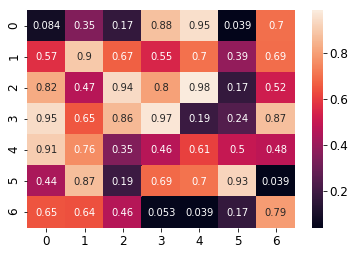

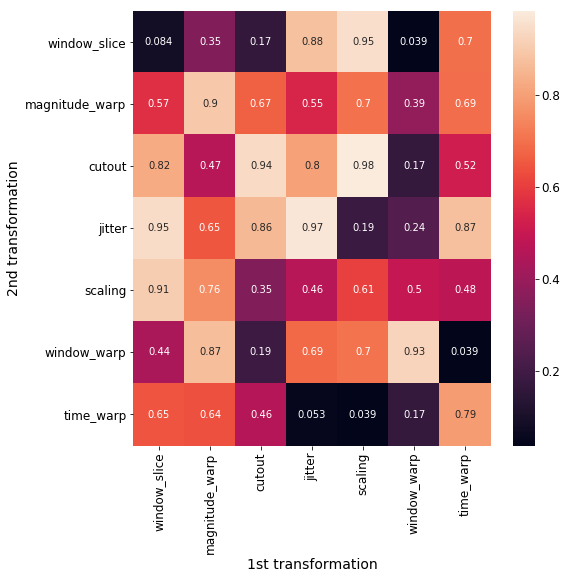

In [6]:
##### https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix
##### https://seaborn.pydata.org/generated/seaborn.heatmap.html

catagories = ['window_slice' ,'magnitude_warp' ,'cutout' ,'jitter' ,'scaling' ,'window_warp', 'time_warp']
n_aug = len(catagories)
cf_matrix = random.rand(n_aug, n_aug)
import seaborn as sns
sns.heatmap(cf_matrix, annot=True)

import matplotlib.pyplot as plt

df_cm = pd.DataFrame(cf_matrix, index = [i for i in catagories],
                  columns = [i for i in catagories])
plt.figure(figsize = (8,8))
ax =sns.heatmap(df_cm, annot=True)
ax.set_xlabel('1st transformation',fontsize = 14)
ax.set_ylabel('2nd transformation',fontsize = 14)

In [7]:
# SplitBatchNorm: simulate multi-gpu behavior of BatchNorm in one gpu by splitting alone the batch dimension
# implementation adapted from https://github.com/davidcpage/cifar10-fast/blob/master/torch_backend.py
class SplitBatchNorm(nn.BatchNorm1d):
    def __init__(self, num_features, num_splits, **kw):
        super().__init__(num_features, **kw)
        self.num_splits = num_splits
        
    def forward(self, input):
        N, C, L = input.shape
        if self.training or not self.track_running_stats:
            running_mean_split = self.running_mean.repeat(self.num_splits)
            running_var_split = self.running_var.repeat(self.num_splits)
            outcome = nn.functional.batch_norm(
                input.view(-1, C * self.num_splits, L), running_mean_split, running_var_split, 
                self.weight.repeat(self.num_splits), self.bias.repeat(self.num_splits),
                True, self.momentum, self.eps).view(N, C, L)
            self.running_mean.data.copy_(running_mean_split.view(self.num_splits, C).mean(dim=0))
            self.running_var.data.copy_(running_var_split.view(self.num_splits, C).mean(dim=0))
            return outcome
        else:
            return nn.functional.batch_norm(
                input, self.running_mean, self.running_var, 
                self.weight, self.bias, False, self.momentum, self.eps)


In [8]:

#     from model.model_backbone import SimConv4,ConvSC,linear_classifier, ConvSC_NoFdfwd
#     from optim.SupContTrain import SupContConvSC
    
#     OUT_Dim =1  
#     O_FeatCOV=1
#     O_CHENNEL = 16
# #     O_EmbDim = 128
#     if opt.backbone=='ConvSC':
#         backbone_lineval = ConvSC( 
#             O_channel  = O_CHENNEL,
#             output_dim = OUT_Dim,
#             hidden_size = 150,
#             O_feature = O_FeatCOV,
#             embed_dim = O_EmbFtrSize,
#             num_heads = 2
#         ).to(device)
#     elif opt.backbone=='ConvSC_NoFdfwd':
#         backbone_lineval = ConvSC_NoFdfwd( 
#             O_channel  = O_CHENNEL,
#             output_dim = OUT_Dim,
#             hidden_size = 150,
#             O_feature = O_FeatCOV,
#             embed_dim = O_EmbFtrSize,
#             num_heads = 2
#         ).to(device)
#     elif opt.backbone=='SupContConvSC'or opt.backbone == 'SimClrConvSC':
#         backbone_lineval = SupContConvSC(opt).to(device)
#     else:
#         backbone_lineval = SimConv4().to(device)
    
    
#     # 64 are the number of output features in the backbone, and 10 the number of classes
#     linear_layer = torch.nn.Linear(opt.feature_size, nb_class).to(device)
    

        
#     print('linear_layer:',linear_layer)
#     print('backbone_lineval:',backbone_lineval)
    

In [9]:
# for name, module in backbone_lineval.named_children():
#     if 'conv' in name:
#         print(name,module[1])

In [10]:


# from typing import Type, Any, Callable, Union, List, Optional
   
# N = 4020
# AdptPool = 236
# class ConvSC_NoFdfwd(nn.Module): #ConvSC_NoFdfwd
#     def __init__(self, n_feature=64,  O_channel=8, O_feature=1,output_dim = 1,dim_feedforward =1024,  hidden_size = 150, embed_dim =256, 
#                  num_heads = 4,Sim_Batch = 1024,
#                  norm_layer: Optional[Callable[..., nn.Module]] = None):
      
#         super(ConvSC_NoFdfwd,self).__init__()

        
#         if norm_layer is None:
#             norm_layer = nn.BatchNorm1d
            
#         self.conv1 = nn.Sequential(nn.Conv1d(1, n_feature, kernel_size=5,stride=2),
# #                                    nn.BatchNorm1d(n_feature),
#                                    norm_layer(n_feature),
#                                    nn.ReLU(),
#                                    nn.MaxPool1d(2)
#                                    )
 
#         self.conv3 = nn.Sequential(nn.Conv1d(n_feature, O_channel, kernel_size=5),
# #                                    nn.BatchNorm1d(O_channel),
#                                    norm_layer(O_channel),
#                                    nn.ReLU(),
#                                    nn.MaxPool1d(2),
#                                    nn.AdaptiveAvgPool1d(AdptPool)
#                                    )

#         self.dec_conv3 = nn.Sequential(nn.Conv1d(O_channel, 1, kernel_size=1),
# #                                    nn.BatchNorm1d(1),
#                                    norm_layer(1),
#                                    nn.ReLU(),
# #                                    nn.MaxPool1d(2)
#                                    )
#         input_shape_emb = (Sim_Batch, 1, N) # just for test, in order to get the shape of FNN input neurons            
#         self.output_dimension_emb = self._get_conv_output_emb(input_shape_emb)
        
#         input_shape_fc = (Sim_Batch, O_channel, embed_dim) 
#         self.output_dimension_fc = self._get_conv_output_fc(input_shape_fc)
        
        
#         self.embeding = nn.Sequential( 
# #             nn.Linear(self.output_dimension_emb, embed_dim),
#             nn.Linear(AdptPool, embed_dim),
#             nn.LayerNorm(embed_dim)
#         )
                                      
#         self.MultiHeadAttention = nn.MultiheadAttention(O_channel, num_heads)
#         self.C_Attention_F = CAM_Module().to(device)
        
#         self.LayerNorm = nn.LayerNorm(embed_dim)
            
#         self._create_weights()
        


#     def _create_weights(self, mean=0.0, std=0.05):
#         for module in self.modules():
#             if isinstance(module, nn.Conv1d) or isinstance(module, nn.Linear):
#                 module.weight.data.normal_(mean, std) 
#             if isinstance(module, nn.BatchNorm1d) or isinstance(module,SplitBatchNorm):
#                 module.weight.data.normal_(mean, std) 
 
                
                
# #     def _get_conv_output_emb(self, shape):
#     def _get_conv_output_emb(self, x):
#         x = torch.rand(x)
# #         x = torch.rand(shape)
#         x = self.conv1(x)
#         x = self.conv3(x)
#         output_dimension_emb = x.shape[-1]
#         return output_dimension_emb 


#     def _get_conv_output_fc(self, shape):
#         x = torch.rand(shape)
#         x = self.dec_conv3(x)
#         output_dimension_fc = x.shape[-1]
#         return output_dimension_fc 
    
#     def forward(self, x):
#         In_Conv = torch.squeeze(x,-1)
#         In_Conv = torch.unsqueeze(In_Conv,1)
    
        
#         In_Conv  = self.conv1(In_Conv)         
# #         In_Conv  = self.conv2(In_Conv)
#         In_Conv  = self.conv3(In_Conv)
# #         print('Conv output:',In_Conv.shape)
        
#         In_Conv_Att  = self.embeding(In_Conv)
# #         print('embeding output/In_Conv_Att:',In_Conv_Att.shape)  # BATCH, C, Spatial size
#         In_Conv_Att_S = In_Conv_Att.permute(2, 0, 1)  #(L, N, E) (L,N,E) where L is the target sequence length, N is the batch size, E is the embedding dimension.
# #         print('In_Conv_Att_S:',In_Conv_Att_S.shape)
        
#         ### attn_output: (L, N, E) where L is the target sequence length, N is the batch size, E is the embedding dimension.
#         ### attn_output_weights: (N, L, S) where N is the batch size, L is the target sequence length, S is the source sequence length.
#         In_Att_S,attention_S = self.MultiHeadAttention(In_Conv_Att_S,In_Conv_Att_S,In_Conv_Att_S)
#         In_Att_C,attention_C = self.C_Attention_F(In_Conv_Att)
# #         print('In_Att_C,attention_C:',In_Att_C.shape,attention_C.shape)
# #         print('In_Att_S,attention_S:',In_Att_S.shape,attention_S.shape)
        
#         # residual connection and feature fusion:
#         In_Conv  = (In_Conv_Att+In_Att_S.permute(1,2,0))  +In_Att_C   
        
# #         print('Spatial attention output shape:',In_Conv.shape)
      
#         In_Conv  = self.LayerNorm(In_Conv)
#         In_Conv  = self.dec_conv3(In_Conv)
# #         print('dec_conv3:',In_Conv.shape)
        
      
        
#         In_Conv  = In_Conv.view(In_Conv.size(0), -1)


# #         print('dec_conv3, output_dimension_fc:',In_Conv.shape, self.output_dimension_fc, self.output_dimension_emb)
        
# #         In_Conv  = self.fc1(In_Conv)
# #         return In_Conv, attention_S, attention_C, In_Conv_Att
#         return In_Conv


   
    
    
# bn_splits = 8
# norm_layer = partial(SplitBatchNorm, num_splits=bn_splits) if bn_splits > 1 else nn.BatchNorm1d
# print(norm_layer)
# net = ConvSC_NoFdfwd( norm_layer=norm_layer)  #
# print(net)

In [11]:
import random
import torch
from torch import nn, optim
import math
from IPython import display
from matplotlib import pyplot as plt
import numpy as np
from cycler import cycler
import matplotlib.style
import matplotlib as mpl
from mpl_toolkits import mplot3d 
import matplotlib.cm as cm
import torch.nn.functional as F

In [12]:
torch.cuda.device_count()

1

nn.Module comes in handy while writing many DL model. For example when you are trying to code Maxout Network as defined in the paper [Maxout Networks] (https://arxiv.org/pdf/1302.4389.pdf 44).
https://github.com/pytorch/pytorch/commit/c7c8aaa7f040dd449dbc6aca9204b2f943aef477
https://discuss.pytorch.org/t/multiple-parallel-fully-connected-layers-type-torch-cuda-floattensor-but-found-type-torch-floattensor/37810
https://www.geeksforgeeks.org/single-neuron-neural-network-python/
https://rhettinger.wordpress.com/2011/05/26/super-considered-super/


In [13]:
%matplotlib notebook
import glob, os, os.path
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy import stats
import bisect
import scipy.sparse as sparse  #for baseline subtraction
from matplotlib import rc
# rc('mathtext', default='regular')
import h5py
# torch.set_printoptions(threshold=100000)
# plt.style.use('science')

In [14]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

if device.type == 'cuda':
    print(torch.cuda.get_device_name(0))
    print('Memory Usage:')
    print('Allocated:', round(torch.cuda.memory_allocated(0)/1024**3,1), 'GB')
    print('Cached:   ', round(torch.cuda.memory_reserved(0)/1024**3,1), 'GB')

cuda:0
Tesla P100-PCIE-16GB
Memory Usage:
Allocated: 0.0 GB
Cached:    0.0 GB


In [15]:
size = 10
K = 3
for index_1 in range(0, size*K, size):
    for index_2 in range(index_1+size, size*K, size):
        print(index_1,index_2)

0 10
0 20
10 20


In [16]:
# target output size of 5
m = nn.AdaptiveAvgPool1d(5)
input = torch.randn(1, 64, 2)
output = m(input)
print(output.shape)

torch.Size([1, 64, 5])


In [17]:
TrainingFlag = 1

In [18]:


#Slice_gap = 0.05
Slice_s = 1 if TrainingFlag else 0.9
Slice_e = 1 if TrainingFlag else 0.98


num = 1 if TrainingFlag else 8
for Slice_n in np.linspace(Slice_s, Slice_e, num = num):
    print(Slice_n)

print(Slice_s, Slice_e , num)

1.0
1 1 1


In [19]:
### label time series along time step dimension:
def temp_label(ts_len, typeC = 10):
    ts_eachlen = int(np.around(ts_len/typeC)) # divide ts into typeC pieces, the length of each piece.
#     ts_eachlen = int(ts_len/typeC) # divide ts into typeC pieces, the length of each piece.
    print(ts_eachlen)


    if ts_eachlen*typeC<=ts_len:
        label = (typeC-1)*np.ones(ts_len)
        for i in range(typeC):
#             print(i)
            label[i*ts_eachlen:(i+1)*ts_eachlen] = i*np.ones(ts_eachlen)
    else:  
        label = (typeC-1)*np.ones(ts_len) # np.zeros(ts_len)
        for i in range(typeC-1):
            if (i+1)*ts_eachlen<=ts_len:
                label[i*ts_eachlen:(i+1)*ts_eachlen] = i*np.ones(ts_eachlen)
            elif i*ts_eachlen<=ts_len:
                
                label[i*ts_eachlen:] = i*np.ones((ts_len-i*ts_eachlen))

    return label

typeC = 5

In [20]:
# ### label time series along time step dimension:
# def temp_label(ts_len, typeC = 10):
    
#     ts_eachlen = int(ts_len/typeC) # divide ts into typeC pieces, the length of each piece.
#     print(ts_eachlen)

#     label = (typeC-1)*np.ones(ts_len)

#     for i in range(typeC):
#         label[i*ts_eachlen:(i+1)*ts_eachlen] = i*np.ones(ts_eachlen)

#     return label


# typeC = 10

In [21]:
# temp_label(107, typeC = 20)

In [22]:
# hfont = {'fontname':'Helvetica'}

In [23]:
'''Definitions'''

def gaussian(x, x0, r, a, b):
    y = b + a*np.exp(-(x-x0)**2/(2*r**2))
    return y

def PseudoVoigtFunction(WavNr, Pos, Amp, GammaL, FracL):
    SigmaG = GammaL / np.sqrt(2*np.log(2)) # Calculate the sigma parameter  for the Gaussian distribution from GammaL (coupled in Pseudo-Voigt)
    LorentzPart = Amp / np.pi * (GammaL / ((WavNr - Pos)**2 + GammaL**2)) # Lorentzian distribution
    GaussPart = Amp / (np.sqrt(2*np.pi) * SigmaG) * np.exp( -(WavNr - Pos)**2 / (2 * SigmaG**2)) # Gaussian distribution
    Fit = FracL * LorentzPart + (1 - FracL) * GaussPart # Linear combination of the two parts (or distributions)
    return Fit

#baseline subtraction based on Asymetric Least Square Smoothing
#https://zanran_storage.s3.amazonaws.com/www.science.uva.nl/ContentPages/443199618.pdf
def baseline_als(y, lam, p, niter=10):
    L = len(y)
    D = sparse.csc_matrix(np.diff(np.eye(L), 2))
    w = np.ones(L)
    for i in range(niter):
        W = sparse.spdiags(w, 0, L, L)
        Z = W + lam * D.dot(D.transpose())
        z = sparse.linalg.spsolve(Z, w*y)
        w = p * (y > z) + (1-p) * (y < z)
    return z

# Function which extracts the number of all XYfiles in the directory. 

run_no=0
def get_number_XYfiles(run_no,fdir):
    directory = os.listdir(fdir)
    number_XYfiles = run_no
    for Dir in directory:
        number_XYfiles = number_XYfiles+1
    return(number_XYfiles)

In [24]:
# show the number of XYfiles found in the directory
run_no = 0
fdir = '/gpfs/exfel/data/user/sunyue/Downloads/FeO_Pt_fastcomp_LAMBDA2_XY/FeO_Pt_slowcomp_LAMBDA2_XY/'
total_XYfiles = get_number_XYfiles(run_no,fdir)
print(total_XYfiles)
# total_XYfiles=350 #[Pt=1084, MgFeOB1_263]
print('The number of XYfiles within the chosen run is:', total_XYfiles)
%pwd
%mkdir -p ClassificationFigures
save_figures_to = '/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/ClassificationFigures/'

461
The number of XYfiles within the chosen run is: 461


In [25]:

save_figures_to = '/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/ClassificationFigures/'

## Slowcomp======FeO_Pt_slowcomp_LAMBDA2_XY

In [26]:
'''make sure that you have the right command directory selected'''
%cd /gpfs/exfel/data/user/sunyue/Downloads/FeO_Pt_fastcomp_LAMBDA2_XY/FeO_Pt_slowcomp_LAMBDA2_XY/
theta = [] 
I = []
baseline = []
Icorrect = []

test_y=total_XYfiles-2
for run_no in range(1,0+total_XYfiles):
#     fileNO = str(run_no).zfill(4) 
    fname = 'l2_feo_pt_300_ramp_00001_m1_'+str(run_no).zfill(3)+'.xy'
    thetas, Is = np.loadtxt(fname, skiprows=25, unpack=True) # reads all files in range and assigns 1st column to thetas and 2nd to Is
    I.append(Is) # attaches a new array each time to a copy of previous, not really necessary here
    idx1 = 0
    idx2 = 4020
#background subtraction
#parameters lam and p have to be adjusted by hand!
#try 10**2 < lam < 10**9
#    0.001 <  p  < 0.1
    lam = 100000
    p = 0.002
    baselines = baseline_als(Is[idx1:idx2], lam, p)
    baseline.append(baselines)
    Icorrected = Is[idx1:idx2] - baselines
    Icorrect.append(Icorrected)
#    if (run_no==15): 
#        print(thetas.size, Is.shape,type(I),np.shape(I),len(Icorrected),len(baselines),sep='\n')
    thetas = thetas[idx1:idx2]
    theta.append(thetas)

/gpfs/exfel/data/user/sunyue/Downloads/FeO_Pt_fastcomp_LAMBDA2_XY/FeO_Pt_slowcomp_LAMBDA2_XY


In [27]:
y_slow_tmp = temp_label(len(theta),typeC)

92


In [28]:
Icorrect = (Icorrect-np.amin(Icorrect))/(np.amax(Icorrect)-np.amin(Icorrect))
print(Icorrect.max(),Icorrect.min())

1.0 0.0


In [29]:
print(theta[0].shape,np.size(theta),len(theta),np.size(theta[0]))

(4020,) 1849200 460 4020


<IPython.core.display.Javascript object>


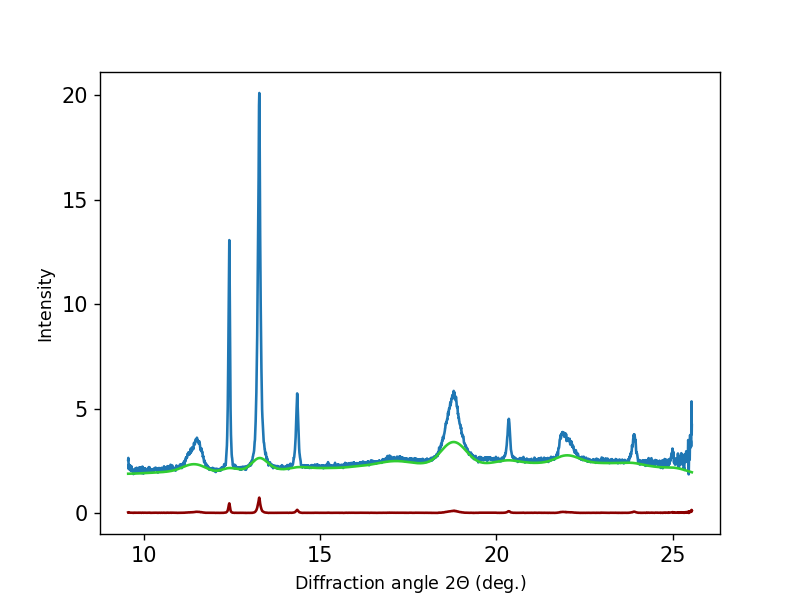

<function matplotlib.pyplot.tight_layout(pad=1.08, h_pad=None, w_pad=None, rect=None)>

In [30]:
plt.figure()
plt.plot(theta[98], I[98][idx1:idx2])
plt.plot(theta[98], baseline[98],color = 'limegreen')
plt.plot(theta[98], Icorrect[98], color = 'darkred')
#plt.plot(theta[0], I[0], color = 'red')
#plt.plot(theta[1500], I[1500][idx1:idx2])
#plt.plot(theta[1500], baseline[1500])
#plt.plot(theta[450], Icorrect[450], color = 'limegreen')
#plt.plot(theta[420], I[420], color = 'limegreen')
plt.ylabel('Intensity') #, fontsize = 12
plt.xlabel('Diffraction angle 2$\Theta$ (deg.)' )#, fontsize = 12
plt.tight_layout

In [31]:
def minibatch_plot_data(X, y, ai1=-1,ai2=1,bi1=-1,bi2=1,d=0, auto=False, zoom=1):
    X = X.cpu()
    y = y.cpu()
#     plt.scatter(X.numpy()[:, 0], X.numpy()[:, 1], c=y, s=2, cmap=plt.cm.rainbow)
    plt.scatter(X.numpy()[:, 0], X.numpy()[:, 1], c=y, s=2, cmap=plt.cm.rainbow)
#     plt.axis('square')
#     plt.axis(np.array((ai1, ai2, bi1, bi2)) * zoom)
#     if auto is True: plt.axis('equal')
    plt.axis('on') 
    
def minibatch_plot_model(mndinx1,mndinx2,mndiny1,mndiny2,X2, y2, model):
    model.cpu()
#     nx, ny = (200, 200)
#     x = np.linspace(mndinx1, mndinx2, nx)
#     y = np.linspace(mndiny1,mndiny2, ny)
    x = np.arange(mndinx1, mndinx2, 0.02)
    y = np.arange(mndiny1, mndiny2, 0.001)
    xx, yy = np.meshgrid(x, y)
    with torch.no_grad():
        data = torch.from_numpy(np.vstack((xx.reshape(-1), yy.reshape(-1))).T).float()
        Z = model(data).detach()
    Z = np.argmax(Z, axis=1).reshape(xx.shape)
    
    plt.contourf(xx, yy, Z, cmap=plt.cm.rainbow, alpha=0.3)
    minibatch_plot_data(X2, y2,mndinx1,mndinx2,mndiny1,mndiny2,zoom=1)

In [32]:
def plot_data(X, y, d=0, auto=False, zoom=1):
    X = X.cpu()
    y = y.cpu()
#     plt.figure(figsize=(8,6))
    ax = plt.subplot(111)
    ax.set_ylabel('Intensity', )#fontsize = 16,
    ax.set_xlabel('Diffraction angle 2$\Theta$ (deg.)', )#fontsize = 16
#     plt.axis(np.array((axl, axr, byl, byh)) * zoom)
    
    plt.rc('xtick') #,labelsize=16
    plt.rc('ytick') #,labelsize=16
    plt.scatter(X.numpy()[:, 0], X.numpy()[:, 1], c=y, s=0.4, cmap=plt.cm.rainbow)

In [33]:
def set_default(figsize=(8,6)):
#     plt.style.use(['dark_background', 'bmh'])
#     plt.rc('figure', facecolor='none')
    plt.rc('figure', figsize=figsize)
    
def yue_plot_data(X, y, axl,axr,byl,byh,d=0, auto=False, zoom=1):
    X = X.cpu()
    y = y.cpu()
#     plt.figure(figsize=(8,6))
    ax = plt.subplot(111)
    ax.set_ylabel('Intensity') # fontsize = 16,
    ax.set_xlabel('Diffraction angle 2$\Theta$ (deg.)')#, fontsize = 16
    plt.axis(np.array((axl, axr, byl, byh)) * zoom)
    
    plt.rc('xtick') #,labelsize=16
    plt.rc('ytick') #,labelsize=16
    plt.scatter(X.numpy()[:, 0], X.numpy()[:, 1], c=y, s=0.6, cmap=plt.cm.rainbow)


def ys_plot_model(X, y, model):
    plt.figure(figsize=(8,6))
    bx = plt.subplot(111)
#     bx.set_ylabel('Intensity', )#fontsize = 16,
#     bx.set_xlabel('Diffraction angle 2$\Theta$ (deg.)', )#fontsize = 16
    plt.axis([axl, axr, byl, byh])
    
    
    model.cpu()
    X=X.cpu()
    mesh1 = np.arange(axl, axr, 0.01)
    mesh2 = np.arange(byl, byh, 0.01)
    xx, yy = np.meshgrid(mesh1, mesh2)
    
    with torch.no_grad():
        data = torch.from_numpy(np.vstack((xx.reshape(-1), yy.reshape(-1))).T).float().cpu()
        Z = model(data).detach()
    Z = np.argmax(Z, axis=1).reshape(xx.shape)

    plt.contourf(xx, yy, Z, cmap=plt.cm.rainbow, alpha=0.3)     
    yue_plot_data(X, y, axl,axr,byl,byh)
    
def yue_plot_3D(X, X_axis):
    X = X.cpu()
    X_axis = X_axis.cpu()    
    
    fig = plt.figure(figsize = (10, 7)) 
    ax = plt.axes(projection ="3d") 

    # Creating plot 
    ax.scatter3D(X_axis.numpy(), X.numpy()[:, 0], X.numpy()[:, 1],s=0.3, color = "green"); 
    
    plt.title("Spectra 3D scatter plot") 
    ax.set_xlabel('X-axis', fontweight ='bold')  
    ax.set_ylabel('angle', fontweight ='bold')  
    ax.set_zlabel('intensity', fontweight ='bold') 

    # show plot 
    plt.show() 

In [34]:
set_default()

In [35]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [36]:

if device.type == 'cuda':
    print(torch.cuda.get_device_name(0))
    print('Memory Usage:')
    print('Allocated:', round(torch.cuda.memory_allocated(0)/1024**3,1), 'GB')
    print('Cached:   ', round(torch.cuda.memory_reserved(0)/1024**3,1), 'GB')

Tesla P100-PCIE-16GB
Memory Usage:
Allocated: 0.0 GB
Cached:    0.0 GB


###  data for training

In [37]:
%cd -

/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/SelfTime


In [38]:
%pwd

'/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/SelfTime'

In [39]:
type(theta)

list

In [40]:
len(theta)

460

(460, 4020) (460, 4020)


<IPython.core.display.Javascript object>


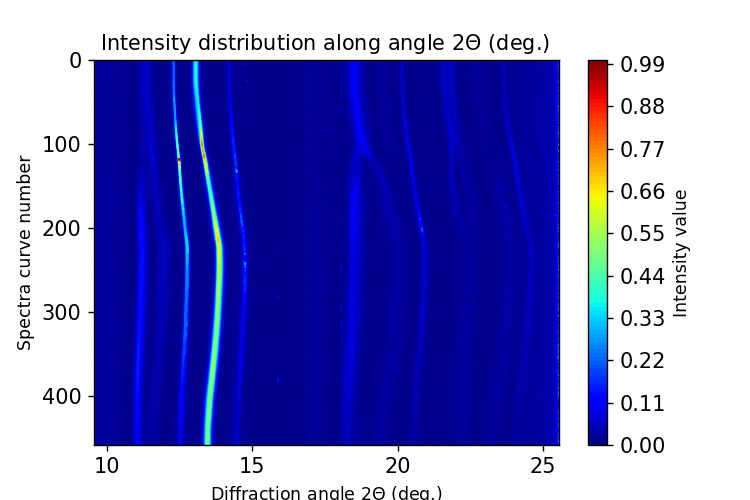

1.0


In [41]:

angle     = np.asarray(theta)
intensity = np.asarray(Icorrect)
print(angle.shape,intensity.shape)
fig, ax = plt.subplots(figsize=(6,4))

H_value   = np.max(intensity)
L_value   = np.min(intensity)
print(H_value)
x_vals    = angle[0] # all the spectral curves have the same x-axis, called the 
y_vals    = np.arange(0,len(angle))
X, Y      = np.meshgrid(x_vals, y_vals)

Z         = intensity
level_n   = 100
cp        = plt.contourf(X, Y, Z,levels=level_n,vmin = L_value, vmax = H_value,cmap=cm.jet)
plt.ylabel('Spectra curve number')
plt.xlabel('Diffraction angle 2$\Theta$ (deg.)')


ax.invert_yaxis()  # labels read top-to-bottom
ax.set_ylim((len(angle)-1), 0)

# ==================method 1===================
# m = plt.cm.ScalarMappable(cmap=cmap_temp)
# m.set_array(Z)
# m.set_clim(L_value, H_value)
# plt.colorbar(m, boundaries=np.linspace(L_value, H_value,level_n+1))
# plt.show()

# m = plt.cm.ScalarMappable(cmap=cmap_temp)
# m.set_array(Z)
# m.set_clim(L_value, H_value)
# plt.colorbar(m)
# plt.show()

# ==================method 4===================
# cbar = fig.colorbar(cp,boundaries=np.linspace(L_value, H_value,level_n+1))
# cbar = fig.colorbar(cp)
# cbar.ax.set_ylabel('Intensity value')
# plt.show()
# cbar.ax.set_yticks(np.arange(L_value,H_value,2))


# ==================method 2===================
# cp.set_clim(L_value, H_value)
# cbar = fig.colorbar(cp)
# cbar.ax.set_ylabel('Intensity value')

# plt.clim(L_value, H_value)
# plt.colorbar()
# plt.show()

# ==================method 3===================
cbar = fig.colorbar(cp)
cbar.ax.set_ylabel('Intensity value')


plt.title('Intensity distribution along angle 2$\Theta$ (deg.) ')
plt.show()

# plt.tight_layout()
# plt.savefig(save_figures_to+"FeO_Pt_FASTcomp spectra intensity distribution.png", bbox_inches='tight', dpi=400)

## =======spectra diffrence distribution, gap = 1======

(458, 4020) (458, 4020)


<IPython.core.display.Javascript object>


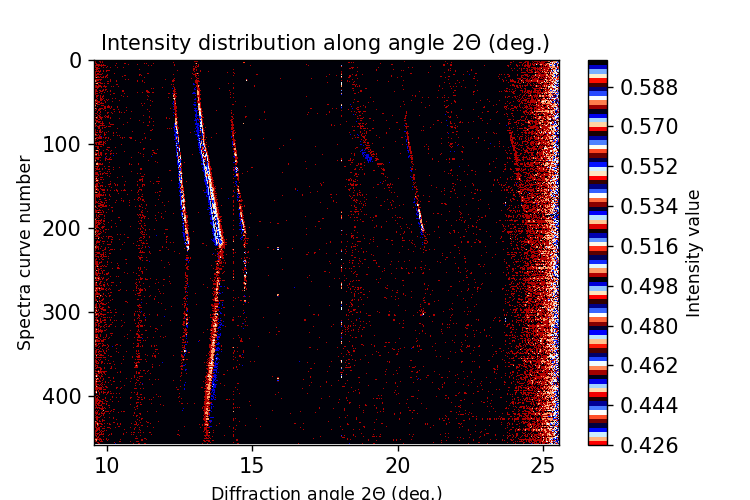

0.5994294635817411 0.42727525290110757


In [42]:

angle     = np.asarray(theta)
intensity = np.asarray(Icorrect)

n_bias = 1
angle_dif = angle[n_bias:-1]
intensity_dif = intensity[n_bias:-1]-intensity[0:-1-n_bias]
# intensity_dif = np.log(intensity[n_bias:-1]-intensity[0:-1-n_bias])
intensity_dif = 1/(1 + np.exp(-intensity_dif))
# intensity_dif = np.log2(intensity_dif)

print(angle_dif.shape,intensity_dif.shape)
fig, ax = plt.subplots(figsize=(6,4))

H_value   = np.max(intensity_dif)
L_value   = np.min(intensity_dif)
print(H_value,L_value)
x_vals    = angle[0] # all the spectral curves have the same x-axis, called the 
y_vals    = np.arange(0,len(intensity_dif))
X, Y      = np.meshgrid(x_vals, y_vals)

Z         = intensity_dif
level_n   = 100
cp        = plt.contourf(X, Y, Z,levels=level_n,vmin = L_value, vmax = H_value,cmap=cm.flag)  #gist_ncar
plt.ylabel('Spectra curve number')
plt.xlabel('Diffraction angle 2$\Theta$ (deg.)')


ax.invert_yaxis()  # labels read top-to-bottom
ax.set_ylim((len(angle)-1), 0)
 
# ==================method 3===================
cbar = fig.colorbar(cp)
cbar.ax.set_ylabel('Intensity value')


plt.title('Intensity distribution along angle 2$\Theta$ (deg.) ')
plt.show()

# plt.tight_layout()
# plt.savefig(save_figures_to+"FeO_Pt_FASTcomp spectra intensity distribution.png", bbox_inches='tight', dpi=400)

<IPython.core.display.Javascript object>


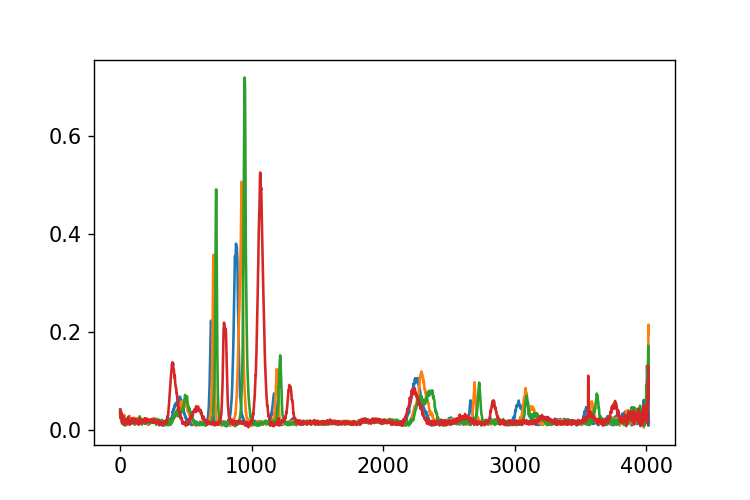

In [43]:
fig, ax = plt.subplots(figsize=(6,4))

plt.plot(Icorrect[0])
plt.plot(Icorrect[80])
plt.plot(Icorrect[110])
plt.plot(Icorrect[310])

In [44]:
type(intensity)

numpy.ndarray

In [45]:
intensity.shape

(460, 4020)

(460, 750) (460, 750)


<IPython.core.display.Javascript object>


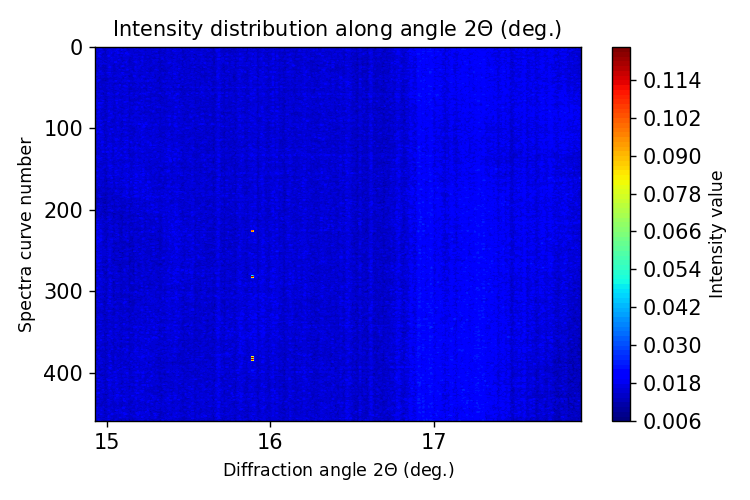

0.12366893975171557


In [46]:
noise_s = 1350
noise_e = 2100
angle_noise     = np.asarray(theta)[:,noise_s:noise_e]
intensity_noise = np.asarray(Icorrect)[:,noise_s:noise_e]

# intensity_noise = np.asarray(Icorrect)[:,noise_s:noise_e]
print(angle_noise.shape,intensity_noise.shape)
fig, ax = plt.subplots(figsize=(6,4))

H_value   = np.max(intensity_noise)
L_value   = np.min(intensity_noise)
print(H_value)
x_vals    = angle_noise[0] # all the spectral curves have the same x-axis, called the 
y_vals    = np.arange(0,len(angle_noise))
X, Y      = np.meshgrid(x_vals, y_vals)

Z         = intensity_noise
level_n   = 100
cp        = plt.contourf(X, Y, Z,levels=level_n,vmin = L_value, vmax = H_value,cmap=cm.jet)
plt.ylabel('Spectra curve number')
plt.xlabel('Diffraction angle 2$\Theta$ (deg.)')


ax.invert_yaxis()  # labels read top-to-bottom
ax.set_ylim((len(angle)-1), 0)

# ==================method 3===================
cbar = fig.colorbar(cp)
cbar.ax.set_ylabel('Intensity value')


plt.title('Intensity distribution along angle 2$\Theta$ (deg.) ')


plt.tight_layout()
# plt.savefig(save_figures_to+"FeO_Pt_FASTcomp spectra intensity distribution.png", bbox_inches='tight', dpi=600)

<IPython.core.display.Javascript object>


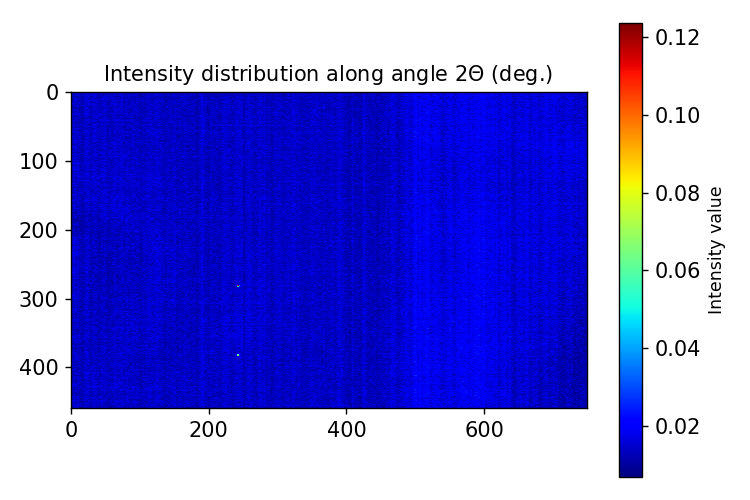

In [47]:
fig, ax = plt.subplots(figsize=(6,4))
im = plt.imshow(Z,cmap=cm.jet)
cbar = fig.colorbar(im)
cbar.ax.set_ylabel('Intensity value')
plt.title('Intensity distribution along angle 2$\Theta$ (deg.) ')
plt.tight_layout()

In [48]:
print(intensity_noise.shape)
intensity_noise = np.repeat(intensity_noise, 3, axis=1)
print(intensity_noise.shape)

(460, 750)
(460, 2250)


In [49]:
intensity.shape

(460, 4020)

In [50]:
np.random.random_sample((2,7))

array([[0.16260605, 0.1387387 , 0.35291695, 0.48449846, 0.69773639,
        0.80115643, 0.26677438],
       [0.90947621, 0.02286695, 0.37512276, 0.19963333, 0.34280523,
        0.4441123 , 0.49813961]])

# Spectra shifting

In [51]:
from scipy.ndimage.interpolation import shift
angle     = np.asarray(theta)
intensity = np.asarray(Icorrect)
Shift_theta = []
Shift_intensity = []
Shift_gap = 100
Shift_bias = 5
### shift right:
for roll_n in range(Shift_bias, int(intensity.shape[1]/2), Shift_gap):
    random_n = np.random.random_sample((intensity.shape[0],intensity.shape[1]))
    new_intensity= intensity[:,0:intensity.shape[1]-roll_n]
#     print('cropped intensity:',new_intensity.shape)
    mask = intensity_noise[:,np.random.randint(2000, size=roll_n)]  #np.random.choice(intensity_noise, roll_n, replace=False)
    new_intensity = np.concatenate((mask,new_intensity ), axis=1) +random_n/6
#     print('new_intensity:',new_intensity.shape)
    Shift_intensity.append(new_intensity) # attaches a new array each time to a copy of previous, not really necessary here
    Shift_theta.append(angle)

### shift left:    
angle     = np.asarray(theta)
intensity = np.asarray(Icorrect)
for roll_n in range(Shift_bias, int(intensity.shape[1]/2), Shift_gap):
    
    random_n = np.random.random_sample((intensity.shape[0],intensity.shape[1]))
    new_intensity= intensity[:,roll_n:intensity.shape[1]] 
#     print('cropped intensity:',new_intensity.shape)
    mask = intensity_noise[:,np.random.randint(2000, size=roll_n)]  #np.random.choice(intensity_noise, roll_n, replace=False)
    new_intensity = np.concatenate((new_intensity, mask), axis=1) +random_n/6
#     print('new_intensity:',new_intensity.shape)
    Shift_intensity.append(new_intensity) # attaches a new array each time to a copy of previous, not really necessary here
    Shift_theta.append(angle)
    
Shift_theta     = np.asarray(Shift_theta)
Shift_intensity = np.asarray(Shift_intensity)

<IPython.core.display.Javascript object>


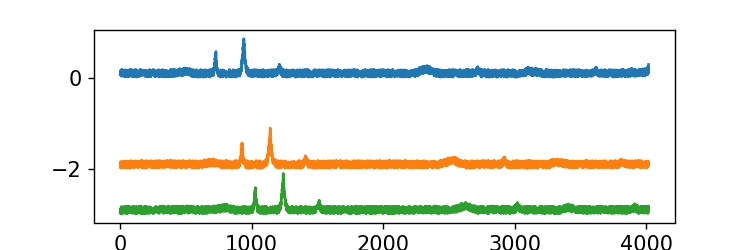

In [52]:
fig, ax = plt.subplots(figsize=(6,2))
plt.plot(Shift_intensity[0,100,:]-0)
plt.plot(Shift_intensity[2,100,:]-2)
plt.plot(Shift_intensity[3,100,:]-3)

In [53]:
Shift_theta.shape

(42, 460, 4020)

(460, 4020) (460, 4020)


<IPython.core.display.Javascript object>


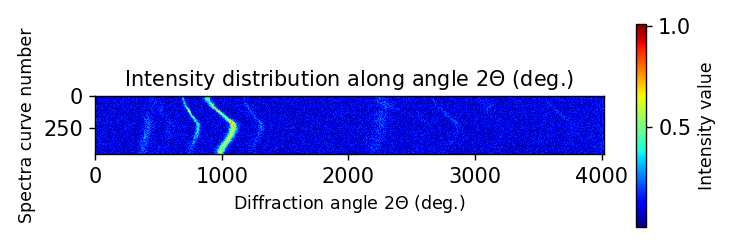

(460, 4020) (460, 4020)


<IPython.core.display.Javascript object>


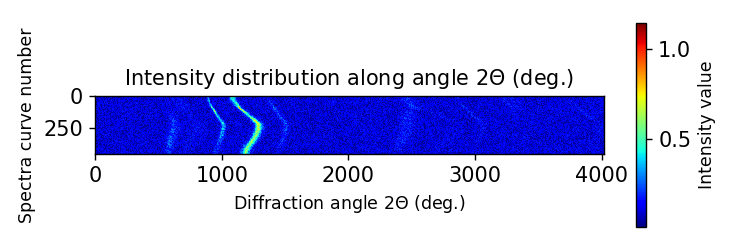

(460, 4020) (460, 4020)


<IPython.core.display.Javascript object>


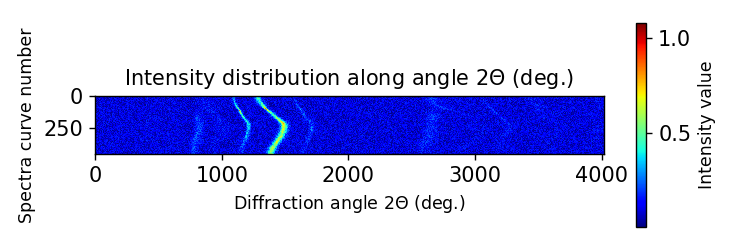

(460, 4020) (460, 4020)


<IPython.core.display.Javascript object>


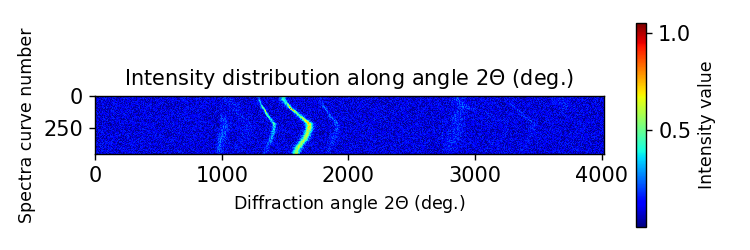

(460, 4020) (460, 4020)


<IPython.core.display.Javascript object>


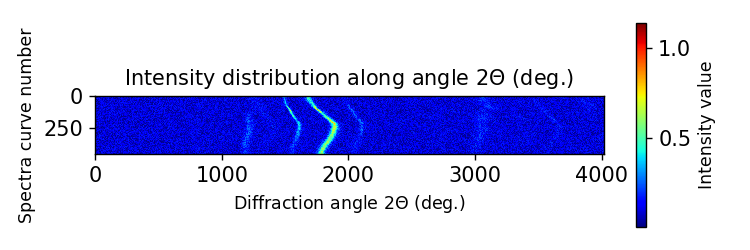

(460, 4020) (460, 4020)


<IPython.core.display.Javascript object>


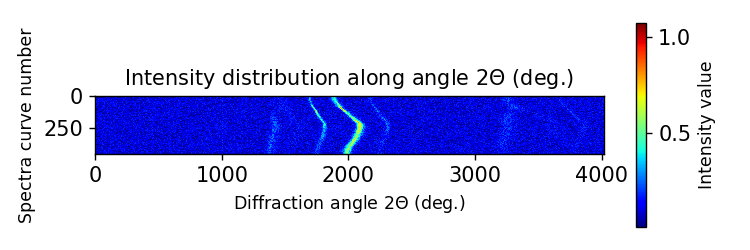

(460, 4020) (460, 4020)


<IPython.core.display.Javascript object>


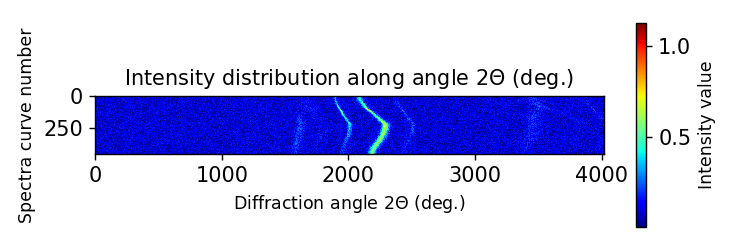

(460, 4020) (460, 4020)


<IPython.core.display.Javascript object>


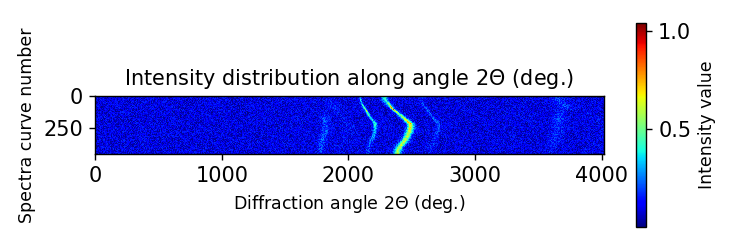

(460, 4020) (460, 4020)


<IPython.core.display.Javascript object>


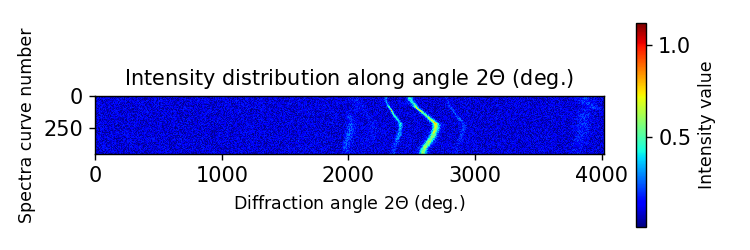

(460, 4020) (460, 4020)


<IPython.core.display.Javascript object>


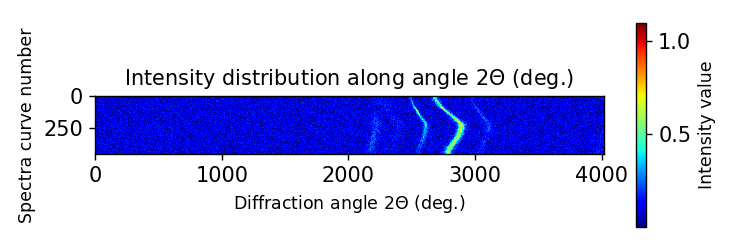

(460, 4020) (460, 4020)


<IPython.core.display.Javascript object>


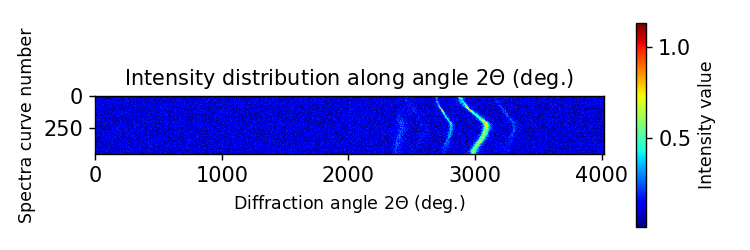

(460, 4020) (460, 4020)


<IPython.core.display.Javascript object>


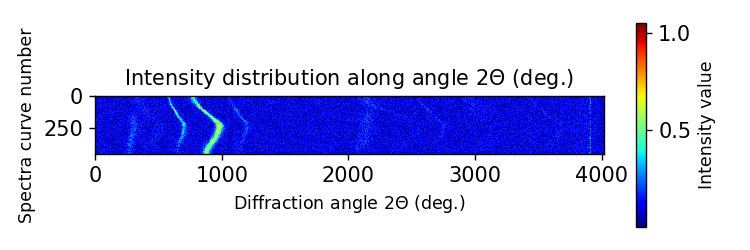

(460, 4020) (460, 4020)


<IPython.core.display.Javascript object>


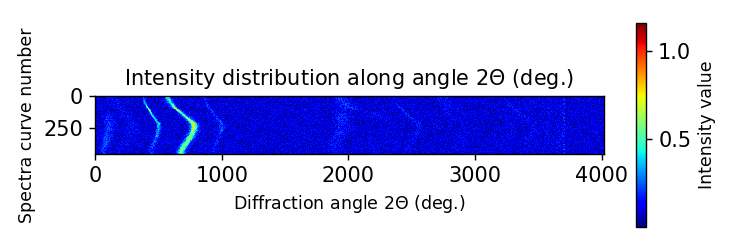

(460, 4020) (460, 4020)


<IPython.core.display.Javascript object>


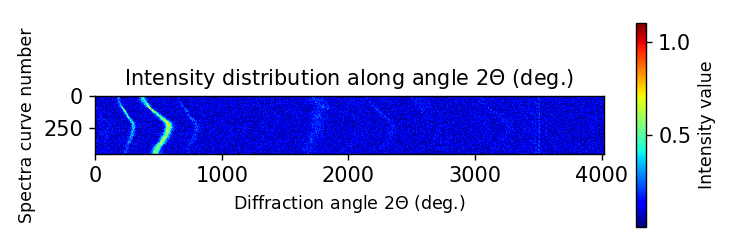

(460, 4020) (460, 4020)


<IPython.core.display.Javascript object>


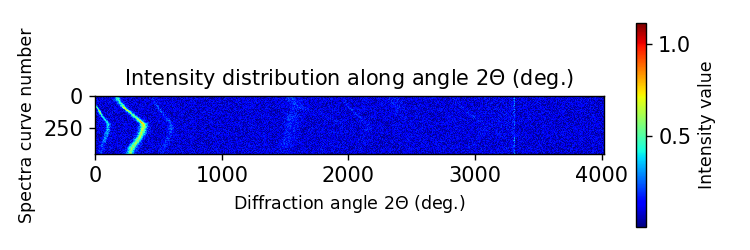

(460, 4020) (460, 4020)


<IPython.core.display.Javascript object>


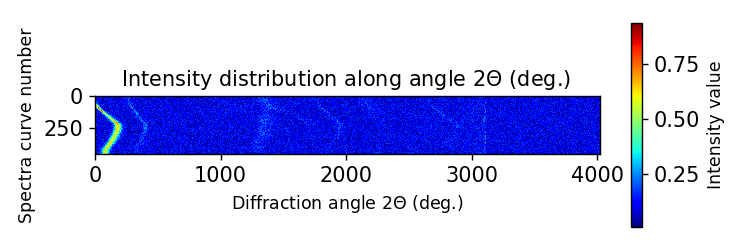

(460, 4020) (460, 4020)


<IPython.core.display.Javascript object>


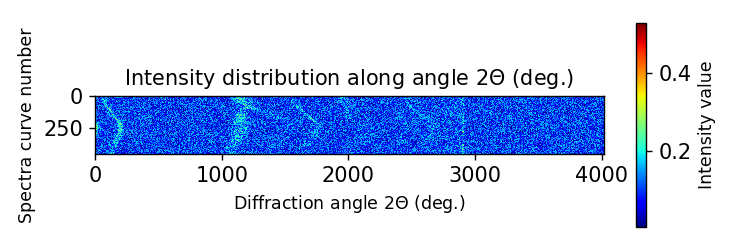

(460, 4020) (460, 4020)


<IPython.core.display.Javascript object>


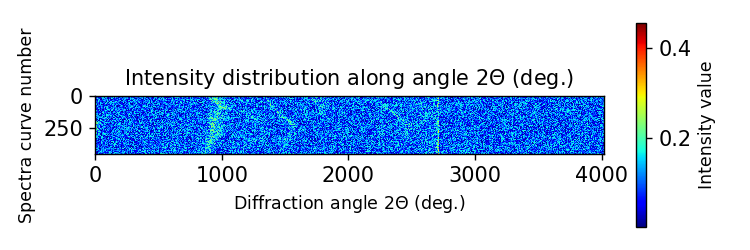

(460, 4020) (460, 4020)


<IPython.core.display.Javascript object>


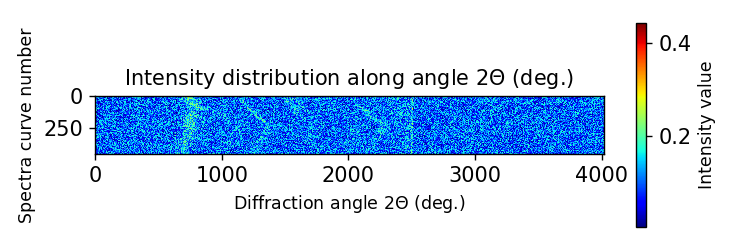

(460, 4020) (460, 4020)


<IPython.core.display.Javascript object>


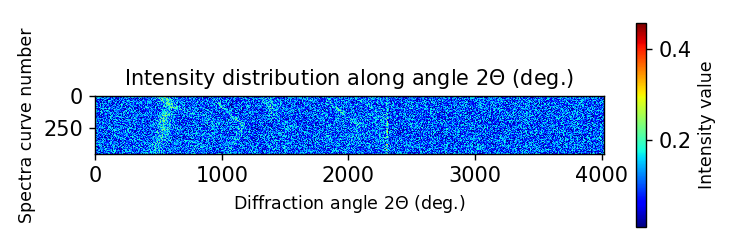

(460, 4020) (460, 4020)


<IPython.core.display.Javascript object>


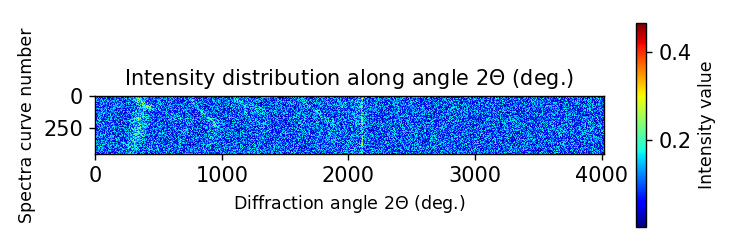

In [54]:
for n in range(0,Shift_theta.shape[0],2):
    
    angle     = Shift_theta[n]
    intensity = Shift_intensity[n]
    print(angle.shape,intensity.shape)
    fig, ax = plt.subplots(figsize=(6,2))

    x_vals    = angle[0] # all the spectral curves have the same x-axis, called the 
    y_vals    = np.arange(0,len(angle))
    X, Y      = np.meshgrid(x_vals, y_vals)

    Z         = intensity
    level_n   = 100
    cp        = plt.imshow(Z,cmap=cm.jet)
    plt.ylabel('Spectra curve number')
    plt.xlabel('Diffraction angle 2$\Theta$ (deg.)')


    # ==================method 3===================
    im = plt.imshow(Z,cmap=cm.jet)
    cbar = fig.colorbar(im)
    cbar.ax.set_ylabel('Intensity value')
    plt.title('Intensity distribution along angle 2$\Theta$ (deg.) ')
    plt.tight_layout()

<IPython.core.display.Javascript object>


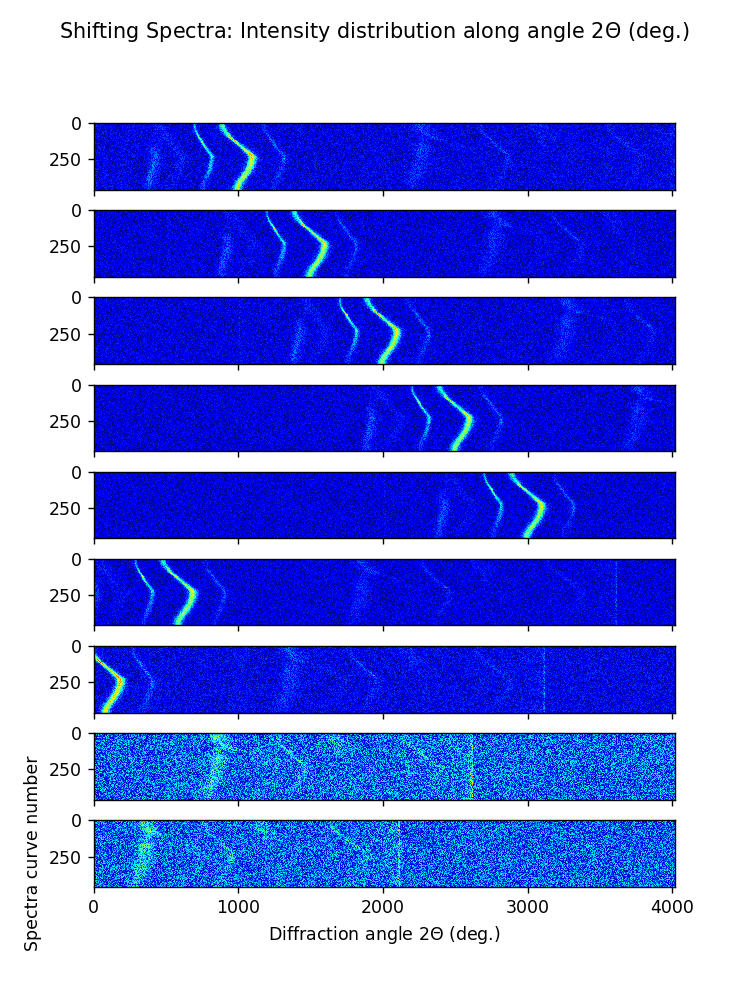

9
(460, 4020) (460, 4020)
(460, 4020) (460, 4020)
(460, 4020) (460, 4020)
(460, 4020) (460, 4020)
(460, 4020) (460, 4020)
(460, 4020) (460, 4020)
(460, 4020) (460, 4020)
(460, 4020) (460, 4020)
(460, 4020) (460, 4020)


Text(0.5, 0.98, 'Shifting Spectra: Intensity distribution along angle 2$\\Theta$ (deg.) ')

In [55]:
n_gap = 5

fig, axs = plt.subplots(len(range(0,Shift_theta.shape[0],n_gap)), sharex=True, sharey=True,figsize=(6,8))  #  sharex=True
print(len(range(0,Shift_theta.shape[0],n_gap)))

n_img = 0 
for n in range(0,Shift_theta.shape[0],n_gap):

    angle     = Shift_theta[n]
    intensity = Shift_intensity[n]
    print(angle.shape,intensity.shape)

    x_vals    = angle[0] # all the spectral curves have the same x-axis, called the 
    y_vals    = np.arange(0,len(angle))
    X, Y      = np.meshgrid(x_vals, y_vals)

    Z         = intensity
    level_n   = 100
  
    axs[n_img].imshow(Z,cmap=cm.jet)
    axs[n_img].invert_yaxis()  # labels read top-to-bottom
    axs[n_img].set_ylim((len(angle)-1), 0)
    for tick in axs[n_img].yaxis.get_major_ticks():
        tick.label.set_fontsize(10) 
    for tick in axs[n_img].xaxis.get_major_ticks():
        tick.label.set_fontsize(10) 

    n_img = n_img +1


plt.ylabel('Spectra curve number')
plt.xlabel('Diffraction angle 2$\Theta$ (deg.)')
plt.suptitle('Shifting Spectra: Intensity distribution along angle 2$\Theta$ (deg.) ')

# plt.savefig(save_figures_to+"Shifting Spectra.png", bbox_inches='tight', dpi=400)
# plt.yticks(fontsize=12)
# plt.xticks(fontsize=12)

# plt.tight_layout()

# Spectra rolling

In [56]:
angle     = np.asarray(theta)
intensity = np.asarray(Icorrect)
Roll_theta = []
Roll_intensity = []
Roll_gap = 100
Roll_bias = 5
for roll_n in range(Roll_bias, intensity.shape[1], Roll_gap):
    new_intensity= np.roll(intensity, roll_n)
    Roll_intensity.append(new_intensity) # attaches a new array each time to a copy of previous, not really necessary here
    Roll_theta.append(angle)

Roll_theta     = np.asarray(Roll_theta)
Roll_intensity = np.asarray(Roll_intensity)

In [57]:
Roll_theta.shape

(41, 460, 4020)

(460, 4020) (460, 4020)


<IPython.core.display.Javascript object>


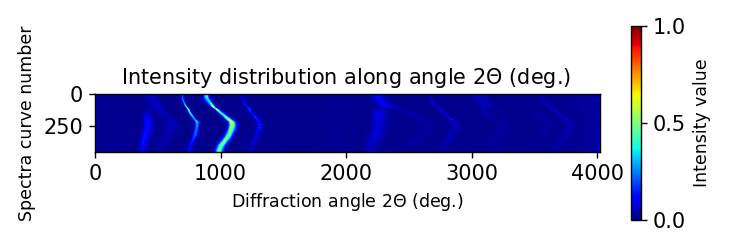

1.0
(460, 4020) (460, 4020)


<IPython.core.display.Javascript object>


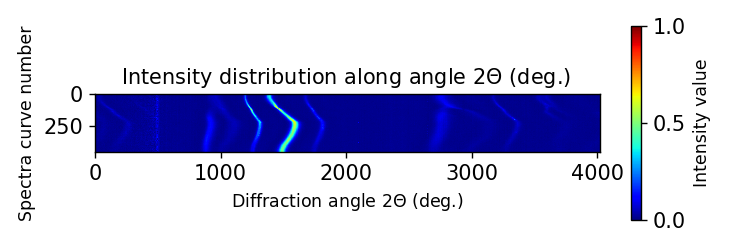

1.0
(460, 4020) (460, 4020)


<IPython.core.display.Javascript object>


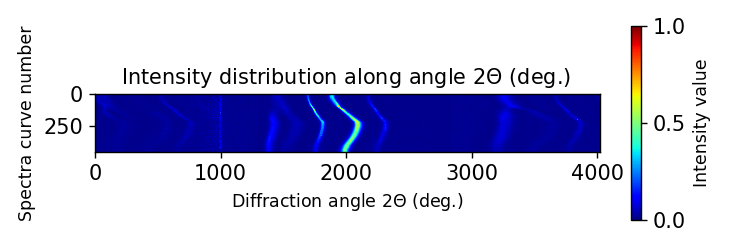

1.0
(460, 4020) (460, 4020)


<IPython.core.display.Javascript object>


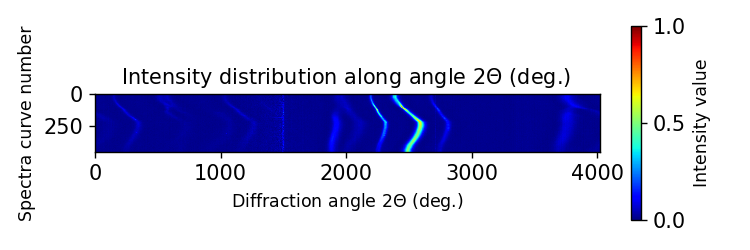

1.0
(460, 4020) (460, 4020)


<IPython.core.display.Javascript object>


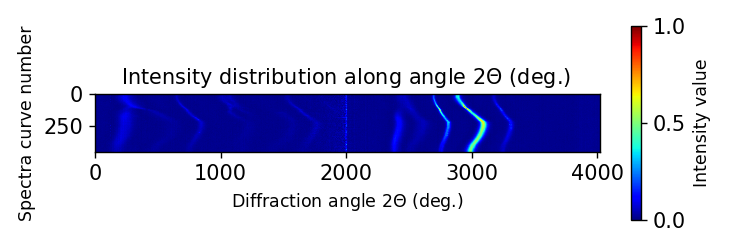

1.0
(460, 4020) (460, 4020)


<IPython.core.display.Javascript object>


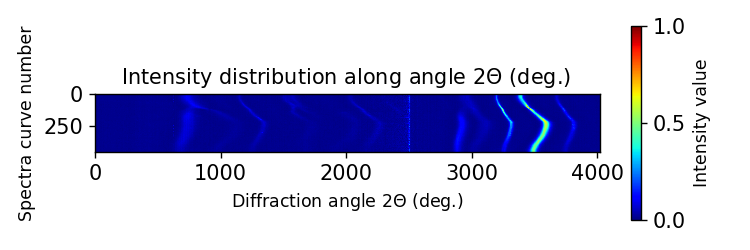

1.0
(460, 4020) (460, 4020)


<IPython.core.display.Javascript object>


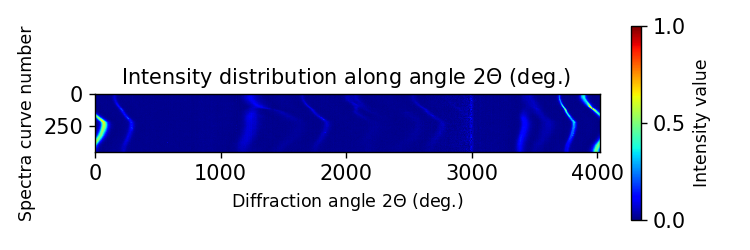

1.0
(460, 4020) (460, 4020)


<IPython.core.display.Javascript object>


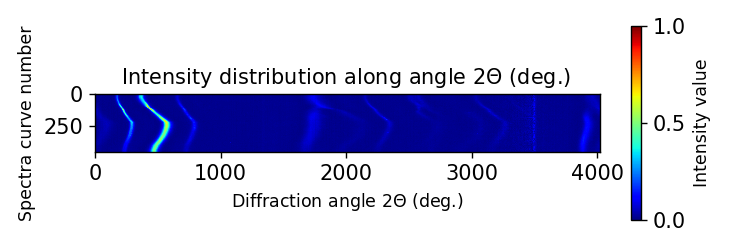

1.0
(460, 4020) (460, 4020)


<IPython.core.display.Javascript object>


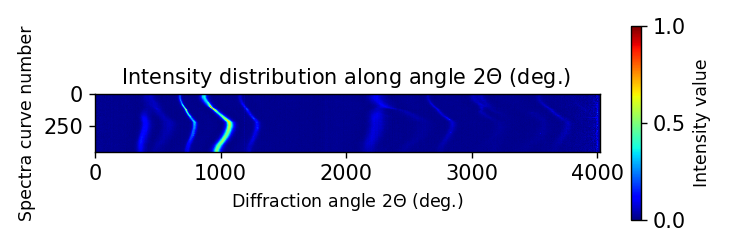

1.0


In [58]:
for n in range(0,Roll_theta.shape[0],5):
    
    angle     = Roll_theta[n]
    intensity = Roll_intensity[n]
    print(angle.shape,intensity.shape)
    fig, ax = plt.subplots(figsize=(6,2))

    H_value   = np.max(intensity)
    L_value   = np.min(intensity)
    print(H_value)
    x_vals    = angle[0] # all the spectral curves have the same x-axis, called the 
    y_vals    = np.arange(0,len(angle))
    X, Y      = np.meshgrid(x_vals, y_vals)

    Z         = intensity
    level_n   = 100
#     cp        = plt.contourf(X, Y, Z,levels=level_n,vmin = L_value, vmax = H_value,cmap=cm.jet)
    cp        = plt.imshow(Z,cmap=cm.jet)
    plt.ylabel('Spectra curve number')
    plt.xlabel('Diffraction angle 2$\Theta$ (deg.)')


    ax.invert_yaxis()  # labels read top-to-bottom
    ax.set_ylim((len(angle)-1), 0)

    # ==================method 3===================
    cbar = fig.colorbar(cp)
    cbar.ax.set_ylabel('Intensity value')


    plt.title('Intensity distribution along angle 2$\Theta$ (deg.) ')


    plt.tight_layout()

<IPython.core.display.Javascript object>


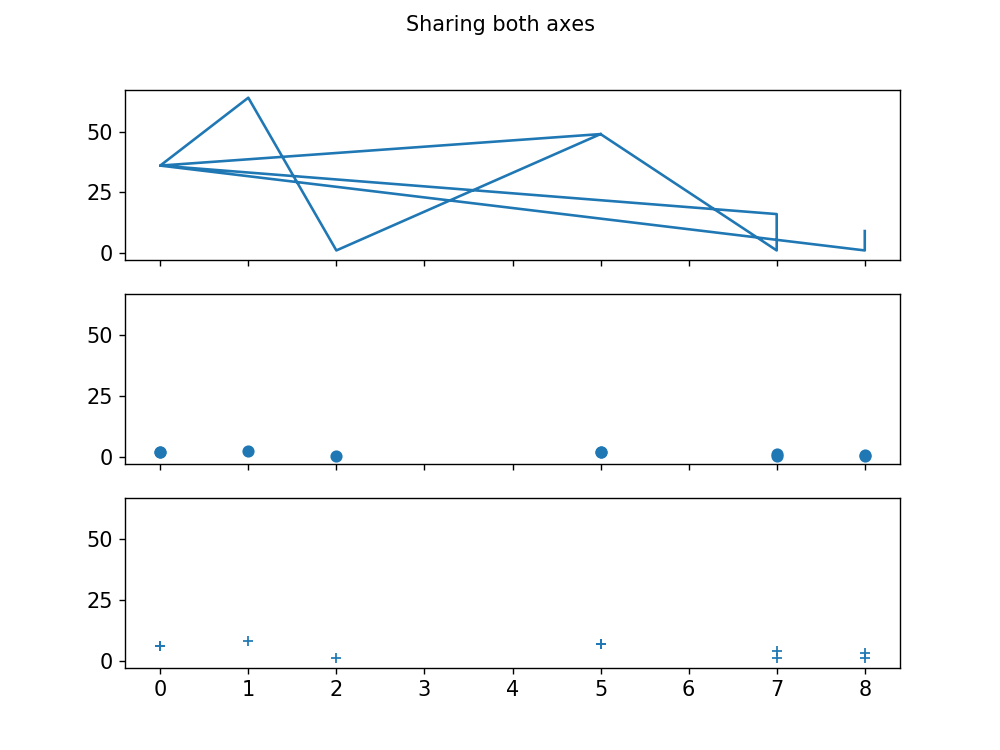

In [59]:
fig, axs = plt.subplots(3, sharex=True, sharey=True)
fig.suptitle('Sharing both axes')
x = np.random.randint(9, size=10)
y = np.random.randint(9, size=10)
axs[0].plot(x, y ** 2)
axs[1].plot(x, 0.3 * y, 'o')
axs[2].plot(x, y, '+')

In [60]:
len(range(0,Roll_theta.shape[0],5))

9

<IPython.core.display.Javascript object>


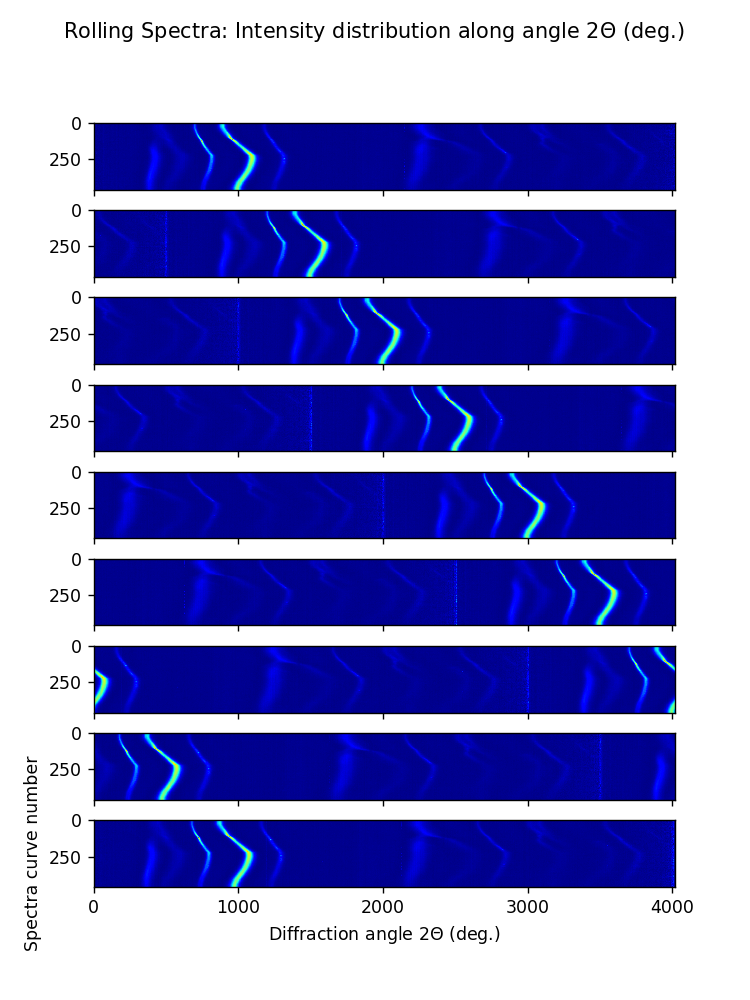

9
(460, 4020) (460, 4020)
1.0
(460, 4020) (460, 4020)
1.0
(460, 4020) (460, 4020)
1.0
(460, 4020) (460, 4020)
1.0
(460, 4020) (460, 4020)
1.0
(460, 4020) (460, 4020)
1.0
(460, 4020) (460, 4020)
1.0
(460, 4020) (460, 4020)
1.0
(460, 4020) (460, 4020)
1.0


Text(0.5, 0.98, 'Rolling Spectra: Intensity distribution along angle 2$\\Theta$ (deg.) ')

In [61]:
n_gap = 5

fig, axs = plt.subplots(len(range(0,Roll_theta.shape[0],n_gap)), sharex=True, sharey=True,figsize=(6,8))  #  sharex=True

print(len(range(0,Roll_theta.shape[0],n_gap)))

n_img = 0    
for n in range(0,Roll_theta.shape[0],n_gap):
#     print(n_img)
    angle     = Roll_theta[n]
    intensity = Roll_intensity[n]
    print(angle.shape,intensity.shape)

    H_value   = np.max(intensity)
    L_value   = np.min(intensity)
    print(H_value)
    x_vals    = angle[0] # all the spectral curves have the same x-axis, called the 
    y_vals    = np.arange(0,len(angle))
    X, Y      = np.meshgrid(x_vals, y_vals)

    Z         = intensity
    level_n   = 100

    axs[n_img].imshow(Z,cmap=cm.jet)
    axs[n_img].invert_yaxis()  # labels read top-to-bottom
    axs[n_img].set_ylim((len(angle)-1), 0)
    for tick in axs[n_img].yaxis.get_major_ticks():
        tick.label.set_fontsize(10) 
    for tick in axs[n_img].xaxis.get_major_ticks():
        tick.label.set_fontsize(10) 

    n_img = n_img +1
    

plt.ylabel('Spectra curve number')
plt.xlabel('Diffraction angle 2$\Theta$ (deg.)')
plt.suptitle('Rolling Spectra: Intensity distribution along angle 2$\Theta$ (deg.) ')
# plt.savefig(save_figures_to+"Rolling Spectra.png", bbox_inches='tight', dpi=400)
# plt.yticks(fontsize=12)
# plt.xticks(fontsize=12)


        
# plt.tight_layout()

# Spectra slicing and interpolate

In [62]:

def rotation_s(x, plot=False):
    flip = np.random.choice([-1], size=(1, x.shape[1]))
    rotate_axis = np.arange(x.shape[1])
    np.random.shuffle(rotate_axis)
    x_ = flip[:, :] * x[:, rotate_axis]
    if plot:
        hlp.plot1d(x, x_, save_file='aug_examples/rotation_s.png')
    return x_


def scaling_s(x, sigma=0.1, plot=False):
    # https://arxiv.org/pdf/1706.00527.pdf
    factor = np.random.normal(loc=1., scale=sigma, size=(1, x.shape[1]))
    x_ = np.multiply(x, factor[:, :])

    if plot:
        hlp.plot1d(x, x_, save_file='aug_examples/scal.png')

    return x_

###############


def window_slice_s(x, reduce_ratio=0.9):
    # https://halshs.archives-ouvertes.fr/halshs-01357973/document
    target_len = np.ceil(reduce_ratio * x.shape[1]).astype(int)
    print(target_len)
    if target_len >= x.shape[1]:
        return x
    starts = np.random.randint(low=0, high=x.shape[1] - target_len, size=(1)).astype(int)
    ends = (target_len + starts).astype(int)
    print(starts,ends)

    ret = np.zeros_like(x)
    for dim in range(x.shape[0]):
        ret[dim, :] = np.interp(np.linspace(0, target_len, num=x.shape[1]), np.arange(target_len),
                                   x[ dim, starts[0]:ends[0]])
    return ret

def window_warp_s(x, window_ratio=0.1, scales=[0.5, 2.]):
    # https://halshs.archives-ouvertes.fr/halshs-01357973/document
    warp_scales = np.random.choice(scales, 1)
    warp_size = np.ceil(window_ratio * x.shape[0]).astype(int)
    window_steps = np.arange(warp_size)

    window_starts = np.random.randint(low=1, high=x.shape[0] - warp_size - 1, size=(1)).astype(int)
    window_ends = (window_starts + warp_size).astype(int)

    ret = np.zeros_like(x)
    pat=x
    
#     print('pat',pat.shape)
    for dim in range(x.shape[1]):
        start_seg = pat[:window_starts[0], dim]
#         print('start_seg',start_seg.shape)
        window_seg = np.interp(np.linspace(0, warp_size - 1,
                                           num=int(warp_size * warp_scales[0])), window_steps,
                               pat[window_starts[0]:window_ends[0], dim])
#         print('window_seg',window_seg.shape)
        end_seg = pat[window_ends[0]:, dim]
#         print('end_seg',end_seg.shape)
        warped = np.concatenate((start_seg, window_seg, end_seg))
#         print('warped',warped.shape)
#         print('test',np.linspace(0, x.shape[0] - 1., num=warped.size).shape)
        ret[:, dim] = np.interp(np.arange(x.shape[0]), np.linspace(0, x.shape[0] - 1., num=warped.size),
                                   warped).T
    return ret.transpose()

In [63]:
scales=[0.5, 2.,1.6]
warp_scales = np.random.choice(scales, 1)
print(warp_scales)

[2.]


(460, 4020)


<IPython.core.display.Javascript object>


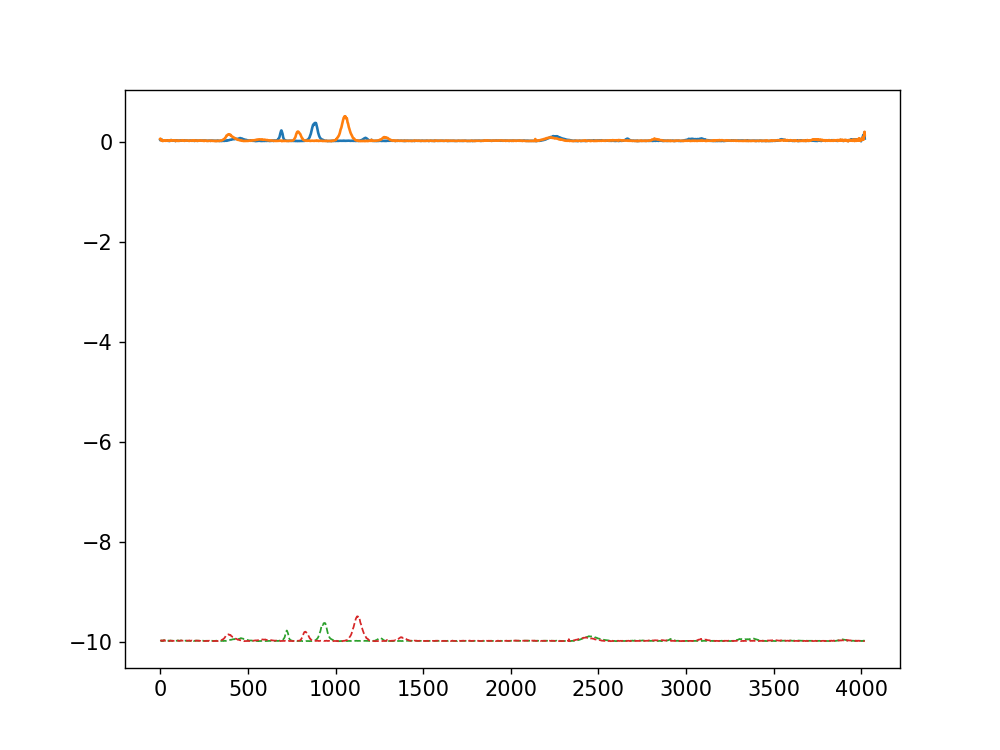

(4020, 2)
3618
[41] [3659]
(2, 4020)


<IPython.core.display.Javascript object>


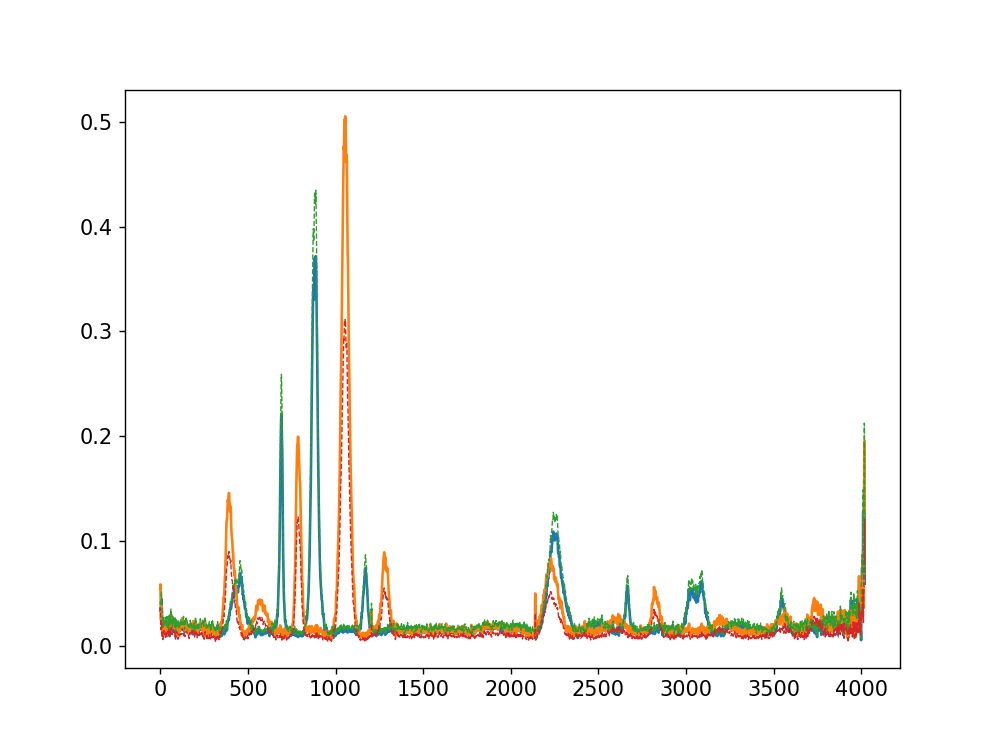

(4020, 2)


<IPython.core.display.Javascript object>


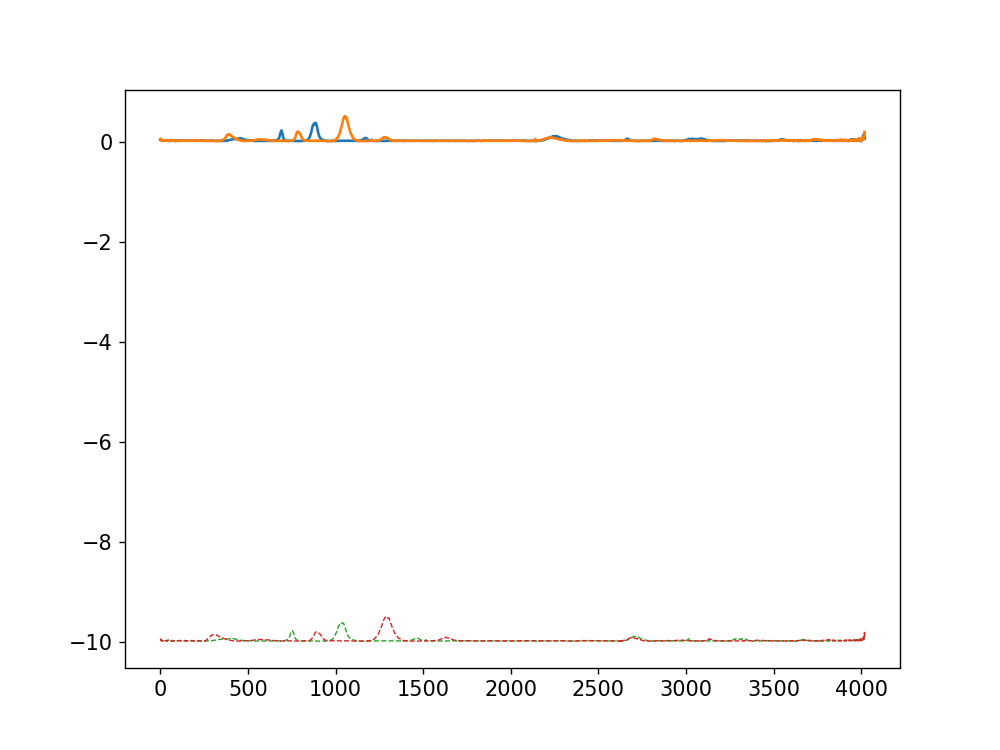

(2, 4020)


In [64]:
angle     = np.asarray(theta)
intensity = np.asarray(Icorrect)

print(intensity.shape)
fig, ax = plt.subplots(figsize=(8,6))

tt = intensity[(2,333),:].transpose()
plt.plot(tt)
print(tt.shape)

#### window slicing:
trsf_da = window_slice_s(tt.transpose(), reduce_ratio=0.9)
print(trsf_da.shape)
plt.plot(trsf_da[0]-10,linestyle='dashed',
     linewidth=1,)
plt.plot(trsf_da[1]-10,linestyle='dashed',
     linewidth=1,)

#### scaling:
fig, ax = plt.subplots(figsize=(8,6))
plt.plot(tt)
trsf_da = scaling_s(tt, sigma=0.5)
print(trsf_da.shape)
plt.plot(trsf_da,linestyle='dashed', linewidth = 0.8)


#### window_warp_s:
fig, ax = plt.subplots(figsize=(8,6))
plt.plot(tt)
trsf_da = window_warp_s(tt, window_ratio=0.35, scales=[0.5, 2.])
print(trsf_da.shape)
plt.plot(trsf_da.transpose()-10,linestyle='dashed', linewidth = 0.8)

In [65]:
angle     = np.asarray(theta)
intensity = np.asarray(Icorrect)
Slice_theta = []
Slice_intensity = []

# Slice_s = 0.8
# Slice_e = 0.96
# #Slice_gap = 0.05

# num = 20

for Slice_n in np.linspace(Slice_s, Slice_e, num = num):
    print(Slice_n)
    new_intensity= window_slice_s(intensity, reduce_ratio = Slice_n)
    Slice_intensity.append(new_intensity) # attaches a new array each time to a copy of previous, not really necessary here
    Slice_theta.append(angle)

Slice_theta     = np.asarray(Slice_theta)
Slice_intensity = np.asarray(Slice_intensity)

1.0
4020


In [66]:
angle     = np.asarray(theta)
intensity = np.asarray(Icorrect)
Warp_theta = []
Warp_intensity = []

Warp_s = 0.05
Warp_e = 0.35
#Warp_gap = 0.05

for Warp_n in np.linspace(Warp_s, Warp_e, num = 10):
    print(Warp_n)
    new_intensity= window_warp_s(intensity.transpose(), window_ratio = Warp_n, scales=[0.5, 2.])
    Warp_intensity.append(new_intensity) # attaches a new array each time to a copy of previous, not really necessary here
    Warp_theta.append(angle)

Warp_theta     = np.asarray(Warp_theta)
Warp_intensity = np.asarray(Warp_intensity)

0.05
0.08333333333333334
0.11666666666666667
0.15000000000000002
0.18333333333333335
0.21666666666666667
0.25
0.2833333333333333
0.31666666666666665
0.35


<IPython.core.display.Javascript object>


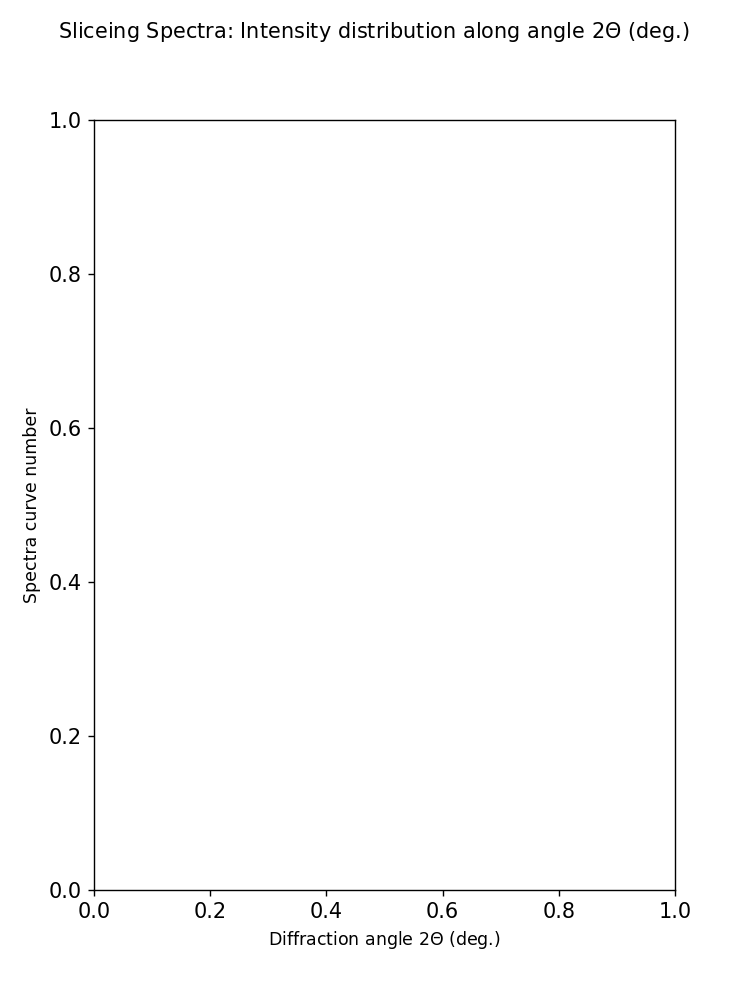

1
(460, 4020) (460, 4020)
1.0


Text(0.5, 0.98, 'Sliceing Spectra: Intensity distribution along angle 2$\\Theta$ (deg.) ')

In [67]:
n_gap = 1

fig, axs = plt.subplots(len(range(0,Slice_theta.shape[0],n_gap)), sharex=True, sharey=True,figsize=(6,8))  #  sharex=True

print(len(range(0,Slice_theta.shape[0],n_gap)))

n_img = 0    
for n in range(0,Slice_theta.shape[0],n_gap):
#     print(n_img)
    angle     = Slice_theta[n]
    intensity = Slice_intensity[n]
    print(angle.shape,intensity.shape)

    H_value   = np.max(intensity)
    L_value   = np.min(intensity)
    print(H_value)
    x_vals    = angle[0] # all the spectral curves have the same x-axis, called the 
    y_vals    = np.arange(0,len(angle))
    X, Y      = np.meshgrid(x_vals, y_vals)

    Z         = intensity
    level_n   = 100

#     axs[n_img].imshow(Z,cmap=cm.jet)
#     axs[n_img].invert_yaxis()  # labels read top-to-bottom
#     axs[n_img].set_ylim((len(angle)-1), 0)
#     for tick in axs[n_img].yaxis.get_major_ticks():
#         tick.label.set_fontsize(10) 
#     for tick in axs[n_img].xaxis.get_major_ticks():
#         tick.label.set_fontsize(10) 

    n_img = n_img +1
    

plt.ylabel('Spectra curve number')
plt.xlabel('Diffraction angle 2$\Theta$ (deg.)')
plt.suptitle('Sliceing Spectra: Intensity distribution along angle 2$\Theta$ (deg.) ')
# plt.savefig(save_figures_to+"Sliceing Spectra.png", bbox_inches='tight', dpi=400)
# plt.yticks(fontsize=12)
# plt.xticks(fontsize=12)


        
# plt.tight_layout()

<IPython.core.display.Javascript object>


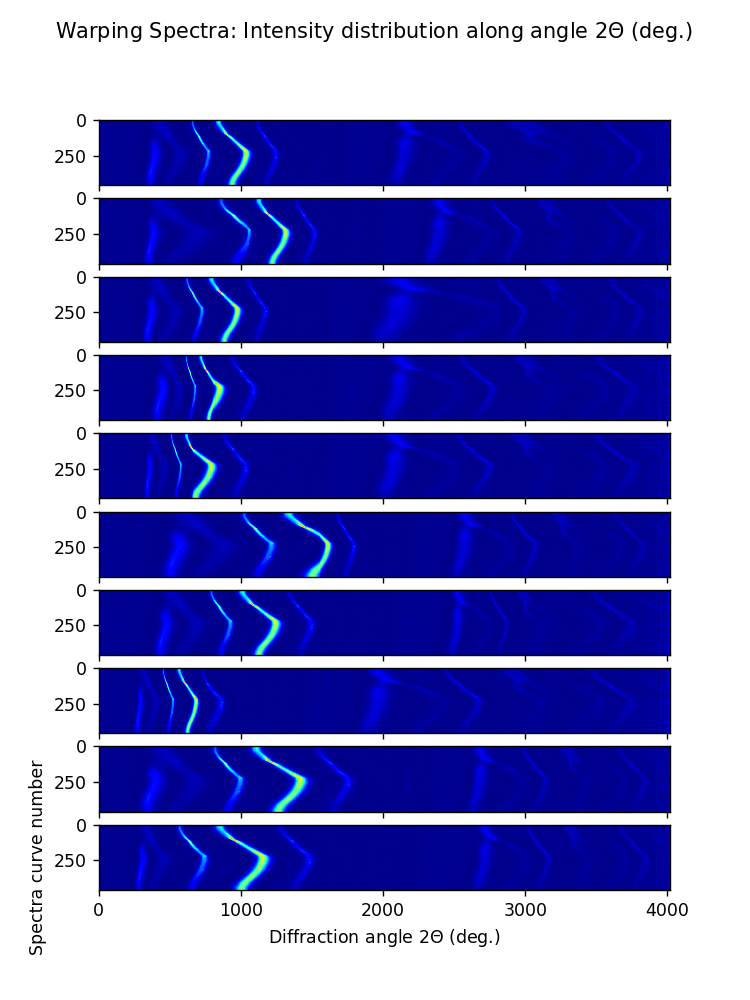

10
(460, 4020) (460, 4020)
0.9975676127383347
(460, 4020) (460, 4020)
0.9949401353132443
(460, 4020) (460, 4020)
0.9995714100248329
(460, 4020) (460, 4020)
0.9657320944088457
(460, 4020) (460, 4020)
0.9711223714634756
(460, 4020) (460, 4020)
0.9905893046050929
(460, 4020) (460, 4020)
0.9889512844063951
(460, 4020) (460, 4020)
0.9718844531188285
(460, 4020) (460, 4020)
0.9888372864862932
(460, 4020) (460, 4020)
0.9917432407937814


Text(0.5, 0.98, 'Warping Spectra: Intensity distribution along angle 2$\\Theta$ (deg.) ')

In [68]:
n_gap = 1

fig, axs = plt.subplots(len(range(0,Warp_theta.shape[0],n_gap)), sharex=True, sharey=True,figsize=(6,8))  #  sharex=True

print(len(range(0,Warp_theta.shape[0],n_gap)))

n_img = 0    
for n in range(0,Warp_theta.shape[0],n_gap):
#     print(n_img)
    angle     = Warp_theta[n]
    intensity = Warp_intensity[n]
    print(angle.shape,intensity.shape)

    H_value   = np.max(intensity)
    L_value   = np.min(intensity)
    print(H_value)
    x_vals    = angle[0] # all the spectral curves have the same x-axis, called the 
    y_vals    = np.arange(0,len(angle))
    X, Y      = np.meshgrid(x_vals, y_vals)

    Z         = intensity
    level_n   = 100

    axs[n_img].imshow(Z,cmap=cm.jet)
    axs[n_img].invert_yaxis()  # labels read top-to-bottom
    axs[n_img].set_ylim((len(angle)-1), 0)
    for tick in axs[n_img].yaxis.get_major_ticks():
        tick.label.set_fontsize(10) 
    for tick in axs[n_img].xaxis.get_major_ticks():
        tick.label.set_fontsize(10) 

    n_img = n_img +1
    

plt.ylabel('Spectra curve number')
plt.xlabel('Diffraction angle 2$\Theta$ (deg.)')
plt.suptitle('Warping Spectra: Intensity distribution along angle 2$\Theta$ (deg.) ')
# plt.savefig(save_figures_to+"Warping Spectra.png", bbox_inches='tight', dpi=400)
# plt.yticks(fontsize=12)
# plt.xticks(fontsize=12)


        
# plt.tight_layout()

# ===Fastcomp===FeO_Pt_FastcComp_LAMBDA2_XY

In [69]:
# show the number of XYfiles found in the directory
# show the number of XYfiles found in the directory
run_no = 0
fdir = '/gpfs/exfel/data/user/sunyue/Downloads/FeO_Pt_fastcomp_LAMBDA2_XY/FeO_Pt_fastcomp_LAMBDA2_XY/'
total_XYfiles = get_number_XYfiles(run_no , fdir)
print(total_XYfiles)
# total_XYfiles=350 #[Pt=1084, MgFeOB1_263]
print('The number of XYfiles within the chosen run is:', total_XYfiles)
%pwd

225
The number of XYfiles within the chosen run is: 225


'/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/SelfTime'

In [70]:
%pwd

'/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/SelfTime'

In [71]:
'''make sure that you have the right command directory selected'''
%cd /gpfs/exfel/data/user/sunyue/Downloads/FeO_Pt_fastcomp_LAMBDA2_XY/FeO_Pt_fastcomp_LAMBDA2_XY/

I = []
baseline = []
Icorrect_fast = []
theta_fast = [] 

test_y=total_XYfiles-2
for run_no in range(1,0+test_y):
    fileNO = str(run_no).zfill(4) 
    fname = 'l2_feo_pt_ramp_00001_m1_'+str(run_no).zfill(3)+'.xy'
    thetas, Is = np.loadtxt(fname, skiprows=25, unpack=True) # reads all files in range and assigns 1st column to thetas and 2nd to Is
    I.append(Is) # attaches a new array each time to a copy of previous, not really necessary here
    idx1 = 0
    idx2 = 4020
#background subtraction
#parameters lam and p have to be adjusted by hand!
#try 10**2 < lam < 10**9
#    0.001 <  p  < 0.1
    lam = 100000
    p = 0.002
    baselines = baseline_als(Is[idx1:idx2], lam, p)
    baseline.append(baselines)
    Icorrected = Is[idx1:idx2] - baselines
    Icorrect_fast.append(Icorrected)
#    if (run_no==15): 
#        print(thetas.size, Is.shape,type(I),np.shape(I),len(Icorrected),len(baselines),sep='\n')
    thetas = thetas[idx1:idx2]
    theta_fast.append(thetas)

/gpfs/exfel/data/user/sunyue/Downloads/FeO_Pt_fastcomp_LAMBDA2_XY/FeO_Pt_fastcomp_LAMBDA2_XY


In [72]:
y_fast_tmp = temp_label(len(Icorrect_fast),typeC)
print(y_fast_tmp,y_fast_tmp.shape)

44
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 2. 2. 2. 2. 2. 2. 2. 2.
 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.
 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4.
 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4.
 4. 4. 4. 4. 4. 4.] (222,)


In [73]:
Icorrect_fast = (Icorrect_fast-np.amin(Icorrect_fast))/(np.amax(Icorrect_fast)-np.amin(Icorrect_fast))
print(Icorrect_fast.max(),Icorrect_fast.min())

1.0 0.0


<IPython.core.display.Javascript object>


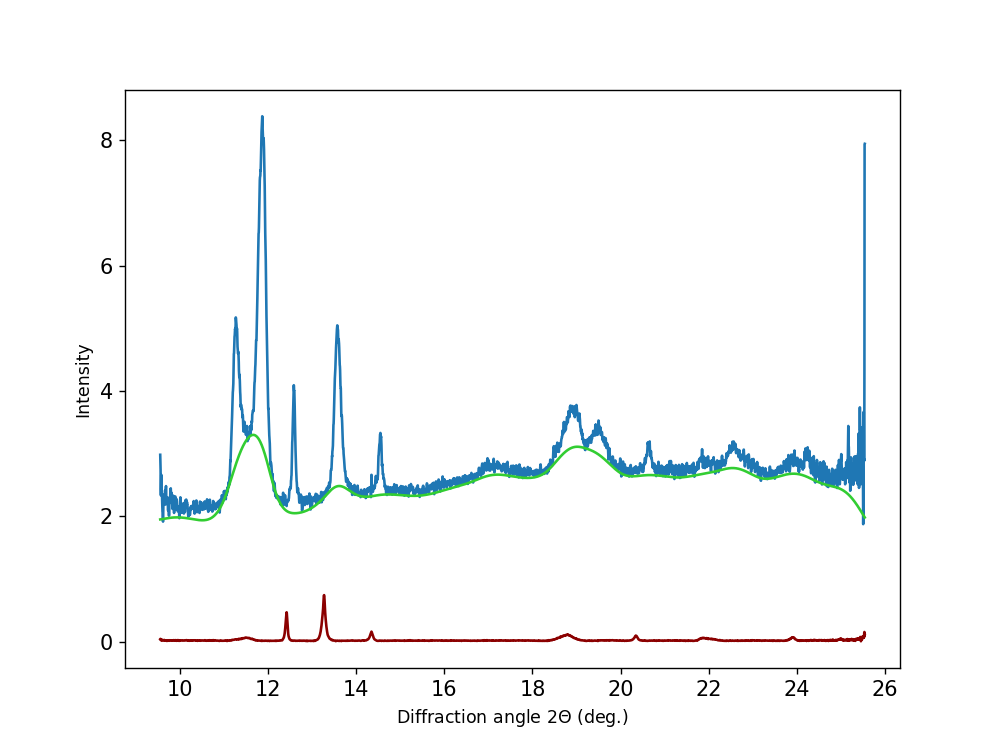

<function matplotlib.pyplot.tight_layout(pad=1.08, h_pad=None, w_pad=None, rect=None)>

In [74]:
plt.figure()
plt.plot(theta[98], I[98][idx1:idx2])
plt.plot(theta[98], baseline[98],color = 'limegreen')
plt.plot(theta[98], Icorrect[98], color = 'darkred')
#plt.plot(theta[0], I[0], color = 'red')
#plt.plot(theta[1500], I[1500][idx1:idx2])
#plt.plot(theta[1500], baseline[1500])
#plt.plot(theta[450], Icorrect[450], color = 'limegreen')
#plt.plot(theta[420], I[420], color = 'limegreen')
plt.ylabel('Intensity') #, fontsize = 12
plt.xlabel('Diffraction angle 2$\Theta$ (deg.)' )#, fontsize = 12
plt.tight_layout

In [75]:
len(theta_fast)

222

In [76]:
theta_fast[0].shape

(4020,)

(222, 4020) (222, 4020)


<IPython.core.display.Javascript object>


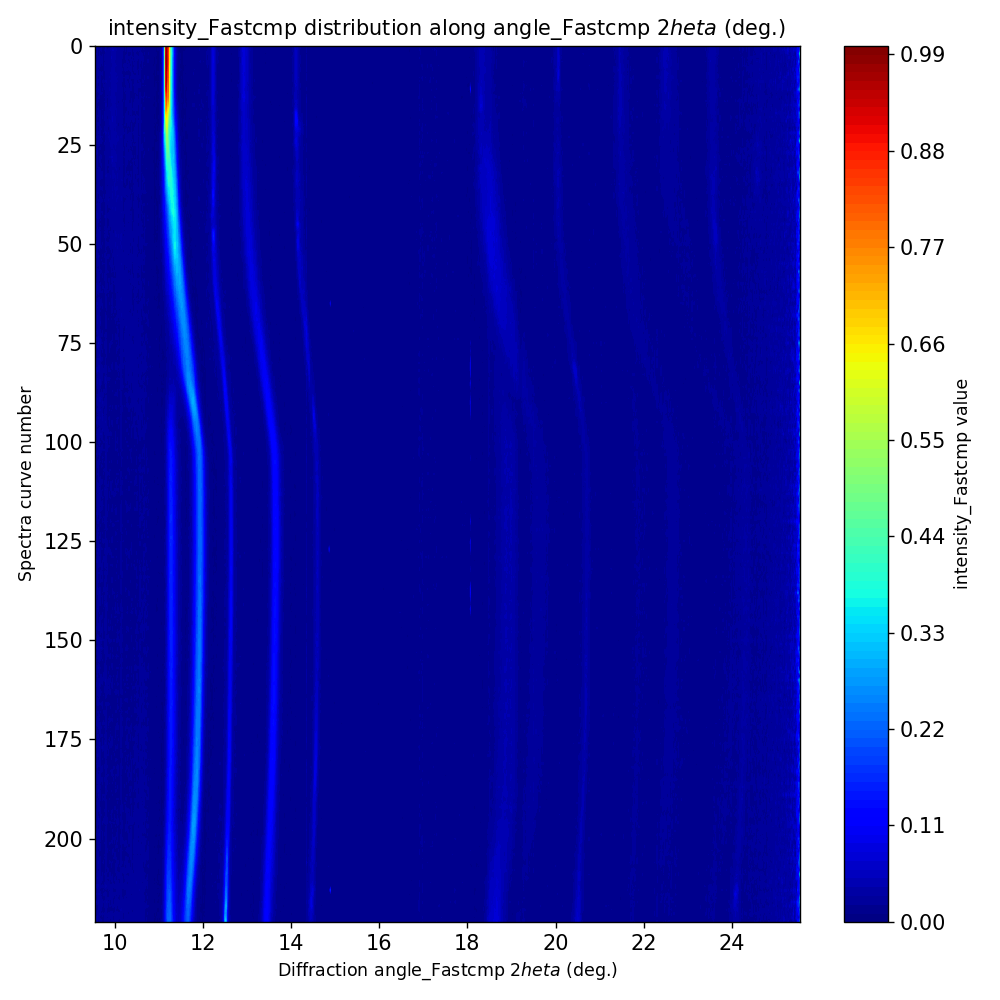

1.0


In [77]:

angle_Fastcmp     = np.asarray(theta_fast)
intensity_Fastcmp = np.asarray(Icorrect_fast)

print(angle_Fastcmp.shape,intensity_Fastcmp.shape)
fig, ax = plt.subplots(figsize=(8,8))

H_value   = np.max(intensity_Fastcmp)
L_value   = np.min(intensity_Fastcmp)
print(H_value)
x_vals    = angle_Fastcmp[0] # all the spectral curves have the same x-axis, called the 
y_vals    = np.arange(0,len(angle_Fastcmp))
X, Y      = np.meshgrid(x_vals, y_vals)

Z         = intensity_Fastcmp
level_n   = 100
cp        = plt.contourf(X, Y, Z,levels=level_n,vmin = L_value, vmax = H_value,cmap=cm.jet)
plt.ylabel('Spectra curve number')
plt.xlabel('Diffraction angle_Fastcmp 2$\theta$ (deg.)')


ax.invert_yaxis()  # labels read top-to-bottom
ax.set_ylim((len(angle_Fastcmp)-1), 0)

# ==================method 1===================
# m = plt.cm.ScalarMappable(cmap=cmap_temp)
# m.set_array(Z)
# m.set_clim(L_value, H_value)
# plt.colorbar(m, boundaries=np.linspace(L_value, H_value,level_n+1))
# plt.show()

# m = plt.cm.ScalarMappable(cmap=cmap_temp)
# m.set_array(Z)
# m.set_clim(L_value, H_value)
# plt.colorbar(m)
# plt.show()

# ==================method 4===================
# cbar = fig.colorbar(cp,boundaries=np.linspace(L_value, H_value,level_n+1))
# cbar = fig.colorbar(cp)
# cbar.ax.set_ylabel('intensity_Fastcmp value')
# plt.show()
# cbar.ax.set_yticks(np.arange(L_value,H_value,2))


# ==================method 2===================
# cp.set_clim(L_value, H_value)
# cbar = fig.colorbar(cp)
# cbar.ax.set_ylabel('intensity_Fastcmp value')

# plt.clim(L_value, H_value)
# plt.colorbar()
# plt.show()

# ==================method 3===================
cbar = fig.colorbar(cp)
cbar.ax.set_ylabel('intensity_Fastcmp value')


plt.title('intensity_Fastcmp distribution along angle_Fastcmp 2$\theta$ (deg.) ')


plt.tight_layout()
# plt.savefig(save_figures_to+"FeO_Pt_FASTcomp spectra intensity_Fastcmp distribution.png", bbox_inches='tight', dpi=600)

In [78]:
intensity_Fastcmp.shape

(222, 4020)

In [79]:
angle     = angle_Fastcmp
intensity = intensity_Fastcmp
print(intensity.shape)
Slice_theta_fast = []
Slice_intensity_fast = []

# Slice_s = 0.8
# Slice_e = 0.96
# #Slice_gap = 0.05

# num = 8
for Slice_n in np.linspace(Slice_s, Slice_e, num = num):
    print(Slice_n)
    new_intensity= window_slice_s(intensity, reduce_ratio = Slice_n)
    Slice_intensity_fast.append(new_intensity) # attaches a new array each time to a copy of previous, not really necessary here
    Slice_theta_fast.append(angle)

Slice_theta_fast     = np.asarray(Slice_theta_fast)
Slice_intensity_fast = np.asarray(Slice_intensity_fast)

(222, 4020)
1.0
4020


In [80]:
Slice_theta_fast.shape

(1, 222, 4020)

<IPython.core.display.Javascript object>


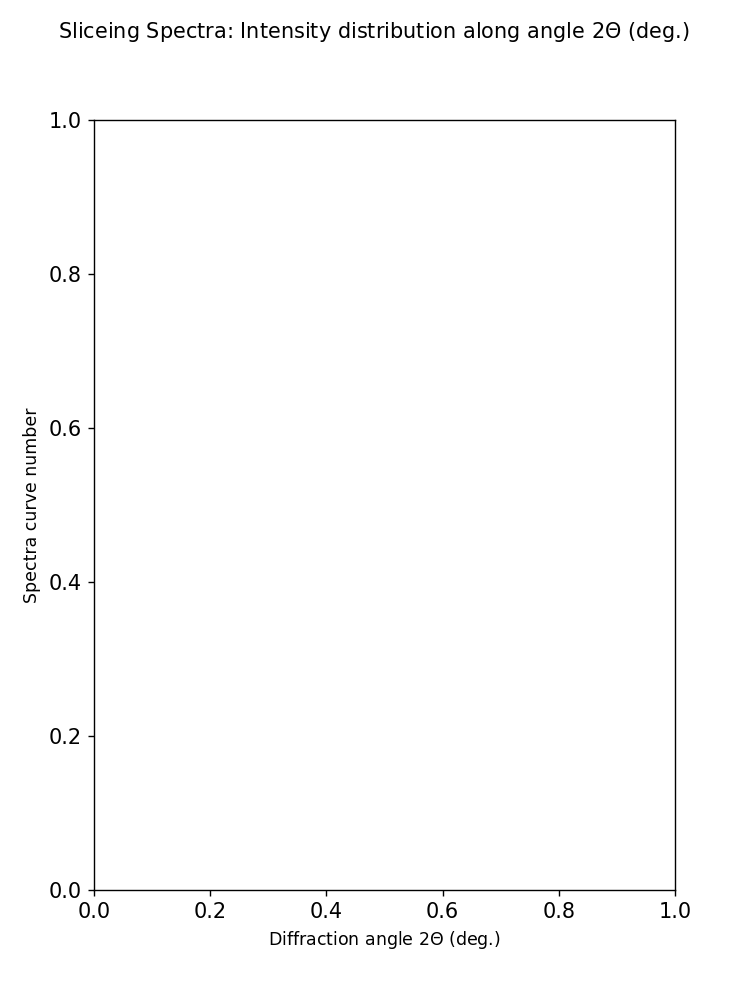

1
(222, 4020) (222, 4020)
1.0


Text(0.5, 0.98, 'Sliceing Spectra: Intensity distribution along angle 2$\\Theta$ (deg.) ')

In [81]:
n_gap = 1

fig, axs = plt.subplots(len(range(0,Slice_theta_fast.shape[0],n_gap)), sharex=True, sharey=True,figsize=(6,8))  #  sharex=True

print(len(range(0,Slice_theta_fast.shape[0],n_gap)))

n_img = 0    
for n in range(0,Slice_theta_fast.shape[0],n_gap):
#     print(n_img)
    angle     = Slice_theta_fast[n]
    intensity = Slice_intensity_fast[n]
    print(angle.shape,intensity.shape)

    H_value   = np.max(intensity)
    L_value   = np.min(intensity)
    print(H_value)
    x_vals    = angle[0] # all the spectral curves have the same x-axis, called the 
    y_vals    = np.arange(0,len(angle))
    X, Y      = np.meshgrid(x_vals, y_vals)

    Z         = intensity
    level_n   = 100

#     axs[n_img].imshow(Z,cmap=cm.jet)
#     axs[n_img].invert_yaxis()  # labels read top-to-bottom
#     axs[n_img].set_ylim((len(angle)-1), 0)
#     for tick in axs[n_img].yaxis.get_major_ticks():
#         tick.label.set_fontsize(10) 
#     for tick in axs[n_img].xaxis.get_major_ticks():
#         tick.label.set_fontsize(10) 

    n_img = n_img +1
    

plt.ylabel('Spectra curve number')
plt.xlabel('Diffraction angle 2$\Theta$ (deg.)')
plt.suptitle('Sliceing Spectra: Intensity distribution along angle 2$\Theta$ (deg.) ')
# plt.savefig(save_figures_to+"Sliceing Spectra.png", bbox_inches='tight', dpi=400)
# plt.yticks(fontsize=12)
# plt.xticks(fontsize=12)


        
# plt.tight_layout()

In [82]:
Slice_intensity_fast.shape

(1, 222, 4020)

# d4====Fe_r2_11112019_L2_XY_bg_corr====d4

In [83]:
# show the number of XYfiles found in the directory
run_no = 0
fdir = '/home/sunyue/my_gpfs/Spectra_classification_Third_Paper/other_datasets/Fe_r2_11112019_L2_XY_bg_corr'
total_XYfiles = get_number_XYfiles(run_no,fdir)
print(total_XYfiles)
# total_XYfiles=350 #[Pt=1084, MgFeOB1_263]
print('The number of XYfiles within the chosen run is:', total_XYfiles)
%pwd


131
The number of XYfiles within the chosen run is: 131


'/gpfs/exfel/data/user/sunyue/Downloads/FeO_Pt_fastcomp_LAMBDA2_XY/FeO_Pt_fastcomp_LAMBDA2_XY'

In [84]:
%pwd

'/gpfs/exfel/data/user/sunyue/Downloads/FeO_Pt_fastcomp_LAMBDA2_XY/FeO_Pt_fastcomp_LAMBDA2_XY'

In [85]:
'''make sure that you have the right command directory selected'''
%cd /home/sunyue/my_gpfs/Spectra_classification_Third_Paper/other_datasets/Fe_r2_11112019_L2_XY_bg_corr
theta_d1 = [] 
I = []
baseline = []
Icorrect_d1 = []

test_y=total_XYfiles-2
for run_no in range(1,0+total_XYfiles):
#     fileNO = str(run_no).zfill(4) 
    fname = 'l2_fe300culet_ramp_2load_00001_m1_'+str(run_no).zfill(3)+'.xy'
    thetas, Is = np.loadtxt(fname, skiprows=25, unpack=True) # reads all files in range and assigns 1st column to thetas and 2nd to Is
    I.append(Is) # attaches a new array each time to a copy of previous, not really necessary here
    idx1 = 0
    idx2 = 3700
#background subtraction
#parameters lam and p have to be adjusted by hand!
#try 10**2 < lam < 10**9
#    0.001 <  p  < 0.1
    lam = 100000
    p = 0.002
    baselines = baseline_als(Is[idx1:idx2], lam, p)
    baseline.append(baselines)
    
    Icorrected = Is[idx1:idx2] 
#     Icorrected = Is[idx1:idx2] - baselines
    Icorrect_d1.append(Icorrected)

#    if (run_no==15): 
#        print(thetas.size, Is.shape,type(I),np.shape(I),len(Icorrected),len(baselines),sep='\n')
    thetas = thetas[idx1:idx2]
    theta_d1.append(thetas)

/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/other_datasets/Fe_r2_11112019_L2_XY_bg_corr


In [86]:
Icorrect_d1 = (Icorrect_d1-np.amin(Icorrect_d1))/(np.amax(Icorrect_d1)-np.amin(Icorrect_d1))
print(Icorrect_d1.max(),Icorrect_d1.min())

1.0 0.0


In [87]:
print(len(theta_d1), theta_d1[0].shape)

130 (3700,)


In [88]:
# temporal label for pretraining:
y_d4_tmp = temp_label(len(theta_d1),typeC)

26


(130, 3700) (130, 3700)


<IPython.core.display.Javascript object>


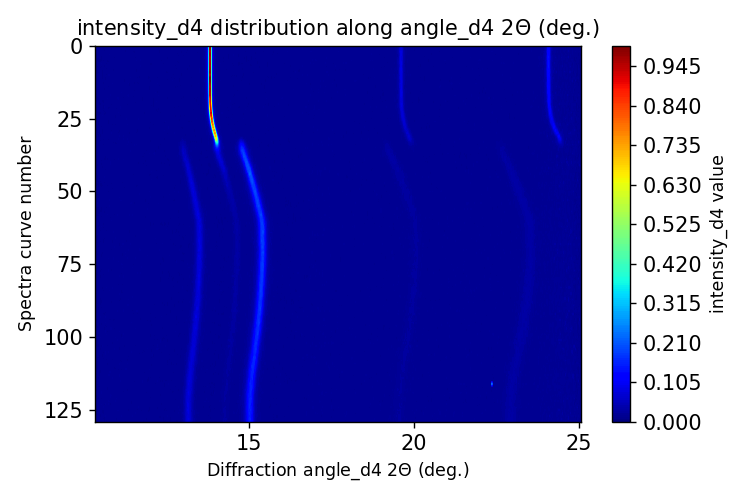

1.0


In [89]:

angle_d4     = np.asarray(theta_d1)
intensity_d4 = np.asarray(Icorrect_d1)
print(angle_d4.shape, intensity_d4.shape)
fig, ax = plt.subplots(figsize=(6,4))

H_value   = np.max(intensity_d4)
L_value   = np.min(intensity_d4)
print(H_value)
x_vals    = angle_d4[0] # all the spectral curves have the same x-axis, called the 
y_vals    = np.arange(0,len(angle_d4))
X, Y      = np.meshgrid(x_vals, y_vals)

Z         = intensity_d4
level_n   = 200
cp        = plt.contourf(X, Y, Z,levels=level_n,vmin = L_value, vmax = H_value,cmap=cm.jet)
plt.ylabel('Spectra curve number')
plt.xlabel('Diffraction angle_d4 2$\Theta$ (deg.)')


ax.invert_yaxis()  # labels read top-to-bottom
ax.set_ylim((len(angle_d4)-1), 0)

# ==================method 3===================
cbar = fig.colorbar(cp)
cbar.ax.set_ylabel('intensity_d4 value')


plt.title('intensity_d4 distribution along angle_d4 2$\Theta$ (deg.) ')


plt.tight_layout()
plt.savefig(save_figures_to+"Spectra_dataset4_intensity distribution.png", bbox_inches='tight', dpi=400)

In [90]:

Org_angle_d4     = angle_d4 
Org_intensity_d4 = intensity_d4 

In [91]:
angle     = angle_d4
intensity = intensity_d4
print(intensity.shape)
Slice_theta_d4 = []
Slice_intensity_d4 = []

# Slice_s = 0.8
# Slice_e = 0.96
# #Slice_gap = 0.05

# num = 8
for Slice_n in np.linspace(Slice_s, Slice_e, num = num):
    print(Slice_n)
    new_intensity= window_slice_s(intensity, reduce_ratio = Slice_n)
    Slice_intensity_d4.append(new_intensity) # attaches a new array each time to a copy of previous, not really necessary here
    Slice_theta_d4.append(angle)

Slice_theta_d4     = np.asarray(Slice_theta_d4)
Slice_intensity_d4 = np.asarray(Slice_intensity_d4)

(130, 3700)
1.0
3700


In [92]:
Slice_intensity_d4.shape

(1, 130, 3700)

<IPython.core.display.Javascript object>


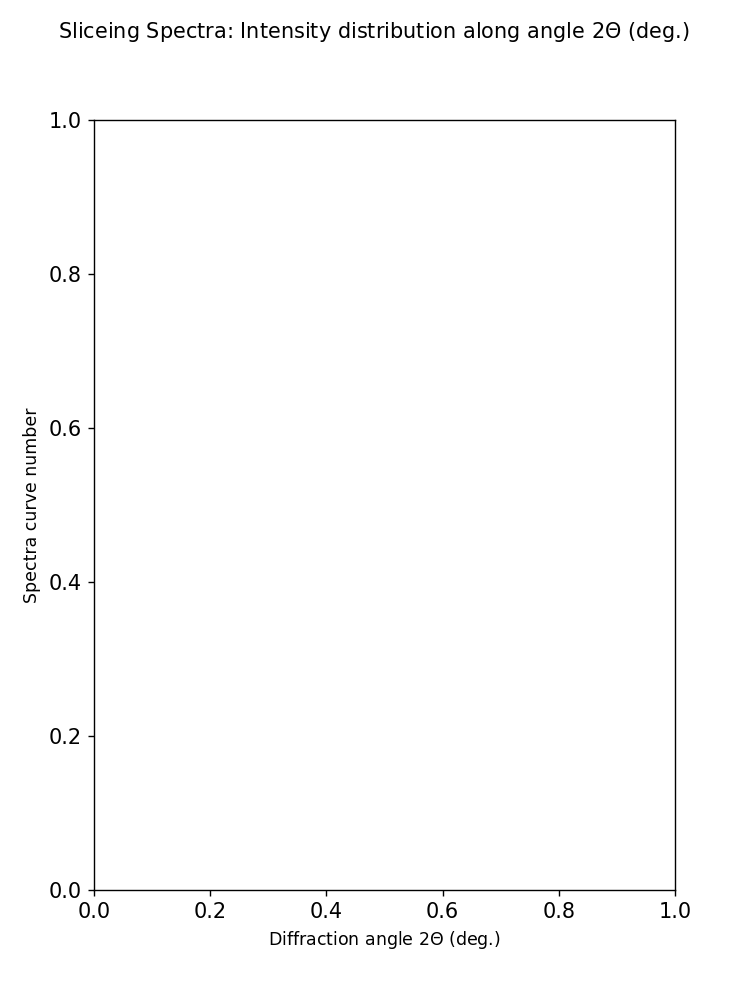

1
(130, 3700) (130, 3700)
1.0


Text(0.5, 0.98, 'Sliceing Spectra: Intensity distribution along angle 2$\\Theta$ (deg.) ')

In [93]:
n_gap = 1

fig, axs = plt.subplots(len(range(0,Slice_intensity_d4.shape[0],n_gap)), sharex=True, sharey=True,figsize=(6,8))  #  sharex=True

print(len(range(0,Slice_intensity_d4.shape[0],n_gap)))

n_img = 0    
for n in range(0,Slice_intensity_d4.shape[0],n_gap):
#     print(n_img)
    angle     = Slice_theta_d4[n]
    intensity = Slice_intensity_d4[n]
    print(angle.shape,intensity.shape)

    H_value   = np.max(intensity)
    L_value   = np.min(intensity)
    print(H_value)
    x_vals    = angle[0] # all the spectral curves have the same x-axis, called the 
    y_vals    = np.arange(0,len(angle))
    X, Y      = np.meshgrid(x_vals, y_vals)

    Z         = intensity
    level_n   = 100

#     axs[n_img].imshow(Z,cmap=cm.jet)
#     axs[n_img].invert_yaxis()  # labels read top-to-bottom
#     axs[n_img].set_ylim((len(angle)-1), 0)
#     for tick in axs[n_img].yaxis.get_major_ticks():
#         tick.label.set_fontsize(10) 
#     for tick in axs[n_img].xaxis.get_major_ticks():
#         tick.label.set_fontsize(10) 

    n_img = n_img +1
    

plt.ylabel('Spectra curve number')
plt.xlabel('Diffraction angle 2$\Theta$ (deg.)')
plt.suptitle('Sliceing Spectra: Intensity distribution along angle 2$\Theta$ (deg.) ')
# plt.savefig(save_figures_to+"Sliceing Spectra.png", bbox_inches='tight', dpi=400)
# plt.yticks(fontsize=12)

In [94]:
Slice_intensity_d4.shape

(1, 130, 3700)

In [95]:
N = len(theta[0])
comp_zeros = np.zeros((Slice_intensity_d4.shape[0],Slice_intensity_d4.shape[1],N-Slice_intensity_d4.shape[-1]))
print(comp_zeros.shape)

(1, 130, 320)


In [96]:
Slice_theta_d4 = np.concatenate((Slice_theta_d4,comp_zeros),-1)
print(Slice_theta_d4.shape)
Slice_intensity_d4 = np.concatenate((Slice_intensity_d4,comp_zeros),-1)
print(Slice_intensity_d4.shape)

(1, 130, 4020)
(1, 130, 4020)


In [97]:
tt= y_d4_tmp.astype(int)

print(tt,y_d4_tmp.shape,Slice_theta_d4.shape)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4] (130,) (1, 130, 4020)


## d1====Fe_load15_L2_XY=====

In [98]:
# show the number of XYfiles found in the directory
run_no = 0
fdir = '/home/sunyue/my_gpfs/Spectra_classification_Third_Paper/other_datasets/Fe_load15_L2_XY'
total_XYfiles = get_number_XYfiles(run_no,fdir)
print(total_XYfiles)
# total_XYfiles=350 #[Pt=1084, MgFeOB1_263]
print('The number of XYfiles within the chosen run is:', total_XYfiles)
%pwd



61
The number of XYfiles within the chosen run is: 61


'/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/other_datasets/Fe_r2_11112019_L2_XY_bg_corr'

In [99]:
%pwd

'/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/other_datasets/Fe_r2_11112019_L2_XY_bg_corr'

In [100]:
'''make sure that you have the right command directory selected'''
%cd /home/sunyue/my_gpfs/Spectra_classification_Third_Paper/other_datasets/Fe_load15_L2_XY
theta_d1 = [] 
I = []
baseline = []
Icorrect_d1 = []

test_y=total_XYfiles-2
for run_no in range(1,0+total_XYfiles):
#     fileNO = str(run_no).zfill(4) 
    fname = 'l2_fe_pur_ramp_00001_m1_'+str(run_no).zfill(2)+'.xy'
    thetas, Is = np.loadtxt(fname, skiprows=25, unpack=True) # reads all files in range and assigns 1st column to thetas and 2nd to Is
    I.append(Is) # attaches a new array each time to a copy of previous, not really necessary here
    idx1 = 0
    idx2 = 3900
#background subtraction
#parameters lam and p have to be adjusted by hand!
#try 10**2 < lam < 10**9
#    0.001 <  p  < 0.1
    lam = 100000
    p = 0.002
    baselines = baseline_als(Is[idx1:idx2], lam, p)
    baseline.append(baselines)
    
    Icorrected = Is[idx1:idx2] 
    Icorrect_d1.append(Icorrected)
#     Icorrected = Is[idx1:idx2] - baselines

#    if (run_no==15): 
#        print(thetas.size, Is.shape,type(I),np.shape(I),len(Icorrected),len(baselines),sep='\n')
    thetas = thetas[idx1:idx2]
    theta_d1.append(thetas)

/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/other_datasets/Fe_load15_L2_XY


In [101]:
# temporal label for pretraining:
y_d1_tmp = temp_label(len(theta_d1),typeC)

12


In [102]:
Icorrect_d1 = (Icorrect_d1-np.amin(Icorrect_d1))/(np.amax(Icorrect_d1)-np.amin(Icorrect_d1))
print(Icorrect_d1.max(),Icorrect_d1.min())

1.0 0.0


(60, 3900) (60, 3900)


<IPython.core.display.Javascript object>


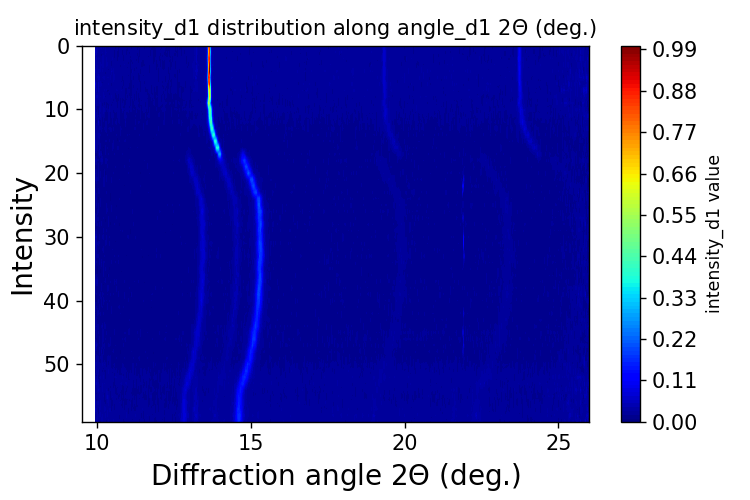

1.0


In [103]:

angle_d1     = np.asarray(theta_d1)
intensity_d1 = np.asarray(Icorrect_d1)
print(angle_d1.shape, intensity_d1.shape)
fig, ax = plt.subplots(figsize=(6,4))

H_value   = np.max(intensity_d1)
L_value   = np.min(intensity_d1)
print(H_value)
x_vals    = angle_d1[0] # all the spectral curves have the same x-axis, called the 
y_vals    = np.arange(0,len(angle_d1))
X, Y      = np.meshgrid(x_vals, y_vals)

Z         = intensity_d1
level_n   = 100
cp        = plt.contourf(X, Y, Z,levels=level_n,vmin = L_value, vmax = H_value,cmap=cm.jet)
plt.ylabel('Spectra curve number')
plt.xlabel('Diffraction angle_d1 2$\Theta$ (deg.)')


ax.invert_yaxis()  # labels read top-to-bottom
ax.set_ylim((len(angle_d1)-1), 0)

# ==================method 3===================
cbar = fig.colorbar(cp)
cbar.ax.set_ylabel('intensity_d1 value')


plt.title('intensity_d1 distribution along angle_d1 2$\Theta$ (deg.) ')


plt.tight_layout()
plt.savefig(save_figures_to+"Fe_pur_ramp intensity_d1 distribution.png", bbox_inches='tight', dpi=400)

In [104]:

Org_angle_d1    = angle_d1
Org_intensity_d1 = intensity_d1

In [105]:
angle     = angle_d1
intensity = intensity_d1
print(intensity.shape)
Slice_theta_d1 = []
Slice_intensity_d1 = []

# Slice_s = 0.8
# Slice_e = 0.96
# #Slice_gap = 0.05

# num = 8
for Slice_n in np.linspace(Slice_s, Slice_e, num = num):
    print(Slice_n)
    new_intensity= window_slice_s(intensity, reduce_ratio = Slice_n)
    Slice_intensity_d1.append(new_intensity) # attaches a new array each time to a copy of previous, not really necessary here
    Slice_theta_d1.append(angle)

Slice_theta_d1     = np.asarray(Slice_theta_d1)
Slice_intensity_d1 = np.asarray(Slice_intensity_d1)

(60, 3900)
1.0
3900


<IPython.core.display.Javascript object>


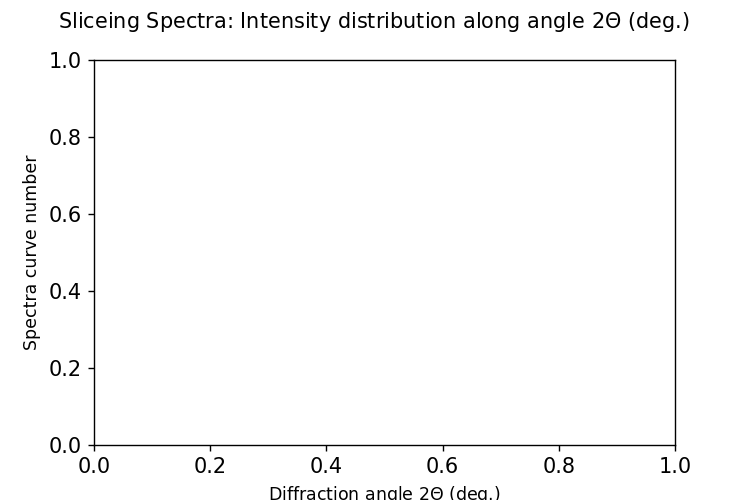

1
(60, 3900) (60, 3900)
1.0


Text(0.5, 0.98, 'Sliceing Spectra: Intensity distribution along angle 2$\\Theta$ (deg.) ')

In [106]:
n_gap = 1

fig, axs = plt.subplots(len(range(0,Slice_intensity_d1.shape[0],n_gap)), sharex=True, sharey=True,figsize=(6,4))  #  sharex=True

print(len(range(0,Slice_intensity_d1.shape[0],n_gap)))

n_img = 0    
for n in range(0,Slice_intensity_d1.shape[0],n_gap):
#     print(n_img)
    angle     = Slice_theta_d1[n]
    intensity = Slice_intensity_d1[n]
    print(angle.shape,intensity.shape)

    H_value   = np.max(intensity)
    L_value   = np.min(intensity)
    print(H_value)
    x_vals    = angle[0] # all the spectral curves have the same x-axis, called the 
    y_vals    = np.arange(0,len(angle))
    X, Y      = np.meshgrid(x_vals, y_vals)

    Z         = intensity
    level_n   = 100

#     axs[n_img].imshow(Z,cmap=cm.jet)
#     axs[n_img].invert_yaxis()  # labels read top-to-bottom
#     axs[n_img].set_ylim((len(angle)-1), 0)
#     for tick in axs[n_img].yaxis.get_major_ticks():
#         tick.label.set_fontsize(10) 
#     for tick in axs[n_img].xaxis.get_major_ticks():
#         tick.label.set_fontsize(10) 

    n_img = n_img +1
    

plt.ylabel('Spectra curve number')
plt.xlabel('Diffraction angle 2$\Theta$ (deg.)')
plt.suptitle('Sliceing Spectra: Intensity distribution along angle 2$\Theta$ (deg.) ')
# plt.savefig(save_figures_to+"Sliceing Spectra.png", bbox_inches='tight', dpi=400)
# plt.yticks(fontsize=12)

In [107]:
Slice_intensity_d1.shape

(1, 60, 3900)

In [108]:
N = len(theta[0])
comp_zeros = np.zeros((Slice_intensity_d1.shape[0],Slice_intensity_d1.shape[1],N-Slice_intensity_d1.shape[-1]))
print(comp_zeros.shape)

(1, 60, 120)


In [109]:
Slice_theta_d1 = np.concatenate((Slice_theta_d1,comp_zeros),-1)
print(Slice_theta_d1.shape)
Slice_intensity_d1 = np.concatenate((Slice_intensity_d1,comp_zeros),-1)
print(Slice_intensity_d1.shape)

(1, 60, 4020)
(1, 60, 4020)


In [110]:
tt= y_d1_tmp.astype(int)

print(tt,y_d1_tmp.shape)

[0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 3
 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4] (60,)


### ====concatenate rolled intensity and shift intensity, and slicing, wrapping ones====

In [111]:
# sim_intensity = np.concatenate((Roll_intensity, Shift_intensity,Slice_intensity,Warp_intensity), axis=0)
# sim_theta = np.concatenate((Roll_theta, Shift_theta,Slice_theta,Warp_theta), axis=0)
# sim_intensity = np.concatenate((Slice_intensity), axis=0)
# sim_theta = np.concatenate((Slice_theta), axis=0)

sim_intensity = np.concatenate((np.concatenate((Slice_intensity), axis=0),np.concatenate((Slice_intensity_fast), axis=0), np.concatenate((Slice_intensity_d4), axis=0), np.concatenate((Slice_intensity_d1), axis=0) ), axis=0)
sim_theta = np.concatenate((np.concatenate((Slice_theta), axis=0),np.concatenate((Slice_theta_fast), axis=0), np.concatenate((Slice_theta_d4), axis=0) , np.concatenate((Slice_theta_d1), axis=0) ), axis=0)

print(sim_intensity.shape,sim_theta.shape)

(872, 4020) (872, 4020)


In [112]:
Slice_intensity_fast.shape

(1, 222, 4020)

In [113]:
print(len(Slice_intensity)*Slice_intensity[0].shape[0])
print(len(Slice_intensity_fast)*Slice_intensity_fast[0].shape[0])
print(len(Slice_intensity_d4)*Slice_intensity_d4[0].shape[0])
print(len(Slice_intensity_d1)*Slice_intensity_d1[0].shape[0])

460
222
130
60


In [114]:
len(y_fast_tmp)

222

In [115]:
y_slow_slice = np.tile(y_slow_tmp, (Slice_intensity.shape[0],1)) 
y_fast_slice = np.tile(y_fast_tmp, (Slice_intensity_fast.shape[0],1)) 
y_d4_slice = np.tile(y_d4_tmp, (Slice_intensity_d4.shape[0],1)) 
y_d1_slice = np.tile(y_d1_tmp, (Slice_intensity_d1.shape[0],1)) 
print(y_slow_slice.shape,y_fast_slice.shape,y_d4_slice.shape,y_d1_slice.shape )

y_train = np.concatenate((np.concatenate((y_slow_slice), axis=0),np.concatenate((y_fast_slice), axis=0), np.concatenate((y_d4_slice), axis=0), np.concatenate((y_d1_slice), axis=0) ), axis=0)
y_train = y_train.astype(int)
print(y_train.shape)

(1, 460) (1, 222) (1, 130) (1, 60)
(872,)


## =====Prepare training data with true labels for linear testing=====

### slowcomp dataset=======================

In [116]:
angle     = np.asarray(theta)
intensity = np.asarray(Icorrect)

<IPython.core.display.Javascript object>


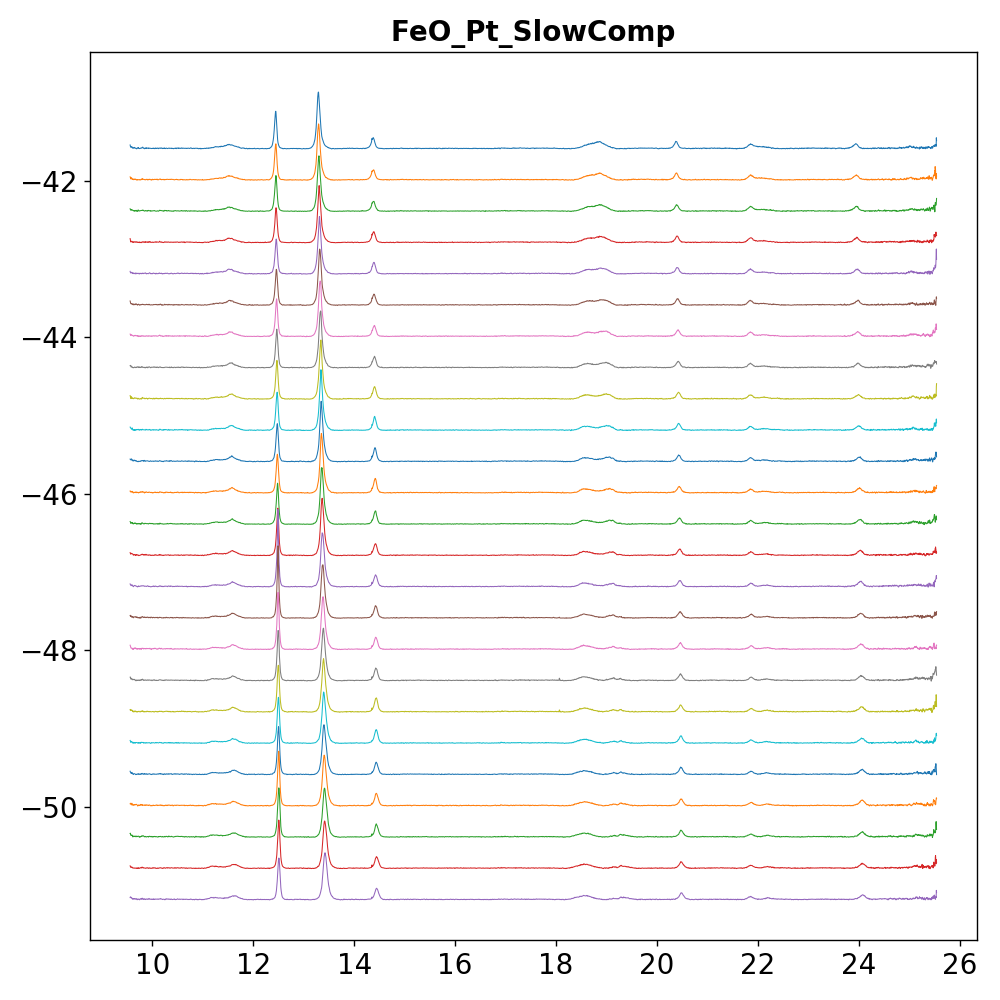

1 142 25 45 72


In [117]:
# data for training
#plotting various plots to show development of bcc -> hcp transition
# plt.figure(figsize=(8,6))

plt.rc('xtick',labelsize=16)
plt.rc('ytick',labelsize=16)

# These are the colors that will be used in the plot
color_sequence = ['#1f77b4', '#aec7e8', '#ff7f0e', '#ffbb78', '#2ca02c',
                  '#98df8a', '#d62728', '#ff9896', '#9467bd', '#c5b0d5',
                  '#8c564b', '#c49c94', '#e377c2', '#f7b6d2', '#7f7f7f',
                  '#c7c7c7', '#bcbd22', '#dbdb8d', '#17becf', '#9edae5']

# ax = plt.subplot(111)


y   = []
N = len(theta[0])

global Ci,Ci_0,div_num,gap #indicates num of curves, and curves of class0.
div_num = 102 #indicates the boundary of spectral curves. 102-120
Start_num = 0
End_num = intensity.shape[0]
Trans_nS = 104 # phase transistion start number
Trans_nE = 129 # phase transistion end number
Phase_Transt = range(Trans_nS,Trans_nE)
gap = 2 
Class_bias = 15 #15

X_axis=[] # used to store data for 3D plotting
Extrm_I = [] # representative spectra for training
y = [] # label of the datasets
class0 = 0
class1 = 1
class2 = 2
# for n in range(0, 160):
for n in range(0, Slice_intensity.shape[0]):
    Tranin_I = Slice_intensity[n]
    Tranin_Theta = Slice_theta[n]
    Ci = 0   # class 1
    Ci_0 = 0 # class 0
    Ci_1 = 0 # class 2
    
    X_1 = []# training: theta
    X_2 = []# training: intensity
    
    for pct in range(0,Trans_nS-Class_bias,gap):  ### class 0, not phase transition
#         ax.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*1,lw=0.6)    
        Icorrect_t = Tranin_I[pct][0:N]
        theta_t = Tranin_Theta[pct][0:N]
        X_1.append(theta_t[0:N])
        X_2.append(Icorrect_t[0:N])
        y.append(class0)
        Ci_0 += 1
    for pct in range(Trans_nS,Trans_nE):  ### class 1, phase transition
#         ax.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*1,lw=0.6)    
        Icorrect_t = Tranin_I[pct][0:N]
        theta_t = Tranin_Theta[pct][0:N]
        X_1.append(theta_t[0:N])
        X_2.append(Icorrect_t[0:N])
        y.append(class1)
        Ci += 1
    for pct in range(Trans_nE + int(Class_bias*3),End_num,gap*2):  ### class 0, not phase transition
#         ax.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*1,lw=0.6)    
        Icorrect_t = Tranin_I[pct][0:N]
        theta_t = Tranin_Theta[pct][0:N]
        X_1.append(theta_t[0:N])
        X_2.append(Icorrect_t[0:N])
        y.append(class2)
        Ci_1 += 1
    X_2 = np.array(X_2)
    Extrm_I.append(X_2)

    
    
plt.figure(figsize=(8,8))
for pct in range(Trans_nS,Trans_nE):
    plt.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*0.4,lw=0.6)               
print(len(Extrm_I),len(X_1),Ci,Ci_0,Ci_1)

ax.set_ylabel('Intensity', fontsize = 16,)
ax.set_xlabel('Diffraction angle 2$\Theta$ (deg.)', fontsize = 16)
ax.set_xlim(9.5,26)
plt.title('FeO_Pt_SlowComp', fontsize=16, fontweight='bold')
plt.tight_layout()

In [118]:

Tranin_I = np.asarray(Icorrect)
Tranin_Theta = np.asarray(theta)


<IPython.core.display.Javascript object>


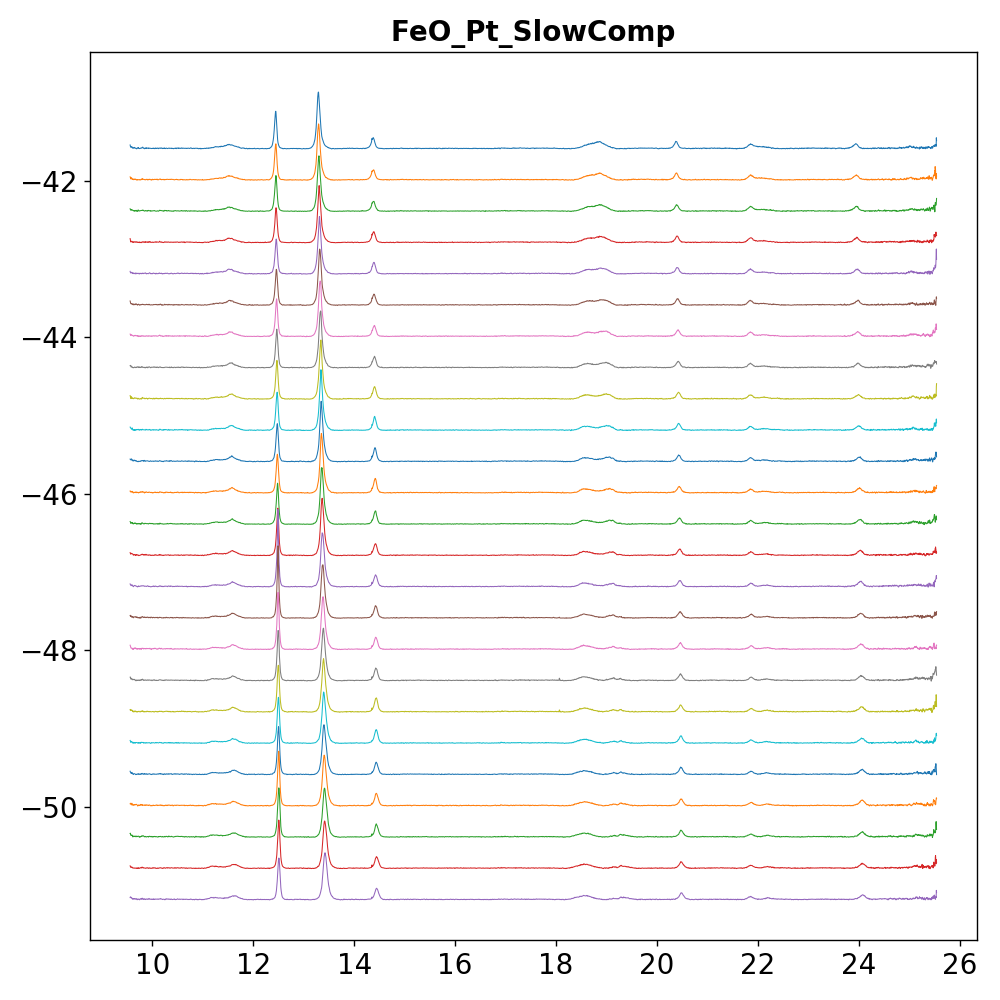

1 138 45 25 68


In [119]:
# data for training
#plotting various plots to show development of bcc -> hcp transition
# plt.figure(figsize=(8,6))

plt.rc('xtick',labelsize=16)
plt.rc('ytick',labelsize=16)

# These are the colors that will be used in the plot
color_sequence = ['#1f77b4', '#aec7e8', '#ff7f0e', '#ffbb78', '#2ca02c',
                  '#98df8a', '#d62728', '#ff9896', '#9467bd', '#c5b0d5',
                  '#8c564b', '#c49c94', '#e377c2', '#f7b6d2', '#7f7f7f',
                  '#c7c7c7', '#bcbd22', '#dbdb8d', '#17becf', '#9edae5']

# ax = plt.subplot(111)


N = len(theta[0])

global Ci,Ci_0,div_num,gap #indicates num of curves, and curves of class0.
div_num = 102 #indicates the boundary of spectral curves. 102-120
Start_num = 0
End_num = intensity.shape[0]
# Trans_nS = 104 # phase transistion start number
# Trans_nE = 125 # phase transistion end number
# Phase_Transt = range(Trans_nS,Trans_nE)
# gap = 2 
# Class_bias =15

X_axis=[] # used to store data for 3D plotting
# Extrm_I = [] # representative spectra for training
y_origSlow = [] # label of the datasets
class0 = 0
class1 = 1
class2 = 2
# for n in range(0, 160):


Ci = 0   # class 1
Ci_0 = 0 # class 0
Ci_1 = 0 # class 2
    
X_1 = []# training: theta
X_2 = []# training: intensity

num_pct = []
    
for pct in range(0,Trans_nS-Class_bias,gap):  ### class 0, not phase transition
#         ax.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*1,lw=0.6)    
    Icorrect_t = Tranin_I[pct][0:N]
    theta_t = Tranin_Theta[pct][0:N]
    X_1.append(theta_t[0:N])
    X_2.append(Icorrect_t[0:N])
    y_origSlow.append(class0)
    num_pct.append(pct)
    Ci_0 += 1
for pct in range(Trans_nS,Trans_nE):  ### class 1, phase transition
#         ax.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*1,lw=0.6)    
    Icorrect_t = Tranin_I[pct][0:N]
    theta_t = Tranin_Theta[pct][0:N]
    X_1.append(theta_t[0:N])
    X_2.append(Icorrect_t[0:N])
    y_origSlow.append(class1)
    num_pct.append(pct)
    Ci += 1
for pct in range(Trans_nE + Class_bias* 4,End_num,gap*2):  ### class 0, not phase transition
#         ax.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*1,lw=0.6)    
    Icorrect_t = Tranin_I[pct][0:N]
    theta_t = Tranin_Theta[pct][0:N]
    X_1.append(theta_t[0:N])
    X_2.append(Icorrect_t[0:N])
    y_origSlow.append(class2)
    num_pct.append(pct)
    Ci_1 += 1
X_2 = np.array(X_2)
# Extrm_I.append(X_2)

num_pct_slow = np.array(num_pct)
  
    
plt.figure(figsize=(8,8))
for pct in range(Trans_nS,Trans_nE):
    plt.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*0.4,lw=0.6)               
print(len(Extrm_I),len(X_1),Ci_0,Ci,Ci_1)

ax.set_ylabel('Intensity', fontsize = 16,)
ax.set_xlabel('Diffraction angle 2$\Theta$ (deg.)', fontsize = 16)
ax.set_xlim(9.5,26)
plt.title('FeO_Pt_SlowComp', fontsize=16, fontweight='bold')
plt.tight_layout()

In [120]:
num_pct_slow.shape,X_2.shape

((138,), (138, 4020))

In [121]:
X_2 = np.array(X_2)
y_origSlow = np.array(y_origSlow)
# Y_Label = np.arange(X_2.shape[0]) # np.array(y)
print(X_2.shape)

(138, 4020)


In [122]:
global L_N
L_N = Ci+Ci_0 +Ci_1 # length of the training data
# y2 = torch.FloatTensor(y[0:X_train.shape[0]*L_N]).to(device)

### fastcomp dataset===========================

222


<IPython.core.display.Javascript object>


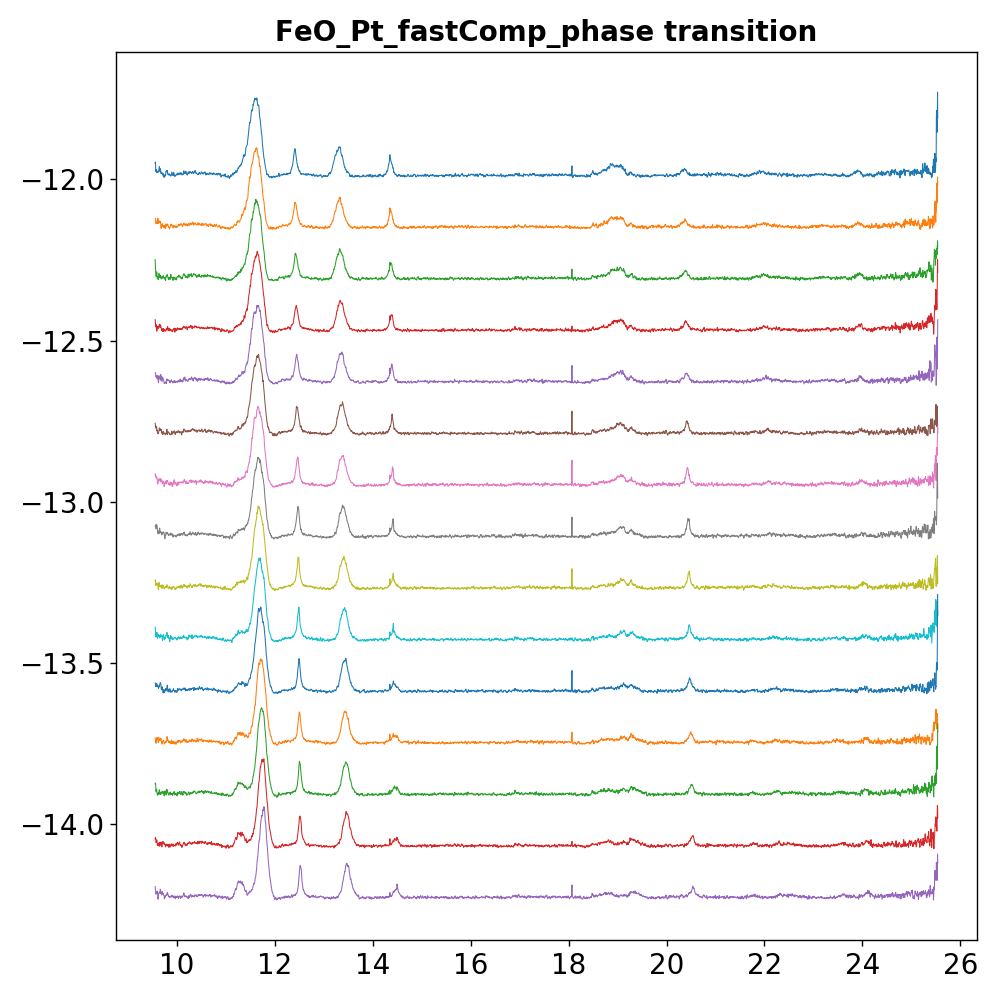

1 75 30 15 30


<IPython.core.display.Javascript object>


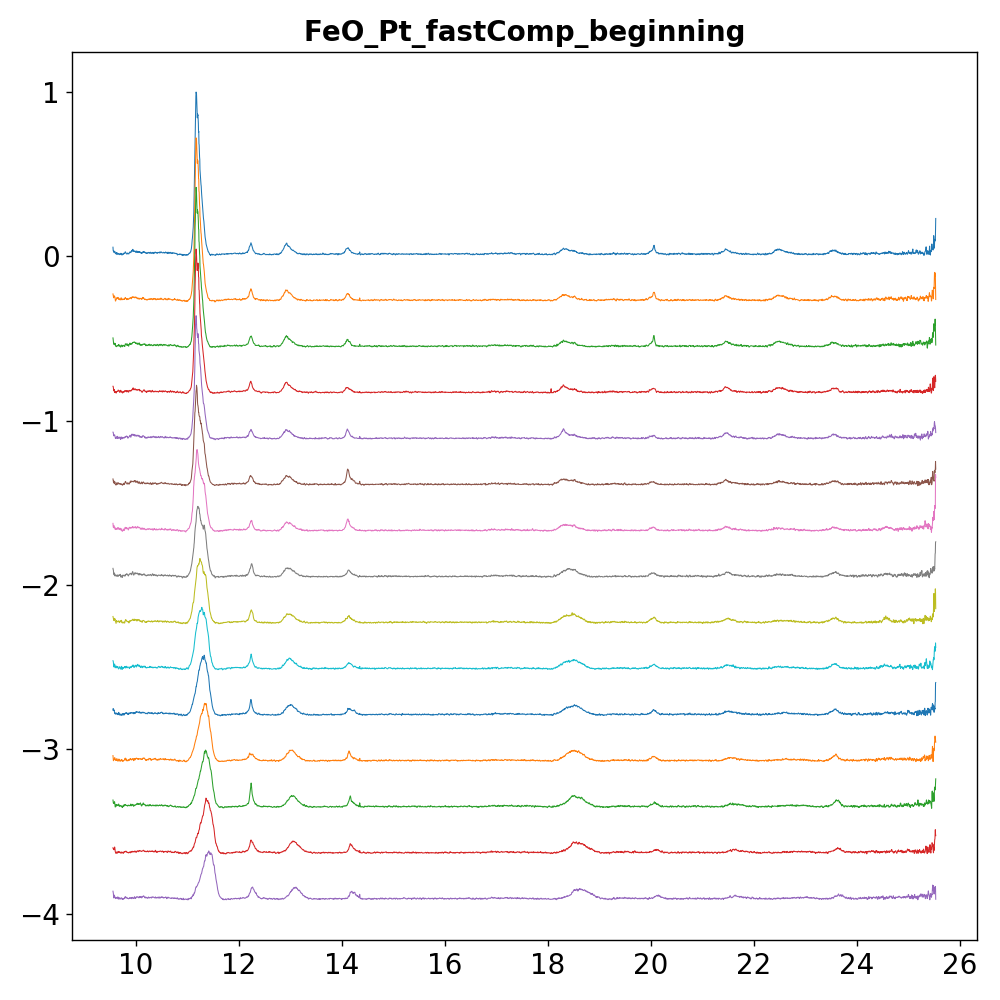

1 75 30 15 30


<IPython.core.display.Javascript object>


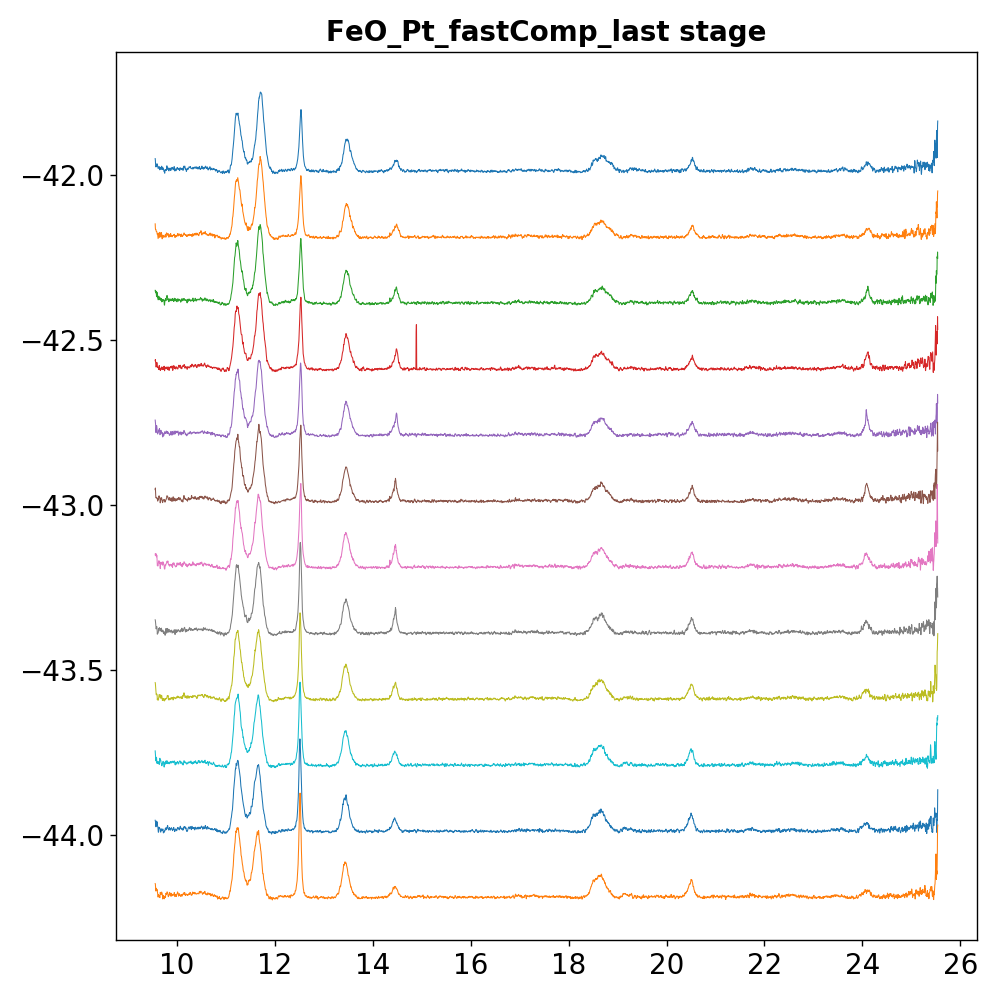

1 75 30 15 30


In [123]:
# data for training
#plotting various plots to show development of bcc -> hcp transition
# plt.figure(figsize=(8,6))

plt.rc('xtick',labelsize=16)
plt.rc('ytick',labelsize=16)

# These are the colors that will be used in the plot
color_sequence = ['#1f77b4', '#aec7e8', '#ff7f0e', '#ffbb78', '#2ca02c',
                  '#98df8a', '#d62728', '#ff9896', '#9467bd', '#c5b0d5',
                  '#8c564b', '#c49c94', '#e377c2', '#f7b6d2', '#7f7f7f',
                  '#c7c7c7', '#bcbd22', '#dbdb8d', '#17becf', '#9edae5']

# ax = plt.subplot(111)


y_fast   = []
N = len(theta[0])

global Ci,Ci_0,div_num,gap #indicates num of curves, and curves of class0.
div_num = 85 #indicates the boundary of spectral curves. 102-120
Start_num = 0
End_num = angle_Fastcmp.shape[0]
print(End_num)
Trans_nS = 75 # phase transistion start number
Trans_nE = 90 # phase transistion end number
Phase_Transt = range(Trans_nS,Trans_nE)
gap = 2 
Class_bias =15

X_axis=[] # used to store data for 3D plotting
Extrm_I_fast = [] # representative spectra for training
y_fast = [] # label of the datasets
class0 = 0
class1 = 1
class2 = 2
# for n in range(0, 160):
for n in range(0, Slice_intensity_fast.shape[0]):
    Tranin_I = Slice_intensity_fast[n]
    Tranin_Theta = Slice_theta_fast[n]
    Ci = 0   # class 1
    Ci_0 = 0 # class 0
    Ci_1 = 0 # class 2
    
    X_1 = []# training: theta
    X_2_fast = []# training: intensity
    
    for pct in range(0,Trans_nS-Class_bias,gap):  ### class 0, not phase transition
#         ax.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*1,lw=0.6)    
        Icorrect_t = Tranin_I[pct][0:N]
        theta_t = Tranin_Theta[pct][0:N]
        X_1.append(theta_t[0:N])
        X_2_fast.append(Icorrect_t[0:N])
        y_fast.append(class0)
        Ci_0 += 1
    for pct in range(Trans_nS,Trans_nE):  ### class 1, phase transition
#         ax.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*1,lw=0.6)    
        Icorrect_t = Tranin_I[pct][0:N]
        theta_t = Tranin_Theta[pct][0:N]
        X_1.append(theta_t[0:N])
        X_2_fast.append(Icorrect_t[0:N])
        y_fast.append(class1)
        Ci += 1
    for pct in range(Trans_nE + Class_bias,End_num,gap*2):  ### class 0, not phase transition
#         ax.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*1,lw=0.6)    
        Icorrect_t = Tranin_I[pct][0:N]
        theta_t = Tranin_Theta[pct][0:N]
        X_1.append(theta_t[0:N])
        X_2_fast.append(Icorrect_t[0:N])
        y_fast.append(class2)
        Ci_1 += 1
    X_2_fast = np.array(X_2_fast)
    Extrm_I_fast.append(X_2_fast)

    
    
plt.figure(figsize=(8,8))
for pct in range(Trans_nS,Trans_nE):
    plt.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*0.16,lw=0.6)               
print(len(Extrm_I_fast),len(X_2_fast),Ci_0,Ci,Ci_1)

ax.set_ylabel('Intensity', fontsize = 16,)
ax.set_xlabel('Diffraction angle 2$\Theta$ (deg.)_phase transition', fontsize = 16)
ax.set_xlim(9.5,26)
plt.title('FeO_Pt_fastComp_phase transition', fontsize=16, fontweight='bold')
plt.tight_layout()

  
    
plt.figure(figsize=(8,8))
for pct in range(0,60,4):
    plt.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*0.07,lw=0.6)               
print(len(Extrm_I_fast),len(X_2_fast),Ci_0,Ci,Ci_1)

ax.set_ylabel('Intensity', fontsize = 16,)
ax.set_xlabel('Diffraction angle 2$\Theta$ (deg.)_beginning', fontsize = 16)
ax.set_xlim(9.5,26)
plt.title('FeO_Pt_fastComp_beginning', fontsize=16, fontweight='bold')
plt.tight_layout()

   
plt.figure(figsize=(8,8))
for pct in range(210,End_num):
    plt.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*0.2,lw=0.6)               
print(len(Extrm_I_fast),len(X_2_fast),Ci_0,Ci,Ci_1)

ax.set_ylabel('Intensity', fontsize = 16,)
ax.set_xlabel('Diffraction angle 2$\Theta$ (deg.)_last stage', fontsize = 16)
ax.set_xlim(9.5,26)
plt.title('FeO_Pt_fastComp_last stage', fontsize=16, fontweight='bold')
plt.tight_layout()

In [124]:
len(Extrm_I_fast)

1

In [125]:
angle_Fastcmp.shape

(222, 4020)

(222, 4020) (222, 4020)


<IPython.core.display.Javascript object>


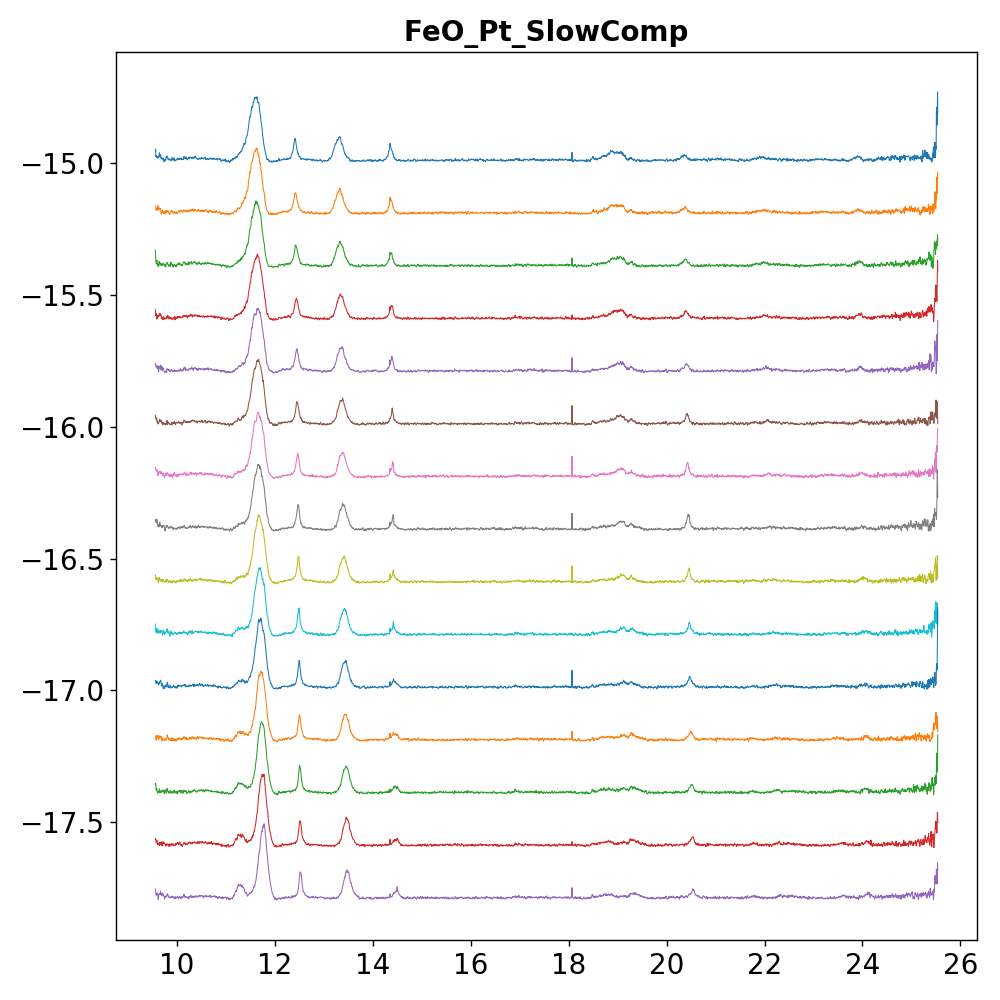

1 75 15 30 30


In [126]:
Tranin_I     = intensity_Fastcmp
Tranin_Theta = angle_Fastcmp
print(Tranin_I.shape,Tranin_Theta.shape)

plt.rc('xtick',labelsize=16)
plt.rc('ytick',labelsize=16)

# These are the colors that will be used in the plot
color_sequence = ['#1f77b4', '#aec7e8', '#ff7f0e', '#ffbb78', '#2ca02c',
                  '#98df8a', '#d62728', '#ff9896', '#9467bd', '#c5b0d5',
                  '#8c564b', '#c49c94', '#e377c2', '#f7b6d2', '#7f7f7f',
                  '#c7c7c7', '#bcbd22', '#dbdb8d', '#17becf', '#9edae5']


N = len(theta[0])

global Ci,Ci_0,div_num,gap #indicates num of curves, and curves of class0.
div_num = 102 #indicates the boundary of spectral curves. 102-120
Start_num = 0
End_num = intensity_Fastcmp.shape[0]
# Trans_nS = 75 # phase transistion start number
# Trans_nE = 90 # phase transistion end number
# Phase_Transt = range(Trans_nS,Trans_nE)
# gap = 2 
# Class_bias =15

X_axis=[] # used to store data for 3D plotting
Extrm_I_orgfast = [] # representative spectra for training
y_orgfast = [] # label of the datasets
class0 = 0
class1 = 1
class2 = 2
# for n in range(0, 160):


Ci = 0   # class 1
Ci_0 = 0 # class 0
Ci_1 = 0 # class 2
 
num_pct = []

X_1 = []# training: theta
X_2_orgfast = []# training: intensity
    
for pct in range(0,Trans_nS-Class_bias,gap):  ### class 0, not phase transition
#         ax.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*1,lw=0.6)    
    Icorrect_t = Tranin_I[pct][0:N]
    theta_t = Tranin_Theta[pct][0:N]
    X_1.append(theta_t[0:N])
    X_2_orgfast.append(Icorrect_t[0:N])
    y_orgfast.append(class0)
    num_pct.append(pct)
    Ci_0 += 1
for pct in range(Trans_nS,Trans_nE):  ### class 1, phase transition
#         ax.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*1,lw=0.6)    
    Icorrect_t = Tranin_I[pct][0:N]
    theta_t = Tranin_Theta[pct][0:N]
    X_1.append(theta_t[0:N])
    X_2_orgfast.append(Icorrect_t[0:N])
    y_orgfast.append(class1)
    num_pct.append(pct)
    Ci += 1
for pct in range(Trans_nE + Class_bias,End_num,gap*2):  ### class 0, not phase transition
#         ax.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*1,lw=0.6)    
    Icorrect_t = Tranin_I[pct][0:N]
    theta_t = Tranin_Theta[pct][0:N]
    X_1.append(theta_t[0:N])
    X_2_orgfast.append(Icorrect_t[0:N])
    y_orgfast.append(class2)
    num_pct.append(pct)
    Ci_1 += 1
X_2_orgfast = np.array(X_2_orgfast)
Extrm_I_orgfast.append(X_2_orgfast)

num_pct_fast = np.array(num_pct)
    
plt.figure(figsize=(8,8))
for pct in range(Trans_nS,Trans_nE):
    plt.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*0.2,lw=0.6)               
print(len(Extrm_I_orgfast),len(X_1),Ci,Ci_0,Ci_1)

ax.set_ylabel('Intensity', fontsize = 16,)
ax.set_xlabel('Diffraction angle 2$\Theta$ (deg.)', fontsize = 16)
ax.set_xlim(9.5,26)
plt.title('FeO_Pt_SlowComp', fontsize=16, fontweight='bold')
plt.tight_layout()

In [127]:
X_2_orgfast.shape

(75, 4020)

### d4 dataset=Fe_r2_11112019_L2_XY_bg_corr==================

In [128]:
Slice_intensity_d4[-1]

array([[0.01165062, 0.01402447, 0.0138002 , ..., 0.        , 0.        ,
        0.        ],
       [0.01172096, 0.01145044, 0.01116293, ..., 0.        , 0.        ,
        0.        ],
       [0.01446808, 0.01483099, 0.01540318, ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.01434407, 0.0138127 , 0.01173796, ..., 0.        , 0.        ,
        0.        ],
       [0.00990681, 0.01053087, 0.01202104, ..., 0.        , 0.        ,
        0.        ],
       [0.01197152, 0.01155681, 0.01149248, ..., 0.        , 0.        ,
        0.        ]])

130


<IPython.core.display.Javascript object>


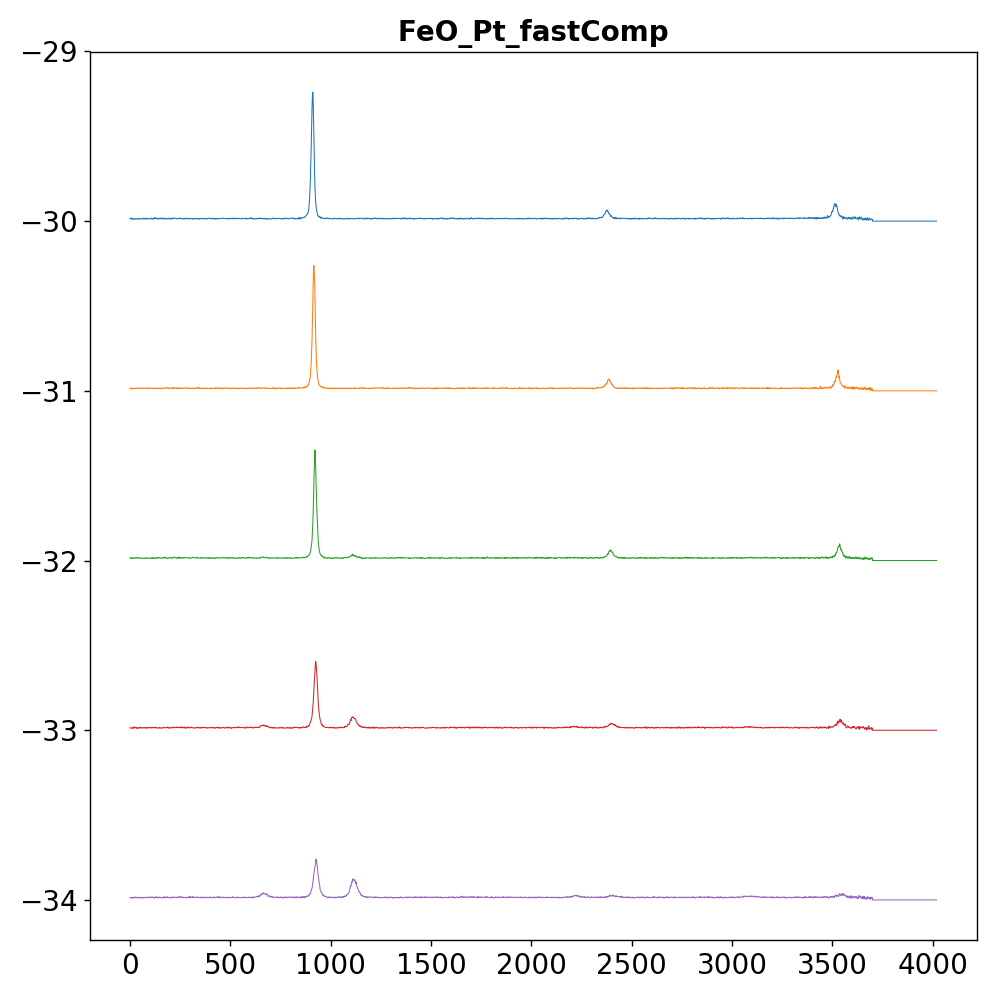

(4020,) (4020,)
(4020,) (4020,)
(4020,) (4020,)
(4020,) (4020,)
(4020,) (4020,)
1 39 15 0 24


In [129]:
# data for training
#plotting various plots to show development of bcc -> hcp transition
# plt.figure(figsize=(8,6))

plt.rc('xtick',labelsize=16)
plt.rc('ytick',labelsize=16)

# These are the colors that will be used in the plot
color_sequence = ['#1f77b4', '#aec7e8', '#ff7f0e', '#ffbb78', '#2ca02c',
                  '#98df8a', '#d62728', '#ff9896', '#9467bd', '#c5b0d5',
                  '#8c564b', '#c49c94', '#e377c2', '#f7b6d2', '#7f7f7f',
                  '#c7c7c7', '#bcbd22', '#dbdb8d', '#17becf', '#9edae5']


N = len(theta[0])

global Ci,Ci_0,div_num,gap #indicates num of curves, and curves of class0.
div_num = 102 #indicates the boundary of spectral curves. 102-120
Start_num = 0
End_num = angle_d4.shape[0]
print(End_num)
Trans_nS = 30 # phase transistion start number
Trans_nE = 35 # phase transistion end number
Phase_Transt = range(Trans_nS,Trans_nE)
gap = 2 
Class_bias =0

X_axis=[] # used to store data for 3D plotting

Extrm_I_d4 = [] # representative spectra for training
y_d4 = [] # label of the datasets

class0 = 0
class1 = 1
class2 = 2
# for n in range(0, 160):
for n in range(0, Slice_intensity_d4.shape[0]):
    Tranin_I = Slice_intensity_d4[n]
    Tranin_Theta = Slice_theta_d4[n]
    Ci = 0   # class 1
    Ci_0 = 0 # class 0
    Ci_1 = 0 # class 2
    
    X_1 = []# training: theta
    X_2_d4 = []# training: intensity
    
    for pct in range(0,Trans_nS-Class_bias,gap):  ### class 0, not phase transition
#         ax.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*1,lw=0.6)    
        Icorrect_t = Tranin_I[pct][0:N]
        theta_t = Tranin_Theta[pct][0:N]
        X_1.append(theta_t[0:N])
        X_2_d4.append(Icorrect_t[0:N])
        y_d4.append(class0)
        Ci_0 += 1
        
#     for pct in range(Trans_nS,Trans_nE):  ### class 1, phase transition
# #         ax.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*1,lw=0.6)    
#         Icorrect_t = Tranin_I[pct][0:N]
#         theta_t = Tranin_Theta[pct][0:N]
#         X_1.append(theta_t[0:N])
#         X_2_d4.append(Icorrect_t[0:N])
#         y_d4.append(class1)
#         Ci += 1
        
    for pct in range(Trans_nE + Class_bias,End_num,gap*2):  ### class 0, not phase transition
#         ax.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*1,lw=0.6)    
        Icorrect_t = Tranin_I[pct][0:N]
        theta_t = Tranin_Theta[pct][0:N]
        X_1.append(theta_t[0:N])
        X_2_d4.append(Icorrect_t[0:N])
        y_d4.append(class2)
        Ci_1 += 1
    X_2_d4 = np.array(X_2_d4)
    Extrm_I_d4.append(X_2_d4)

    
    
plt.figure(figsize=(8,8))
for pct in range(Trans_nS,Trans_nE):
    print(Tranin_Theta[pct].shape,Tranin_I[pct].shape)
#     plt.plot(Tranin_Theta[pct], Tranin_I[pct]-pct*1,lw=0.6)   
    plt.plot( Tranin_I[pct]-pct*1,lw=0.6)             
print(len(Extrm_I_d4),len(X_2_d4),Ci_0,Ci,Ci_1)

ax.set_ylabel('Intensity', fontsize = 16,)
ax.set_xlabel('Diffraction angle 2$\Theta$ (deg.)', fontsize = 16)
ax.set_xlim(9.5,26)
plt.title('FeO_Pt_fastComp', fontsize=16, fontweight='bold')
plt.tight_layout()

In [130]:
Slice_intensity_d4[0].shape

(130, 4020)

In [131]:
Slice_intensity_d4.shape

(1, 130, 4020)

<IPython.core.display.Javascript object>


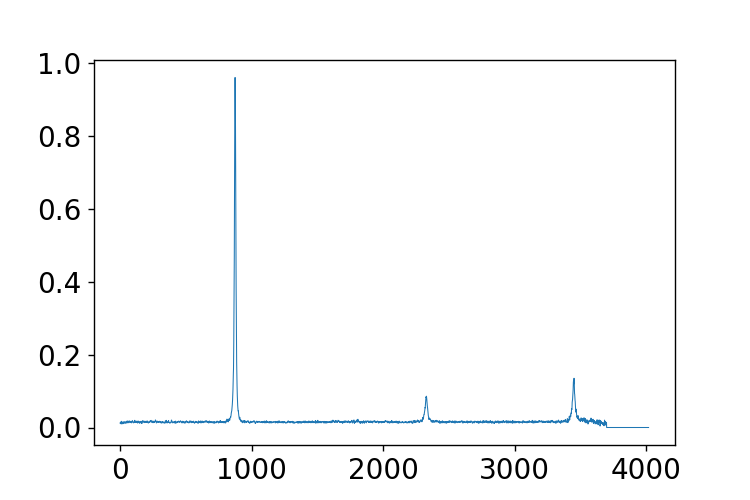

In [132]:
plt.figure(figsize=(6,4))
for pct in range(1):
    plt.plot(Slice_intensity_d4[pct][0],lw=0.6)      


In [133]:
len(Extrm_I_d4)

1

In [134]:
angle_d4.shape

intensity_d4.shape

(130, 3700)

In [135]:
angle_d4 = np.concatenate((angle_d4, np.zeros((intensity_d4.shape[0],N-intensity_d4.shape[1]))),-1)
intensity_d4 = np.concatenate((intensity_d4, np.zeros((intensity_d4.shape[0],N-intensity_d4.shape[1]))),-1)
print(angle_d4.shape,intensity_d4.shape )

(130, 4020) (130, 4020)


(130, 4020) (130, 4020)


<IPython.core.display.Javascript object>


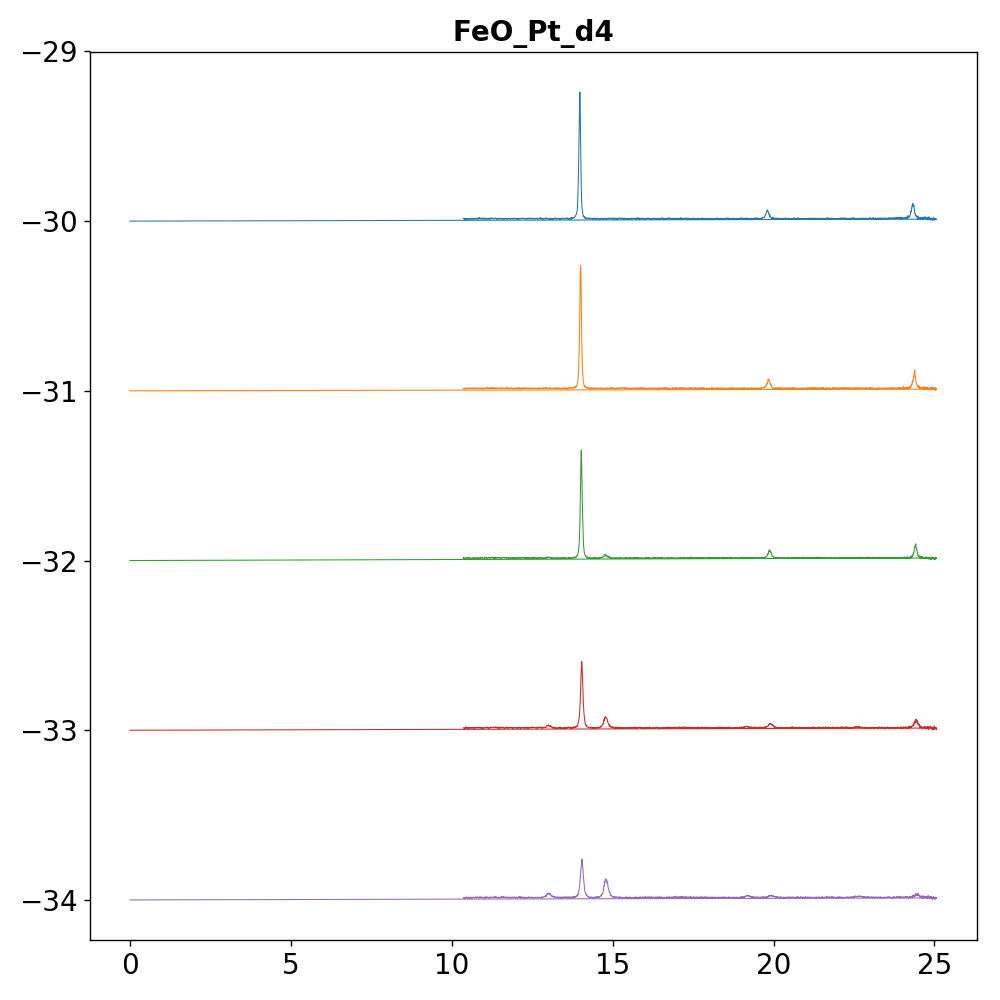

1 39 15 0 24


In [136]:
Tranin_I     = intensity_d4
Tranin_Theta = angle_d4
print(Tranin_I.shape,Tranin_Theta.shape)

plt.rc('xtick',labelsize=16)
plt.rc('ytick',labelsize=16)

# These are the colors that will be used in the plot
color_sequence = ['#1f77b4', '#aec7e8', '#ff7f0e', '#ffbb78', '#2ca02c',
                  '#98df8a', '#d62728', '#ff9896', '#9467bd', '#c5b0d5',
                  '#8c564b', '#c49c94', '#e377c2', '#f7b6d2', '#7f7f7f',
                  '#c7c7c7', '#bcbd22', '#dbdb8d', '#17becf', '#9edae5']


N = len(theta[0])

global Ci,Ci_0,div_num,gap #indicates num of curves, and curves of class0.
div_num = 102 #indicates the boundary of spectral curves. 102-120
Start_num = 0
End_num = intensity_d4.shape[0]
Trans_nS = 30 # phase transistion start number
Trans_nE = 35 # phase transistion end number
Phase_Transt = range(Trans_nS,Trans_nE)
gap = 2 
Class_bias =0

X_axis=[] # used to store data for 3D plotting

Extrm_I_orgd4 = [] # representative spectra for training
y_orgd4 = [] # label of the datasets
X_2_orgd4 = []# training: intensity
X_1 = []# training: theta

class0 = 0
class1 = 1
class2 = 2
# for n in range(0, 160):


Ci = 0   # class 1
Ci_0 = 0 # class 0
Ci_1 = 0 # class 2
    
    
for pct in range(0,Trans_nS-Class_bias,gap):  ### class 0, not phase transition
#         ax.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*1,lw=0.6)    
    Icorrect_t = Tranin_I[pct][0:N]
    theta_t = Tranin_Theta[pct][0:N]
    X_1.append(theta_t[0:N])
    X_2_orgd4.append(Icorrect_t[0:N])
    y_orgd4.append(class0)
    Ci_0 += 1
# for pct in range(Trans_nS,Trans_nE):  ### class 1, phase transition
# #         ax.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*1,lw=0.6)    
#     Icorrect_t = Tranin_I[pct][0:N]
#     theta_t = Tranin_Theta[pct][0:N]
#     X_1.append(theta_t[0:N])
#     X_2_orgd4.append(Icorrect_t[0:N])
#     y_orgd4.append(class1)
#     Ci += 1
for pct in range(Trans_nE + Class_bias,End_num,gap*2):  ### class 0, not phase transition
#         ax.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*1,lw=0.6)    
    Icorrect_t = Tranin_I[pct][0:N]
    theta_t = Tranin_Theta[pct][0:N]
    X_1.append(theta_t[0:N])
    X_2_orgd4.append(Icorrect_t[0:N])
    y_orgd4.append(class2)
    Ci_1 += 1
X_2_orgd4 = np.array(X_2_orgd4)
Extrm_I_orgd4.append(X_2_orgd4)


    
plt.figure(figsize=(8,8))
for pct in range(Trans_nS,Trans_nE):
    plt.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*1,lw=0.6)               
print(len(Extrm_I_orgd4),len(X_1),Ci_0,Ci,Ci_1)

ax.set_ylabel('Intensity', fontsize = 16,)
ax.set_xlabel('Diffraction angle 2$\Theta$ (deg.)', fontsize = 16)
ax.set_xlim(9.5,26)
plt.title('FeO_Pt_d4', fontsize=16, fontweight='bold')
plt.tight_layout()

In [137]:
X_2_orgd4.shape

(39, 4020)

### d1 dataset=Fe_load15_L2_XY==================

In [138]:
Slice_intensity_d1[-1]

array([[0.03031478, 0.02486803, 0.0419458 , ..., 0.        , 0.        ,
        0.        ],
       [0.02948977, 0.0094135 , 0.01848395, ..., 0.        , 0.        ,
        0.        ],
       [0.02915662, 0.02809745, 0.01974821, ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.0494205 , 0.05048829, 0.03711766, ..., 0.        , 0.        ,
        0.        ],
       [0.01442628, 0.01845366, 0.02118843, ..., 0.        , 0.        ,
        0.        ],
       [0.00718921, 0.0186688 , 0.03319355, ..., 0.        , 0.        ,
        0.        ]])

60


<IPython.core.display.Javascript object>


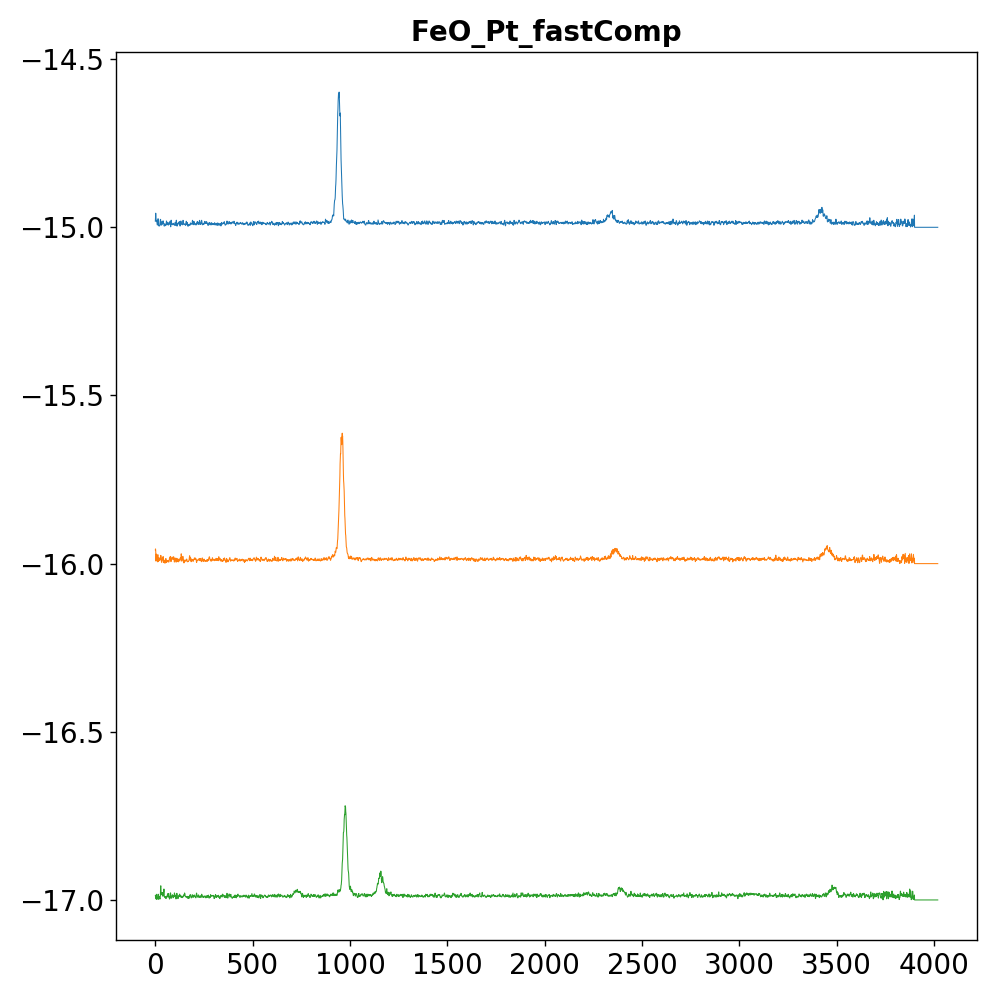

(4020,) (4020,)
(4020,) (4020,)
(4020,) (4020,)
1 36 15 0 21


In [139]:
# data for training
#plotting various plots to show development of bcc -> hcp transition
# plt.figure(figsize=(8,6))

plt.rc('xtick',labelsize=16)
plt.rc('ytick',labelsize=16)

# These are the colors that will be used in the plot
color_sequence = ['#1f77b4', '#aec7e8', '#ff7f0e', '#ffbb78', '#2ca02c',
                  '#98df8a', '#d62728', '#ff9896', '#9467bd', '#c5b0d5',
                  '#8c564b', '#c49c94', '#e377c2', '#f7b6d2', '#7f7f7f',
                  '#c7c7c7', '#bcbd22', '#dbdb8d', '#17becf', '#9edae5']


N = len(theta[0])

global Ci,Ci_0,div_num,gap #indicates num of curves, and curves of class0.
div_num = 102 #indicates the boundary of spectral curves. 102-120
Start_num = 0
End_num = angle_d1.shape[0]
print(End_num)
Trans_nS = 15 # phase transistion start number
Trans_nE = 18 # phase transistion end number
Phase_Transt = range(Trans_nS,Trans_nE)
gap = 1 
Class_bias =0

X_axis=[] # used to store data for 3D plotting

Extrm_I_d1 = [] # representative spectra for training
y_d1 = [] # label of the datasets

class0 = 0
class1 = 1
class2 = 2
# for n in range(0, 160):
for n in range(0, Slice_intensity_d1.shape[0]):
    Tranin_I = Slice_intensity_d1[n]
    Tranin_Theta = Slice_theta_d1[n]
    Ci = 0   # class 1
    Ci_0 = 0 # class 0
    Ci_1 = 0 # class 2
    
    X_1 = []# training: theta
    X_2_d1 = []# training: intensity
    
    for pct in range(0,Trans_nS-Class_bias,gap):  ### class 0, not phase transition
#         ax.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*1,lw=0.6)    
        Icorrect_t = Tranin_I[pct][0:N]
        theta_t = Tranin_Theta[pct][0:N]
        X_1.append(theta_t[0:N])
        X_2_d1.append(Icorrect_t[0:N])
        y_d1.append(class0)
        Ci_0 += 1
        
#     for pct in range(Trans_nS,Trans_nE):  ### class 1, phase transition
# #         ax.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*1,lw=0.6)    
#         Icorrect_t = Tranin_I[pct][0:N]
#         theta_t = Tranin_Theta[pct][0:N]
#         X_1.append(theta_t[0:N])
#         X_2_d4.append(Icorrect_t[0:N])
#         y_d4.append(class1)
#         Ci += 1
        
    for pct in range(Trans_nE + Class_bias,End_num,gap*2):  ### class 0, not phase transition
#         ax.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*1,lw=0.6)    
        Icorrect_t = Tranin_I[pct][0:N]
        theta_t = Tranin_Theta[pct][0:N]
        X_1.append(theta_t[0:N])
        X_2_d1.append(Icorrect_t[0:N])
        y_d1.append(class2)
        Ci_1 += 1
    X_2_d1 = np.array(X_2_d1)
    Extrm_I_d1.append(X_2_d1)

    
    
plt.figure(figsize=(8,8))
for pct in range(Trans_nS,Trans_nE):
    print(Tranin_Theta[pct].shape,Tranin_I[pct].shape)
#     plt.plot(Tranin_Theta[pct], Tranin_I[pct]-pct*1,lw=0.6)   
    plt.plot( Tranin_I[pct]-pct*1,lw=0.6)             
print(len(Extrm_I_d1),len(X_2_d1),Ci_0,Ci,Ci_1)

ax.set_ylabel('Intensity', fontsize = 16,)
ax.set_xlabel('Diffraction angle 2$\Theta$ (deg.)', fontsize = 16)
ax.set_xlim(9.5,26)
plt.title('FeO_Pt_fastComp', fontsize=16, fontweight='bold')
plt.tight_layout()

In [140]:
Slice_intensity_d1[0].shape

(60, 4020)

In [141]:
print(len(y_d1),y_d1)

36 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]


<IPython.core.display.Javascript object>


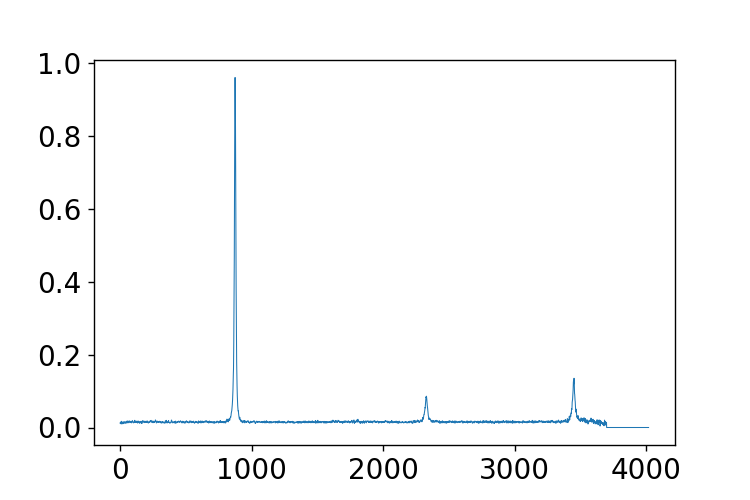

In [142]:
plt.figure(figsize=(6,4))
for pct in range(1):
    plt.plot(Slice_intensity_d4[pct][0],lw=0.6)      


In [143]:
len(Extrm_I_d1)

1

In [144]:
angle_d1.shape

intensity_d1.shape

(60, 3900)

In [145]:
angle_d1 = np.concatenate((angle_d1, np.zeros((intensity_d1.shape[0],N-intensity_d1.shape[1]))),-1)
intensity_d1 = np.concatenate((intensity_d1, np.zeros((intensity_d1.shape[0],N-intensity_d1.shape[1]))),-1)
print(angle_d1.shape,intensity_d1.shape )

(60, 4020) (60, 4020)


(60, 4020) (60, 4020)


<IPython.core.display.Javascript object>


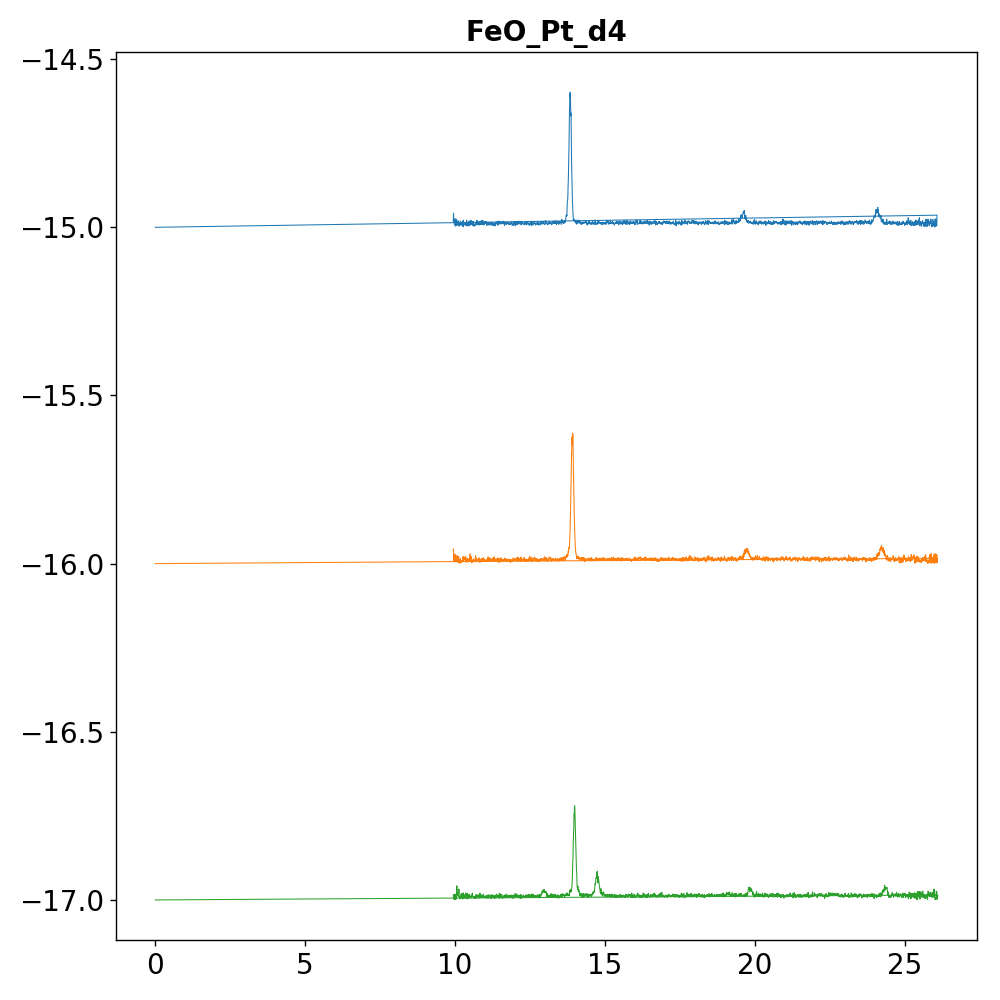

1 36 15 0 21


In [146]:
Tranin_I     = intensity_d1
Tranin_Theta = angle_d1
print(Tranin_I.shape,Tranin_Theta.shape)

plt.rc('xtick',labelsize=16)
plt.rc('ytick',labelsize=16)

# These are the colors that will be used in the plot
color_sequence = ['#1f77b4', '#aec7e8', '#ff7f0e', '#ffbb78', '#2ca02c',
                  '#98df8a', '#d62728', '#ff9896', '#9467bd', '#c5b0d5',
                  '#8c564b', '#c49c94', '#e377c2', '#f7b6d2', '#7f7f7f',
                  '#c7c7c7', '#bcbd22', '#dbdb8d', '#17becf', '#9edae5']


N = len(theta[0])

global Ci,Ci_0,div_num,gap #indicates num of curves, and curves of class0.
div_num = 102 #indicates the boundary of spectral curves. 102-120
Start_num = 0
End_num = intensity_d1.shape[0]
Trans_nS = 15 # phase transistion start number
Trans_nE = 18 # phase transistion end number
Phase_Transt = range(Trans_nS,Trans_nE)
gap = 1 
Class_bias =0

X_axis=[] # used to store data for 3D plotting

Extrm_I_orgd1 = [] # representative spectra for training
y_orgd1 = [] # label of the datasets
X_2_orgd1 = []# training: intensity
X_1 = []# training: theta

class0 = 0
class1 = 1
class2 = 2
# for n in range(0, 160):


Ci = 0   # class 1
Ci_0 = 0 # class 0
Ci_1 = 0 # class 2
    
    
for pct in range(0,Trans_nS-Class_bias,gap):  ### class 0, not phase transition
#         ax.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*1,lw=0.6)    
    Icorrect_t = Tranin_I[pct][0:N]
    theta_t = Tranin_Theta[pct][0:N]
    X_1.append(theta_t[0:N])
    X_2_orgd1.append(Icorrect_t[0:N])
    y_orgd1.append(class0)
    Ci_0 += 1
# for pct in range(Trans_nS,Trans_nE):  ### class 1, phase transition
# #         ax.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*1,lw=0.6)    
#     Icorrect_t = Tranin_I[pct][0:N]
#     theta_t = Tranin_Theta[pct][0:N]
#     X_1.append(theta_t[0:N])
#     X_2_orgd4.append(Icorrect_t[0:N])
#     y_orgd4.append(class1)
#     Ci += 1
for pct in range(Trans_nE + Class_bias,End_num,gap*2):  ### class 0, not phase transition
#         ax.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*1,lw=0.6)    
    Icorrect_t = Tranin_I[pct][0:N]
    theta_t = Tranin_Theta[pct][0:N]
    X_1.append(theta_t[0:N])
    X_2_orgd1.append(Icorrect_t[0:N])
    y_orgd1.append(class2)
    Ci_1 += 1
X_2_orgd1 = np.array(X_2_orgd1)
Extrm_I_orgd1.append(X_2_orgd1)


    
plt.figure(figsize=(8,8))
for pct in range(Trans_nS,Trans_nE):
    plt.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*1,lw=0.6)               
print(len(Extrm_I_orgd1),len(X_1),Ci_0,Ci,Ci_1)

ax.set_ylabel('Intensity', fontsize = 16,)
ax.set_xlabel('Diffraction angle 2$\Theta$ (deg.)', fontsize = 16)
ax.set_xlim(9.5,26)
plt.title('FeO_Pt_d4', fontsize=16, fontweight='bold')
plt.tight_layout()

In [147]:
print(len(y_orgd1),len(y_d1))

36 36


In [148]:
X_2_orgd1.shape

(36, 4020)

## Other datasets linear testing================================

## d2====Fe_load18_L2_XY

In [148]:
# show the number of XYfiles found in the directory
run_no = 0
fdir = '/home/sunyue/my_gpfs/Spectra_classification_Third_Paper/other_datasets/Fe_load18_L2_XY'
total_XYfiles = get_number_XYfiles(run_no,fdir)
print(total_XYfiles)
# total_XYfiles=350 #[Pt=1084, MgFeOB1_263]
print('The number of XYfiles within the chosen run is:', total_XYfiles)
%pwd


121
The number of XYfiles within the chosen run is: 121


'/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/other_datasets/Fe_load15_L2_XY'

In [149]:
%pwd

'/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/other_datasets/Fe_load15_L2_XY'

In [150]:
'''make sure that you have the right command directory selected'''
%cd /home/sunyue/my_gpfs/Spectra_classification_Third_Paper/other_datasets/Fe_load18_L2_XY
theta_d1 = [] 
I = []
baseline = []
Icorrect_d1 = []

test_y=total_XYfiles-2
for run_no in range(1,0+total_XYfiles-4): # The last 4 curves don't have enough points
#     fileNO = str(run_no).zfill(4) 
    fname = 'l2_fe_ramp_00001_m2_'+str(run_no).zfill(3)+'.xy'
    thetas, Is = np.loadtxt(fname, skiprows=25, unpack=True) # reads all files in range and assigns 1st column to thetas and 2nd to Is
    I.append(Is) # attaches a new array each time to a copy of previous, not really necessary here
    idx1 = 0
    idx2 = 3800
#background subtraction
#parameters lam and p have to be adjusted by hand!
#try 10**2 < lam < 10**9
#    0.001 <  p  < 0.1
    lam = 100000
    p = 0.002
    baselines = baseline_als(Is[idx1:idx2], lam, p)
    baseline.append(baselines)
    
    Icorrected = Is[idx1:idx2] 
    Icorrect_d1.append(Icorrected)
#     Icorrected = Is[idx1:idx2] - baselines

#    if (run_no==15): 
#        print(thetas.size, Is.shape,type(I),np.shape(I),len(Icorrected),len(baselines),sep='\n')
    thetas = thetas[idx1:idx2]
    theta_d1.append(thetas)

/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/other_datasets/Fe_load18_L2_XY


In [151]:
Icorrect_d1 = (Icorrect_d1-np.amin(Icorrect_d1))/(np.amax(Icorrect_d1)-np.amin(Icorrect_d1))
print(Icorrect_d1.max(),Icorrect_d1.min())

1.0 0.0


In [152]:
len(theta_d1)

116

In [153]:
theta_d1[-1].shape

(3800,)

In [154]:

angle_d2     = np.asarray(theta_d1)
intensity_d2 = np.asarray(Icorrect_d1)
print(angle_d2.shape, intensity_d2.shape)
fig, ax = plt.subplots(figsize=(6,4))

H_value   = np.max(intensity_d2)
L_value   = np.min(intensity_d2)
print(H_value)
x_vals    = angle_d2[0] # all the spectral curves have the same x-axis, called the 
y_vals    = np.arange(0,len(angle_d2))
X, Y      = np.meshgrid(x_vals, y_vals)

Z         = intensity_d2
level_n   = 100
cp        = plt.contourf(X, Y, Z,levels=level_n,vmin = L_value, vmax = H_value,cmap=cm.jet)
plt.ylabel('Spectra curve number')
plt.xlabel('Diffraction angle_d2 2$\Theta$ (deg.)')


ax.invert_yaxis()  # labels read top-to-bottom
ax.set_ylim((len(angle_d2)-1), 0)

# ==================method 3===================
cbar = fig.colorbar(cp)
cbar.ax.set_ylabel('intensity_d2 value')


plt.title('intensity_d2 distribution along angle_d2 2$\Theta$ (deg.) ')


plt.tight_layout()
plt.savefig(save_figures_to+"Spectra_dataset2_intensity_d2 distribution.png", bbox_inches='tight', dpi=400)

(116, 3800) (116, 3800)


<IPython.core.display.Javascript object>

1.0


## d3=====Fe_r1_11112019_L2_XY

In [155]:
# show the number of XYfiles found in the directory
run_no = 0
fdir = '/home/sunyue/my_gpfs/Spectra_classification_Third_Paper/other_datasets/Fe_r1_11112019_L2_XY'
total_XYfiles = get_number_XYfiles(run_no,fdir)
print(total_XYfiles)
# total_XYfiles=350 #[Pt=1084, MgFeOB1_263]
print('The number of XYfiles within the chosen run is:', total_XYfiles)
%pwd



71
The number of XYfiles within the chosen run is: 71


'/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/other_datasets/Fe_load18_L2_XY'

In [156]:
%pwd

'/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/other_datasets/Fe_load18_L2_XY'

In [157]:
'''make sure that you have the right command directory selected'''
%cd /home/sunyue/my_gpfs/Spectra_classification_Third_Paper/other_datasets/Fe_r1_11112019_L2_XY
theta_d1 = [] 
I = []
baseline = []
Icorrect_d1 = []

test_y=total_XYfiles-2
for run_no in range(1,0+total_XYfiles):
#     fileNO = str(run_no).zfill(4) 
    fname = 'l2_fe300culet_ramp1_00001_m1_'+str(run_no).zfill(2)+'.xy'
    thetas, Is = np.loadtxt(fname, skiprows=25, unpack=True) # reads all files in range and assigns 1st column to thetas and 2nd to Is
    I.append(Is) # attaches a new array each time to a copy of previous, not really necessary here
    idx1 = 0
    idx2 = 4000
#background subtraction
#parameters lam and p have to be adjusted by hand!
#try 10**2 < lam < 10**9
#    0.001 <  p  < 0.1
    lam =  100# 100000
    p = 0.002
    baselines = baseline_als(Is[idx1:idx2], lam, p)
    baseline.append(baselines)
    
    Icorrected = Is[idx1:idx2] 
#     Icorrected = Is[idx1:idx2] - baselines
    Icorrect_d1.append(Icorrected)

#    if (run_no==15): 
#        print(thetas.size, Is.shape,type(I),np.shape(I),len(Icorrected),len(baselines),sep='\n')
    thetas = thetas[idx1:idx2]
    theta_d1.append(thetas)

/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/other_datasets/Fe_r1_11112019_L2_XY


In [158]:
Icorrect_d1 = (Icorrect_d1-np.amin(Icorrect_d1))/(np.amax(Icorrect_d1)-np.amin(Icorrect_d1))
print(Icorrect_d1.max(),Icorrect_d1.min())

1.0 0.0


In [159]:
len(theta_d1)

70

In [160]:
theta_d1[0].shape

(4000,)

In [161]:

angle_d3     = np.asarray(theta_d1)
intensity_d3 = np.asarray(Icorrect_d1)
print(angle_d3.shape, intensity_d3.shape)
fig, ax = plt.subplots(figsize=(8,6))

H_value   = np.max(intensity_d3)
L_value   = np.min(intensity_d3)
print(H_value)
x_vals    = angle_d3[0] # all the spectral curves have the same x-axis, called the 
y_vals    = np.arange(0,len(angle_d3))
X, Y      = np.meshgrid(x_vals, y_vals)

Z         = intensity_d3
level_n   = 100
cp        = plt.contourf(X, Y, Z,levels=level_n,vmin = L_value, vmax = H_value,cmap=cm.jet)
plt.ylabel('Spectra curve number')
plt.xlabel('Diffraction angle_d3 2$\Theta$ (deg.)')


ax.invert_yaxis()  # labels read top-to-bottom
ax.set_ylim((len(angle_d3)-1), 0)

# ==================method 3===================
cbar = fig.colorbar(cp)
cbar.ax.set_ylabel('intensity_d3 value')


plt.title('intensity_d3 distribution along angle_d3 2$\Theta$ (deg.) ')


plt.tight_layout()
plt.savefig(save_figures_to+"Spectra_dataset3_intensity distribution.png", bbox_inches='tight', dpi=400)

(70, 4000) (70, 4000)


<IPython.core.display.Javascript object>

1.0


## d5=====Fe_r3_11112019_L2_XY

In [162]:
# show the number of XYfiles found in the directory
run_no = 0
fdir = '/home/sunyue/my_gpfs/Spectra_classification_Third_Paper/other_datasets/Fe_r3_11112019_L2_XY'
total_XYfiles = get_number_XYfiles(run_no,fdir)
print(total_XYfiles)
# total_XYfiles=350 #[Pt=1084, MgFeOB1_263]
print('The number of XYfiles within the chosen run is:', total_XYfiles)
%pwd



131
The number of XYfiles within the chosen run is: 131


'/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/other_datasets/Fe_r1_11112019_L2_XY'

In [163]:
%pwd

'/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/other_datasets/Fe_r1_11112019_L2_XY'

In [164]:
'''make sure that you have the right command directory selected'''
%cd /home/sunyue/my_gpfs/Spectra_classification_Third_Paper/other_datasets/Fe_r3_11112019_L2_XY
theta_d1 = [] 
I = []
baseline = []
Icorrect_d1 = []

test_y=total_XYfiles-2
for run_no in range(1,0+total_XYfiles):
#     fileNO = str(run_no).zfill(4) 
    fname = 'l2_fe300culet3_ramp_00001_m1_'+str(run_no).zfill(3)+'.xy'
    thetas, Is = np.loadtxt(fname, skiprows=25, unpack=True) # reads all files in range and assigns 1st column to thetas and 2nd to Is
    I.append(Is) # attaches a new array each time to a copy of previous, not really necessary here
    idx1 = 0
    idx2 = 4000
#background subtraction
#parameters lam and p have to be adjusted by hand!
#try 10**2 < lam < 10**9
#    0.001 <  p  < 0.1
    lam = 100000
    p = 0.002
    baselines = baseline_als(Is[idx1:idx2], lam, p)
    baseline.append(baselines)
    
    Icorrected = Is[idx1:idx2] 
    Icorrect_d1.append(Icorrected)
#     Icorrected = Is[idx1:idx2] - baselines

#    if (run_no==15): 
#        print(thetas.size, Is.shape,type(I),np.shape(I),len(Icorrected),len(baselines),sep='\n')
    thetas = thetas[idx1:idx2]
    theta_d1.append(thetas)

/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/other_datasets/Fe_r3_11112019_L2_XY


In [165]:
Icorrect_d1 = (Icorrect_d1-np.amin(Icorrect_d1))/(np.amax(Icorrect_d1)-np.amin(Icorrect_d1))
print(Icorrect_d1.max(),Icorrect_d1.min())

1.0 0.0


In [166]:
len(theta_d1)

130

In [167]:
theta_d1[0].shape

(4000,)

In [168]:

angle_d5     = np.asarray(theta_d1)
intensity_d5 = np.asarray(Icorrect_d1)
print(angle_d5.shape, intensity_d5.shape)
fig, ax = plt.subplots(figsize=(6,4))

H_value   = np.max(intensity_d5)
L_value   = np.min(intensity_d5)
print(H_value)
x_vals    = angle_d5[0] # all the spectral curves have the same x-axis, called the 
y_vals    = np.arange(0,len(angle_d5))
X, Y      = np.meshgrid(x_vals, y_vals)

Z         = intensity_d5
level_n   = 100
cp        = plt.contourf(X, Y, Z,levels=level_n,vmin = L_value, vmax = H_value,cmap=cm.jet)
plt.ylabel('Spectra curve number')
plt.xlabel('Diffraction angle_d5 2$\Theta$ (deg.)')


ax.invert_yaxis()  # labels read top-to-bottom
ax.set_ylim((len(angle_d5)-1), 0)

# ==================method 3===================
cbar = fig.colorbar(cp)
cbar.ax.set_ylabel('intensity_d5 value')


plt.title('intensity_d5 distribution along angle_d5 2$\Theta$ (deg.) ')


plt.tight_layout()
plt.savefig(save_figures_to+"Spectra_dataset5_intensity distribution.png", bbox_inches='tight', dpi=400)

(130, 4000) (130, 4000)


<IPython.core.display.Javascript object>

1.0


In [169]:

Org_angle_d5    = angle_d5
Org_intensity_d5 = intensity_d5

In [170]:
# d5_max = np.amax(intensity_d5, axis=1)
# print(d5_max)
# d5_min = np.amin(intensity_d5, axis=1)
# print(d5_min)
intensity_d5 = (intensity_d5-np.amin(intensity_d5))/(np.amax(intensity_d5)-np.amin(intensity_d5))
print(intensity_d5.max(),intensity_d5.min())

1.0 0.0


In [171]:

# angle_d5     = np.asarray(theta_d1)
# intensity_d5 = np.asarray(Icorrect_d1)
print(angle_d5.shape, intensity_d5.shape)
fig, ax = plt.subplots(figsize=(6,4))

H_value   = np.max(intensity_d5)
L_value   = np.min(intensity_d5)
print(H_value)
x_vals    = angle_d5[0] # all the spectral curves have the same x-axis, called the 
y_vals    = np.arange(0,len(angle_d5))
X, Y      = np.meshgrid(x_vals, y_vals)

Z         = intensity_d5
level_n   = 100
cp        = plt.contourf(X, Y, Z,levels=level_n,vmin = L_value, vmax = H_value,cmap=cm.jet)
plt.ylabel('Spectra curve number')
plt.xlabel('Diffraction angle_d5 2$\Theta$ (deg.)')


ax.invert_yaxis()  # labels read top-to-bottom
ax.set_ylim((len(angle_d5)-1), 0)

# ==================method 3===================
cbar = fig.colorbar(cp)
cbar.ax.set_ylabel('intensity_d5 value')


plt.title('intensity_d5 distribution along angle_d5 2$\Theta$ (deg.) ')


plt.tight_layout()
plt.savefig(save_figures_to+"Spectra_dataset5_intensity distribution.png", bbox_inches='tight', dpi=400)

(130, 4000) (130, 4000)


<IPython.core.display.Javascript object>

1.0


In [172]:
angle_d5 = np.concatenate((angle_d5, np.zeros((intensity_d5.shape[0],N-intensity_d5.shape[1]))),-1)
intensity_d5 = np.concatenate((intensity_d5, np.zeros((intensity_d5.shape[0],N-intensity_d5.shape[1]))),-1)
print(angle_d5.shape,intensity_d5.shape )

(130, 4020) (130, 4020)


In [173]:

Tranin_I     = intensity_d5
Tranin_Theta = angle_d5
print(Tranin_I.shape,Tranin_Theta.shape)

plt.rc('xtick',labelsize=16)
plt.rc('ytick',labelsize=16)

# These are the colors that will be used in the plot
color_sequence = ['#1f77b4', '#aec7e8', '#ff7f0e', '#ffbb78', '#2ca02c',
                  '#98df8a', '#d62728', '#ff9896', '#9467bd', '#c5b0d5',
                  '#8c564b', '#c49c94', '#e377c2', '#f7b6d2', '#7f7f7f',
                  '#c7c7c7', '#bcbd22', '#dbdb8d', '#17becf', '#9edae5']


N = len(theta[0])

global Ci,Ci_0,div_num,gap #indicates num of curves, and curves of class0.
div_num = 102 #indicates the boundary of spectral curves. 102-120
Start_num = 0
End_num = intensity_d5.shape[0]
Trans_nS = 30 # phase transistion start number
Trans_nE = 40 # phase transistion end number
Phase_Transt = range(Trans_nS,Trans_nE)
gap = 2 
Class_bias =0

X_axis=[] # used to store data for 3D plotting

Extrm_I_orgd5 = [] # representative spectra for training
y_orgd5 = [] # label of the datasets
X_2_orgd5 = []# training: intensity
X_1 = []# training: theta

class0 = 0
class1 = 1
class2 = 2
# for n in range(0, 160):


Ci = 0   # class 1
Ci_0 = 0 # class 0
Ci_1 = 0 # class 2
    
    
for pct in range(0,Trans_nS-Class_bias,gap):  ### class 0, not phase transition
#         ax.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*1,lw=0.6)    
    Icorrect_t = Tranin_I[pct][0:N]
    theta_t = Tranin_Theta[pct][0:N]
    X_1.append(theta_t[0:N])
    X_2_orgd5.append(Icorrect_t[0:N])
    y_orgd5.append(class0)
    Ci_0 += 1
# for pct in range(Trans_nS,Trans_nE):  ### class 1, phase transition
# #         ax.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*1,lw=0.6)    
#     Icorrect_t = Tranin_I[pct][0:N]
#     theta_t = Tranin_Theta[pct][0:N]
#     X_1.append(theta_t[0:N])
#     X_2_orgd5.append(Icorrect_t[0:N])
#     y_orgd5.append(class1)
#     Ci += 1
for pct in range(Trans_nE + Class_bias,End_num,gap*2):  ### class 0, not phase transition
#         ax.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*1,lw=0.6)    
    Icorrect_t = Tranin_I[pct][0:N]
    theta_t = Tranin_Theta[pct][0:N]
    X_1.append(theta_t[0:N])
    X_2_orgd5.append(Icorrect_t[0:N])
    y_orgd5.append(class2)
    Ci_1 += 1
X_2_orgd5 = np.array(X_2_orgd5)
Extrm_I_orgd5.append(X_2_orgd5)


 
plt.figure(figsize=(6,4))
for pct in range(Trans_nS,Trans_nE):
    plt.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*1,lw=0.6)               
print(len(Extrm_I_orgd5),len(X_1),Ci_0,Ci,Ci_1)

ax.set_ylabel('Intensity', fontsize = 16,)
ax.set_xlabel('Diffraction angle 2$\Theta$ (deg.)', fontsize = 16)
ax.set_xlim(9.5,26)
plt.title('FeO_Pt_d4', fontsize=16, fontweight='bold')
plt.tight_layout()

(130, 4020) (130, 4020)


<IPython.core.display.Javascript object>

1 38 15 0 23


In [174]:
X_2_orgd5.shape

(38, 4020)

In [175]:
np.amax(X_2_orgd5)

0.9189670839299516

In [176]:
Extrm_I_orgd5[0].shape

(38, 4020)

## FePt_load8_L2_XY====d6

In [177]:
# show the number of XYfiles found in the directory
run_no = 0
fdir = '/home/sunyue/my_gpfs/Spectra_classification_Third_Paper/other_datasets/FePt_load8_L2_XY'
total_XYfiles = get_number_XYfiles(run_no,fdir)
print(total_XYfiles)
# total_XYfiles=350 #[Pt=1084, MgFeOB1_263]
print('The number of XYfiles within the chosen run is:', total_XYfiles)
%pwd

71
The number of XYfiles within the chosen run is: 71


'/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/other_datasets/Fe_r3_11112019_L2_XY'

In [178]:
%pwd

'/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/other_datasets/Fe_r3_11112019_L2_XY'

In [179]:
'''make sure that you have the right command directory selected'''
%cd /home/sunyue/my_gpfs/Spectra_classification_Third_Paper/other_datasets/FePt_load8_L2_XY
theta_d1 = [] 
I = []
baseline = []
Icorrect_d1 = []

test_y=total_XYfiles-2
for run_no in range(1,0+total_XYfiles):
#     fileNO = str(run_no).zfill(4) 
    fname = 'l2_fept_300_ramp_00001_m1_'+str(run_no).zfill(2)+'.xy'
    thetas, Is = np.loadtxt(fname, skiprows=25, unpack=True) # reads all files in range and assigns 1st column to thetas and 2nd to Is
    I.append(Is) # attaches a new array each time to a copy of previous, not really necessary here
    idx1 = 0
    idx2 = 4000
#background subtraction
#parameters lam and p have to be adjusted by hand!
#try 10**2 < lam < 10**9
#    0.001 <  p  < 0.1
    lam = 100000
    p = 0.002
    baselines = baseline_als(Is[idx1:idx2], lam, p)
    baseline.append(baselines)
    
    Icorrected = Is[idx1:idx2] 
    Icorrect_d1.append(Icorrected)
#     Icorrected = Is[idx1:idx2] - baselines

#    if (run_no==15): 
#        print(thetas.size, Is.shape,type(I),np.shape(I),len(Icorrected),len(baselines),sep='\n')
    thetas = thetas[idx1:idx2]
    theta_d1.append(thetas)

/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/other_datasets/FePt_load8_L2_XY


In [180]:
Icorrect_d1 = (Icorrect_d1-np.amin(Icorrect_d1))/(np.amax(Icorrect_d1)-np.amin(Icorrect_d1))
print(Icorrect_d1.max(),Icorrect_d1.min())

1.0 0.0


In [181]:
len(theta_d1)

70

In [182]:
theta_d1[0].shape

(4000,)

In [183]:

angle_d6     = np.asarray(theta_d1)
intensity_d6 = np.asarray(Icorrect_d1)
print(angle_d6.shape, intensity_d6.shape)
fig, ax = plt.subplots(figsize=(6,4))

H_value   = np.max(intensity_d6)
L_value   = np.min(intensity_d6)
print(H_value)
x_vals    = angle_d6[0] # all the spectral curves have the same x-axis, called the 
y_vals    = np.arange(0,len(angle_d6))
X, Y      = np.meshgrid(x_vals, y_vals)

Z         = intensity_d6
level_n   = 100
cp        = plt.contourf(X, Y, Z,levels=level_n,vmin = L_value, vmax = H_value,cmap=cm.jet)
plt.ylabel('Spectra curve number')
plt.xlabel('Diffraction angle_d6 2$\Theta$ (deg.)')


ax.invert_yaxis()  # labels read top-to-bottom
ax.set_ylim((len(angle_d6)-1), 0)

# ==================method 3===================
cbar = fig.colorbar(cp)
cbar.ax.set_ylabel('intensity_d6 value')


plt.title('intensity_d6 distribution along angle_d6 2$\Theta$ (deg.) ')


plt.tight_layout()
plt.savefig(save_figures_to+"Spectra_dataset6_intensity distribution.png", bbox_inches='tight', dpi=400)

(70, 4000) (70, 4000)


<IPython.core.display.Javascript object>

1.0


In [184]:

Tranin_I     = intensity_d6
Tranin_Theta = angle_d6
print(Tranin_I.shape,Tranin_Theta.shape)

plt.rc('xtick',labelsize=16)
plt.rc('ytick',labelsize=16)

# These are the colors that will be used in the plot
color_sequence = ['#1f77b4', '#aec7e8', '#ff7f0e', '#ffbb78', '#2ca02c',
                  '#98df8a', '#d62728', '#ff9896', '#9467bd', '#c5b0d5',
                  '#8c564b', '#c49c94', '#e377c2', '#f7b6d2', '#7f7f7f',
                  '#c7c7c7', '#bcbd22', '#dbdb8d', '#17becf', '#9edae5']


N = len(Tranin_I[0])


Trans_nS = 5 # phase transistion start number
Trans_nE = 35 # phase transistion end number
Phase_Transt = range(Trans_nS,Trans_nE)
gap = 2 
Class_bias =0

 
plt.figure(figsize=(8,8))
for pct in range(Trans_nS,Trans_nE):
    plt.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*0.3,lw=0.6)     
    
    plt.text(Tranin_Theta[pct][int(N/2)], Tranin_I[pct][int(N/2)]-pct*0.3, "{}".format(pct) )          

ax.set_ylabel('Intensity', fontsize = 16,)
ax.set_xlabel('Diffraction angle 2$\Theta$ (deg.)', fontsize = 16)
ax.set_xlim(9.5,26)
plt.title('FeO_Pt_d6', fontsize=16, fontweight='bold')
plt.tight_layout()

(70, 4000) (70, 4000)


<IPython.core.display.Javascript object>

In [185]:

# intensity_d6 = (intensity_d6-np.amin(intensity_d6))/(np.amax(intensity_d6)-np.amin(intensity_d6))
# print(intensity_d6.max(),intensity_d6.min())

# # angle_d6 = np.concatenate((angle_d6, np.zeros((intensity_d6.shape[0],N-intensity_d6.shape[1]))),-1)
# # intensity_d6 = np.concatenate((intensity_d6, np.zeros((intensity_d6.shape[0],N-intensity_d6.shape[1]))),-1)
# print(angle_d6.shape,intensity_d6.shape )

In [186]:
# embedding_dim =intensity_d6.shape[1]
# print(embedding_dim)
# layer_norm = nn.LayerNorm(embedding_dim)
# idata = torch.from_numpy(intensity_d6).float()
# ttyue= layer_norm(idata)
# ttyue = (ttyue).detach().numpy()
# print(ttyue.shape)

# tt1 = (intensity_d6-np.amin(intensity_d6))/(np.amax(intensity_d6)-np.amin(intensity_d6))
# a = 2*torch.ones_like(idata[0:1,])
# a[0,0]=-3
# print(tt1.max(),tt1.min())

# import torch.nn.functional as F
# tt = F.normalize(torch.cat((idata, a), 0) ,p=2,dim=1)
# # tt = F.normalize(idata ,p=2,dim=1)
# tt = (tt).detach().numpy()*10
# print(np.amax(ttyue),np.amin(ttyue))
# print(np.amax(tt),np.amin(tt))
# tt[-1,:]

In [187]:

# print(np.amax(intensity_d6),np.amin(intensity_d6))

In [188]:
# Tranin_I     = intensity_d6
# Tranin_Theta = angle_d6
# print(Tranin_I.shape,Tranin_Theta.shape)

# plt.rc('xtick',labelsize=16)
# plt.rc('ytick',labelsize=16)

# # These are the colors that will be used in the plot
# color_sequence = ['#1f77b4', '#aec7e8', '#ff7f0e', '#ffbb78', '#2ca02c',
#                   '#98df8a', '#d62728', '#ff9896', '#9467bd', '#c5b0d5',
#                   '#8c564b', '#c49c94', '#e377c2', '#f7b6d2', '#7f7f7f',
#                   '#c7c7c7', '#bcbd22', '#dbdb8d', '#17becf', '#9edae5']


# N = len(theta[0])

# global Ci,Ci_0,div_num,gap #indicates num of curves, and curves of class0.
# div_num = 102 #indicates the boundary of spectral curves. 102-120
# Start_num = 0
# End_num = intensity_d6.shape[0]
# Trans_nS = 20 # phase transistion start number
# Trans_nE = 25 # phase transistion end number
# Phase_Transt = range(Trans_nS,Trans_nE)
# gap = 2 
# Class_bias =0

# X_axis=[] # used to store data for 3D plotting

# Extrm_I_orgd6 = [] # representative spectra for training
# y_orgd6 = [] # label of the datasets
# X_2_orgd6 = []# training: intensity
# X_1 = []# training: theta

# class0 = 0
# class1 = 1
# class2 = 2
# # for n in range(0, 160):


# Ci = 0   # class 1
# Ci_0 = 0 # class 0
# Ci_1 = 0 # class 2
    
    
# for pct in range(0,Trans_nS-Class_bias,gap):  ### class 0, not phase transition
# #         ax.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*1,lw=0.6)    
#     Icorrect_t = Tranin_I[pct][0:N]
#     theta_t = Tranin_Theta[pct][0:N]
#     X_1.append(theta_t[0:N])
#     X_2_orgd6.append(Icorrect_t[0:N])
#     y_orgd6.append(class0)
#     Ci_0 += 1
# # for pct in range(Trans_nS,Trans_nE):  ### class 1, phase transition
# # #         ax.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*1,lw=0.6)    
# #     Icorrect_t = Tranin_I[pct][0:N]
# #     theta_t = Tranin_Theta[pct][0:N]
# #     X_1.append(theta_t[0:N])
# #     X_2_orgd6.append(Icorrect_t[0:N])
# #     y_orgd6.append(class1)
# #     Ci += 1
# for pct in range(Trans_nE + Class_bias,End_num,gap*2):  ### class 0, not phase transition
# #         ax.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*1,lw=0.6)    
#     Icorrect_t = Tranin_I[pct][0:N]
#     theta_t = Tranin_Theta[pct][0:N]
#     X_1.append(theta_t[0:N])
#     X_2_orgd6.append(Icorrect_t[0:N])
#     y_orgd6.append(class2)
#     Ci_1 += 1
# X_2_orgd6 = np.array(X_2_orgd6)
# Extrm_I_orgd6.append(X_2_orgd6)


 
# plt.figure(figsize=(6,4))
# for pct in range(Trans_nS,Trans_nE):
#     plt.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*1,lw=0.6)               
# print(len(Extrm_I_orgd6),len(X_1),Ci_0,Ci,Ci_1)

# ax.set_ylabel('Intensity', fontsize = 16,)
# ax.set_xlabel('Diffraction angle 2$\Theta$ (deg.)', fontsize = 16)
# ax.set_xlim(9.5,26)
# plt.title('FeO_Pt_d4', fontsize=16, fontweight='bold')
# plt.tight_layout()

In [189]:

# fig, ax = plt.subplots(figsize=(6,4))

# H_value   = np.max(intensity_d6)
# L_value   = np.min(intensity_d6)
# print(H_value)
# x_vals    = angle_d6[0] # all the spectral curves have the same x-axis, called the 
# y_vals    = np.arange(0,len(angle_d6))
# X, Y      = np.meshgrid(x_vals, y_vals)

# Z         = intensity_d6
# level_n   = 100
# cp        = plt.contourf(X, Y, Z,levels=level_n,vmin = L_value, vmax = H_value,cmap=cm.jet)
# plt.ylabel('Spectra curve number')
# plt.xlabel('Diffraction angle_d6 2$\Theta$ (deg.)')


# ax.invert_yaxis()  # labels read top-to-bottom
# ax.set_ylim((len(angle_d6)-1), 0)

# # ==================method 3===================
# cbar = fig.colorbar(cp)
# cbar.ax.set_ylabel('intensity_d6 value')


# plt.title('intensity_d6 distribution along angle_d6 2$\Theta$ (deg.) ')


# plt.tight_layout()
# plt.savefig(save_figures_to+"Spectra_dataset6_intensity distribution.png", bbox_inches='tight', dpi=400)

## FePtNe_load2_L2_XY=== d7

In [190]:
# show the number of XYfiles found in the directory
run_no = 0
fdir = '/home/sunyue/my_gpfs/Spectra_classification_Third_Paper/other_datasets/FePtNe_load2_L2_XY'
total_XYfiles = get_number_XYfiles(run_no,fdir)
print(total_XYfiles)
# total_XYfiles=350 #[Pt=1084, MgFeOB1_263]
print('The number of XYfiles within the chosen run is:', total_XYfiles)
%pwd



261
The number of XYfiles within the chosen run is: 261


'/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/other_datasets/FePt_load8_L2_XY'

In [191]:
%pwd

'/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/other_datasets/FePt_load8_L2_XY'

In [192]:
'''make sure that you have the right command directory selected'''
%cd /home/sunyue/my_gpfs/Spectra_classification_Third_Paper/other_datasets/FePtNe_load2_L2_XY
theta_d1 = [] 
I = []
baseline = []
Icorrect_d1 = []

test_y=total_XYfiles-2
for run_no in range(1,0+test_y):
#     fileNO = str(run_no).zfill(4) 
    fname = 'l2_feptne200r1_00001_m1_'+str(run_no).zfill(3)+'.xy'
    thetas, Is = np.loadtxt(fname, skiprows=25, unpack=True) # reads all files in range and assigns 1st column to thetas and 2nd to Is
    I.append(Is) # attaches a new array each time to a copy of previous, not really necessary here
    idx1 = 0
    idx2 = 4000
#background subtraction
#parameters lam and p have to be adjusted by hand!
#try 10**2 < lam < 10**9
#    0.001 <  p  < 0.1
    lam = 100000
    p = 0.002
    baselines = baseline_als(Is[idx1:idx2], lam, p)
    baseline.append(baselines)
    
    Icorrected = Is[idx1:idx2] 
    Icorrect_d1.append(Icorrected)
#     Icorrected = Is[idx1:idx2] - baselines

#    if (run_no==15): 
#        print(thetas.size, Is.shape,type(I),np.shape(I),len(Icorrected),len(baselines),sep='\n')
    thetas = thetas[idx1:idx2]
    theta_d1.append(thetas)

/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/other_datasets/FePtNe_load2_L2_XY


In [193]:
Icorrect_d1 = (Icorrect_d1-np.amin(Icorrect_d1))/(np.amax(Icorrect_d1)-np.amin(Icorrect_d1))
print(Icorrect_d1.max(),Icorrect_d1.min())

1.0 0.0


In [194]:
len(theta_d1)

258

In [195]:
theta_d1[0].shape

(4000,)

In [196]:

angle_d7     = np.asarray(theta_d1)
intensity_d7 = np.asarray(Icorrect_d1)
print(angle_d7.shape, intensity_d7.shape)
fig, ax = plt.subplots(figsize=(8,6))

H_value   = np.max(intensity_d7)
L_value   = np.min(intensity_d7)
print(H_value)
x_vals    = angle_d7[0] # all the spectral curves have the same x-axis, called the 
y_vals    = np.arange(0,len(angle_d7))
X, Y      = np.meshgrid(x_vals, y_vals)

Z         = intensity_d7
level_n   = 100
cp        = plt.contourf(X, Y, Z,levels=level_n,vmin = L_value, vmax = H_value,cmap=cm.jet)
plt.ylabel('Spectra curve number')
plt.xlabel('Diffraction angle_d7 2$\Theta$ (deg.)')


ax.invert_yaxis()  # labels read top-to-bottom
ax.set_ylim((len(angle_d7)-1), 0)

# ==================method 3===================
cbar = fig.colorbar(cp)
cbar.ax.set_ylabel('intensity value')


plt.title('intensity_d7 distribution along angle_d7 2$\Theta$ (deg.) ')


plt.tight_layout()
plt.savefig(save_figures_to+"Spectra_dataset7_intensity distribution.png", bbox_inches='tight', dpi=400)

(258, 4000) (258, 4000)


<IPython.core.display.Javascript object>

1.0


In [197]:

Tranin_I     = intensity_d7
Tranin_Theta = angle_d7
print(Tranin_I.shape,Tranin_Theta.shape)

plt.rc('xtick',labelsize=16)
plt.rc('ytick',labelsize=16)

# These are the colors that will be used in the plot
color_sequence = ['#1f77b4', '#aec7e8', '#ff7f0e', '#ffbb78', '#2ca02c',
                  '#98df8a', '#d62728', '#ff9896', '#9467bd', '#c5b0d5',
                  '#8c564b', '#c49c94', '#e377c2', '#f7b6d2', '#7f7f7f',
                  '#c7c7c7', '#bcbd22', '#dbdb8d', '#17becf', '#9edae5']


N = len(theta[0])


Trans_nS = 5 # phase transistion start number
Trans_nE = 35 # phase transistion end number
Phase_Transt = range(Trans_nS,Trans_nE)
gap = 2 
Class_bias =0

 
plt.figure(figsize=(8,8))
for pct in range(Trans_nS,Trans_nE):
    plt.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*0.3,lw=0.6)   
    
    plt.text(Tranin_Theta[pct][int(N/2)], Tranin_I[pct][int(N/2)]-pct*0.3, "{}".format(pct) )

ax.set_ylabel('Intensity', fontsize = 16,)
ax.set_xlabel('Diffraction angle 2$\Theta$ (deg.)', fontsize = 16)
ax.set_xlim(9.5,26)
plt.title('FeO_Pt_d7', fontsize=16, fontweight='bold')
plt.tight_layout()

(258, 4000) (258, 4000)


<IPython.core.display.Javascript object>

## =====Datasets from AGIPD_Euxfel=====

### run 21

In [198]:
# show the number of XYfiles found in the directory
run_no = 0
fdir = '/home/sunyue/my_gpfs/Spectra_classification_Third_Paper/other_datasets/iron_dDAC/run21_euxfel'
total_XYfiles = get_number_XYfiles(run_no,fdir)
print(total_XYfiles)
# total_XYfiles=350 #[Pt=1084, MgFeOB1_263]
print('The number of XYfiles within the chosen run is:', total_XYfiles)
%pwd



240
The number of XYfiles within the chosen run is: 240


'/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/other_datasets/FePtNe_load2_L2_XY'

In [199]:
'''make sure that you have the right command directory selected'''
%cd /home/sunyue/my_gpfs/Spectra_classification_Third_Paper/other_datasets/iron_dDAC/run21_euxfel
theta_d1 = [] 
I = []
baseline = []
Icorrect_d1 = []

test_y=total_XYfiles-1
for run_no in range(0,0+test_y):
#     fileNO = str(run_no).zfill(4) 
    fname = 'run_21_'+str(run_no)+'.xy'
    thetas, Is = np.loadtxt(fname, skiprows=25, unpack=True) # reads all files in range and assigns 1st column to thetas and 2nd to Is
    I.append(Is) # attaches a new array each time to a copy of previous, not really necessary here
    idx1 = 0
    idx2 = 1000
#background subtraction
#parameters lam and p have to be adjusted by hand!
#try 10**2 < lam < 10**9
#    0.001 <  p  < 0.1
    lam = 100000
    p = 0.002
    baselines = baseline_als(Is[idx1:idx2], lam, p)
    baseline.append(baselines)
    
    Icorrected = Is[idx1:idx2] 
    Icorrect_d1.append(Icorrected)
#     Icorrected = Is[idx1:idx2] - baselines

#    if (run_no==15): 
#        print(thetas.size, Is.shape,type(I),np.shape(I),len(Icorrected),len(baselines),sep='\n')
    thetas = thetas[idx1:idx2]
    theta_d1.append(thetas)

/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/other_datasets/iron_dDAC/run21_euxfel


In [200]:
Icorrect_d1 = (Icorrect_d1-np.amin(Icorrect_d1))/(np.amax(Icorrect_d1)-np.amin(Icorrect_d1))
print(Icorrect_d1.max(),Icorrect_d1.min())

1.0 0.0


In [201]:
len(theta_d1)

239

In [202]:
theta_d1[0].shape

(1000,)

In [203]:

angle_d1_Euxfel     = np.asarray(theta_d1)
intensity_d1_Euxfel = np.asarray(Icorrect_d1)
# print(angle_d7.shape, intensity_d7.shape)
# fig, ax = plt.subplots(figsize=(8,6))
fig, ax = plt.subplots()

H_value   = np.max(intensity_d1_Euxfel)
L_value   = np.min(intensity_d1_Euxfel)
print(H_value)
x_vals    = angle_d1_Euxfel[0] # all the spectral curves have the same x-axis, called the 
y_vals    = np.arange(0,len(angle_d1_Euxfel))
X, Y      = np.meshgrid(x_vals, y_vals)

Z         = intensity_d1_Euxfel
level_n   = 100
cp        = plt.contourf(X, Y, Z,levels=level_n,vmin = L_value, vmax = H_value,cmap=cm.jet)
plt.ylabel('Spectra curve number')
plt.xlabel('Diffraction angle_d7 2$\Theta$ (deg.)')


ax.invert_yaxis()  # labels read top-to-bottom
ax.set_ylim((len(angle_d1_Euxfel)-1), 0)

# ==================method 3===================
cbar = fig.colorbar(cp)
cbar.ax.set_ylabel('intensity value')


plt.title('intensity_d1_Euxfel distribution along angle 2$\Theta$ (deg.) ')


plt.tight_layout()
plt.savefig(save_figures_to+"intensity_d1_Euxfel distribution.png", bbox_inches='tight', dpi=400)

<IPython.core.display.Javascript object>

1.0


In [204]:
import matplotlib

matplotlib.rc('xtick', labelsize = 10) 
matplotlib.rc('ytick', labelsize = 10)

In [205]:

Tranin_I     = intensity_d1_Euxfel
Tranin_Theta = angle_d1_Euxfel
print(Tranin_I.shape,Tranin_Theta.shape)

plt.rc('xtick',labelsize=16)
plt.rc('ytick',labelsize=16)

# These are the colors that will be used in the plot
color_sequence = ['#1f77b4', '#aec7e8', '#ff7f0e', '#ffbb78', '#2ca02c',
                  '#98df8a', '#d62728', '#ff9896', '#9467bd', '#c5b0d5',
                  '#8c564b', '#c49c94', '#e377c2', '#f7b6d2', '#7f7f7f',
                  '#c7c7c7', '#bcbd22', '#dbdb8d', '#17becf', '#9edae5']


# N = len(Tranin_I[0])
# print(N)

Trans_nS = 50 # phase transistion start number
Trans_nE = 80 # phase transistion end number
Phase_Transt = range(Trans_nS,Trans_nE)
gap = 2 
Class_bias =0

Text_pos = 600

plt.figure(figsize=(8,6))
for pct in range(Trans_nS,Trans_nE,1):
#     plt.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*0.3,lw=0.6) 
    
    plt.text(Tranin_Theta[pct][Text_pos], Tranin_I[pct][Text_pos]-pct*0.1, "{}".format(pct) )  
    plt.plot(Tranin_Theta[pct], Tranin_I[pct]-pct*0.1,lw=0.6)   

plt.ylabel('Intensity', fontsize = 16,)
plt.xlabel('Diffraction angle 2$\Theta$ (deg.)', fontsize = 16)
# ax.set_xlim(9.5,26)
plt.title('Fe_Pt_d1_euxfel', fontsize=16, fontweight='bold')
plt.tight_layout()

(239, 1000) (239, 1000)


<IPython.core.display.Javascript object>

### run 41

In [206]:
# show the number of XYfiles found in the directory
run_no = 0
fdir = '/home/sunyue/my_gpfs/Spectra_classification_Third_Paper/other_datasets/iron_dDAC/run41_euxfel'
total_XYfiles = get_number_XYfiles(run_no,fdir)
print(total_XYfiles)
# total_XYfiles=350 #[Pt=1084, MgFeOB1_263]
print('The number of XYfiles within the chosen run is:', total_XYfiles)
%pwd



320
The number of XYfiles within the chosen run is: 320


'/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/other_datasets/iron_dDAC/run21_euxfel'

In [207]:
'''make sure that you have the right command directory selected'''
%cd /home/sunyue/my_gpfs/Spectra_classification_Third_Paper/other_datasets/iron_dDAC/run41_euxfel
theta_d1 = [] 
I = []
baseline = []
Icorrect_d1 = []

test_y=total_XYfiles-10
for run_no in range(0,0+test_y):
#     fileNO = str(run_no).zfill(4) 
    fname = 'run_41_'+str(run_no)+'.xy'
    thetas, Is = np.loadtxt(fname, skiprows=25, unpack=True) # reads all files in range and assigns 1st column to thetas and 2nd to Is
    I.append(Is) # attaches a new array each time to a copy of previous, not really necessary here
    idx1 = 0
    idx2 = 1000
#background subtraction
#parameters lam and p have to be adjusted by hand!
#try 10**2 < lam < 10**9
#    0.001 <  p  < 0.1
    lam = 100000
    p = 0.002
    baselines = baseline_als(Is[idx1:idx2], lam, p)
    baseline.append(baselines)
    
    Icorrected = Is[idx1:idx2] 
    Icorrect_d1.append(Icorrected)
#     Icorrected = Is[idx1:idx2] - baselines

#    if (run_no==15): 
#        print(thetas.size, Is.shape,type(I),np.shape(I),len(Icorrected),len(baselines),sep='\n')
    thetas = thetas[idx1:idx2]
    theta_d1.append(thetas)

/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/other_datasets/iron_dDAC/run41_euxfel


In [208]:
Icorrect_d1 = (Icorrect_d1-np.amin(Icorrect_d1))/(np.amax(Icorrect_d1)-np.amin(Icorrect_d1))
print(Icorrect_d1.max(),Icorrect_d1.min())

1.0 0.0


In [209]:
theta_d1[0].shape

(1000,)

In [210]:
angle_d2_Euxfel     = np.asarray(theta_d1)
intensity_d2_Euxfel = np.asarray(Icorrect_d1)
print(angle_d2_Euxfel.shape, intensity_d2_Euxfel.shape)
fig, ax = plt.subplots(figsize=(8,6))

H_value   = np.max(intensity_d2_Euxfel)
L_value   = np.min(intensity_d2_Euxfel)
print(H_value)
x_vals    = angle_d2_Euxfel[0] # all the spectral curves have the same x-axis, called the 
y_vals    = np.arange(0,len(angle_d2_Euxfel))
X, Y      = np.meshgrid(x_vals, y_vals)

Z         = intensity_d2_Euxfel
level_n   = 100
cp        = plt.contourf(X, Y, Z,levels=level_n,vmin = L_value, vmax = H_value,cmap=cm.jet)
plt.ylabel('Spectra curve number')
plt.xlabel('Diffraction angle_d7 2$\Theta$ (deg.)')


ax.invert_yaxis()  # labels read top-to-bottom
ax.set_ylim((len(angle_d2_Euxfel)-1), 0)

# ==================method 3===================
cbar = fig.colorbar(cp)
cbar.ax.set_ylabel('intensity value')


plt.title('intensity_d2_Euxfel distribution along angle 2$\Theta$ (deg.) ')


plt.tight_layout()
# plt.savefig(save_figures_to+"Spectra_dataset7_intensity distribution.png", bbox_inches='tight', dpi=400)

(310, 1000) (310, 1000)


<IPython.core.display.Javascript object>

1.0


In [211]:

Tranin_I     = intensity_d2_Euxfel
Tranin_Theta = angle_d2_Euxfel
print(Tranin_I.shape,Tranin_Theta.shape)

plt.rc('xtick',labelsize=16)
plt.rc('ytick',labelsize=16)

# These are the colors that will be used in the plot
color_sequence = ['#1f77b4', '#aec7e8', '#ff7f0e', '#ffbb78', '#2ca02c',
                  '#98df8a', '#d62728', '#ff9896', '#9467bd', '#c5b0d5',
                  '#8c564b', '#c49c94', '#e377c2', '#f7b6d2', '#7f7f7f',
                  '#c7c7c7', '#bcbd22', '#dbdb8d', '#17becf', '#9edae5']


# N = len(Tranin_I[0])
# print(N)

Trans_nS = 80 # phase transistion start number
Trans_nE = 100 # phase transistion end number
Phase_Transt = range(Trans_nS,Trans_nE)
gap = 2 
Class_bias =0

Text_pos = 700

plt.figure(figsize=(8,6))
for pct in range(Trans_nS,Trans_nE,1):
#     plt.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*0.3,lw=0.6) 
    
    plt.text(Tranin_Theta[pct][Text_pos], Tranin_I[pct][Text_pos]-pct*0.13, "{}".format(pct) )  
    plt.plot(Tranin_Theta[pct], Tranin_I[pct]-pct*0.13,lw=0.6)   

plt.ylabel('Intensity', fontsize = 16,)
plt.xlabel('Diffraction angle 2$\Theta$ (deg.)', fontsize = 16)
# ax.set_xlim(9.5,26)
plt.title('Fe_Pt_d2_euxfel', fontsize=16, fontweight='bold')
plt.tight_layout()

(310, 1000) (310, 1000)


<IPython.core.display.Javascript object>

### run 46

In [212]:
# show the number of XYfiles found in the directory
run_no = 0
fdir = '/home/sunyue/my_gpfs/Spectra_classification_Third_Paper/other_datasets/iron_dDAC/run46_euxfel'
total_XYfiles = get_number_XYfiles(run_no,fdir)
print(total_XYfiles)
# total_XYfiles=350 #[Pt=1084, MgFeOB1_263]
print('The number of XYfiles within the chosen run is:', total_XYfiles)
%pwd



311
The number of XYfiles within the chosen run is: 311


'/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/other_datasets/iron_dDAC/run41_euxfel'

In [213]:
'''make sure that you have the right command directory selected'''
%cd /home/sunyue/my_gpfs/Spectra_classification_Third_Paper/other_datasets/iron_dDAC/run46_euxfel
theta_d1 = [] 
I = []
baseline = []
Icorrect_d1 = []

test_y=total_XYfiles-1
for run_no in range(0,0+test_y):
#     fileNO = str(run_no).zfill(4) 
    fname = 'run_46_'+str(run_no)+'.xy'
    thetas, Is = np.loadtxt(fname, skiprows=25, unpack=True) # reads all files in range and assigns 1st column to thetas and 2nd to Is
    I.append(Is) # attaches a new array each time to a copy of previous, not really necessary here
    idx1 = 0
    idx2 = 1000
#background subtraction
#parameters lam and p have to be adjusted by hand!
#try 10**2 < lam < 10**9
#    0.001 <  p  < 0.1
    lam = 100000
    p = 0.002
    baselines = baseline_als(Is[idx1:idx2], lam, p)
    baseline.append(baselines)
    
    Icorrected = Is[idx1:idx2] 
    Icorrect_d1.append(Icorrected)
#     Icorrected = Is[idx1:idx2] - baselines

#    if (run_no==15): 
#        print(thetas.size, Is.shape,type(I),np.shape(I),len(Icorrected),len(baselines),sep='\n')
    thetas = thetas[idx1:idx2]
    theta_d1.append(thetas)

/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/other_datasets/iron_dDAC/run46_euxfel


In [214]:
Icorrect_d1 = (Icorrect_d1-np.amin(Icorrect_d1))/(np.amax(Icorrect_d1)-np.amin(Icorrect_d1))
print(Icorrect_d1.max(),Icorrect_d1.min())

1.0 0.0


In [215]:
len(theta_d1)

310

In [216]:
theta_d1[0].shape

(1000,)

In [217]:
angle_d3_Euxfel     = np.asarray(theta_d1)
intensity_d3_Euxfel = np.asarray(Icorrect_d1)
print(angle_d3_Euxfel.shape, intensity_d3_Euxfel.shape)
fig, ax = plt.subplots(figsize=(8,6))

H_value   = np.max(intensity_d3_Euxfel)
L_value   = np.min(intensity_d3_Euxfel)
print(H_value)
x_vals    = angle_d3_Euxfel[0] # all the spectral curves have the same x-axis, called the 
y_vals    = np.arange(0,len(angle_d3_Euxfel))
X, Y      = np.meshgrid(x_vals, y_vals)

Z         = intensity_d3_Euxfel
level_n   = 100
cp        = plt.contourf(X, Y, Z,levels=level_n,vmin = L_value, vmax = H_value,cmap=cm.jet)
plt.ylabel('Spectra curve number')
plt.xlabel('Diffraction angle_d7 2$\Theta$ (deg.)')


ax.invert_yaxis()  # labels read top-to-bottom
ax.set_ylim((len(angle_d3_Euxfel)-1), 0)

# ==================method 3===================
cbar = fig.colorbar(cp)
cbar.ax.set_ylabel('intensity value')


plt.title('intensity_d3_Euxfel distribution along angle 2$\Theta$ (deg.) ')


plt.tight_layout()
# plt.savefig(save_figures_to+"Spectra_dataset7_intensity distribution.png", bbox_inches='tight', dpi=400)

(310, 1000) (310, 1000)


<IPython.core.display.Javascript object>

1.0


In [218]:

Tranin_I     = intensity_d3_Euxfel
Tranin_Theta = angle_d3_Euxfel
print(Tranin_I.shape,Tranin_Theta.shape)

plt.rc('xtick',labelsize=16)
plt.rc('ytick',labelsize=16)

# These are the colors that will be used in the plot
color_sequence = ['#1f77b4', '#aec7e8', '#ff7f0e', '#ffbb78', '#2ca02c',
                  '#98df8a', '#d62728', '#ff9896', '#9467bd', '#c5b0d5',
                  '#8c564b', '#c49c94', '#e377c2', '#f7b6d2', '#7f7f7f',
                  '#c7c7c7', '#bcbd22', '#dbdb8d', '#17becf', '#9edae5']


# N = len(Tranin_I[0])
# print(N)

Trans_nS = 100 # phase transistion start number
Trans_nE = 140 # phase transistion end number
Phase_Transt = range(Trans_nS,Trans_nE)
gap = 2 
Class_bias =0

 
plt.figure(figsize=(10,8))
for pct in range(Trans_nS,Trans_nE,1):
#     plt.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*0.3,lw=0.6) 
    
    plt.text(Tranin_Theta[pct][Text_pos], Tranin_I[pct][Text_pos]-pct*0.04, "{}".format(pct) )  
    plt.plot(Tranin_Theta[pct], Tranin_I[pct]-pct*0.04,lw=0.6)   

plt.ylabel('Intensity', fontsize = 16,)
plt.xlabel('Diffraction angle 2$\Theta$ (deg.)', fontsize = 16)
# ax.set_xlim(9.5,26)
plt.title('Fe_Pt_d3_euxfel', fontsize=16, fontweight='bold')
plt.tight_layout()

(310, 1000) (310, 1000)


<IPython.core.display.Javascript object>

In [219]:

from scipy.interpolate import interp1d


def Interpret_Data(intensity, angle):
    l=len(intensity)
    x = angle[0]
    x_new = np.linspace(angle[0][0], angle[0][-1], num=4000, endpoint=True)

    I_new = np.zeros((l,len(x_new)))
    Q_new = np.zeros((l,len(x_new)))
    
    for i in range(l):
        y = intensity[i]
        f = interp1d(x, y, kind='cubic')
#         print(f(x_new).shape, I_new[i].shape)
        I_new[i]= f(x_new)
        Q_new[i]= x_new
    return I_new, Q_new
   

In [220]:
I_d3_Euxfel ,Q_d3_Euxfel = Interpret_Data(intensity_d3_Euxfel, angle_d3_Euxfel)

In [221]:
# plt.figure(figsize=(8,4))
# n = 0
# plt.plot(x[0], y[0], 'o', Q_d3_Euxfel[0], I_d3_Euxfel[0], '-')
# plt.legend(['data', 'linear', 'cubic'], loc='best')
# plt.show()

### run 51

In [222]:
# show the number of XYfiles found in the directory
run_no = 0
fdir = '/home/sunyue/my_gpfs/Spectra_classification_Third_Paper/other_datasets/iron_dDAC/run51_euxfel'
total_XYfiles = get_number_XYfiles(run_no,fdir)
print(total_XYfiles)
# total_XYfiles=350 #[Pt=1084, MgFeOB1_263]
print('The number of XYfiles within the chosen run is:', total_XYfiles)
%pwd



311
The number of XYfiles within the chosen run is: 311


'/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/other_datasets/iron_dDAC/run46_euxfel'

In [223]:
'''make sure that you have the right command directory selected'''
%cd /home/sunyue/my_gpfs/Spectra_classification_Third_Paper/other_datasets/iron_dDAC/run51_euxfel
theta_d1 = [] 
I = []
baseline = []
Icorrect_d1 = []

test_y=total_XYfiles-1
for run_no in range(0,0+test_y):
#     fileNO = str(run_no).zfill(4) 
    fname = 'run_51_'+str(run_no)+'.xy'
    thetas, Is = np.loadtxt(fname, skiprows=25, unpack=True) # reads all files in range and assigns 1st column to thetas and 2nd to Is
    I.append(Is) # attaches a new array each time to a copy of previous, not really necessary here
    idx1 = 0
    idx2 = 1000
#background subtraction
#parameters lam and p have to be adjusted by hand!
#try 10**2 < lam < 10**9
#    0.001 <  p  < 0.1
    lam = 100000
    p = 0.002
    baselines = baseline_als(Is[idx1:idx2], lam, p)
    baseline.append(baselines)
    
    Icorrected = Is[idx1:idx2] 
    Icorrect_d1.append(Icorrected)
#     Icorrected = Is[idx1:idx2] - baselines

#    if (run_no==15): 
#        print(thetas.size, Is.shape,type(I),np.shape(I),len(Icorrected),len(baselines),sep='\n')
    thetas = thetas[idx1:idx2]
    theta_d1.append(thetas)

/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/other_datasets/iron_dDAC/run51_euxfel


In [224]:
Icorrect_d1 = (Icorrect_d1-np.amin(Icorrect_d1))/(np.amax(Icorrect_d1)-np.amin(Icorrect_d1))
print(Icorrect_d1.max(),Icorrect_d1.min())

1.0 0.0


In [225]:
len(theta_d1)

310

In [226]:
theta_d1[0].shape

(1000,)

In [227]:
angle_d4_Euxfel     = np.asarray(theta_d1)
intensity_d4_Euxfel = np.asarray(Icorrect_d1)
print(angle_d4_Euxfel.shape, intensity_d4_Euxfel.shape)
fig, ax = plt.subplots(figsize=(8,6))

H_value   = np.max(intensity_d4_Euxfel)
L_value   = np.min(intensity_d4_Euxfel)
print(H_value)
x_vals    = angle_d4_Euxfel[0] # all the spectral curves have the same x-axis, called the 
y_vals    = np.arange(0,len(angle_d4_Euxfel))
X, Y      = np.meshgrid(x_vals, y_vals)

Z         = intensity_d4_Euxfel
level_n   = 100
cp        = plt.contourf(X, Y, Z,levels=level_n,vmin = L_value, vmax = H_value,cmap=cm.jet)
plt.ylabel('Spectra curve number')
plt.xlabel('Diffraction angle_d7 2$\Theta$ (deg.)')


ax.invert_yaxis()  # labels read top-to-bottom
ax.set_ylim((len(angle_d4_Euxfel)-1), 0)

# ==================method 3===================
cbar = fig.colorbar(cp)
cbar.ax.set_ylabel('intensity value')


plt.title('intensity_d4_Euxfel distribution along angle 2$\Theta$ (deg.) ')


plt.tight_layout()
# plt.savefig(save_figures_to+"Spectra_dataset7_intensity distribution.png", bbox_inches='tight', dpi=400)

(310, 1000) (310, 1000)


<IPython.core.display.Javascript object>

1.0


In [228]:

Tranin_I     = intensity_d4_Euxfel
Tranin_Theta = angle_d4_Euxfel
print(Tranin_I.shape,Tranin_Theta.shape)

plt.rc('xtick',labelsize=16)
plt.rc('ytick',labelsize=16)

# These are the colors that will be used in the plot
color_sequence = ['#1f77b4', '#aec7e8', '#ff7f0e', '#ffbb78', '#2ca02c',
                  '#98df8a', '#d62728', '#ff9896', '#9467bd', '#c5b0d5',
                  '#8c564b', '#c49c94', '#e377c2', '#f7b6d2', '#7f7f7f',
                  '#c7c7c7', '#bcbd22', '#dbdb8d', '#17becf', '#9edae5']


# N = len(Tranin_I[0])
# print(N)

Trans_nS = 80 # phase transistion start number
Trans_nE = 230 # phase transistion end number
Phase_Transt = range(Trans_nS,Trans_nE)
gap = 2 
Class_bias =0

 
plt.figure(figsize=(8,8))
for pct in range(Trans_nS,Trans_nE,5):
#     plt.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*0.3,lw=0.6) 
    
    plt.text(Tranin_Theta[pct][Text_pos], Tranin_I[pct][Text_pos]-pct*0.03, "{}".format(pct) )  
    plt.plot(Tranin_Theta[pct], Tranin_I[pct]-pct*0.03,lw=0.6)   

plt.ylabel('Intensity', fontsize = 16,)
plt.xlabel('Diffraction angle 2$\Theta$ (deg.)', fontsize = 16)
# ax.set_xlim(9.5,26)
plt.title('Fe_Pt_d4_euxfel', fontsize=16, fontweight='bold')
plt.tight_layout()

(310, 1000) (310, 1000)


<IPython.core.display.Javascript object>

### run 56

In [229]:
# show the number of XYfiles found in the directory
run_no = 0
fdir = '/home/sunyue/my_gpfs/Spectra_classification_Third_Paper/other_datasets/iron_dDAC/run56_euxfel'
total_XYfiles = get_number_XYfiles(run_no,fdir)
print(total_XYfiles)
# total_XYfiles=350 #[Pt=1084, MgFeOB1_263]
print('The number of XYfiles within the chosen run is:', total_XYfiles)
%pwd



312
The number of XYfiles within the chosen run is: 312


'/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/other_datasets/iron_dDAC/run51_euxfel'

In [230]:
'''make sure that you have the right command directory selected'''
%cd /home/sunyue/my_gpfs/Spectra_classification_Third_Paper/other_datasets/iron_dDAC/run56_euxfel
theta_d1 = [] 
I = []
baseline = []
Icorrect_d1 = []

test_y=total_XYfiles-1
for run_no in range(0,0+test_y):
#     fileNO = str(run_no).zfill(4) 
    fname = 'run_56_'+str(run_no)+'.xy'
    thetas, Is = np.loadtxt(fname, skiprows=25, unpack=True) # reads all files in range and assigns 1st column to thetas and 2nd to Is
    I.append(Is) # attaches a new array each time to a copy of previous, not really necessary here
    idx1 = 0
    idx2 = 1000
#background subtraction
#parameters lam and p have to be adjusted by hand!
#try 10**2 < lam < 10**9
#    0.001 <  p  < 0.1
    lam = 100000
    p = 0.002
    baselines = baseline_als(Is[idx1:idx2], lam, p)
    baseline.append(baselines)
    
    Icorrected = Is[idx1:idx2] 
    Icorrect_d1.append(Icorrected)
#     Icorrected = Is[idx1:idx2] - baselines

#    if (run_no==15): 
#        print(thetas.size, Is.shape,type(I),np.shape(I),len(Icorrected),len(baselines),sep='\n')
    thetas = thetas[idx1:idx2]
    theta_d1.append(thetas)

/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/other_datasets/iron_dDAC/run56_euxfel


In [231]:
Icorrect_d1 = (Icorrect_d1-np.amin(Icorrect_d1))/(np.amax(Icorrect_d1)-np.amin(Icorrect_d1))
print(Icorrect_d1.max(),Icorrect_d1.min())

1.0 0.0


In [232]:
len(theta_d1)

311

In [233]:
theta_d1[0].shape

(1000,)

In [234]:
angle_d5_Euxfel     = np.asarray(theta_d1)
intensity_d5_Euxfel = np.asarray(Icorrect_d1)
print(angle_d5_Euxfel.shape, intensity_d5_Euxfel.shape)
fig, ax = plt.subplots(figsize=(8,6))

H_value   = np.max(intensity_d5_Euxfel)
L_value   = np.min(intensity_d5_Euxfel)
print(H_value)
x_vals    = angle_d5_Euxfel[0] # all the spectral curves have the same x-axis, called the 
y_vals    = np.arange(0,len(angle_d5_Euxfel))
X, Y      = np.meshgrid(x_vals, y_vals)

Z         = intensity_d5_Euxfel
level_n   = 100
cp        = plt.contourf(X, Y, Z,levels=level_n,vmin = L_value, vmax = H_value,cmap=cm.jet)
plt.ylabel('Spectra curve number')
plt.xlabel('Diffraction angle_d7 2$\Theta$ (deg.)')


ax.invert_yaxis()  # labels read top-to-bottom
ax.set_ylim((len(angle_d5_Euxfel)-1), 0)

# ==================method 3===================
cbar = fig.colorbar(cp)
cbar.ax.set_ylabel('intensity value')


plt.title('intensity_d5_Euxfel distribution along angle 2$\Theta$ (deg.) ')


plt.tight_layout()
# plt.savefig(save_figures_to+"Spectra_dataset7_intensity distribution.png", bbox_inches='tight', dpi=400)

(311, 1000) (311, 1000)


<IPython.core.display.Javascript object>

1.0


In [235]:

Tranin_I     = intensity_d5_Euxfel
Tranin_Theta = angle_d5_Euxfel
print(Tranin_I.shape,Tranin_Theta.shape)

plt.rc('xtick',labelsize=16)
plt.rc('ytick',labelsize=16)

# These are the colors that will be used in the plot
color_sequence = ['#1f77b4', '#aec7e8', '#ff7f0e', '#ffbb78', '#2ca02c',
                  '#98df8a', '#d62728', '#ff9896', '#9467bd', '#c5b0d5',
                  '#8c564b', '#c49c94', '#e377c2', '#f7b6d2', '#7f7f7f',
                  '#c7c7c7', '#bcbd22', '#dbdb8d', '#17becf', '#9edae5']


# N = len(Tranin_I[0])
# print(N)

Trans_nS = 120 # phase transistion start number
Trans_nE = 220 # phase transistion end number
Phase_Transt = range(Trans_nS,Trans_nE)
gap = 2 
Class_bias =0

 
plt.figure(figsize=(8,8))
for pct in range(Trans_nS,Trans_nE,2):
#     plt.plot(Tranin_Theta[pct][0:N], Tranin_I[pct][0:N]-pct*0.3,lw=0.6) 
    
    plt.text(Tranin_Theta[pct][Text_pos], Tranin_I[pct][Text_pos]-pct*0.02, "{}".format(pct),fontsize = 8 )  
    plt.plot(Tranin_Theta[pct], Tranin_I[pct]-pct*0.02,lw=0.6)   

plt.ylabel('Intensity', fontsize = 16,)
plt.xlabel('Diffraction angle 2$\Theta$ (deg.)', fontsize = 16)
# ax.set_xlim(9.5,26)
plt.title('Fe_Ne_d5_euxfel', fontsize=16, fontweight='bold')
plt.tight_layout()

(311, 1000) (311, 1000)


<IPython.core.display.Javascript object>

# Selfsupervised pretraining

In [236]:
%cd /gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/SelfTime

/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/SelfTime


In [237]:
%pwd

'/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/SelfTime'

In [238]:
nb_class = 3

In [239]:
# x_train = sim_intensity.reshape(-1,sim_intensity.shape[-1])
# x_train = np.expand_dims(x_train,-1)

###  slow fast d1 d4

In [240]:
x_train = sim_intensity.reshape(-1,sim_intensity.shape[-1])
x_train = np.expand_dims(x_train,-1)
# y_train = np.zeros(x_train.shape[0])

y_train = np.concatenate((np.concatenate((y_slow_slice), axis=0),np.concatenate((y_fast_slice), axis=0), np.concatenate((y_d4_slice), axis=0), np.concatenate((y_d1_slice), axis=0) ), axis=0)
y_train = y_train.astype(int)

print(x_train.shape,y_train.shape)


fig = plt.figure()
plt.plot(x_train[-1])
plt.title("An example of spectra data")

(872, 4020, 1) (872,)


<IPython.core.display.Javascript object>

Text(0.5, 1.0, 'An example of spectra data')

### all dataset for self-supervised learning

In [241]:

# selfsup_intensity_d2 = np.zeros((intensity_d2.shape[0],x_train.shape[1]))
# selfsup_intensity_d2[:,0:intensity_d2.shape[1]] = intensity_d2

# selfsup_intensity_d3 = np.zeros((intensity_d3.shape[0],x_train.shape[1]))
# selfsup_intensity_d3[:,0:intensity_d3.shape[1]] = intensity_d3

# selfsup_intensity_d5 = np.zeros((intensity_d5.shape[0],x_train.shape[1]))
# selfsup_intensity_d5[:,0:intensity_d5.shape[1]] = intensity_d5

# selfsup_intensity_d6 = np.zeros((intensity_d6.shape[0],x_train.shape[1]))
# selfsup_intensity_d6[:,0:intensity_d6.shape[1]] = intensity_d6

# selfsup_intensity_d7 = np.zeros((intensity_d7.shape[0],x_train.shape[1]))
# selfsup_intensity_d7[:,0:intensity_d7.shape[1]] = intensity_d7

# # temporal label for pretraining:
# y_d2_tmp = temp_label(len(intensity_d2),typeC)
# y_d3_tmp = temp_label(len(intensity_d3),typeC)
# y_d5_tmp = temp_label(len(intensity_d5),typeC)
# y_d6_tmp = temp_label(len(intensity_d6),typeC)
# y_d7_tmp = temp_label(len(intensity_d7),typeC)

# pre_x_train = x_train

# x_train = np.squeeze(pre_x_train)
# x_train = np.concatenate([x_train, selfsup_intensity_d2, selfsup_intensity_d3,selfsup_intensity_d5 ,selfsup_intensity_d6 , selfsup_intensity_d7]) 
# x_train = np.expand_dims(x_train,-1)

# # y_train_p2 = np.concatenate((np.concatenate((y_d2_tmp), axis=0),np.concatenate((y_d3_tmp), axis=0), np.concatenate((y_d5_tmp), axis=0), np.concatenate((y_d6_tmp), axis=0), np.concatenate((y_d7_tmp), axis=0)  ), axis=0)
# y_train_p2 = np.concatenate((y_d2_tmp, y_d3_tmp, y_d5_tmp , y_d6_tmp, y_d7_tmp),0) 
# y_train_p2 = y_train_p2.astype(int)
# y_train = np.concatenate((y_train,y_train_p2),0) # np.arange(0,x_train.shape[0])

# print(x_train.shape,y_train.shape)

In [242]:
1516-1516%8

1512

## Moco v2 training

In [243]:
from optim.MOCOv2_RelationRsn_Train_file import MocoConvSC

In [244]:
gpu_info = !nvidia-smi -i 0
gpu_info = '\n'.join(gpu_info)
print(gpu_info)

from datetime import datetime
from functools import partial
from PIL import Image
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.datasets import CIFAR10
from torchvision.models import resnet
from tqdm import tqdm
import argparse
import json
import math
import os
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F

zsh:1: command not found: nvidia-smi


In [245]:
    # -*- coding: utf-8 -*-

#     import datetime
    from optim.pretrain import *
    import argparse
    import torch
    from utils.utils import get_config_from_json

    parser = argparse.ArgumentParser(description='argument for training')
    parser.add_argument('--save_freq', type=int, default=10,
                        help='save frequency')
    parser.add_argument('--batch_size', type=int, default=128,
                        help='batch_size')
    parser.add_argument('--K', type=int, default=16, help='Number of augmentation for each sample') # Bigger is better.

    parser.add_argument('--feature_size', type=int, default=64,
                        help='feature_size')
    parser.add_argument('--num_workers', type=int, default=16,
                        help='num of workers to use')
    parser.add_argument('--epochs_test', type=int, default= 1000,
                        help='number of test epochs')
#     parser.add_argument('--epochs', type=int, default= 1000,
#                         help='number of training epochs')
    #patience :400
    parser.add_argument('--patience_test', type=int, default=100,
                        help='number of training epochs')
    parser.add_argument('--aug_type', type=str, default='none', help='Augmentation type')
    parser.add_argument('--piece_size', type=float, default=0.2,
                        help='piece size for time series piece sampling')
    parser.add_argument('--class_type', type=str, default='3C', help='Classification type')
    ########################################
    parser.add_argument('--CutPiece_type', type=int, default= 3, help='My Classification type')
    #########################################

    
    # optimization
#     parser.add_argument('--learning_rate', type=float, default=0.01,
#                         help='learning rate')    
    parser.add_argument('--lambda_l2', type=float, default=6e-3,
                        help='lambda decay')
 
    parser.add_argument('--learning_rate', type=float, default=0.25,
                        help='learning rate')
    parser.add_argument('--lr_decay_epochs', type=str, default='80, 160, 200',
                        help='where to decay lr, can be a list') # #default='80,160,200',
    parser.add_argument('--lr_decay_rate', type=float, default=0.1,
                        help='decay rate for learning rate')
    parser.add_argument('--weight_decay', type=float, default=1e-4,
                        help='weight decay')
    parser.add_argument('--momentum', type=float, default=0.9,
                        help='momentum')


    # model dataset
    parser.add_argument('--dataset_name', type=str, default='FeOSlow_fast_d4_norm',
                        choices=['CricketX', 'UWaveGestureLibraryAll',
                                 'InsectWingbeatSound','DodgerLoopDay',
                                 'MFPT','XJTU','FeOSlow'],
                        help='dataset')
    parser.add_argument('--ucr_path', type=str, default='./datasets/',
                        help='Data root for dataset.')
    parser.add_argument('--ckpt_dir', type=str, default='./ckpt/',
                        help='Data path for checkpoint.')
    # method
    parser.add_argument('--backbone', type=str, default='ConvSC',
                        choices=['SimConv4', 'ConvSC'], help='The selflearning model')
    parser.add_argument('--model_name', type=str, default='SupContLrn',
                        choices=['InterSample', 'IntraTemporal', 'SelfTime', 'SelfSpectraTime'], help='choose method')
    parser.add_argument('--config_dir', type=str, default='./config', help='The Configuration Dir')
    parser.add_argument('--tmp_C', type=int, default=10, help='The number of classes along temporal dimension')

    parser.add_argument('--logfile', type=str, default='./log/trn_detail.log', help='Training details log')
    
    # temperature
    parser.add_argument('--temp', type=float, default=0.1,
                        help='temperature for loss function')

    # method
    parser.add_argument('--method', type=str, default='SupCon',
                        choices=['SupCon', 'SimCLR'], help='choose method')

    # other setting
    parser.add_argument('--cosine', action='store_true',
                        help='using cosine annealing')
    parser.add_argument('--syncBN', action='store_true',
                        help='using synchronized batch normalization')
    parser.add_argument('--warm', action='store_true',
                        help='warm-up for large batch training')
    parser.add_argument('--trial', type=str, default='0',
                        help='id for recording multiple runs')
    

    
    
    
    
 
    #########################################################################    
    # lr: 0.06 for batch 512 (or 0.03 for batch 256)
#     parser.add_argument('--lr', '--learning-rate', default=0.06, type=float, metavar='LR', help='initial learning rate', dest='lr')
    parser.add_argument('--epochs', default=200, type=int, metavar='N', help='number of total epochs to run')
    parser.add_argument('--schedule', default=[120, 160], nargs='*', type=int, help='learning rate schedule (when to drop lr by 10x); does not take effect if --cos is on')
    parser.add_argument('--cos', action='store_true', help='use cosine lr schedule')

    parser.add_argument('--wd', default=5e-4, type=float, metavar='W', help='weight decay')

    # moco specific configs:
    parser.add_argument('--moco_dim', default=128, type=int, help='feature dimension')
    parser.add_argument('--moco_k', default=4096, type=int, help='queue size; number of negative keys')
    parser.add_argument('--moco_m', default=0.99, type=float, help='moco momentum of updating key encoder')
    parser.add_argument('--moco_t', default=0.1, type=float, help='softmax temperature')

    parser.add_argument('--bn_splits', default=8, type=int, help='simulate multi-gpu behavior of BatchNorm in one gpu; 1 is SyncBatchNorm in multi-gpu')

    parser.add_argument('--symmetric', action='store_true', help='use a symmetric loss function that backprops to both crops')

    # knn monitor
    parser.add_argument('--knn_k', default=200, type=int, help='k in kNN monitor')
    parser.add_argument('--knn_t', default=0.1, type=float, help='softmax temperature in kNN monitor; could be different with moco-t')

    # utils
    parser.add_argument('--resume', default='', type=str, metavar='PATH', help='path to latest checkpoint (default: none)')
    parser.add_argument('--results_dir', default='', type=str, metavar='PATH', help='path to cache (default: none)')

    #########################################################################    
    
    
    opt = parser.parse_args(args=[])
    
    
    iterations = opt.lr_decay_epochs.split(',')
    opt.lr_decay_epochs = list([])
    for it in iterations:
        opt.lr_decay_epochs.append(int(it))

        
    if opt.cosine:
        opt.model_name = '{}_cosine'.format(opt.model_name)

    # warm-up for large-batch training,
    if opt.batch_size > 256:
        opt.warm = True
    if opt.warm:
        opt.model_name = '{}_warm'.format(opt.model_name)
        opt.warmup_from = 0.02
        opt.warm_epochs = 10
        if opt.cosine:
            eta_min = opt.learning_rate * (opt.lr_decay_rate ** 3)
            opt.warmup_to = eta_min + (opt.learning_rate - eta_min) * (
                    1 + math.cos(math.pi * opt.warm_epochs / opt.epochs_test)) / 2
        else:
            opt.warmup_to = opt.learning_rate            
            
    
#     O_EmbFtrSize = 256 #256
    O_EmbFtrSize = 128 #256
    
    opt.feature_size = O_EmbFtrSize
    opt.backbone = 'RltRsn_Moco_ConvSC' #'MocoConvSC' #'SimClrConvSC'  #ConvSC_NoFdfwd ConvSC
    opt.CutPiece_type = 5 # 3
    opt.model_name = 'RltRsn_MOCOv2ConvSC'
    opt.piece_size = 0.2
    opt.method = 'MOCOv2'
    

    opt.tmp_C = typeC
    opt.batch_size = 512 #1024 # 512
    opt.K = 6 #8
    opt.dataset_name = 'FeOSlow_fast_d4d1_norm'
    opt.save_freq = 50
    opt.epochs_test = 100 # 220
    opt.cosine = 1
    
    opt.epochs = 800 #360 # 200 #300
    opt.learning_rate = 0.26 #0.25 # 200 #300
    
    # set command line arguments here when running in ipynb
    opt.cos = True
    opt.schedule = []  # cos in use
    opt.symmetric = True
    opt.bn_splits = 8 # to simulate 8 GPUs
    
    # to make the size of data to be dividable by bn_splits
    x_train = x_train[0:x_train.shape[0]-x_train.shape[0]%opt.bn_splits]
    y_train = y_train[0:x_train.shape[0]-x_train.shape[0]%opt.bn_splits]


    # if opt.symmetric = True, then  two cost items are calculated, in which keys  k = torch.cat([k1, k2], dim=0)
    opt.moco_k = x_train.shape[0]*2 #if x_train.shape[0]<=1024 else x_train.shape[0]
    opt.moco_dim = 128
#     opt.learning_rate = 0.2
    
    if opt.results_dir == '':
        opt.results_dir = './cache-' + datetime.now().strftime("%Y-%m-%d-%H-%M-%S-moco")



    opt.peak_num_neuron = 13
    
    opt.learning_rate_lineartest = 0.1 #0.06 #0.1 # 0.15 #0.2 #0.3 # learning rate during the training of linear classifier.

    
    
    
    opt.loss_coef = 0 #0.05 #0.001 #0.01 # 0.2 #0.15 #3 # 2 # 0.5 #1

    
#     if opt.loss_coef == 0.1:
#         opt.epochs = 800
        
#     elif opt.loss_coef ==0.05:
#         opt.epochs = 800 #360 # 200 #300
#     elif opt.loss_coef ==0.0:
#         opt.epochs = 800 #360 # 200 #300
#     elif opt.loss_coef <=0.05:
#         opt.epochs = 1000 #360 # 200 #300
# #         if opt.loss_coef ==0.05:
# #             opt.learning_rate = 0.1 #0.25 # 200 #300
            
#         if opt.batch_size > 256:
#             opt.warm = True
#         if opt.warm:
#             opt.model_name = '{}_warm'.format(opt.model_name)
#             opt.warmup_from = 0.02
#             opt.warm_epochs = 50 # 10
#             if opt.cosine:
#                 eta_min = opt.learning_rate * (opt.lr_decay_rate ** 3)
#                 opt.warmup_to = eta_min + (opt.learning_rate - eta_min) * (
#                         1 + math.cos(math.pi * opt.warm_epochs / opt.epochs_test)) / 2
#             else:
#                 opt.warmup_to = opt.learning_rate 
#     elif opt.loss_coef <=0.2:
#         opt.learning_rate = 0.26 #0.25 # 200 #300
#         opt.epochs = 800 #360 # 200 #300
#     elif opt.loss_coef <=1:
#         opt.learning_rate = 0.06 #0.25 # 200 #300
#     elif opt.loss_coef <=2:
#         opt.learning_rate = 0.06 #0.25 # 200 #300
#         opt.epochs = 1000 #360 # 200 #300
#     else:
#         opt.learning_rate = 0.1 #0.2 #0.25 # 200 #300
#         opt.epochs = 800 #360 # 200 #300
#         if opt.batch_size > 256:
#             opt.warm = True
#         if opt.warm:
#             opt.model_name = '{}_warm'.format(opt.model_name)
#             opt.warmup_from = 0.02
#             opt.warm_epochs = 50 # 10
#             if opt.cosine:
#                 eta_min = opt.learning_rate * (opt.lr_decay_rate ** 3)
#                 opt.warmup_to = eta_min + (opt.learning_rate - eta_min) * (
#                         1 + math.cos(math.pi * opt.warm_epochs / opt.epochs_test)) / 2
#             else:
#                 opt.warmup_to = opt.learning_rate 

In [246]:
x_train.shape

(872, 4020, 1)

In [247]:
args = opt

In [248]:
print(args)

Namespace(CutPiece_type=5, K=6, aug_type='none', backbone='RltRsn_Moco_ConvSC', batch_size=512, bn_splits=8, ckpt_dir='./ckpt/', class_type='3C', config_dir='./config', cos=True, cosine=1, dataset_name='FeOSlow_fast_d4d1_norm', epochs=800, epochs_test=100, feature_size=128, knn_k=200, knn_t=0.1, lambda_l2=0.006, learning_rate=0.26, learning_rate_lineartest=0.1, logfile='./log/trn_detail.log', loss_coef=0, lr_decay_epochs=[80, 160, 200], lr_decay_rate=0.1, method='MOCOv2', moco_dim=128, moco_k=1744, moco_m=0.99, moco_t=0.1, model_name='RltRsn_MOCOv2ConvSC', momentum=0.9, num_workers=16, patience_test=100, peak_num_neuron=13, piece_size=0.2, results_dir='./cache-2023-02-14-23-48-05-moco', resume='', save_freq=50, schedule=[], symmetric=True, syncBN=False, temp=0.1, tmp_C=5, trial='0', ucr_path='./datasets/', warm=False, wd=0.0005, weight_decay=0.0001)


# Start training

In [249]:
opt.epochs_test

100

In [250]:
x_val = np.ones_like(x_train)
y_val = np.ones_like(y_train)

x_test = np.ones_like(x_train)
y_test = np.ones_like(y_train)


In [251]:
x_train.shape

(872, 4020, 1)

In [252]:
opt.ckpt_dir

'./ckpt/'

In [253]:
###############################################
# opt.batch_size = 1024 #512 #1024 # 512

In [254]:
def RRMocoPretrain(opt):
    
    print(opt.loss_coef)
    
    import datetime
    from dataloader.ucr2018 import load_ucr2018
    from optim.MOCOv2_RelationRsn_Train_file_LossCoef import RelationRsn_MOCOv2_train
    # from optim.MOCOv2_RelationRsn_Train_file_1223 import RelationRsn_MOCOv2_train
    import argparse
    import torch


    if __name__ == "__main__":
        import os
    #     os.environ['CUDA_VISIBLE_DEVICES']='0'
        import numpy as np


    #     Seeds = [0, 1, 2, 3]
        Seeds = [8] ### [10] for losscoef_inf, [8] for all the others ###[7]

        Runs = range(0, 1, 1)

    #     model_name='SupCont'

        exp = 'exp-linear-evaluation'

        aug1 = 'magnitude_warp'
        aug2 = 'time_warp'

    #     aug1 = ['window_slice','magnitude_warp']
    #     aug2 = ['time_warp']

        model_paras='none'

        results=[]
        if aug1 == aug2:
            opt.aug_type = [aug1]
        elif type(aug1) is list:
            opt.aug_type = aug1 + aug2
        else:
            opt.aug_type = [aug1, aug2]

        log_dir = './results/{}/{}/{}'.format(
            exp, opt.dataset_name, opt.model_name)

        if not os.path.exists(log_dir):
            os.makedirs(log_dir)


        file2print = open("{}/test.log".format(log_dir), 'a+')
        print(datetime.datetime.now(), file=file2print)
        print("Dataset\tAcc_mean\tAcc_std\tEpoch_max", file=file2print)
        file2print.flush()

        file2print_detail = open("{}/test_detail.log".format(log_dir), 'a+')
        print(datetime.datetime.now(), file=file2print_detail)
        print("Dataset\tTrain\tTest\tDimension\tClass\tSeed\tAcc_max\tEpoch_max",
              file=file2print_detail)
        file2print_detail.flush()

        MAX_EPOCHs_seed = {}
        ACCs_seed = {}
        for seed in Seeds:
            np.random.seed(seed)
            torch.manual_seed(seed)

            ACCs_run={}
            MAX_EPOCHs_run = {}
            for run in Runs:

               
                opt.ckpt_dir = './ckpt/{}/{}/{}/{}/{}/{}/coef_{}_lr{:.4f}'.format(
                    exp, opt.model_name, opt.dataset_name, '_'.join(opt.aug_type),
                    model_paras, str(seed), str(opt.loss_coef), opt.learning_rate )

#                 if opt.learning_rate == 0.2:
#     #             ######## for opt.learning_rate = 0.2:################
#                     opt.ckpt_dir = './ckpt/{}/{}/{}/{}/{}/{}/coef_{}'.format(
#                         exp, opt.model_name, opt.dataset_name, '_'.join(opt.aug_type),
#                         model_paras, str(seed), str(opt.loss_coef))
#                 elif opt.learning_rate == 0.15:
#                 ######## for opt.learning_rate = 0.15:################
#                     opt.ckpt_dir = './ckpt/{}/{}/{}/{}/{}/{}/coef_{}_lr{}'.format(
#                         exp, opt.model_name, opt.dataset_name, '_'.join(opt.aug_type),
#                         model_paras, str(seed), str(opt.loss_coef), str(opt.learning_rate) )
#                 else:
#                     None
                    

                if not os.path.exists(opt.ckpt_dir):
                    os.makedirs(opt.ckpt_dir)

                print('[INFO] Running at:', opt.dataset_name)

    #             x_train, y_train, x_val, y_val, x_test, y_test, nb_class, _ \
    #                 = load_ucr2018(opt.ucr_path, opt.dataset_name)
                ####
                # Test
                ####
                loss,loss_epoch   = RelationRsn_MOCOv2_train(
                    x_train, y_train, x_val, y_val, x_test, y_test,nb_class, opt)
    #             loss,loss_epoch,inter_loss_epoch,  intra_loss_epoch, tmp_loss_epoch,  loss_Moco_epoch = RelationRsn_MOCOv2_train(
    #                 x_train, y_train, x_val, y_val, x_test, y_test,nb_class, opt)
    #             print("Loss:{}\t{}".format(loss), file=file2print_detail)
    #             file2print_detail.flush()

    #             ACCs_run[run] = acc_test
    #             MAX_EPOCHs_run[run] = epoch_max_point

    #         ACCs_seed[seed] = round(np.mean(list(ACCs_run.values())), 2)
    #         MAX_EPOCHs_seed[seed] = np.max(list(MAX_EPOCHs_run.values()))

            print("{}\t{}\t{}\t{}\t{}\t{}\t{}".format(
                opt.dataset_name, x_train.shape[0], x_test.shape[0], x_train.shape[1], nb_class,
                seed,loss
            ), file=file2print_detail)
            file2print_detail.flush()

    #     ACCs_seed_mean = round(np.mean(list(ACCs_seed.values())), 2)
    #     ACCs_seed_std = round(np.std(list(ACCs_seed.values())), 2)
    #     MAX_EPOCHs_seed_max = np.max(list(MAX_EPOCHs_seed.values()))

    #     print("{}\t{}\t{}\t{}".format(
    #         opt.dataset_name, ACCs_seed_mean, ACCs_seed_std, MAX_EPOCHs_seed_max),     file=file2print)
    #     file2print.flush()



### =====enable warpup and cosine learning rate strategy or not====

In [255]:
opt.warm = True
# opt.warm = False

if opt.warm:
    opt.model_name = '{}_warm'.format(opt.model_name)
    opt.warmup_from = 0.02
    opt.warm_epochs = 50 # 10
    if opt.cosine:
        eta_min = opt.learning_rate * (opt.lr_decay_rate ** 3)
        opt.warmup_to = eta_min + (opt.learning_rate - eta_min) * (
                1 + math.cos(math.pi * opt.warm_epochs / opt.epochs_test)) / 2
    else:
        opt.warmup_to = opt.learning_rate 



In [256]:
############################################
#### with opt.warm = True, we test the lr = 0.2 first, then test lr = 0.15
############################################

for loss_coef in [1e-2]: # 1e-2, 1e-3, 1e-1, 0
# for loss_coef in [0.1, 0, np.inf]: # np.inf, 0.1, 0 for lr--0.2
    

    opt.loss_coef = loss_coef #0.05 #0.001 #0.01 # 0.2 #0.15 #3 # 2 # 0.5 #1

    
    if opt.loss_coef == 1 or opt.loss_coef == 0.1 or opt.loss_coef ==1e-2 or opt.loss_coef ==1e-3 or opt.loss_coef ==0.0 or opt.loss_coef ==np.inf:
        opt.epochs = 800
        opt.learning_rate = 0.15 #0.26 #0.2 #0.15 
#         opt.learning_rate = 0.1 # 0.2 #0.26 #0.15
        
#         if opt.batch_size > 256:
#             opt.warm = True
#         if opt.warm:
#             opt.model_name = '{}_warm'.format(opt.model_name)
#             opt.warmup_from = 0.02
#             opt.warm_epochs = 50 # 10
#             if opt.cosine:
#                 eta_min = opt.learning_rate * (opt.lr_decay_rate ** 3)
#                 opt.warmup_to = eta_min + (opt.learning_rate - eta_min) * (
#                         1 + math.cos(math.pi * opt.warm_epochs / opt.epochs_test)) / 2
#             else:
#                 opt.warmup_to = opt.learning_rate 
        
    
    elif opt.loss_coef ==0.05:
        opt.epochs = 800  
    elif opt.loss_coef <0.05:
        opt.epochs = 1000 #360 # 200 #300
#         if opt.loss_coef ==0.05:
#             opt.learning_rate = 0.1 #0.25 # 200 #300
            
        if opt.batch_size > 256:
            opt.warm = True
        if opt.warm:
            opt.model_name = '{}_warm'.format(opt.model_name)
            opt.warmup_from = 0.02
            opt.warm_epochs = 50 # 10
            if opt.cosine:
                eta_min = opt.learning_rate * (opt.lr_decay_rate ** 3)
                opt.warmup_to = eta_min + (opt.learning_rate - eta_min) * (
                        1 + math.cos(math.pi * opt.warm_epochs / opt.epochs_test)) / 2
            else:
                opt.warmup_to = opt.learning_rate 
    elif opt.loss_coef <=0.2:
        opt.learning_rate = 0.26 #0.25 # 200 #300
        opt.epochs = 800 #360 # 200 #300
    elif opt.loss_coef <=1:
        opt.learning_rate = 0.06 #0.25  
    elif opt.loss_coef <=2:
        opt.learning_rate = 0.06 #0.25 
        opt.epochs = 1000 #360 # 200 #300
    else:
        opt.learning_rate = 0.1 #0.2 #0.25 
        opt.epochs = 800 #360 # 200 #300
        if opt.batch_size > 256:
            opt.warm = True
        if opt.warm:
            opt.model_name = '{}_warm'.format(opt.model_name)
            opt.warmup_from = 0.02
            opt.warm_epochs = 50 # 10
            if opt.cosine:
                eta_min = opt.learning_rate * (opt.lr_decay_rate ** 3)
                opt.warmup_to = eta_min + (opt.learning_rate - eta_min) * (
                        1 + math.cos(math.pi * opt.warm_epochs / opt.epochs_test)) / 2
            else:
                opt.warmup_to = opt.learning_rate 
                
    print(opt,'\n')  
    
#     #############################
#     RRMocoPretrain(opt)
#     #############################

Namespace(CutPiece_type=5, K=6, aug_type='none', backbone='RltRsn_Moco_ConvSC', batch_size=512, bn_splits=8, ckpt_dir='./ckpt/', class_type='3C', config_dir='./config', cos=True, cosine=1, dataset_name='FeOSlow_fast_d4d1_norm', epochs=800, epochs_test=100, feature_size=128, knn_k=200, knn_t=0.1, lambda_l2=0.006, learning_rate=0.15, learning_rate_lineartest=0.1, logfile='./log/trn_detail.log', loss_coef=0.01, lr_decay_epochs=[80, 160, 200], lr_decay_rate=0.1, method='MOCOv2', moco_dim=128, moco_k=1744, moco_m=0.99, moco_t=0.1, model_name='RltRsn_MOCOv2ConvSC_warm', momentum=0.9, num_workers=16, patience_test=100, peak_num_neuron=13, piece_size=0.2, results_dir='./cache-2023-02-14-23-48-05-moco', resume='', save_freq=50, schedule=[], symmetric=True, syncBN=False, temp=0.1, tmp_C=5, trial='0', ucr_path='./datasets/', warm=True, warm_epochs=50, warmup_from=0.02, warmup_to=0.13013000000000002, wd=0.0005, weight_decay=0.0001) 



In [257]:
# djfkejgjl

In [258]:
opt.loss_coef

0.01

In [259]:
# import datetime
# from dataloader.ucr2018 import load_ucr2018
# from optim.MOCOv2_RelationRsn_Train_file_losscoef import RelationRsn_MOCOv2_train
# # from optim.MOCOv2_RelationRsn_Train_file_1223 import RelationRsn_MOCOv2_train
# import argparse
# import torch


# if __name__ == "__main__":
#     import os
# #     os.environ['CUDA_VISIBLE_DEVICES']='0'
#     import numpy as np


# #     Seeds = [0, 1, 2, 3]
#     Seeds = [8]#[7]

#     Runs = range(0, 1, 1)

# #     model_name='SupCont'

#     exp = 'exp-linear-evaluation'

#     aug1 = 'magnitude_warp'
#     aug2 = 'time_warp'
    
# #     aug1 = ['window_slice','magnitude_warp']
# #     aug2 = ['time_warp']

#     model_paras='none'

#     results=[]
#     if aug1 == aug2:
#         opt.aug_type = [aug1]
#     elif type(aug1) is list:
#         opt.aug_type = aug1 + aug2
#     else:
#         opt.aug_type = [aug1, aug2]

#     log_dir = './results/{}/{}/{}'.format(
#         exp, opt.dataset_name, opt.model_name)

#     if not os.path.exists(log_dir):
#         os.makedirs(log_dir)
    

#     file2print = open("{}/test.log".format(log_dir), 'a+')
#     print(datetime.datetime.now(), file=file2print)
#     print("Dataset\tAcc_mean\tAcc_std\tEpoch_max", file=file2print)
#     file2print.flush()

#     file2print_detail = open("{}/test_detail.log".format(log_dir), 'a+')
#     print(datetime.datetime.now(), file=file2print_detail)
#     print("Dataset\tTrain\tTest\tDimension\tClass\tSeed\tAcc_max\tEpoch_max",
#           file=file2print_detail)
#     file2print_detail.flush()

#     MAX_EPOCHs_seed = {}
#     ACCs_seed = {}
#     for seed in Seeds:
#         np.random.seed(seed)
#         torch.manual_seed(seed)

#         ACCs_run={}
#         MAX_EPOCHs_run = {}
#         for run in Runs:

# #             opt.ckpt_dir = './ckpt/{}/{}/{}/{}/{}/{}'.format(
# #                 exp, opt.model_name, opt.dataset_name, '_'.join(opt.aug_type),
# #                 model_paras, str(seed))
            
#             opt.ckpt_dir = './ckpt/{}/{}/{}/{}/{}/{}/coef_{}'.format(
#                 exp, opt.model_name, opt.dataset_name, '_'.join(opt.aug_type),
#                 model_paras, str(seed), str(opt.loss_coef))

#             if not os.path.exists(opt.ckpt_dir):
#                 os.makedirs(opt.ckpt_dir)

#             print('[INFO] Running at:', opt.dataset_name)

# #             x_train, y_train, x_val, y_val, x_test, y_test, nb_class, _ \
# #                 = load_ucr2018(opt.ucr_path, opt.dataset_name)
#             ####
#             # Test
#             ####
#             loss,loss_epoch   = RelationRsn_MOCOv2_train(
#                 x_train, y_train, x_val, y_val, x_test, y_test,nb_class, opt)
# #             loss,loss_epoch,inter_loss_epoch,  intra_loss_epoch, tmp_loss_epoch,  loss_Moco_epoch = RelationRsn_MOCOv2_train(
# #                 x_train, y_train, x_val, y_val, x_test, y_test,nb_class, opt)
# #             print("Loss:{}\t{}".format(loss), file=file2print_detail)
# #             file2print_detail.flush()

# #             ACCs_run[run] = acc_test
# #             MAX_EPOCHs_run[run] = epoch_max_point

# #         ACCs_seed[seed] = round(np.mean(list(ACCs_run.values())), 2)
# #         MAX_EPOCHs_seed[seed] = np.max(list(MAX_EPOCHs_run.values()))

#         print("{}\t{}\t{}\t{}\t{}\t{}\t{}".format(
#             opt.dataset_name, x_train.shape[0], x_test.shape[0], x_train.shape[1], nb_class,
#             seed,loss
#         ), file=file2print_detail)
#         file2print_detail.flush()

# #     ACCs_seed_mean = round(np.mean(list(ACCs_seed.values())), 2)
# #     ACCs_seed_std = round(np.std(list(ACCs_seed.values())), 2)
# #     MAX_EPOCHs_seed_max = np.max(list(MAX_EPOCHs_seed.values()))

# #     print("{}\t{}\t{}\t{}".format(
# #         opt.dataset_name, ACCs_seed_mean, ACCs_seed_std, MAX_EPOCHs_seed_max),     file=file2print)
# #     file2print.flush()



In [260]:
opt.ckpt_dir

'./ckpt/'

In [261]:
0.14*4

0.56

In [262]:

# plt.figure(figsize=(8,8))
# plt.plot(loss_epoch,lw=0.6)   
# ax.set_ylabel('loss', fontsize = 16,)
# ax.set_xlabel('epoch', fontsize = 16)
# ax.set_xlim(9.5,26)
# plt.title('Loss', fontsize=16, fontweight='bold')
# plt.tight_layout()

In [263]:
opt.loss_coef

0.01

In [264]:

LossCoef = 0.0
# LossCoef = opt.loss_coef
fname = 'Moco_RltRsn_training_details_{:.4f}_lr0.2.txt'.format(LossCoef)
# fname = 'Moco_RltRsn_training_details_{:.4f}_lr0.2.txt'.format(opt.loss_coef)
# fname = 'Moco_RltRsn_training_details.txt'
inter_loss ,  intra_loss, tmp_loss, SimCLR_loss, inter_acc, intra_acc, tmp_acc = np.loadtxt(fname, unpack=True)
# inter_loss ,  intra_loss, tmp_loss, SimCLR_loss = np.loadtxt(fname, unpack=True)
fig, axs = plt.subplots(1,4, figsize=(12,4))
axs[0].plot(inter_loss, label = 'inter_loss,lc_0')
axs[1].plot(intra_loss, label = 'intra_loss,lc_0')
axs[2].plot(tmp_loss, label = 'tmp_loss,lc_0')
axs[3].plot(SimCLR_loss, label = 'SimCLR_loss,lc_0')
axs[0].set_xlabel('epoch', fontsize = 16)
axs[1].set_xlabel('epoch', fontsize = 16)
axs[2].set_xlabel('epoch', fontsize = 16)
axs[3].set_xlabel('epoch', fontsize = 16)

axs[0].set_ylabel('loss', fontsize = 16)
axs[1].set_ylabel('loss', fontsize = 16)
axs[2].set_ylabel('loss', fontsize = 16)
axs[3].set_ylabel('loss', fontsize = 16)



LossCoef = 0.1
# LossCoef = opt.loss_coef
fname = 'Moco_RltRsn_training_details_{:.4f}_lr0.2.txt'.format(LossCoef)
# fname = 'Moco_RltRsn_training_details.txt'
inter_loss ,  intra_loss, tmp_loss, SimCLR_loss, inter_acc, intra_acc, tmp_acc = np.loadtxt(fname, unpack=True)
# inter_loss ,  intra_loss, tmp_loss, SimCLR_loss = np.loadtxt(fname, unpack=True)
axs[0].plot(inter_loss, label = 'inter_loss,lc_0.1')
axs[1].plot(intra_loss, label = 'intra_loss,lc_0.1')
axs[2].plot(tmp_loss, label = 'tmp_loss,lc_0.1')
axs[3].plot(SimCLR_loss, label = 'SimCLR_loss,lc_0.1')



LossCoef = 0.1
# LossCoef = opt.loss_coef
fname = 'Moco_RltRsn_training_details_inf_lr0.2.txt'
# fname = 'Moco_RltRsn_training_details.txt'
inter_loss ,  intra_loss, tmp_loss, SimCLR_loss, inter_acc, intra_acc, tmp_acc = np.loadtxt(fname, unpack=True)
# inter_loss ,  intra_loss, tmp_loss, SimCLR_loss = np.loadtxt(fname, unpack=True)
axs[0].plot(inter_loss, label = 'inter_loss,lc_inf')
axs[1].plot(intra_loss, label = 'intra_loss,lc_inf')
axs[2].plot(tmp_loss, label = 'tmp_loss,lc_inf')
axs[3].plot(SimCLR_loss, label = 'SimCLR_loss,lc_inf')



plt.xlabel('epoch', fontsize = 16)
plt.suptitle('Training loss details with different loss_coef values', fontsize=16)

# plt.legend()
pltloc = 'best'
axs[0].legend(loc= pltloc)
axs[1].legend(loc= pltloc)
axs[2].legend(loc= pltloc)
axs[3].legend(loc= pltloc)
fig.tight_layout(rect=[0, 0.0, 1, 0.92])

plt.savefig(save_figures_to+"Train details with different loss_coef values.png", bbox_inches='tight', dpi=400)

<IPython.core.display.Javascript object>

In [265]:
# LossCoef = 0.1
# # LossCoef = opt.loss_coef
# fname = 'Moco_RltRsn_training_details_{:.4f}_lr0.2.txt'.format(LossCoef)
# # fname = 'Moco_RltRsn_training_details.txt'
# inter_loss ,  intra_loss, tmp_loss, SimCLR_loss, inter_acc, intra_acc, tmp_acc = np.loadtxt(fname, unpack=True)
# # inter_loss ,  intra_loss, tmp_loss, SimCLR_loss = np.loadtxt(fname, unpack=True)
# fig, axs = plt.subplots(1,4, figsize=(12,4))
# axs[0].plot(inter_loss, label = 'inter_loss')
# axs[1].plot(intra_loss, label = 'intra_loss')
# # axs[2].plot(tmp_loss, label = 'tmp_loss')
# axs[3].plot(SimCLR_loss, label = 'SimCLR_loss')
# axs[0].set_xlabel('epoch', fontsize = 16)
# axs[1].set_xlabel('epoch', fontsize = 16)
# axs[2].set_xlabel('epoch', fontsize = 16)
# axs[3].set_xlabel('epoch', fontsize = 16)

# axs[0].set_ylabel('loss', fontsize = 16)
# axs[1].set_ylabel('loss', fontsize = 16)
# axs[2].set_ylabel('loss', fontsize = 16)
# axs[3].set_ylabel('loss', fontsize = 16)
# plt.xlabel('epoch', fontsize = 16)
# plt.suptitle('Training loss details', fontsize=16)

# # plt.tight_layout()
# # plt.show()
# # plt.legend()
# axs[0].legend(loc='upper left')
# axs[1].legend(loc='upper left')
# axs[2].legend(loc='upper left')
# axs[3].legend(loc='upper left')
# fig.tight_layout(rect=[0, 0.0, 1, 0.93])


# fig, axs = plt.subplots(1,3, figsize=(8,4))
# axs[0].plot(inter_acc, label = 'inter_acc')
# axs[1].plot(intra_acc, label = 'intra_acc')
# axs[2].plot(tmp_acc, label = 'tmp_acc')
# axs[0].legend(loc='lower right')
# axs[1].legend(loc='lower right')
# axs[2].legend(loc='lower right')
# axs[0].set_xlabel('epoch', fontsize = 16)
# axs[1].set_xlabel('epoch', fontsize = 16)
# axs[2].set_xlabel('epoch', fontsize = 16)

# axs[0].set_ylabel('acc', fontsize = 16)
# axs[1].set_ylabel('acc', fontsize = 16)
# axs[2].set_ylabel('acc', fontsize = 16)
# plt.suptitle('Training acc details', fontsize=16) 
# fig.tight_layout(rect=[0, 0.0, 1, 0.93])

In [266]:
# fname = 'Moco_RltRsn_training_details_{:.4f}_lr0.1500.txt'.format(opt.loss_coef)
# # fname = 'Moco_RltRsn_training_details.txt'
# inter_loss ,  intra_loss, tmp_loss, SimCLR_loss, inter_acc, intra_acc, tmp_acc = np.loadtxt(fname, unpack=True)
# # inter_loss ,  intra_loss, tmp_loss, SimCLR_loss = np.loadtxt(fname, unpack=True)
# fig, axs = plt.subplots(1,4, figsize=(12,4))
# axs[0].plot(inter_loss, label = 'inter_loss')
# axs[1].plot(intra_loss, label = 'intra_loss')
# axs[2].plot(tmp_loss, label = 'tmp_loss')
# axs[3].plot(SimCLR_loss, label = 'SimCLR_loss')
# axs[0].set_xlabel('epoch', fontsize = 16)
# axs[1].set_xlabel('epoch', fontsize = 16)
# axs[2].set_xlabel('epoch', fontsize = 16)
# axs[3].set_xlabel('epoch', fontsize = 16)

# axs[0].set_ylabel('loss', fontsize = 16)
# axs[1].set_ylabel('loss', fontsize = 16)
# axs[2].set_ylabel('loss', fontsize = 16)
# axs[3].set_ylabel('loss', fontsize = 16)
# plt.xlabel('epoch', fontsize = 16)
# plt.suptitle('Training loss details', fontsize=16)

# # plt.tight_layout()
# # plt.show()
# # plt.legend()
# axs[0].legend(loc='upper left')
# axs[1].legend(loc='upper left')
# axs[2].legend(loc='upper left')
# axs[3].legend(loc='upper left')
# fig.tight_layout(rect=[0, 0.0, 1, 0.93])


# fig, axs = plt.subplots(1,3, figsize=(8,4))
# axs[0].plot(inter_acc, label = 'inter_acc')
# axs[1].plot(intra_acc, label = 'intra_acc')
# axs[2].plot(tmp_acc, label = 'tmp_acc')
# axs[0].legend(loc='lower right')
# axs[1].legend(loc='lower right')
# axs[2].legend(loc='lower right')
# axs[0].set_xlabel('epoch', fontsize = 16)
# axs[1].set_xlabel('epoch', fontsize = 16)
# axs[2].set_xlabel('epoch', fontsize = 16)

# axs[0].set_ylabel('acc', fontsize = 16)
# axs[1].set_ylabel('acc', fontsize = 16)
# axs[2].set_ylabel('acc', fontsize = 16)
# plt.suptitle('Training acc details', fontsize=16) 
# fig.tight_layout(rect=[0, 0.0, 1, 0.93])

In [267]:
fname = 'Moco_RltRsn_training_details_bs512.txt'
inter_loss ,  intra_loss, tmp_loss, SimCLR_loss, inter_acc, intra_acc, tmp_acc = np.loadtxt(fname, unpack=True)
# inter_loss ,  intra_loss, tmp_loss, SimCLR_loss = np.loadtxt(fname, unpack=True)
fig, axs = plt.subplots(1,4, figsize=(12,4))
axs[0].plot(inter_loss, label = 'inter_loss')
axs[1].plot(intra_loss, label = 'intra_loss')
axs[2].plot(tmp_loss, label = 'tmp_loss')
axs[3].plot(SimCLR_loss, label = 'SimCLR_loss')
axs[0].set_xlabel('epoch', fontsize = 16)
axs[1].set_xlabel('epoch', fontsize = 16)
axs[2].set_xlabel('epoch', fontsize = 16)
axs[3].set_xlabel('epoch', fontsize = 16)

axs[0].set_ylabel('loss', fontsize = 16)
axs[1].set_ylabel('loss', fontsize = 16)
axs[2].set_ylabel('loss', fontsize = 16)
axs[3].set_ylabel('loss', fontsize = 16)
plt.xlabel('epoch', fontsize = 16)
plt.suptitle('Training loss details', fontsize=16)

# plt.tight_layout()
# plt.show()
# plt.legend()
axs[0].legend(loc='upper left')
axs[1].legend(loc='upper left')
axs[2].legend(loc='upper left')
axs[3].legend(loc='upper left')
fig.tight_layout(rect=[0, 0.0, 1, 0.93])
plt.savefig(save_figures_to+"RltRsn_Moco Training loss details.png", bbox_inches='tight', dpi=400)


fig, axs = plt.subplots(1,3, figsize=(8,4))
axs[0].plot(inter_acc, label = 'inter_acc')
axs[1].plot(intra_acc, label = 'intra_acc')
axs[2].plot(tmp_acc, label = 'tmp_acc')
axs[0].legend(loc='lower right')
axs[1].legend(loc='lower right')
axs[2].legend(loc='lower right')
axs[0].set_xlabel('epoch', fontsize = 16)
axs[1].set_xlabel('epoch', fontsize = 16)
axs[2].set_xlabel('epoch', fontsize = 16)

axs[0].set_ylabel('acc', fontsize = 16)
axs[1].set_ylabel('acc', fontsize = 16)
axs[2].set_ylabel('acc', fontsize = 16)
plt.suptitle('Training acc details', fontsize=16) 
fig.tight_layout(rect=[0, 0.0, 1, 0.93])
plt.savefig(save_figures_to+"RltRsn_Moco Training acc details.png", bbox_inches='tight', dpi=400)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# =============Linear classifier training==============

## Involving fastcomp, slowcomp and d4, d1 data into self-supervised training the backbone and linear classification layer 

In [268]:
len(y_orgd5)

38

### =====for 2.7% label, set Train_num = 'one_tenth', for 10%, Train_num = 'half'====

In [269]:
import numpy as np
from sklearn.model_selection import StratifiedShuffleSplit

x_train = np.concatenate((np.concatenate((np.array(Extrm_I)), axis=0),np.concatenate((np.array(Extrm_I_fast)), axis=0) , np.concatenate((np.array(Extrm_I_d4)), axis=0) , np.concatenate((np.array(Extrm_I_d1)), axis=0), np.concatenate((np.array(Extrm_I_orgd5)), axis=0) ), axis=0) 
y_train = np.concatenate((np.array(y),np.array(y_fast), np.array(y_d4) , np.array(y_d1), np.array(y_orgd5)  ), axis=0)
print(x_train.shape, y_train)


# Train_num = 'one_tenth' #'half'
Train_num = 'one_tenth' #'half', one_tenth

if Train_num=='all':
    x_all =  x_train 
    y_all =  y_train 
else:
    if Train_num == 'half':
        test_s = 0.5
    elif Train_num == 'quarter':
        test_s = 0.25
    elif Train_num == 'one_tenth':
        test_s = 0.125
    elif Train_num == 'one_sixteenth':
        test_s = 0.0625
    ss = StratifiedShuffleSplit(n_splits= 1, test_size= test_s, random_state=0)
    for train_index, test_index in ss.split(x_train, y_train):
        print("Used number:", test_index.shape)
        x_all = x_train[test_index]
        y_all = y_train[test_index]
        
print('y_all',y_all)        
test_val = 0.32
sss = StratifiedShuffleSplit(n_splits= 1, test_size= test_val, random_state=0)
sss.get_n_splits(x_all, y_all)


for train_index, test_index in sss.split(x_all, y_all):
#     print("TRAIN:", train_index, "TEST_VAL:", test_index)
    x_train, x_test_val = x_all[train_index], x_all[test_index]
    y_train, y_test_val = y_all[train_index], y_all[test_index]
       
print('y_test_val',y_test_val)     
    
test_val = StratifiedShuffleSplit(n_splits= 1, test_size=0.5, random_state=0)

print(sss)
for test_index, val_index in test_val.split(x_test_val, y_test_val):
    print("Test:", test_index, "val:", val_index)
    x_test, x_val = x_test_val[test_index], x_test_val[val_index]
    y_test, y_val = y_test_val[test_index], y_test_val[val_index]
    
    

print(x_train.shape,y_train.shape,x_val.shape,y_val.shape)
print(x_test.shape,y_test.shape)

(330, 4020) [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2]
Used number: (42,)
y_all [2 2 0 2 1 2 0 0 0 2 2 2 2 1 2 2 2 2 1 0 2 2 2 2 1 2 0 2 2 1 2 0 0 0 0 0 2
 0 0 0 0 2]
y_test_val [0 0 2 2 2 1 2 2 0 2 1 0 0 2]
StratifiedShuffleSplit(n_splits=1, random_state=0, test_size=0.32,
            train_size=None)
Test: [ 6  5  3 13  9 12  8] val: [ 0  7  4 10  2 11  1]
(28, 4020) (

/gpfs/exfel/sw/software/xfel_anaconda3/1.1.2/lib/python3.7/site-packages/sklearn/model_selection/_split.py:1609: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  return floored.astype(np.int)
/gpfs/exfel/sw/software/xfel_anaconda3/1.1.2/lib/python3.7/site-packages/sklearn/model_selection/_split.py:1609: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to

In [270]:
y_train, y_test, y_val

(array([2, 2, 2, 2, 2, 2, 0, 2, 1, 2, 0, 2, 0, 2, 0, 0, 0, 0, 2, 2, 0, 2,
        1, 0, 2, 2, 1, 0]),
 array([2, 1, 2, 2, 2, 0, 0]),
 array([0, 2, 2, 1, 2, 0, 0]))

In [271]:
# # x_train = np.concatenate((np.array(Extrm_I)), axis=0) 
# # y_train = np.array(y)

# x_train = np.concatenate((np.concatenate((np.array(Extrm_I)), axis=0),np.concatenate((np.array(Extrm_I_fast)), axis=0) , np.concatenate((np.array(Extrm_I_d4)), axis=0) , np.concatenate((np.array(Extrm_I_d1)), axis=0), np.concatenate((np.array(Extrm_I_orgd5)), axis=0) ), axis=0) 
# y_train = np.concatenate((np.array(y),np.array(y_fast), np.array(y_d4) , np.array(y_d1), np.array(y_orgd5)  ), axis=0)

# # x_train = np.concatenate((np.concatenate((np.array(Extrm_I)), axis=0),np.concatenate((np.array(Extrm_I_fast)), axis=0) , np.concatenate((np.array(Extrm_I_d4)), axis=0) , np.concatenate((np.array(Extrm_I_d1)), axis=0) ), axis=0) 
# # y_train = np.concatenate((np.array(y),np.array(y_fast), np.array(y_d4) , np.array(y_d1) ), axis=0)


# print('x_train:',x_train.shape)

# ts_idx = list(range(x_train.shape[0]))

# np.random.shuffle(ts_idx)

# # x_all =  x_train[ts_idx]
# # y_all =  y_train[ts_idx]

# Train_num = 'one_tenth'

# if Train_num=='all':
#     x_all =  x_train[ts_idx]
#     y_all =  y_train[ts_idx]
# elif Train_num == 'half':
#     x_all =  x_train[ts_idx[0:int(len(ts_idx)/2)]]
#     y_all =  y_train[ts_idx[0:int(len(ts_idx)/2)]]
# elif Train_num == 'quarter':
#     x_all =  x_train[ts_idx[0:int(len(ts_idx)/4)]]
#     y_all =  y_train[ts_idx[0:int(len(ts_idx)/4)]]
# elif Train_num == 'one_tenth':
#     x_all =  x_train[ts_idx[0:int(len(ts_idx)/10)]]
#     y_all =  y_train[ts_idx[0:int(len(ts_idx)/10)]]
# elif Train_num == 'one_sixteenth':
#     x_all =  x_train[ts_idx[0:int(len(ts_idx)/16)]]
#     y_all =  y_train[ts_idx[0:int(len(ts_idx)/16)]]
    
# ratio = 0.80
# ratio_e = 0.92 ### The last time series will be used as test
# x_train = x_all[0:int(ratio*x_all.shape[0])]
# y_train = y_all[0:int(ratio*x_all.shape[0])]

# x_val = x_all[int(ratio*x_all.shape[0]):int(ratio_e*x_all.shape[0]):]
# y_val = y_all[int(ratio*x_all.shape[0]):int(ratio_e*x_all.shape[0]):]

# x_test = x_all[int(ratio_e*x_all.shape[0]):]
# y_test = y_all[int(ratio_e*x_all.shape[0]):]




### add some noise:
x_train_n = np.random.rand(x_train.shape[0],x_train.shape[1])/12+x_train
x_train = np.concatenate((x_train, x_train_n), axis=0) 
y_train = np.concatenate((y_train, y_train ), axis=0)

x_val = np.concatenate((x_val, np.random.rand(x_val.shape[0], x_val.shape[1])/12+x_val ), axis=0) 
y_val = np.concatenate((y_val, y_val ), axis=0)

x_test = np.concatenate((x_test, np.random.rand(x_test.shape[0],x_test.shape[1])/12+x_test ), axis=0) 
y_test = np.concatenate((y_test, y_test ), axis=0)

print('x_train:',x_train.shape)

print(x_all.shape,x_train.shape)
print(x_train.shape,y_train.shape, x_test.shape,y_test.shape, x_val.shape, y_val.shape)

x_train: (56, 4020)
(42, 4020) (56, 4020)
(56, 4020) (56,) (14, 4020) (14,) (14, 4020) (14,)


In [272]:
np.array(Extrm_I).shape

(1, 142, 4020)

In [273]:
np.array(Extrm_I_d1).shape

(1, 36, 4020)

In [274]:
# global L_N
# L_N = Ci+Ci_0 +Ci_1 # length of the training data
# # y2 = torch.FloatTensor(y[0:X_train.shape[0]*L_N]).to(device)
# print(L_N)

In [275]:
print(Extrm_I[0].shape,len(Extrm_I))

(142, 4020) 1


## involving fastcomp, slowcomp, d4, d1 datasets for linear classification layer (test and val)

In [276]:


# print(X_2.shape[0], X_2_orgfast.shape[0], X_2_orgd4.shape[0], X_2_orgd1.shape[0])

# x_all =  np.concatenate((X_2,X_2_orgfast, X_2_orgd4 ,X_2_orgd1),0) #[ts_idx]
# y_all =  np.concatenate((y_origSlow , y_orgfast, y_orgd4 ,y_orgd1 ),0)  #[ts_idx]
# print('x_all:',x_all.shape)


# x_all_n = np.random.rand(x_all.shape[0],x_all.shape[1])/18 + x_all
# x_all = np.concatenate((x_all, x_all_n), axis=0) 
# y_all = np.concatenate((y_all, y_all ), axis=0)
# print('x_all:',x_all.shape)



# ts_idx = list(range(x_all.shape[0]))
# np.random.shuffle(ts_idx)

# x_all =  x_all[ts_idx]
# y_all =  y_all[ts_idx]

# ratio = 0.1

# # x_test = x_all[0:int(ratio*x_all.shape[0])]
# # y_test = y_all[0:int(ratio*x_all.shape[0])]

# x_val = np.concatenate((x_val, x_all[int(ratio*x_all.shape[0]):]),axis = 0)
# y_val = np.concatenate((y_val, y_all[int(ratio*x_all.shape[0]):]),axis = 0)


# x_test = np.concatenate((x_test, x_all[0:int(ratio*x_all.shape[0])]),axis = 0)
# y_test = np.concatenate((y_test, y_all[0:int(ratio*x_all.shape[0])]),axis = 0)

# # x_test = x_all
# # y_test = y_all



In [277]:

x_train = np.expand_dims(x_train,-1)
x_val = np.expand_dims(x_val,-1)
x_test = np.expand_dims(x_test,-1)

print('x_test:',x_test.shape)
print('x_train,x_val:',x_train.shape,x_val.shape)

x_test: (14, 4020, 1)
x_train,x_val: (56, 4020, 1) (14, 4020, 1)


In [278]:
from sklearn.manifold import TSNE

/gpfs/exfel/sw/software/xfel_anaconda3/1.1.2/lib/python3.7/site-packages/sklearn/decomposition/online_lda.py:31: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  EPS = np.finfo(np.float).eps


In [279]:
backname = 'last' #'med'   600 for coef_0.2;  600,800 for coef_0.01
# backname = 'last' #'med'
ckpt = '{}/backbone_{}.tar'.format(opt.ckpt_dir, backname)

In [280]:
ckpt,opt.loss_coef

('./ckpt//backbone_last.tar', 0.01)

In [281]:
def plot_features(model, num_classes, num_feats, batch_size, val_df = None):
    
    plt.figure(figsize=(6,6))
    
    feats = np.array([]).reshape((0,num_feats))
    model.eval()
    with torch.no_grad():
        for i, (x1,target) in enumerate(train_loader_lineval):
            x1 = x1.to(device)
            
            out = model(x1)
            print('model out shape:',out.shape)
            out = out.cpu().data.numpy()#.reshape((1,-1))
            feats = np.append(feats,out,axis = 0)
    
    tsne = TSNE(n_components = 2, perplexity = 50)
    x_feats = tsne.fit_transform(feats)
    #plt.scatter(x_feats[:,1],x_feats[:,0])
    
#     num_samples = x_train.shape[0] if (x_train.shape[0]<batch_size) else int(batch_size*(x_train.shape[0]//batch_size))#(len(val_df)
    num_samples = x_train.shape[0]
    print('num_samples:',num_samples)
    
    for i in range(num_classes):

        plt.scatter(x_feats[y_train[:num_samples]==i,1],x_feats[y_train[:num_samples]==i,0])
    
    plt.legend([str(i) for i in range(num_classes)])
    plt.show()

In [282]:
# # -*- coding: utf-8 -*-


# import torch
# import utils.transforms as transforms
# from dataloader.ucr2018 import UCR2018
# import torch.utils.data as data
# from optim.pytorchtools import EarlyStopping
# # from model.model_backbone import SimConv4
# import utils.transforms as transforms_ts
# from model.model_backbone import SimConv4,ConvSC,linear_classifier, ConvSC_NoFdfwd
# from optim.MOCOv2_RelationRsn_Train_file import ModelMoCo,MocoConvSC
# import torch.nn as nn
# import torch.nn.functional as F

# import math
# import numpy as np
# import torch.optim as optim

# device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# # from losses import SupConLoss
# # from optim.SupContTrain import SupContConvSC

# try:
#     import apex
#     from apex import amp, optimizers
# except ImportError:
#     pass


# aug1 = 'magnitude_warp'
# aug2 = 'time_warp'


# model_paras='none'
# seed = 7

# #     model_name='SupCE'

# exp = 'exp-linear-evaluation'

# results=[]
# if aug1 == aug2:
#     opt.aug_type = [aug1]
# elif type(aug1) is list:
#     opt.aug_type = aug1 + aug2
# else:
#     opt.aug_type = [aug1, aug2]
    
    
# opt.ckpt_dir = './ckpt/{}/{}/{}/{}/{}/{}'.format(
#     exp, opt.model_name, opt.dataset_name, '_'.join(opt.aug_type),
#     model_paras, str(seed))

# ckpt = '{}/backbone_{}.tar'.format(opt.ckpt_dir, backname)

# if not os.path.exists(opt.ckpt_dir):
#     os.makedirs(opt.ckpt_dir)

# print('[INFO] Running at:', opt.dataset_name)

# # construct data loader
# # Those are the transformations used in the paper

# # prob = 0.3  # Transform Probability
# prob = 0.2  # Transform Probability
# cutout = transforms_ts.Cutout(sigma=0.1,                                                                                                                 p=prob)
# jitter = transforms_ts.Jitter(sigma=0.2, p=prob)  # CIFAR10
# scaling = transforms_ts.Scaling(sigma=0.4, p=prob)
# magnitude_warp = transforms_ts.MagnitudeWrap(sigma=0.3, knot=4, p=prob)
# time_warp = transforms_ts.TimeWarp(sigma=0.2, knot=8, p=prob)
# window_slice = transforms_ts.WindowSlice(reduce_ratio=0.8, p=prob)
# window_warp = transforms_ts.WindowWarp(window_ratio=0.3, scales=(0.5, 2), p=prob)

# transforms_list = {'jitter': [jitter],
#                    'cutout': [cutout],
#                    'scaling': [scaling],
#                    'magnitude_warp': [magnitude_warp],
#                    'time_warp': [time_warp],
#                    'window_slice': [window_slice],
#                    'window_warp': [window_warp],
#                    'G0': [jitter, magnitude_warp, window_slice],
#                    'G1': [jitter, time_warp, window_slice],
#                    'G2': [jitter, time_warp, window_slice, window_warp, cutout],
#                    'none': []}

# transforms_targets = list()
# for name in opt.aug_type:
#     for item in transforms_list[name]:
#         transforms_targets.append(item)

# train_transform = transforms_ts.Compose(transforms_targets + [transforms_ts.ToTensor()])
# transform_lineval = transforms.Compose([transforms.ToTensor()])

# train_set_lineval = UCR2018(data=x_train, targets=y_train, transform=train_transform)
# val_set_lineval = UCR2018(data=x_val, targets=y_val, transform=transform_lineval)
# test_set_lineval = UCR2018(data=x_test, targets=y_test, transform=transform_lineval)

# train_loader_lineval = torch.utils.data.DataLoader(train_set_lineval, batch_size = opt.batch_size, shuffle=True) # 128
# val_loader_lineval = torch.utils.data.DataLoader(val_set_lineval, batch_size = opt.batch_size, shuffle=False) # 128
# test_loader_lineval = torch.utils.data.DataLoader(test_set_lineval, batch_size = opt.batch_size, shuffle=False) # 128


# OUT_Dim =1  
# O_FeatCOV=1
# O_CHENNEL = 16
# O_EmbDim = opt.feature_size

# if opt.backbone == 'MocoConvSC' or 'RltRsn_Moco_ConvSC':
#     backbone_lineval = ModelMoCo(
#         dim = opt.moco_dim,
#         K = opt.moco_k,
#         m = opt.moco_m,
#         T = opt.moco_t,
#         bn_splits= opt.bn_splits,
#         symmetric= opt.symmetric,
#         opt = opt,
#         nb_class = opt.CutPiece_type, 
#         tmp_C = opt.tmp_C,
#         feature_size =  opt.moco_dim #opt.feature_size
#         ).to(device)

#     model = backbone_lineval.encoder_q.encoder
#     print('model:',model)
# else:
#     print('Wrong model.')
#     pass

# #     print('backbone_lineval:',backbone_lineval)

# checkpoint = torch.load(ckpt, map_location='cpu')
# backbone_lineval.load_state_dict(checkpoint['state_dict'])



# backbone_lineval.eval()
# num_feats = opt.moco_dim # opt.feature_size
# plot_features(model, nb_class,  opt.feature_size, opt.batch_size, val_df = None)
  
# # plot_features(model = model, num_classes =nb_class, num_feats = num_feats, batch_size= opt.batch_size, val_df = None)
   

In [283]:

# opt.epochs_test = 30
# opt.patience_test = 60 # 80
opt.patience_test = 20 # 80

import datetime
from dataloader.ucr2018 import load_ucr2018
# from optim.train import supervised_train
import argparse
import torch
# from test_linear_Mocov2_RltRsn import Mocov2_LinearClassifier_train
from test_linear_Mocov2_RltRsn_1 import Mocov2_LinearClassifier_train

if __name__ == "__main__":
    import os
#     os.environ['CUDA_VISIBLE_DEVICES']='0'
    import numpy as np


#     Seeds = [0, 1, 2, 3]
    Seeds = [8] #[7]
    Runs = range(0, 3, 1)
#     Runs = range(0, 2, 1)

#     model_name='SupCE'

    exp = 'exp-linear-evaluation'

    aug1 = 'magnitude_warp'
    aug2 = 'time_warp'
    
#     aug1 = ['window_slice','magnitude_warp']
#     aug2 = ['time_warp']

    model_paras='none'

    results=[]
    if aug1 == aug2:
        opt.aug_type = [aug1]
    elif type(aug1) is list:
        opt.aug_type = aug1 + aug2
    else:
        opt.aug_type = [aug1, aug2]

    log_dir = './results/{}/{}/{}'.format(
        exp, opt.dataset_name, opt.model_name)

    if not os.path.exists(log_dir):
        os.makedirs(log_dir)

    file2print = open("{}/test.log".format(log_dir), 'a+')
    print(datetime.datetime.now(), file=file2print)
    print("Dataset\tAcc_mean\tAcc_std\tEpoch_max", file=file2print)
    file2print.flush()

    file2print_detail = open("{}/test_detail.log".format(log_dir), 'a+')
    print(datetime.datetime.now(), file=file2print_detail)
    print("Dataset\tTrain\tTest\tDimension\tClass\tSeed\tAcc_max\tEpoch_max",
          file=file2print_detail)
    file2print_detail.flush()

    MAX_EPOCHs_seed = {}
    ACCs_seed = {}
    for seed in Seeds:
        np.random.seed(seed)
        torch.manual_seed(seed)

        ACCs_run={}
        MAX_EPOCHs_run = {}
        for run in Runs:

            opt.ckpt_dir = './ckpt/{}/{}/{}/{}/{}/{}/coef_{}_lr{:.4f}'.format(
                exp, opt.model_name, opt.dataset_name, '_'.join(opt.aug_type),
                model_paras, str(seed), str(opt.loss_coef), opt.learning_rate )
                
                
#             if opt.learning_rate == 0.2:
# #             ######## for opt.learning_rate = 0.2:################
#                 opt.ckpt_dir = './ckpt/{}/{}/{}/{}/{}/{}/coef_{}'.format(
#                     exp, opt.model_name, opt.dataset_name, '_'.join(opt.aug_type),
#                     model_paras, str(seed), str(opt.loss_coef))
#             elif opt.learning_rate == 0.15:
#             ######## for opt.learning_rate = 0.15:################
#                 opt.ckpt_dir = './ckpt/{}/{}/{}/{}/{}/{}/coef_{}_lr{}'.format(
#                     exp, opt.model_name, opt.dataset_name, '_'.join(opt.aug_type),
#                     model_paras, str(seed), str(opt.loss_coef), str(opt.learning_rate) )
#             else:
#                 None
                
            
            
            ckpt = '{}/backbone_{}.tar'.format(opt.ckpt_dir, backname)
            
            if not os.path.exists(opt.ckpt_dir):
                os.makedirs(opt.ckpt_dir)

            print('[INFO] Running at:', opt.dataset_name)

#             x_train, y_train, x_val, y_val, x_test, y_test, nb_class, _ \
#                 = load_ucr2018(opt.ucr_path, opt.dataset_name)
            ####
            # Test
            ####
            acc_test, epoch_max_point = Mocov2_LinearClassifier_train(
                x_train, y_train, x_val, y_val, x_test, y_test,nb_class,
                opt,ckpt)

            ACCs_run[run] = acc_test
            MAX_EPOCHs_run[run] = epoch_max_point

        ACCs_seed[seed] = round(np.mean(list(ACCs_run.values())), 2)
        MAX_EPOCHs_seed[seed] = np.max(list(MAX_EPOCHs_run.values()))

        print("{}\t{}\t{}\t{}\t{}\t{}\t{}\t{}".format(
            opt.dataset_name, x_train.shape[0], x_test.shape[0], x_train.shape[1], nb_class,
            seed,ACCs_seed[seed],MAX_EPOCHs_seed[seed]
        ), file=file2print_detail)
        file2print_detail.flush()

    ACCs_seed_mean = round(np.mean(list(ACCs_seed.values())), 2)
    ACCs_seed_std = round(np.std(list(ACCs_seed.values())), 2)
    MAX_EPOCHs_seed_max = np.max(list(MAX_EPOCHs_seed.values()))

    print("{}\t{}\t{}\t{}".format(
        opt.dataset_name, ACCs_seed_mean, ACCs_seed_std, MAX_EPOCHs_seed_max),     file=file2print)
    file2print.flush()



[INFO] Running at: FeOSlow_fast_d4d1_norm
model: MocoConvSC(
  (encoder): ConvSC_NoFdfwd(
    (conv1): Sequential(
      (0): Conv1d(1, 64, kernel_size=(5,), stride=(2,))
      (1): SplitBatchNorm(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (conv3): Sequential(
      (0): Conv1d(64, 16, kernel_size=(5,), stride=(1,))
      (1): SplitBatchNorm(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (4): AdaptiveAvgPool1d(output_size=236)
    )
    (dec_conv3): Sequential(
      (0): Conv1d(16, 1, kernel_size=(1,), stride=(1,))
      (1): SplitBatchNorm(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (embeding): Sequential(
      (0): Linear(in_features=236, out_features=128, bias=True)

In [284]:
opt.loss_coef

0.01

In [285]:
opt.ckpt_dir

'./ckpt/exp-linear-evaluation/RltRsn_MOCOv2ConvSC_warm/FeOSlow_fast_d4d1_norm/magnitude_warp_time_warp/none/8/coef_0.01_lr0.1500'

In [286]:
fname = 'Moco_RltRsn_LinearTraining_details.txt'
train_acc ,val_acc ,test_acc  = np.loadtxt(fname, unpack=True)


fig, ax =plt.subplots(figsize=(6,4))

p3, = ax.plot(train_acc,'rd-',label='training acc')  #,lw=0.6  
p4, = ax.plot(val_acc,'b*-',label = 'val acc')  #,lw=0.6  
p4, = ax.plot(test_acc,'g*-',label = 'test acc')  #,lw=0.6  
ax.set_ylabel('acc', fontsize = 12)
ax.set_xlabel('epoch', fontsize = 12)

ax.tick_params(axis='x', labelsize=12)
ax.tick_params(axis='y', labelsize=12)

plt.title('Accuracy during the training of Linear classifier', fontsize=12)
plt.tight_layout()

ax.legend(loc='center right')

plt.savefig(save_figures_to+"Acc during training of linear classifier.png", bbox_inches='tight', dpi=300)



<IPython.core.display.Javascript object>

In [287]:
 if opt.backbone == 'MocoConvSC' or 'RltRsn_Moco_ConvSC':
        print(3)

3


In [288]:
y_train.shape

(56,)

In [289]:
%pwd

'/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/SelfTime'

In [290]:
CUDA_LAUNCH_BLOCKING=1

In [291]:
train_loader_lineval = torch.utils.data.DataLoader(x_train, batch_size=128, shuffle=True)

for i, (data) in enumerate(train_loader_lineval):
    if i ==0:
        print(data.shape)

torch.Size([56, 4020, 1])


In [292]:
opt.aug_type

['magnitude_warp', 'time_warp']

# =========================================

# linear testing=========

## linear testing

In [293]:
%cd /gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/SelfTime

/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/SelfTime


In [294]:
%pwd

'/gpfs/exfel/data/user/sunyue/Spectra_classification_Third_Paper/SelfTime'

In [295]:
    import datetime
    from dataloader.ucr2018 import load_ucr2018
    from evaluation.eval_ssl import evaluation
    import argparse
    import torch
    from utils.utils import get_config_from_json


 

In [296]:
# backname = 'last'
# ckpt = '{}/backbone_{}.tar'.format(opt.ckpt_dir, backname)

In [297]:

    from model.model_backbone import SimConv4,ConvSC,linear_classifier, ConvSC_NoFdfwd
    from optim.MOCOv2_RelationRsn_Train_file import ModelMoCo,MocoConvSC

    
    OUT_Dim =1  
    O_FeatCOV=1
    O_CHENNEL = 16
#     O_EmbDim = 128
    if opt.backbone == 'RltRsn_Moco_ConvSC':
        backbone_lineval = ModelMoCo(
            dim = opt.moco_dim,
            K = opt.moco_k,
            m = opt.moco_m,
            T = opt.moco_t,
            bn_splits= opt.bn_splits,
            symmetric= opt.symmetric,
            opt = opt,
            nb_class = opt.CutPiece_type, 
            tmp_C = opt.tmp_C,
            feature_size = opt.moco_dim#opt.feature_size
            ).to(device)
        
        model = backbone_lineval.encoder_q
#         print('model:',backbone_lineval.encoder_q)
    else:
        backbone_lineval = SimConv4().to(device)
    
    
    # 64 are the number of output features in the backbone, and 10 the number of classes
#     linear_layer = torch.nn.Linear(opt.feature_size, nb_class).to(device)
    linear_layer = linear_classifier(  'single',opt.feature_size, nb_class).to(device)
#     linear_layer = torch.nn.Linear(opt.moco_dim, nb_class).to(device)
    

        
    print('\n','linear_layer:',linear_layer)
    print('backbone_lineval:',backbone_lineval)
    
                
    
    checkpoint = torch.load(ckpt, map_location='cpu')
    backbone_lineval.load_state_dict(checkpoint['state_dict'])
    
    checkpoint_linear = torch.load(  '{}/linear_best.tar'.format(opt.ckpt_dir), map_location='cpu')
#     checkpoint_linear = torch.load(  '{}/linear_last.tar'.format(opt.ckpt_dir), map_location='cpu')
    
    linear_layer.load_state_dict(checkpoint_linear)
    
    linear_layer.eval()
    backbone_lineval.eval()
    
    
    with torch.no_grad():

        data = torch.from_numpy(intensity).type(torch.FloatTensor).to(device)

        output = backbone_lineval.encoder_q.encoder(data).detach()
        output = linear_layer(output)
        prob_slow = torch.max (nn.Softmax()(output),1)[0]
        # estimate the accuracy
        prediction = output.argmax(-1)
        
    print(prob_slow)

    FinlPredLabel =     prediction        
                
    print(FinlPredLabel,FinlPredLabel.shape)


 linear_layer: linear_classifier(
  (linear_layer): Linear(in_features=128, out_features=3, bias=True)
)
backbone_lineval: ModelMoCo(
  (encoder_q): MocoConvSC(
    (encoder): ConvSC_NoFdfwd(
      (conv1): Sequential(
        (0): Conv1d(1, 64, kernel_size=(5,), stride=(2,))
        (1): SplitBatchNorm(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU()
        (3): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      )
      (conv3): Sequential(
        (0): Conv1d(64, 16, kernel_size=(5,), stride=(1,))
        (1): SplitBatchNorm(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU()
        (3): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        (4): AdaptiveAvgPool1d(output_size=236)
      )
      (dec_conv3): Sequential(
        (0): Conv1d(16, 1, kernel_size=(1,), stride=(1,))
        (1): SplitBatchNorm(1, eps=1e-05, momentum=0.1, affine=True, track_

In [298]:
opt

Namespace(CutPiece_type=5, K=6, aug_type=['magnitude_warp', 'time_warp'], backbone='RltRsn_Moco_ConvSC', batch_size=512, bn_splits=8, ckpt_dir='./ckpt/exp-linear-evaluation/RltRsn_MOCOv2ConvSC_warm/FeOSlow_fast_d4d1_norm/magnitude_warp_time_warp/none/8/coef_0.01_lr0.1500', class_type='3C', config_dir='./config', cos=True, cosine=1, dataset_name='FeOSlow_fast_d4d1_norm', epochs=800, epochs_test=100, feature_size=128, knn_k=200, knn_t=0.1, lambda_l2=0.006, learning_rate=0.15, learning_rate_lineartest=0.1, logfile='./log/trn_detail.log', loss_coef=0.01, lr_decay_epochs=[80, 160, 200], lr_decay_rate=0.1, method='MOCOv2', moco_dim=128, moco_k=1744, moco_m=0.99, moco_t=0.1, model_name='RltRsn_MOCOv2ConvSC_warm', momentum=0.9, num_workers=16, patience_test=20, peak_num_neuron=13, piece_size=0.2, results_dir='./cache-2023-02-14-23-48-05-moco', resume='', save_freq=50, schedule=[], symmetric=True, syncBN=False, temp=0.1, tmp_C=5, trial='0', ucr_path='./datasets/', warm=True, warm_epochs=50, war

In [299]:
# def plot_features_perDataset(intensity, FinlPredLabel, nb_class ):  
    
#     plt.figure(figsize=(6,6))

#     feats = np.array([]).reshape((0,opt.feature_size))

#     y_train = FinlPredLabel.cpu().data.numpy() 

#     with torch.no_grad():

#         data = torch.from_numpy(intensity).type(torch.FloatTensor).to(device)

#         out = backbone_lineval.encoder_q.encoder(data).detach()
#         print('model out shape:',out.shape)
#         out = out.cpu().data.numpy() 
#         feats = np.append(feats,out,axis = 0)

#     tsne = TSNE(n_components = 2, perplexity = 100)
#     x_feats = tsne.fit_transform(feats)

#     num_samples = data.shape[0] 
#     print('num_samples:',num_samples)

#     for i in range(nb_class):

#         plt.scatter(x_feats[y_train[:num_samples]==i,1],x_feats[y_train[:num_samples]==i,0])

#     plt.legend([str(i) for i in range(nb_class)])
#     plt.show()

 

    
def plot_features_perDataset(intensity, FinlPredLabel, nb_class ):  
    
    plt.figure(figsize=(6,6))

    feats = np.array([]).reshape((0,opt.feature_size))

    y_train = FinlPredLabel.cpu().data.numpy() 

    with torch.no_grad():

        data = torch.from_numpy(intensity).type(torch.FloatTensor).to(device)

        out = backbone_lineval.encoder_q.encoder(data).detach()
        print('model out shape:',out.shape)
        out = out.cpu().data.numpy() 
        feats = np.append(feats,out,axis = 0)

    tsne = TSNE(n_components = 2, perplexity = 100)
    x_feats = tsne.fit_transform(feats)

    num_samples = data.shape[0] 
    print('num_samples:',num_samples)

    for i in range(nb_class):

        plt.scatter(x_feats[y_train[:num_samples]==i,1],x_feats[y_train[:num_samples]==i,0])

    plt.legend([str(i) for i in range(nb_class)])
    plt.show()
    return x_feats


In [300]:
# plot_features_perDataset(intensity, FinlPredLabel, nb_class )
x_feats_slow = plot_features_perDataset(intensity, FinlPredLabel, nb_class )


<IPython.core.display.Javascript object>

model out shape: torch.Size([460, 128])


/gpfs/exfel/sw/software/xfel_anaconda3/1.1.2/lib/python3.7/site-packages/sklearn/metrics/pairwise.py:54: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
/gpfs/exfel/sw/software/xfel_anaconda3/1.1.2/lib/python3.7/site-packages/sklearn/manifold/t_sne.py:347: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  error = np.finfo(np.fl

num_samples: 460


In [301]:
x_feats_slow.shape

(460, 2)

In [302]:
from sklearn import metrics

d_slow = metrics.silhouette_score(x_feats_slow, FinlPredLabel.cpu(), metric="sqeuclidean")
print(d_slow)

0.5966299532872646


In [303]:
ckpt

'./ckpt/exp-linear-evaluation/RltRsn_MOCOv2ConvSC_warm/FeOSlow_fast_d4d1_norm/magnitude_warp_time_warp/none/8/coef_0.01_lr0.1500/backbone_last.tar'

In [304]:
    
    with torch.no_grad():

        data = torch.from_numpy(intensity_Fastcmp).type(torch.FloatTensor).to(device)

        output = backbone_lineval.encoder_q.encoder(data).detach()
        output = linear_layer(output)
        prob_fast = torch.max (nn.Softmax()(output),1)[0]
        # estimate the accuracy
        prediction_fast = output.argmax(-1)
        print(prob_fast)

    FinlPredLabel_fast =     prediction_fast        
                
    print(FinlPredLabel_fast,FinlPredLabel_fast.shape)

tensor([1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 0.9999, 0.9999, 1.0000, 0.9999, 1.0000, 0.9999, 0.9996, 0.9998,
        0.9995, 0.9995, 0.9978, 0.9982, 0.9987, 0.9990, 0.9990, 0.9947, 0.9955,
        0.9961, 0.9936, 0.9912, 0.9942, 0.9807, 0.9855, 0.9494, 0.9020, 0.9064,
        0.7842, 0.8331, 0.6959, 0.4992, 0.3433, 0.3377, 0.4113, 0.4191, 0.4906,
        0.5644, 0.5057, 0.6264, 0.5097, 0.6858, 0.7468, 0.7088, 0.8533, 0.9192,
        0.9174, 0.9561, 0.9410, 0.9431, 0.9178, 0.8760, 0.9144, 0.8724, 0.6330,
        0.6169, 0.5803, 0.8495, 0.9491, 0.9630, 0.9823, 0.9966, 0.9965, 0.9976,
        0.9986, 0.9987, 0.9994, 0.9994, 0.9992, 0.9992, 0.9994, 0.9995, 0.9990,
        0.9995, 0.9993, 0.9994, 0.9995, 

In [305]:
x_feats_fast = plot_features_perDataset(intensity_Fastcmp, FinlPredLabel_fast, nb_class )

<IPython.core.display.Javascript object>

model out shape: torch.Size([222, 128])


/gpfs/exfel/sw/software/xfel_anaconda3/1.1.2/lib/python3.7/site-packages/sklearn/metrics/pairwise.py:54: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
/gpfs/exfel/sw/software/xfel_anaconda3/1.1.2/lib/python3.7/site-packages/sklearn/manifold/t_sne.py:347: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  error = np.finfo(np.fl

num_samples: 222


In [306]:
d_fast = metrics.silhouette_score(x_feats_fast, FinlPredLabel_fast.cpu(), metric="sqeuclidean")
print(d_fast)

0.5327889241160206


In [307]:
    
    with torch.no_grad():

        data = torch.from_numpy(intensity_d4).type(torch.FloatTensor).to(device)

        output = backbone_lineval.encoder_q.encoder(data).detach()
        output = linear_layer(output)
        prob_d4 = torch.max (nn.Softmax()(output),1)[0]
        # estimate the accuracy
        prediction_d4 = output.argmax(-1)
        
    print(prob_d4)

    FinlPredLabel_d4 =     prediction_d4        

    print(FinlPredLabel_d4,FinlPredLabel_d4.shape)

tensor([1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 0.9999, 0.9948, 0.5157, 0.9413,
        0.9813, 0.9868, 0.9852, 0.9931, 0.9931, 0.9939, 0.9941, 0.9965, 0.9968,
        0.9961, 0.9954, 0.9971, 0.9970, 0.9969, 0.9965, 0.9976, 0.9974, 0.9977,
        0.9976, 0.9985, 0.9979, 0.9979, 0.9984, 0.9979, 0.9974, 0.9979, 0.9981,
        0.9975, 0.9985, 0.9983, 0.9980, 0.9971, 0.9975, 0.9979, 0.9978, 0.9976,
        0.9979, 0.9977, 0.9976, 0.9985, 0.9980, 0.9984, 0.9973, 0.9977, 0.9982,
        0.9975, 0.9982, 0.9976, 0.9977, 0.9972, 0.9981, 0.9974, 0.9979, 0.9983,
        0.9978, 0.9975, 0.9972, 0.9964, 0.9976, 0.9973, 0.9969, 0.9955, 0.9974,
        0.9967, 0.9970, 0.9965, 0.9970, 0.9955, 0.9947, 0.9954, 0.9949, 0.9960,
        0.9947, 0.9949, 0.9940, 0.9961, 

In [308]:
    
    with torch.no_grad():

        data = torch.from_numpy(intensity_d5).type(torch.FloatTensor).to(device)

        output = backbone_lineval.encoder_q.encoder(data).detach()
        output = linear_layer(output)
        prob_d5 = torch.max (nn.Softmax()(output),1)[0]
        # estimate the accuracy
        prediction_d5 = output.argmax(-1)
        
    print(prob_d5)

    FinlPredLabel_d5 =     prediction_d5        

    print(FinlPredLabel_d5,FinlPredLabel_d5.shape)

tensor([0.9992, 0.9992, 0.9992, 0.9992, 0.9992, 0.9992, 0.9992, 0.9992, 0.9992,
        0.9993, 0.9992, 0.9992, 0.9992, 0.9993, 0.9992, 0.9992, 0.9991, 0.9991,
        0.9991, 0.9991, 0.9989, 0.9983, 0.9968, 0.9927, 0.9733, 0.9526, 0.9475,
        0.9366, 0.9266, 0.9226, 0.8952, 0.8168, 0.6493, 0.6104, 0.7641, 0.8760,
        0.9645, 0.9963, 0.9990, 0.9993, 0.9992, 0.9989, 0.9981, 0.9971, 0.9952,
        0.9931, 0.9925, 0.9913, 0.9887, 0.9886, 0.9865, 0.9837, 0.9810, 0.9858,
        0.9894, 0.9918, 0.9934, 0.9934, 0.9928, 0.9919, 0.9923, 0.9920, 0.9925,
        0.9914, 0.9918, 0.9924, 0.9922, 0.9929, 0.9927, 0.9924, 0.9928, 0.9926,
        0.9924, 0.9922, 0.9924, 0.9924, 0.9922, 0.9922, 0.9919, 0.9921, 0.9916,
        0.9916, 0.9916, 0.9914, 0.9920, 0.9921, 0.9924, 0.9926, 0.9928, 0.9923,
        0.9922, 0.9918, 0.9916, 0.9909, 0.9916, 0.9908, 0.9898, 0.9892, 0.9877,
        0.9852, 0.9826, 0.9840, 0.9808, 0.9805, 0.9823, 0.9828, 0.9837, 0.9830,
        0.9832, 0.9789, 0.9783, 0.9741, 

In [309]:
plot_features_perDataset(intensity_d5, FinlPredLabel_d5, nb_class )

<IPython.core.display.Javascript object>

model out shape: torch.Size([130, 128])


/gpfs/exfel/sw/software/xfel_anaconda3/1.1.2/lib/python3.7/site-packages/sklearn/metrics/pairwise.py:54: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
/gpfs/exfel/sw/software/xfel_anaconda3/1.1.2/lib/python3.7/site-packages/sklearn/manifold/t_sne.py:347: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  error = np.finfo(np.fl

num_samples: 130


array([[-3.114098 ,  4.912993 ],
       [-3.1169612,  4.915451 ],
       [-3.1164625,  4.9139977],
       [-3.1143863,  4.914629 ],
       [-3.1179726,  4.9147305],
       [-3.1167607,  4.913574 ],
       [-3.117849 ,  4.9130774],
       [-3.1162171,  4.910935 ],
       [-3.115045 ,  4.915522 ],
       [-3.1172032,  4.9133334],
       [-3.1130016,  4.911983 ],
       [-3.1141665,  4.915952 ],
       [-3.1073127,  4.917043 ],
       [-3.0930266,  4.9221396],
       [-3.0781894,  4.923993 ],
       [-3.0508072,  4.9262567],
       [-3.0235016,  4.9242764],
       [-2.9933405,  4.9161787],
       [-2.9541132,  4.907    ],
       [-2.9050813,  4.918695 ],
       [-2.822239 ,  4.889934 ],
       [-2.707011 ,  4.871669 ],
       [-2.5891807,  4.862574 ],
       [-2.4754095,  4.869586 ],
       [-2.347495 ,  4.868957 ],
       [-2.2836063,  4.874348 ],
       [-2.2293737,  4.858443 ],
       [-2.1992881,  4.8681235],
       [-2.1791668,  4.882265 ],
       [-2.1614232,  4.89858  ],
       [-2

In [310]:
    
    with torch.no_grad():

        data = torch.from_numpy(intensity_d6).type(torch.FloatTensor).to(device)

        output = backbone_lineval.encoder_q.encoder(data).detach()
        output = linear_layer(output)
        prob_d6 = torch.max (nn.Softmax()(output),1)[0]
        # estimate the accuracy
        prediction_d6 = output.argmax(-1)
        
    print(prob_d6)

    FinlPredLabel_d6 =     prediction_d6        

    print(FinlPredLabel_d6,FinlPredLabel_d6.shape)

tensor([0.9895, 0.9923, 0.9917, 0.9920, 0.9901, 0.9922, 0.9890, 0.9913, 0.9912,
        0.9898, 0.9942, 0.9967, 0.9939, 0.9912, 0.9952, 0.9946, 0.9926, 0.9943,
        0.9903, 0.9786, 0.7987, 0.6831, 0.8662, 0.9925, 0.9942, 0.9894, 0.9931,
        0.9896, 0.9906, 0.9865, 0.9856, 0.9863, 0.9839, 0.9866, 0.9897, 0.9886,
        0.9752, 0.9845, 0.9866, 0.9791, 0.9887, 0.9858, 0.9823, 0.9866, 0.9826,
        0.9880, 0.9913, 0.9843, 0.9823, 0.9818, 0.9845, 0.9842, 0.9794, 0.9847,
        0.9833, 0.9755, 0.9833, 0.9795, 0.9778, 0.9800, 0.9754, 0.9753, 0.9659,
        0.9769, 0.9723, 0.9776, 0.9780, 0.9815, 0.9821, 0.9621])
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2,
        2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
        2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]) torch.Size([70])


In [311]:
    
    with torch.no_grad():

        data = torch.from_numpy(intensity_d7).type(torch.FloatTensor).to(device)

        output = backbone_lineval.encoder_q.encoder(data).detach()
        output = linear_layer(output)
        prob_d7 = torch.max (nn.Softmax()(output),1)[0]
        # estimate the accuracy
        prediction_d7 = output.argmax(-1)
        
    print(prob_d7)

    FinlPredLabel_d7 =     prediction_d7        

    print(FinlPredLabel_d7,FinlPredLabel_d7.shape)

tensor([0.9822, 0.9779, 0.9771, 0.9845, 0.9798, 0.9793, 0.9795, 0.9792, 0.9816,
        0.9792, 0.9793, 0.9774, 0.9803, 0.9761, 0.9613, 0.8708, 0.7255, 0.7071,
        0.8127, 0.9918, 0.9923, 0.9942, 0.9965, 0.9969, 0.9938, 0.9950, 0.9964,
        0.9931, 0.9888, 0.9919, 0.9927, 0.9908, 0.9950, 0.9941, 0.9912, 0.9947,
        0.9926, 0.9893, 0.9910, 0.9930, 0.9927, 0.9947, 0.9949, 0.9914, 0.9933,
        0.9930, 0.9933, 0.9943, 0.9920, 0.9952, 0.9956, 0.9918, 0.9928, 0.9964,
        0.9979, 0.9955, 0.9954, 0.9961, 0.9971, 0.9964, 0.9967, 0.9948, 0.9965,
        0.9978, 0.9974, 0.9964, 0.9968, 0.9965, 0.9967, 0.9967, 0.9962, 0.9951,
        0.9944, 0.9949, 0.9973, 0.9962, 0.9956, 0.9973, 0.9955, 0.9969, 0.9959,
        0.9964, 0.9951, 0.9962, 0.9972, 0.9978, 0.9951, 0.9943, 0.9968, 0.9950,
        0.9956, 0.9944, 0.9961, 0.9972, 0.9956, 0.9959, 0.9964, 0.9969, 0.9957,
        0.9952, 0.9974, 0.9950, 0.9973, 0.9973, 0.9957, 0.9957, 0.9971, 0.9954,
        0.9967, 0.9941, 0.9966, 0.9977, 

In [312]:
    
    with torch.no_grad():

        data = torch.from_numpy(intensity_d1).type(torch.FloatTensor).to(device)

        output = backbone_lineval.encoder_q.encoder(data).detach()
        output = linear_layer(output)
        prob_d1 = torch.max (nn.Softmax()(output),1)[0]
        # estimate the accuracy
        prediction_d1 = output.argmax(-1)
        
    print(prob_d1)

    FinlPredLabel_d1 =     prediction_d1        

    print(FinlPredLabel_d1,FinlPredLabel_d1.shape)

tensor([1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 0.9999, 0.9999, 0.9998, 0.9644, 0.8220, 0.6797,
        0.9994, 0.9995, 0.9998, 0.9997, 0.9999, 0.9999, 0.9999, 0.9998, 0.9997,
        0.9998, 0.9998, 0.9998, 0.9999, 0.9999, 0.9999, 0.9998, 0.9998, 0.9999,
        0.9998, 0.9999, 0.9998, 0.9998, 0.9999, 0.9999, 0.9998, 0.9997, 0.9999,
        0.9998, 0.9996, 0.9995, 0.9993, 0.9991, 0.9993, 0.9984, 0.9980, 0.9946,
        0.9958, 0.9975, 0.9984, 0.9972, 0.9968, 0.9959])
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2,
        2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
        2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]) torch.Size([60])


In [313]:
    
    with torch.no_grad():

        data = torch.from_numpy(intensity_d2).type(torch.FloatTensor).to(device)

        output = backbone_lineval.encoder_q.encoder(data).detach()
        output = linear_layer(output)
        prob_d2 = torch.max (nn.Softmax()(output),1)[0]
        # estimate the accuracy
        prediction_d2 = output.argmax(-1)
        
    print(prob_d2)

    FinlPredLabel_d2 =     prediction_d2        

    print(FinlPredLabel_d2,FinlPredLabel_d2.shape)

tensor([0.8966, 0.6550, 0.9975, 0.6781, 0.9957, 0.9792, 0.9475, 0.9482, 0.7098,
        0.9345, 0.9820, 0.6059, 0.5376, 0.5695, 0.6950, 0.9490, 0.5467, 0.5795,
        0.6583, 0.5745, 0.7310, 0.8085, 0.9468, 0.9862, 0.9826, 0.9923, 0.9789,
        0.9995, 0.9975, 0.9827, 0.8936, 0.9983, 0.9999, 0.9999, 1.0000, 0.9999,
        0.9999, 0.9999, 0.9999, 0.9999, 0.9999, 0.9998, 0.9999, 0.9998, 0.9997,
        0.9997, 0.9996, 0.9992, 0.9995, 0.9997, 0.9976, 0.9992, 0.9977, 0.9966,
        0.9996, 0.9994, 0.9993, 0.9987, 0.9991, 0.9983, 0.9979, 0.9994, 0.9995,
        0.9992, 0.9988, 0.9991, 0.9991, 0.9988, 0.9993, 0.9976, 0.9984, 0.9996,
        0.9996, 0.9991, 0.9994, 0.9988, 0.9988, 0.9987, 0.9987, 0.9987, 0.9994,
        0.9986, 0.9990, 0.9995, 0.9988, 0.9995, 0.9988, 0.9994, 0.9996, 0.9993,
        0.9989, 0.9989, 0.9996, 0.9992, 0.9997, 0.9997, 0.9995, 0.9988, 0.9996,
        0.9995, 0.9997, 0.9995, 0.9997, 0.9991, 0.9997, 0.9994, 0.9995, 0.9989,
        0.9987, 0.9989, 0.9984, 0.9980, 

In [314]:
    
    with torch.no_grad():

        data = torch.from_numpy(intensity_d3).type(torch.FloatTensor).to(device)

        output = backbone_lineval.encoder_q.encoder(data).detach()
        output = linear_layer(output)
        # estimate the accuracy
        prob_d3 = torch.max (nn.Softmax()(output),1)[0]
        prediction_d3 = output.argmax(-1)
        
    print(prob_d3)

    FinlPredLabel_d3 =     prediction_d3        

    print(FinlPredLabel_d3,FinlPredLabel_d3.shape)

tensor([0.9648, 0.9639, 0.9639, 0.9665, 0.9661, 0.9669, 0.9672, 0.9628, 0.9631,
        0.9663, 0.9680, 0.9664, 0.9628, 0.9590, 0.9603, 0.9530, 0.9544, 0.9384,
        0.8731, 0.6659, 0.7059, 0.9983, 0.9997, 0.9993, 0.9989, 0.9983, 0.9980,
        0.9981, 0.9978, 0.9978, 0.9973, 0.9972, 0.9971, 0.9976, 0.9971, 0.9976,
        0.9973, 0.9971, 0.9972, 0.9973, 0.9972, 0.9973, 0.9976, 0.9974, 0.9965,
        0.9975, 0.9972, 0.9971, 0.9971, 0.9969, 0.9976, 0.9979, 0.9966, 0.9975,
        0.9979, 0.9978, 0.9982, 0.9980, 0.9981, 0.9981, 0.9980, 0.9981, 0.9978,
        0.9984, 0.9980, 0.9978, 0.9982, 0.9979, 0.9978, 0.9980])
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2,
        2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
        2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]) torch.Size([70])


### ==== Predict time ====

In [315]:
intensity_d3.shape

(70, 4000)

In [316]:
correct = 0
total = 0
from time import time
with torch.no_grad():
    t0= time()

    data = torch.from_numpy(intensity_d3).type(torch.FloatTensor).to(device)

    output = backbone_lineval.encoder_q.encoder(data).detach()
    output = linear_layer(output)
    # estimate the accuracy
    prob_tmp = torch.max (nn.Softmax()(output),1)[0]
    prediction_tmp = output.argmax(-1)

    t1= time()
    pred_t = (t1 -t0)/intensity_d3.shape[0]
        
print('Predict time: %.6f .' % (pred_t))

Predict time: 0.000761 .


### ===Datasets at Euxfel===

In [317]:
I_d1_Euxfel ,Q_d1_Euxfel = Interpret_Data(intensity_d1_Euxfel, angle_d1_Euxfel)
I_d2_Euxfel ,Q_d2_Euxfel = Interpret_Data(intensity_d2_Euxfel, angle_d2_Euxfel)
I_d3_Euxfel ,Q_d3_Euxfel = Interpret_Data(intensity_d3_Euxfel, angle_d3_Euxfel)
I_d4_Euxfel ,Q_d4_Euxfel = Interpret_Data(intensity_d4_Euxfel, angle_d4_Euxfel)
I_d5_Euxfel ,Q_d5_Euxfel = Interpret_Data(intensity_d5_Euxfel, angle_d5_Euxfel)


In [318]:
   
    with torch.no_grad():

#         data = torch.from_numpy(intensity_d1_Euxfel).type(torch.FloatTensor).to(device)
        data = torch.from_numpy(I_d1_Euxfel).type(torch.FloatTensor).to(device)

        output = backbone_lineval.encoder_q.encoder(data).detach()
        output = linear_layer(output)
        # estimate the accuracy
        prob_d1_Euxfel = torch.max (nn.Softmax()(output),1)[0]
        prediction_d1_Euxfel = output.argmax(-1)
        
    print(prob_d1_Euxfel)

    FinlPredLabel_d1_Euxfel =     prediction_d1_Euxfel       

    print(FinlPredLabel_d1_Euxfel,FinlPredLabel_d1_Euxfel.shape)

tensor([0.5914, 0.5105, 0.5944, 0.5630, 0.5749, 0.5190, 0.5328, 0.5094, 0.5328,
        0.5363, 0.6037, 0.6140, 0.5520, 0.5621, 0.5537, 0.4931, 0.5259, 0.5376,
        0.5519, 0.5480, 0.5209, 0.6442, 0.5824, 0.6032, 0.5246, 0.5365, 0.6660,
        0.6154, 0.5677, 0.5106, 0.5353, 0.6088, 0.5499, 0.5590, 0.6056, 0.5392,
        0.6947, 0.6945, 0.5092, 0.7266, 0.6893, 0.4991, 0.5424, 0.6943, 0.5287,
        0.6131, 0.5266, 0.4904, 0.5507, 0.6030, 0.5955, 0.6240, 0.5874, 0.5014,
        0.4956, 0.5076, 0.6064, 0.5504, 0.5405, 0.5095, 0.5011, 0.5593, 0.5251,
        0.5083, 0.5303, 0.5248, 0.5171, 0.5413, 0.5847, 0.6321, 0.5481, 0.4881,
        0.7748, 0.7002, 0.7787, 0.7489, 0.7502, 0.6597, 0.6371, 0.6741, 0.4448,
        0.5744, 0.4246, 0.4062, 0.4807, 0.4861, 0.3915, 0.3808, 0.4011, 0.4075,
        0.3828, 0.3630, 0.3701, 0.3629, 0.4162, 0.3692, 0.4327, 0.3815, 0.4313,
        0.3850, 0.4198, 0.3891, 0.3845, 0.3899, 0.3942, 0.4108, 0.4211, 0.3724,
        0.4858, 0.5188, 0.4479, 0.3988, 

In [319]:
   
    with torch.no_grad():

#         data = torch.from_numpy(intensity_d2_Euxfel).type(torch.FloatTensor).to(device)
        data = torch.from_numpy(I_d2_Euxfel).type(torch.FloatTensor).to(device)

        output = backbone_lineval.encoder_q.encoder(data).detach()
        output = linear_layer(output)
        # estimate the accuracy
        prob_d2_Euxfel = torch.max (nn.Softmax()(output),1)[0]
        prediction_d2_Euxfel = output.argmax(-1)
        
    print(prob_d2_Euxfel)

    FinlPredLabel_d2_Euxfel =     prediction_d2_Euxfel       

    print(FinlPredLabel_d2_Euxfel,FinlPredLabel_d2_Euxfel.shape)

tensor([0.6452, 0.5969, 0.5317, 0.6472, 0.6876, 0.6645, 0.5259, 0.6125, 0.6419,
        0.6995, 0.5688, 0.6643, 0.5119, 0.5877, 0.6193, 0.5303, 0.6501, 0.5805,
        0.5769, 0.5933, 0.6867, 0.6944, 0.5618, 0.6423, 0.5282, 0.6270, 0.6275,
        0.6395, 0.6078, 0.6431, 0.6466, 0.6230, 0.6050, 0.6170, 0.6647, 0.5312,
        0.6267, 0.5563, 0.6295, 0.5802, 0.5623, 0.5848, 0.6948, 0.5809, 0.5033,
        0.5219, 0.7435, 0.4984, 0.5997, 0.5872, 0.5391, 0.6175, 0.5886, 0.5563,
        0.6159, 0.5278, 0.6616, 0.5102, 0.5244, 0.5638, 0.5688, 0.5442, 0.6363,
        0.5816, 0.5357, 0.5844, 0.5178, 0.5436, 0.5855, 0.5251, 0.5510, 0.6252,
        0.4955, 0.5280, 0.5689, 0.5008, 0.5553, 0.5011, 0.5342, 0.5700, 0.6405,
        0.6609, 0.6739, 0.7544, 0.7215, 0.5994, 0.7557, 0.6163, 0.6269, 0.4857,
        0.5859, 0.5194, 0.5074, 0.5494, 0.4805, 0.5158, 0.4506, 0.4144, 0.3876,
        0.5040, 0.3853, 0.4613, 0.4270, 0.3883, 0.4153, 0.4265, 0.4109, 0.4663,
        0.5249, 0.4068, 0.3932, 0.5892, 

In [320]:
   
    with torch.no_grad():

#         data = torch.from_numpy(intensity_d3_Euxfel).type(torch.FloatTensor).to(device)
        data = torch.from_numpy(I_d3_Euxfel).type(torch.FloatTensor).to(device)

        output = backbone_lineval.encoder_q.encoder(data).detach()
        output = linear_layer(output)
        # estimate the accuracy
        prob_d3_Euxfel = torch.max (nn.Softmax()(output),1)[0]
        prediction_d3_Euxfel = output.argmax(-1)
        
    print(prob_d3_Euxfel)

    FinlPredLabel_d3_Euxfel =     prediction_d3_Euxfel       

    print(FinlPredLabel_d3_Euxfel,FinlPredLabel_d3_Euxfel.shape)

tensor([0.9527, 0.9524, 0.9465, 0.9512, 0.9585, 0.9534, 0.9559, 0.9486, 0.9531,
        0.9539, 0.9510, 0.9565, 0.9478, 0.9628, 0.9571, 0.9742, 0.9531, 0.9501,
        0.9515, 0.9517, 0.9419, 0.9496, 0.9497, 0.9374, 0.9608, 0.9504, 0.9393,
        0.9506, 0.9524, 0.9504, 0.9402, 0.9404, 0.9568, 0.9507, 0.9351, 0.9398,
        0.9753, 0.9621, 0.9521, 0.9501, 0.9324, 0.9373, 0.9511, 0.9381, 0.9350,
        0.9315, 0.9231, 0.9585, 0.9182, 0.9409, 0.9469, 0.9551, 0.9418, 0.9574,
        0.9288, 0.9218, 0.9333, 0.9350, 0.9366, 0.9438, 0.9277, 0.9659, 0.9419,
        0.9434, 0.9265, 0.9560, 0.9432, 0.9213, 0.9527, 0.9387, 0.9233, 0.9117,
        0.8966, 0.9403, 0.8870, 0.8951, 0.8559, 0.7747, 0.9067, 0.7675, 0.7852,
        0.7323, 0.6834, 0.6297, 0.5588, 0.7670, 0.6180, 0.5709, 0.6203, 0.5923,
        0.5721, 0.5434, 0.6241, 0.6361, 0.5301, 0.5519, 0.4928, 0.6141, 0.4936,
        0.5515, 0.5858, 0.5900, 0.6104, 0.4955, 0.5903, 0.5133, 0.5875, 0.5939,
        0.5834, 0.5098, 0.5540, 0.5083, 

In [321]:
   
    with torch.no_grad():

#         data = torch.from_numpy(intensity_d4_Euxfel).type(torch.FloatTensor).to(device)
        data = torch.from_numpy(I_d4_Euxfel).type(torch.FloatTensor).to(device)

        output = backbone_lineval.encoder_q.encoder(data).detach()
        output = linear_layer(output)
        # estimate the accuracy
        prob_d4_Euxfel = torch.max (nn.Softmax()(output),1)[0]
        prediction_d4_Euxfel = output.argmax(-1)
        
    print(prob_d4_Euxfel)

    FinlPredLabel_d4_Euxfel =     prediction_d4_Euxfel       

    print(FinlPredLabel_d4_Euxfel,FinlPredLabel_d4_Euxfel.shape)

tensor([0.9906, 0.9886, 0.9893, 0.9759, 0.9825, 0.9903, 0.9842, 0.9860, 0.9881,
        0.9872, 0.9911, 0.9894, 0.9901, 0.9886, 0.9870, 0.9826, 0.9886, 0.9869,
        0.9894, 0.9882, 0.9892, 0.9896, 0.9867, 0.9888, 0.9890, 0.9842, 0.9859,
        0.9894, 0.9896, 0.9880, 0.9884, 0.9778, 0.9887, 0.9870, 0.9873, 0.9855,
        0.9889, 0.9834, 0.9843, 0.9899, 0.9881, 0.9892, 0.9849, 0.9868, 0.9864,
        0.9867, 0.9875, 0.9820, 0.9855, 0.9844, 0.9900, 0.9871, 0.9869, 0.9880,
        0.9880, 0.9895, 0.9860, 0.9854, 0.9906, 0.9876, 0.9916, 0.9850, 0.9854,
        0.9831, 0.9819, 0.9847, 0.9842, 0.9819, 0.9838, 0.9842, 0.9840, 0.9857,
        0.9824, 0.9777, 0.9839, 0.9832, 0.9784, 0.9880, 0.9833, 0.9769, 0.9890,
        0.9818, 0.9872, 0.9731, 0.9639, 0.9858, 0.9764, 0.9781, 0.9855, 0.9777,
        0.9841, 0.9771, 0.9786, 0.9762, 0.9764, 0.9729, 0.9610, 0.9786, 0.9656,
        0.9822, 0.9727, 0.9691, 0.9776, 0.9846, 0.9777, 0.9810, 0.9781, 0.9532,
        0.9666, 0.9633, 0.9616, 0.9510, 

In [322]:
   
    with torch.no_grad():

        data = torch.from_numpy(I_d5_Euxfel).type(torch.FloatTensor).to(device)
#         data = torch.from_numpy(intensity_d5_Euxfel).type(torch.FloatTensor).to(device)

        output = backbone_lineval.encoder_q.encoder(data).detach()
        output = linear_layer(output)
        # estimate the accuracy
        prob_d5_Euxfel = torch.max (nn.Softmax()(output),1)[0]
        prediction_d5_Euxfel = output.argmax(-1)
        
    print(prob_d5_Euxfel)

    FinlPredLabel_d5_Euxfel =     prediction_d5_Euxfel       

    print(FinlPredLabel_d5_Euxfel,FinlPredLabel_d5_Euxfel.shape)

tensor([0.5716, 0.6347, 0.5250, 0.6342, 0.5832, 0.5036, 0.6129, 0.5631, 0.6040,
        0.6346, 0.5637, 0.7228, 0.5084, 0.5824, 0.5881, 0.6201, 0.6408, 0.6384,
        0.5253, 0.4815, 0.5702, 0.6639, 0.5856, 0.5723, 0.6350, 0.6577, 0.7214,
        0.5968, 0.5540, 0.5975, 0.6089, 0.6230, 0.5143, 0.5420, 0.5154, 0.6388,
        0.4905, 0.5011, 0.6164, 0.5885, 0.5163, 0.5754, 0.5387, 0.5095, 0.6253,
        0.6738, 0.4979, 0.5746, 0.5351, 0.5464, 0.5276, 0.5307, 0.5612, 0.5187,
        0.6448, 0.5296, 0.5419, 0.5984, 0.7967, 0.7814, 0.7181, 0.6321, 0.5586,
        0.5936, 0.5045, 0.6666, 0.4978, 0.6425, 0.5565, 0.5481, 0.6031, 0.6251,
        0.6563, 0.5745, 0.4864, 0.6640, 0.5495, 0.4754, 0.4935, 0.4798, 0.6974,
        0.4826, 0.6795, 0.5951, 0.7073, 0.4703, 0.4883, 0.5032, 0.5336, 0.5755,
        0.5999, 0.5154, 0.5281, 0.5380, 0.5014, 0.5920, 0.4950, 0.5025, 0.4965,
        0.5869, 0.5005, 0.5585, 0.4797, 0.5734, 0.5482, 0.5204, 0.4975, 0.4924,
        0.5600, 0.5228, 0.6181, 0.5340, 

In [323]:
# def ClsBoundaryDet(FinlPredLabel):
#     Ntn = len(FinlPredLabel)
#     print('Ntn:',Ntn)
    
#     if 1 in FinlPredLabel:  # if phase transition exists, the first and last two continous 1 will be regarded as the start and end of the phase transition zone.
#         print('Phase transition zone exists.')
#         var_C0=0 # initial value of class 0;
#         for j in range(Ntn-1): # test data sets(curves) 
# #             if (FinlPredLabel[j] == 1) and (FinlPredLabel[(j+1)]==1):
#             if (FinlPredLabel[j] == 1):
#                 var_C0 = j
#                 break 

#         var_C1=Ntn-1 # initial value of class 1; So after iteration, if var_C1=Ntn-1(still this value), it means the following conditions are not met.
#         for j in range(Ntn-1,0,-1): # test data sets(curves)   
# #             if (FinlPredLabel[j] == 1) and (FinlPredLabel[(j-1)]==1):
#             if (FinlPredLabel[j] == 1):
#                 var_C1 = j
#                 break
        
#         print("Phase transition zone is in range (%i ,  %i)\n" % (var_C0+1,  var_C1+1))

        
#     else:  # no phase transition was detected.
#         var_C0=0 # initial value of class 0;
#         for j in range(Ntn-1): # test data sets(curves)    
#             if (FinlPredLabel[j] == 0) and (FinlPredLabel[(j+1)]==0):
#                 var_C0 = j+1
#             else:
#                 break  
#         var_C1=Ntn-1 # initial value of class 1; So after iteration, if var_C1=Ntn-1(still this value), it means the following conditions are not met.
#         for j in range(Ntn-1,0,-1): # test data sets(curves)   
#             if (FinlPredLabel[j] == 2) and (FinlPredLabel[(j-1)]==2):
#                 var_C1 = j-1
#             else:
#                 break
        
#         print("Phase transition zone dose not exist! Classification boundary is (%i ,  %i)\n" % (var_C0+1,  var_C1+1))
                
                
#     torch.set_printoptions(threshold=10_000)
#     np.set_printoptions(threshold=10_000)
    
#     return var_C0, var_C1
   

In [324]:
def ClsBoundaryDet(FinlPredLabel):
    Ntn = len(FinlPredLabel)
    print('Ntn:',Ntn)
    
    var_C0=0 # initial value of class 0;
    for j in range(Ntn-1): # test data sets(curves)    
        if (FinlPredLabel[j] == 0) and (FinlPredLabel[(j+1)]==0):
            var_C0 = j+1
        else:
            break  
    var_C1=Ntn-1 # initial value of class 1; So after iteration, if var_C1=Ntn-1(still this value), it means the following conditions are not met.
    for j in range(Ntn-1,0,-1): # test data sets(curves)   
        if (FinlPredLabel[j] == 2) and (FinlPredLabel[(j-1)]==2):
            var_C1 = j-1
        else:
            break
        
    print("Phase transition zone dose not exist! Classification boundary is (%i ,  %i)\n" % (var_C0,  var_C1))
                
                
    torch.set_printoptions(threshold=10_000)
    np.set_printoptions(threshold=10_000)
    
    return var_C0, var_C1
   

In [325]:
# def ClsBoundaryDet(FinlPredLabel):
#     Ntn = len(FinlPredLabel)
#     print('Ntn:',Ntn)
    
#     if 1 in FinlPredLabel:  # if phase transition exists, the first and last two continous 1 will be regarded as the start and end of the phase transition zone.
#         print('Phase transition zone exists.')
#         var_C0=0 # initial value of class 0;
#         for j in range(Ntn-1): # test data sets(curves) 
# #             if (FinlPredLabel[j] == 1) and (FinlPredLabel[(j+1)]==1):
#             if (FinlPredLabel[j] == 1):
#                 var_C0 = j
#                 break 

#         var_C1=Ntn-1 # initial value of class 1; So after iteration, if var_C1=Ntn-1(still this value), it means the following conditions are not met.
#         for j in range(Ntn-1,0,-1): # test data sets(curves)   
# #             if (FinlPredLabel[j] == 1) and (FinlPredLabel[(j-1)]==1):
#             if (FinlPredLabel[j] == 1):
#                 var_C1 = j
#                 break
        
#         print("Phase transition zone is in range (%i ,  %i)\n" % (var_C0+1,  var_C1+1))

        
#     else:  # no phase transition was detected.
#         var_C0=0 # initial value of class 0;
#         for j in range(Ntn-1): # test data sets(curves)    
#             if (FinlPredLabel[j] == 0):
#                 var_C0 = j
#             else:
#                 break  
#         var_C1=Ntn-1 # initial value of class 1; So after iteration, if var_C1=Ntn-1(still this value), it means the following conditions are not met.
#         for j in range(Ntn-1,0,-1): # test data sets(curves)   
#             if (FinlPredLabel[j] == 2):
#                 var_C1 = j
#             else:
#                 break
        
#         print("Phase transition zone dose not exist! Classification boundary is (%i ,  %i)\n" % (var_C0+1,  var_C1+1))
                
                
#     torch.set_printoptions(threshold=10_000)
#     np.set_printoptions(threshold=10_000)
    
#     return var_C0, var_C1
   

In [326]:
print('Dataset d1 classification result:')
C0_d1,C1_d1 = ClsBoundaryDet(np.array(FinlPredLabel_d1.cpu()))

print('Dataset d2 classification result:')
C0_d2,C1_d2 = ClsBoundaryDet(np.array(FinlPredLabel_d2.cpu()))

print('Dataset d3 classification result:')
C0_d3,C1_d3 = ClsBoundaryDet(np.array(FinlPredLabel_d3.cpu()))

print('Dataset d4 classification result:')
C0_d4,C1_d4 = ClsBoundaryDet(np.array(FinlPredLabel_d4.cpu()))

print('Dataset d5 classification result:')
C0_d5,C1_d5 = ClsBoundaryDet(np.array(FinlPredLabel_d5.cpu()))

print('Dataset d6 classification result:')
C0_d6,C1_d6 = ClsBoundaryDet(np.array(FinlPredLabel_d6.cpu()))

print('Dataset d7 classification result:')
C0_d7,C1_d7 = ClsBoundaryDet(np.array(FinlPredLabel_d7.cpu()))

print('Dataset SlowComp classification result:')
C0_slow,C1_slow = ClsBoundaryDet(np.array(FinlPredLabel.cpu()))

print('Dataset FastComp classification result:')
C0_fast,C1_fast = ClsBoundaryDet(np.array(FinlPredLabel_fast.cpu()))

print('Dataset d1_Euxfel classification result:')
C0_d1_Euxfel,C1_d1_Euxfel = ClsBoundaryDet(np.array(FinlPredLabel_d1_Euxfel.cpu()))
print('Dataset d2_Euxfel classification result:')
C0_d2_Euxfel,C1_d2_Euxfel = ClsBoundaryDet(np.array(FinlPredLabel_d2_Euxfel.cpu()))
print('Dataset d3_Euxfel classification result:')
C0_d3_Euxfel,C1_d3_Euxfel = ClsBoundaryDet(np.array(FinlPredLabel_d3_Euxfel.cpu()))
print('Dataset d4_Euxfel classification result:')
C0_d4_Euxfel,C1_d4_Euxfel = ClsBoundaryDet(np.array(FinlPredLabel_d4_Euxfel.cpu()))
print('Dataset d5_Euxfel classification result:')
C0_d5_Euxfel,C1_d5_Euxfel = ClsBoundaryDet(np.array(FinlPredLabel_d5_Euxfel.cpu()))

Dataset d1 classification result:
Ntn: 60
Phase transition zone dose not exist! Classification boundary is (16 ,  17)

Dataset d2 classification result:
Ntn: 116
Phase transition zone dose not exist! Classification boundary is (29 ,  30)

Dataset d3 classification result:
Ntn: 70
Phase transition zone dose not exist! Classification boundary is (19 ,  20)

Dataset d4 classification result:
Ntn: 130
Phase transition zone dose not exist! Classification boundary is (33 ,  34)

Dataset d5 classification result:
Ntn: 130
Phase transition zone dose not exist! Classification boundary is (32 ,  33)

Dataset d6 classification result:
Ntn: 70
Phase transition zone dose not exist! Classification boundary is (21 ,  22)

Dataset d7 classification result:
Ntn: 258
Phase transition zone dose not exist! Classification boundary is (18 ,  19)

Dataset SlowComp classification result:
Ntn: 460
Phase transition zone dose not exist! Classification boundary is (96 ,  156)

Dataset FastComp classification resu

In [327]:
Total_len = FinlPredLabel.shape[0] + FinlPredLabel_fast.shape[0] + FinlPredLabel_d1.shape[0] + FinlPredLabel_d2.shape[0] + FinlPredLabel_d3.shape[0] + FinlPredLabel_d4.shape[0] + FinlPredLabel_d5.shape[0] + FinlPredLabel_d6.shape[0] + FinlPredLabel_d7.shape[0]

In [328]:
42/Total_len, 165/Total_len

(0.027704485488126648, 0.10883905013192612)

In [329]:
print(C0_d1,C1_d1)

16 17


In [330]:
def Rst_plot_data(Intensity, angle, index, prob,  c, d=0, auto=False, zoom=1, title = 'Classification result',figsize=(8,6)):
    X = angle 
    Y = Intensity 
    c = np.array(c.cpu())
    plt.figure(figsize=figsize)
    ax = plt.subplot(111)
    ax.set_ylabel('Intensity', )#fontsize = 16,
    ax.set_xlabel('Diffraction angle 2$\Theta$ (deg.)', )#fontsize = 16
  
    plt.rc('xtick') #,labelsize=16
    plt.rc('ytick') #,labelsize=16
    for i in index:    
        plt.plot(X[i], Y[i]-i*0.2, color= "g" if c[i]==0 else ('r' if c[i]==1 else 'b'))
        plt.text( X[i][int(len(X[i])/2)],Y[i][int(len(Y[i])/2)]-i*0.2, "i={}, p={:.3f}".format(i,prob[i]) ,size= 8)
    plt.title(title)
        
def Rst_plot_data_cut(Intensity,index,prob, c, d=0, auto=False, zoom=1,title = 'Classification result',figsize=(8,6)):

    Y = Intensity 
    c = np.array(c.cpu())
    plt.figure(figsize=figsize)
    ax = plt.subplot(111)
    ax.set_ylabel('Intensity', )#fontsize = 16,
 
    plt.rc('xtick') #,labelsize=16
    plt.rc('ytick') #,labelsize=16
    for i in index:    
        plt.plot( Y[i]-i*0.2, color= "g" if c[i]==0 else ('r' if c[i]==1 else 'b'))        
        plt.text( int(len(Y[i])/2),Y[i][int(len(Y[i])/2)]-i*0.2, "i={}, p={:.3f}".format(i,prob[i]) ,size= 8 )
    plt.title(title)

In [331]:
plt_bias = 5

d1_index = range(np.max((C0_d1-plt_bias,0)), np.min((C1_d1+plt_bias,len(intensity_d1))))
Rst_plot_data_cut(intensity_d1, d1_index, prob_d1, c = FinlPredLabel_d1, title = 'Classification result d1')
# Rst_plot_data_cut(intensity_d1[d1_index], d1_index, prob_d1, c = FinlPredLabel_d1[d1_index] , title = 'Classification result d1')

d2_index = range(np.max((C0_d2-plt_bias,0)), np.min((C1_d2+plt_bias,len(intensity_d2))))
Rst_plot_data(intensity_d2, angle_d2, d2_index, prob_d2, c = FinlPredLabel_d2, title = 'Classification result d2')

d3_index = range(np.max((C0_d3-plt_bias,0)), np.min((C1_d3+plt_bias,len(intensity_d3))))
Rst_plot_data(intensity_d3, angle_d3, d3_index, prob_d3, c = FinlPredLabel_d3, title = 'Classification result d3')


d4_index = range(np.max((C0_d4-plt_bias,0)), np.min((C1_d4+plt_bias,len(intensity_d4))))
Rst_plot_data_cut(intensity_d4, d4_index, prob_d4,  c = FinlPredLabel_d4, title = 'Classification result d4')


d5_index = range(np.max((C0_d5-plt_bias,0)), np.min((C1_d5+plt_bias,len(intensity_d5))))
Rst_plot_data_cut(intensity_d5,  d5_index, prob_d5, c = FinlPredLabel_d5, title = 'Classification result d5')


d6_index = range(np.max((C0_d6-plt_bias,0)), np.min((C1_d6+plt_bias,len(intensity_d6))))
Rst_plot_data(intensity_d6, angle_d6, d6_index, prob_d6, c = FinlPredLabel_d6, title = 'Classification result d6')


d7_index = range(np.max((C0_d7-plt_bias,0)), np.min((C1_d7+plt_bias,len(intensity_d7))))
Rst_plot_data(intensity_d7, angle_d7, d7_index, prob_d7, c = FinlPredLabel_d7, title = 'Classification result d7')





<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [332]:


d1_index_Euxfel = range(np.max((C0_d1_Euxfel-plt_bias,0)), np.min((C1_d1_Euxfel +plt_bias,len(intensity_d1_Euxfel))))
Rst_plot_data_cut(intensity_d1_Euxfel, d1_index_Euxfel, prob_d1_Euxfel, c = FinlPredLabel_d1_Euxfel, title = 'Classification result d1_Euxfel')
# Rst_plot_data_cut(intensity_d1_Euxfel[d1_index_Euxfel], d1_index_Euxfel, prob_d1_Euxfel, c = FinlPredLabel_d1_Euxfel[d1_index_Euxfel] , title = 'Classification result d1')

d2_index_Euxfel = range(np.max((C0_d2_Euxfel-plt_bias,0)), np.min((C1_d2_Euxfel +plt_bias,len(intensity_d2_Euxfel))))
Rst_plot_data(intensity_d2_Euxfel, angle_d2_Euxfel, d2_index_Euxfel, prob_d2_Euxfel, c = FinlPredLabel_d2_Euxfel, title = 'Classification result d2_Euxfel')

d3_index_Euxfel = range(np.max((C0_d3_Euxfel-plt_bias,0)), np.min((C1_d3_Euxfel +plt_bias,len(intensity_d3_Euxfel))))
Rst_plot_data(intensity_d3_Euxfel, angle_d3_Euxfel, d3_index_Euxfel, prob_d3_Euxfel, c = FinlPredLabel_d3_Euxfel, title = 'Classification result d3_Euxfel')

d4_index_Euxfel = range(np.max((C0_d4_Euxfel-plt_bias,0)), np.min((C1_d4_Euxfel +plt_bias,len(intensity_d4_Euxfel))))
Rst_plot_data_cut(intensity_d4_Euxfel, d4_index_Euxfel, prob_d4_Euxfel,  c = FinlPredLabel_d4_Euxfel, title = 'Classification result d4_Euxfel')

d5_index_Euxfel = range(np.max((C0_d5_Euxfel-plt_bias,0)), np.min((C1_d5_Euxfel+plt_bias,len(intensity_d5_Euxfel))))
Rst_plot_data_cut(intensity_d5_Euxfel,  d5_index_Euxfel, prob_d5_Euxfel, c = FinlPredLabel_d5_Euxfel, title = 'Classification result d5_Euxfel')

print(d1_index_Euxfel, d2_index_Euxfel, d3_index_Euxfel, d4_index_Euxfel, d5_index_Euxfel)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

range(0, 239) range(0, 310) range(0, 310) range(0, 310) range(0, 311)


In [333]:
# jonooi

In [334]:
np.max((C0_d6-plt_bias,0))

16

In [335]:
Rst_plot_data(Org_intensity_d1, Org_angle_d1, d1_index, prob_d1, c = FinlPredLabel_d1, title = 'Classification result d1')


<IPython.core.display.Javascript object>

In [336]:

# fast_index = range(np.max((C0_fast-plt_bias,0)), np.min((C1_fast+plt_bias,len(intensity_Fastcmp))))
# Rst_plot_data(intensity_Fastcmp[fast_index], angle_Fastcmp[fast_index], fast_index,prob_fast, c = FinlPredLabel_fast[fast_index] , title = 'Classification result Fastcomp')


fast_index = range(np.max((C0_fast-plt_bias,0)), np.min((C1_fast+plt_bias,len(intensity_Fastcmp))) )
# fast_index = range(np.max((C0_fast-plt_bias,0))-1, np.min((C1_fast+plt_bias,len(intensity_Fastcmp))),2)
Rst_plot_data(intensity_Fastcmp, angle_Fastcmp, fast_index, prob_fast, c = FinlPredLabel_fast, title = 'Classification result Fastcomp')



<IPython.core.display.Javascript object>

In [337]:
for i in range(1,5,3):
    print(i)

1
4


In [338]:

slow_index = range(np.max((C0_slow-plt_bias,0)), np.min((C1_slow+plt_bias,len(intensity))))
Rst_plot_data(intensity , angle , slow_index,prob_slow, c = FinlPredLabel , title = 'Classification result Slowcomp',figsize=(10,10))


<IPython.core.display.Javascript object>

In [339]:
# Rst_plot_data??

In [340]:
# def Subplot_data_cut(subplt_n, Intensity,index,prob, c, d=0, auto=False, zoom=1,title = 'Classification result',figsize=(8,6)):

#     Y = Intensity 
#     c = np.array(c.cpu())
    
#     ax = plt.subplot(subplt_n)
#     ax.set_ylabel('Intensity', )#fontsize = 16,

#     plt.rc('xtick') #,labelsize=16
#     plt.rc('ytick') #,labelsize=16
#     for i in range(Y.shape[0]):    
#         plt.plot( Y[i]-i*0.2, color= "g" if c[i]==0 else ('r' if c[i]==1 else 'b'))        
#         plt.text( int(len(Y[i])/2),Y[i][int(len(Y[i])/2)]-i*0.2, "i={}, p={:.3f}".format(index[i],prob[i]) ,size= 6 )
#     plt.title(title)
    
    
def Subplot_data_cut(subplt_n, Intensity,index,prob, c, d=0, auto=False, zoom=1,title = 'Classification result',figsize=(8,6), Text_gap = 2):

    Y = Intensity 
    c = np.array(c.cpu())
    
    ax = plt.subplot(subplt_n)
    ax.set_ylabel('Intensity', )#fontsize = 16,

#     plt.rc('xtick',labelsize=12) #
#     plt.rc('ytick',labelsize=12) #
#     plt.xticks([])
    plt.yticks([])
    n = 0
    for i in index:  
        n= n+1
        plt.plot( Y[i]-i*0.2, color= "g" if c[i]==0 else ('r' if c[i]==1 else 'b'))      
        if n%Text_gap==0:
            plt.text( int(len(Y[i])/2),Y[i][int(len(Y[i])/2)]-i*0.2, "i={}, p={:.3f}".format(i,prob[i]) ,size= 6 )
    plt.title(title)

In [341]:
fig, ax = plt.subplots(2,3, figsize=(12,8))

# plt.subplots_adjust(left= 0.05, right = 0.95,top=0.9,bottom = 0.05)


Subplot_data_cut(231,intensity_Fastcmp, fast_index,prob_fast, c = FinlPredLabel_fast, title = 'Classification result Fastcomp')

Subplot_data_cut(232,intensity_d2, d2_index, prob_d2, c = FinlPredLabel_d2, title = 'Classification result d2')

Subplot_data_cut(233,intensity_d4, d4_index, prob_d4, c = FinlPredLabel_d4 , title = 'Classification result d4')

Subplot_data_cut(234,intensity_d5, d5_index, prob_d5, c = FinlPredLabel_d5 , title = 'Classification result d5')

Subplot_data_cut(235,intensity_d6, d6_index, prob_d6, c = FinlPredLabel_d6 , title = 'Classification result d6')

Subplot_data_cut(236,intensity_d7, d7_index, prob_d7, c = FinlPredLabel_d7 , title = 'Classification result d7')

plt.suptitle('Classification result', fontsize=16)

plt.show()
# plt.tight_layout()
fig.tight_layout(rect=[0, 0.0, 1, 0.93])

<IPython.core.display.Javascript object>

In [342]:
# fig, ax = plt.subplots(1,3, figsize=(16,4))

# # plt.subplots_adjust(left= 0.05, right = 0.95,top=0.9,bottom = 0.05)


# Subplot_data_cut(141,intensity_Fastcmp , fast_index,prob_fast, c = FinlPredLabel_fast , title = 'Classification result Fastcomp')

# Subplot_data_cut(142,intensity_d4 , d4_index, prob_d4, c = FinlPredLabel_d4 , title = 'Classification result d2')

# Subplot_data_cut(143,intensity_d6 , d6_index, prob_d6, c = FinlPredLabel_d6 , title = 'Classification result d6')

# Subplot_data_cut(144,intensity,  slow_index,prob_slow, c = FinlPredLabel, title = 'Classification result Slowcomp' )

# plt.suptitle('Classification result', fontsize=16)

# plt.show()
# # plt.tight_layout()
# fig.tight_layout(rect=[0, 0.0, 1, 0.93])

# plt.savefig(save_figures_to+"Classification result of RRMoco with 2.7% labels.png", bbox_inches='tight', dpi=400)

In [343]:
# fig, ax = plt.subplots(1,3, figsize=(16,4))
fig, ax = plt.subplots(1,3, figsize=(14,4))

# plt.subplots_adjust(left= 0.05, right = 0.95,top=0.9,bottom = 0.05)


Subplot_data_cut(141,intensity_Fastcmp , fast_index,prob_fast, c = FinlPredLabel_fast , title = 'Classification result Fastcomp')

Subplot_data_cut(142,intensity_d2 , d2_index, prob_d2, c = FinlPredLabel_d2 , title = 'Classification result d2')

Subplot_data_cut(143,intensity_d6 , d6_index, prob_d6, c = FinlPredLabel_d6 , title = 'Classification result d6')

Subplot_data_cut(144,intensity,  slow_index,prob_slow, c = FinlPredLabel, title = 'Classification result Slowcomp' )

plt.suptitle('Classification result', fontsize=16)

plt.show()
# plt.tight_layout()
fig.tight_layout(rect=[0, 0.0, 1, 0.93])

# plt.savefig(save_figures_to+"Classification result of RRMoco with 10% labels.png", bbox_inches='tight', dpi=400)

<IPython.core.display.Javascript object>

In [344]:
angle_Fastcmp.shape

(222, 4020)

In [345]:
# fig, ax = plt.subplots(1,3, figsize=(14,4))

# Subplot_data_cut_2theta(141,angle_Fastcmp, intensity_Fastcmp , fast_index,prob_fast, c = FinlPredLabel_fast , title = 'Classification result Fastcomp')

# Subplot_data_cut_2theta(142,Org_angle_d4, Org_intensity_d4 , d4_index, prob_d4, c = FinlPredLabel_d4 , title = 'Classification result d2')

# Subplot_data_cut_2theta(143,angle_d6, intensity_d6 , d6_index, prob_d6, c = FinlPredLabel_d6 , title = 'Classification result d6')

# Subplot_data_cut_2theta(144,angle, intensity,  slow_index,prob_slow, c = FinlPredLabel, title = 'Classification result Slowcomp' )

# plt.suptitle('Classification result', fontsize=16)

# plt.show()
# fig.tight_layout(rect=[0, 0.0, 1, 0.93])

# plt.savefig(save_figures_to+"Classification result of RRMoco with 10% labels.png", bbox_inches='tight', dpi=400)

In [346]:
# fig, ax = plt.subplots(1,3, figsize=(16,4))
fig, ax = plt.subplots(1,5, figsize=(15,4))

# plt.subplots_adjust(left= 0.05, right = 0.95,top=0.9,bottom = 0.05)

Subplot_data_cut(151,intensity_d1 , d1_index, prob_d1, c = FinlPredLabel_d1 , title = 'Classification result d1')
Subplot_data_cut(152,intensity_d3 , d3_index, prob_d3, c = FinlPredLabel_d3 , title = 'Classification result d3')
Subplot_data_cut(153,intensity_d4 , d4_index, prob_d4, c = FinlPredLabel_d4 , title = 'Classification result d4')
Subplot_data_cut(154,intensity_d5 , d5_index, prob_d5, c = FinlPredLabel_d5 , title = 'Classification result d5')
Subplot_data_cut(155,intensity_d7 , d7_index, prob_d7, c = FinlPredLabel_d7 , title = 'Classification result d7')

plt.suptitle('Classification result on other datasets', fontsize=16)

plt.show()
# plt.tight_layout()
fig.tight_layout(rect=[0, 0.0, 1, 0.93])

# plt.savefig(save_figures_to+"Classification result of RRMoco on other datasets with 2.7% labels.png", bbox_inches='tight', dpi=400)

<IPython.core.display.Javascript object>

### Data from Euxfel====

In [347]:

# # fig, ax = plt.subplots(1,3, figsize=(16,4))
# fig, ax = plt.subplots(1,5, figsize=(15,4))

# # plt.subplots_adjust(left= 0.05, right = 0.95,top=0.9,bottom = 0.05)

# Subplot_data_cut(151,intensity_d1_Euxfel , d1_index_Euxfel, prob_d1_Euxfel, c = FinlPredLabel_d1_Euxfel , title = 'Classification result d1_Euxfel')
# Subplot_data_cut(152,intensity_d2_Euxfel , d2_index_Euxfel, prob_d2_Euxfel, c = FinlPredLabel_d2_Euxfel , title = 'Classification result d2_Euxfel')
# Subplot_data_cut(153,intensity_d3_Euxfel , d3_index_Euxfel, prob_d3_Euxfel, c = FinlPredLabel_d3_Euxfel , title = 'Classification result d3_Euxfel')
# Subplot_data_cut(154,intensity_d4_Euxfel , d4_index_Euxfel, prob_d4_Euxfel, c = FinlPredLabel_d4_Euxfel , title = 'Classification result d4_Euxfel')
# Subplot_data_cut(155,intensity_d5_Euxfel , d5_index_Euxfel, prob_d5_Euxfel, c = FinlPredLabel_d5_Euxfel , title = 'Classification result d5_Euxfel')

# plt.suptitle('Classification result on other datasets', fontsize=16)

# plt.show()
# # plt.tight_layout()
# fig.tight_layout(rect=[0, 0.0, 1, 0.93])

# # plt.savefig(save_figures_to+"Classification result of RRMoco on other datasets with 2.7% labels.png", bbox_inches='tight', dpi=400)

### =====True label======

In [348]:
# TrueLabel_d1 = FinlPredLabel_d1
# TrueLabel_d2 = FinlPredLabel_d1
# TrueLabel_d3 = FinlPredLabel_d1
# TrueLabel_d4 = FinlPredLabel_d1
# TrueLabel_d5 = FinlPredLabel_d1
# TrueLabel_d6 = FinlPredLabel_d1
# TrueLabel_d7 = FinlPredLabel_d1
# TrueLabel_fast = FinlPredLabel_fast
# TrueLabel_slow = FinlPredLabel

TrueLabel_d1 = np.zeros_like(FinlPredLabel_d1.cpu())
TrueLabel_d2 = np.zeros_like(FinlPredLabel_d2.cpu())
TrueLabel_d3 = np.zeros_like(FinlPredLabel_d3.cpu())
TrueLabel_d4 = np.zeros_like(FinlPredLabel_d4.cpu())
TrueLabel_d5 = np.zeros_like(FinlPredLabel_d5.cpu())
TrueLabel_d6 = np.zeros_like(FinlPredLabel_d6.cpu())
TrueLabel_d7 = np.zeros_like(FinlPredLabel_d7.cpu())
TrueLabel_fast = np.zeros_like(FinlPredLabel_fast.cpu())
TrueLabel_slow = np.zeros_like(FinlPredLabel.cpu())



TrueLabel_d1[17:]=2
TrueLabel_d2[29:]=2
TrueLabel_d3[21:]=2
TrueLabel_d4[33:]=2
TrueLabel_d5[37:]=2
TrueLabel_d6[22:]=2
TrueLabel_d7[19:]=2

TrueLabel_fast[71:91] = 1
TrueLabel_fast[91:] = 2

TrueLabel_slow[90:155] = 1 # 160
TrueLabel_slow[155:] = 2




TrueLabel_d1_Euxfel = np.zeros_like(FinlPredLabel_d1_Euxfel.cpu())
TrueLabel_d2_Euxfel = np.zeros_like(FinlPredLabel_d2_Euxfel.cpu())
TrueLabel_d3_Euxfel = np.zeros_like(FinlPredLabel_d3_Euxfel.cpu())
TrueLabel_d4_Euxfel = np.zeros_like(FinlPredLabel_d4_Euxfel.cpu())
# TrueLabel_d5_Euxfel = np.zeros_like(FinlPredLabel_d5_Euxfel.cpu())
TrueLabel_d1_Euxfel[69:]=2
TrueLabel_d2_Euxfel[88:]=2
TrueLabel_d3_Euxfel[116:]=2
TrueLabel_d4_Euxfel[200:]=2
# TrueLabel_d5[37:]=2

In [349]:
TrueLabel_slow[90:155]

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [350]:
FinlPredLabel[90:155]

tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [351]:

from sklearn.metrics import precision_recall_fscore_support
precision_recall_fscore_support(TrueLabel_d1, FinlPredLabel_d1.cpu(), average= None )

from sklearn.metrics import accuracy_score
acc_fast = accuracy_score(TrueLabel_fast, FinlPredLabel_fast.cpu())
acc_slow = accuracy_score(TrueLabel_slow, FinlPredLabel.cpu())
acc_d1 = accuracy_score(TrueLabel_d1, FinlPredLabel_d1.cpu())
acc_d2 = accuracy_score(TrueLabel_d2, FinlPredLabel_d2.cpu())
acc_d3 = accuracy_score(TrueLabel_d3, FinlPredLabel_d3.cpu())
acc_d4 = accuracy_score(TrueLabel_d4, FinlPredLabel_d4.cpu())
acc_d5 = accuracy_score(TrueLabel_d5, FinlPredLabel_d5.cpu())
acc_d6 = accuracy_score(TrueLabel_d6, FinlPredLabel_d6.cpu())
acc_d7 = accuracy_score(TrueLabel_d7, FinlPredLabel_d7.cpu())

acc_mean = np.mean([acc_slow, acc_fast,  acc_d1,acc_d2,acc_d3,acc_d4, acc_d5, acc_d6, acc_d7])
print(acc_slow, acc_fast,  acc_d1,acc_d2,acc_d3,acc_d4, acc_d5, acc_d6, acc_d7, acc_mean)

0.9804347826086957 0.9774774774774775 1.0 0.9913793103448276 0.9857142857142858 0.9923076923076923 0.9692307692307692 1.0 1.0 0.9885049241870831


In [352]:

acc_d1_Euxfel = accuracy_score(TrueLabel_d1_Euxfel, FinlPredLabel_d1_Euxfel.cpu())
acc_d2_Euxfel = accuracy_score(TrueLabel_d2_Euxfel, FinlPredLabel_d2_Euxfel.cpu())
acc_d3_Euxfel = accuracy_score(TrueLabel_d3_Euxfel, FinlPredLabel_d3_Euxfel.cpu())
acc_d4_Euxfel = accuracy_score(TrueLabel_d4_Euxfel, FinlPredLabel_d4_Euxfel.cpu())
# acc_d5_Euxfel = accuracy_score(TrueLabel_d5_Euxfel, FinlPredLabel_d5_Euxfel.cpu())

print(acc_d1_Euxfel ,acc_d2_Euxfel ,acc_d3_Euxfel ,acc_d4_Euxfel)

0.3598326359832636 0.12258064516129032 0.38064516129032255 0.14516129032258066


In [353]:
f_coef =  open('Ablation_study_LossCoef.txt', 'a+')
f_coef.write('\n') 
f_coef.write('Epoch_{}\tLr_{:.5f}\tLossCoef_{:.5f}\t{:.5f}\t{:.5f}\t{:.5f}\t{:.5f}\t{:.5f}\t{:.5f}\t{:.5f}\t{:.5f}\t{:.5f}\t{:.5f}'.format(backname, opt.learning_rate,opt.loss_coef,acc_slow, acc_fast,  acc_d1,acc_d2,acc_d3,acc_d4, acc_d5, acc_d6, acc_d7, acc_mean ))
f_coef.close()
# f_coef.write('{:.5f}\t{:.5f}\t{:.5f}\t{:.5f}\t{:.5f}\t{:.5f}\t{:.5f}\t{:.5f}\t{:.5f}\t{:.5f}'.format(opt.loss_coef,acc_slow, acc_fast,  acc_d1,acc_d2,acc_d3,acc_d4, acc_d5, acc_d6, acc_d7 ))


In [354]:
opt.loss_coef

0.01

### ======

In [355]:
fig, ax = plt.subplots(3,3, figsize=(12,14))

Subplot_data_cut(331,intensity_d1, d1_index, prob_d1, c = FinlPredLabel_d1, title = 'Classification result d1')

Subplot_data_cut(332,intensity_d2, d2_index, prob_d2, c = FinlPredLabel_d2, title = 'Classification result d2')

Subplot_data_cut(333,intensity_d3, d3_index, prob_d3, c = FinlPredLabel_d3, title = 'Classification result d3')

Subplot_data_cut(334,intensity_d4, d4_index, prob_d4,  c = FinlPredLabel_d4, title = 'Classification result d4')

Subplot_data_cut(335,intensity_d5, d5_index, prob_d5, c = FinlPredLabel_d5, title = 'Classification result d5')

Subplot_data_cut(336,intensity_d6, d6_index, prob_d6, c = FinlPredLabel_d6, title = 'Classification result d6')

Subplot_data_cut(337,intensity_d7, d7_index, prob_d7, c = FinlPredLabel_d7, title = 'Classification result d7')
Subplot_data_cut(338,intensity_Fastcmp, fast_index,prob_fast, c = FinlPredLabel_fast, title = 'Classification result Fastcomp')
Subplot_data_cut(339,intensity,  slow_index,prob_slow, c = FinlPredLabel, title = 'Classification result Slowcomp',figsize=(10,10))

plt.suptitle('Classification result', fontsize=16)

plt.show()
# plt.tight_layout()
fig.tight_layout(rect=[0, 0.0, 1, 0.93])

<IPython.core.display.Javascript object>

In [356]:
fig, ax = plt.subplots(1,6, figsize=(14,5))

fast_index_tmp = range(np.max((C0_fast-plt_bias,0))-1, np.min((C1_fast+plt_bias,len(intensity_Fastcmp))),3)
slow_index_tmp = range(np.max((C0_slow-plt_bias,0)), np.min((C1_slow+plt_bias,len(intensity))), 2)

Subplot_data_cut(141,intensity_Fastcmp, fast_index_tmp, prob_fast, c = FinlPredLabel_fast, title = 'Classification result Fastcomp', Text_gap = 1)
Subplot_data_cut(142,intensity,  slow_index_tmp, prob_slow, c = FinlPredLabel, title = 'Classification result Slowcomp',figsize=(10,10))

# Subplot_data_cut(161,intensity_d1, d1_index, prob_d1, c = FinlPredLabel_d1, title = 'Classification result d1')

Subplot_data_cut(143,intensity_d2, d2_index, prob_d2, c = FinlPredLabel_d2, title = 'Classification result d2', Text_gap = 1)

Subplot_data_cut(144,intensity_d3, d3_index, prob_d3, c = FinlPredLabel_d3, title = 'Classification result d3', Text_gap = 1)

# Subplot_data_cut(164,intensity_d4, d4_index, prob_d4,  c = FinlPredLabel_d4, title = 'Classification result d4')

# Subplot_data_cut(165,intensity_d5, d5_index, prob_d5, c = FinlPredLabel_d5, title = 'Classification result d5')

# Subplot_data_cut(166,intensity_d6, d6_index, prob_d6, c = FinlPredLabel_d6, title = 'Classification result d6')

# Subplot_data_cut(161,intensity_d7, d7_index, prob_d7, c = FinlPredLabel_d7, title = 'Classification result d7')

plt.suptitle('Classification result', fontsize=14)

plt.show()
# plt.tight_layout()
fig.tight_layout(rect=[0, 0.0, 1, 0.93])

plt.savefig(save_figures_to+"Classification result of RRMoco with 2.7% labels.png", bbox_inches='tight', dpi=400)

<IPython.core.display.Javascript object>

In [357]:
import matplotlib

matplotlib.rc('xtick', labelsize=14) 
matplotlib.rc('ytick', labelsize=14)

In [358]:
fig, ax = plt.subplots(1,6, figsize=(14,5))

fast_index_tmp = range(np.max((C0_fast-plt_bias,0))-1, np.min((C1_fast+plt_bias,len(intensity_Fastcmp))),1)
slow_index_tmp = range(np.max((C0_slow-plt_bias,0)), np.min((C1_slow+plt_bias,len(intensity))), 2)

Subplot_data_cut(141,intensity_Fastcmp, fast_index_tmp, prob_fast, c = FinlPredLabel_fast, title = 'Classification result Fastcomp', Text_gap = 1)
Subplot_data_cut(142,intensity,  slow_index_tmp, prob_slow, c = FinlPredLabel, title = 'Classification result Slowcomp', Text_gap = 2)
# Subplot_data_cut(161,intensity_d1, d1_index, prob_d1, c = FinlPredLabel_d1, title = 'Classification result d1')
Subplot_data_cut(143,intensity_d2, d2_index, prob_d2, c = FinlPredLabel_d2, title = 'Classification result d2', Text_gap = 1)
Subplot_data_cut(144,intensity_d3, d3_index, prob_d3, c = FinlPredLabel_d3, title = 'Classification result d3', Text_gap = 1)
# Subplot_data_cut(164,intensity_d4, d4_index, prob_d4,  c = FinlPredLabel_d4, title = 'Classification result d4')
# Subplot_data_cut(165,intensity_d5, d5_index, prob_d5, c = FinlPredLabel_d5, title = 'Classification result d5')
# Subplot_data_cut(166,intensity_d6, d6_index, prob_d6, c = FinlPredLabel_d6, title = 'Classification result d6')
# Subplot_data_cut(161,intensity_d7, d7_index, prob_d7, c = FinlPredLabel_d7, title = 'Classification result d7')

plt.suptitle('Classification result', fontsize=14)

plt.show()
# plt.tight_layout()
fig.tight_layout(rect=[0, 0.0, 1, 0.93])

# plt.savefig(save_figures_to+"Classification result of RRMoco with 10% labels.png", bbox_inches='tight', dpi=400)

<IPython.core.display.Javascript object>

In [359]:
def Subplot_data_cut_2theta(subplt_n, angle, Intensity, index, prob, c, d=0, auto=False, zoom=1,title = 'Classification result',figsize=(8,6), Text_gap = 2):

    Y = Intensity 
    c = np.array(c.cpu())
    
    ax = plt.subplot(subplt_n)
    ax.set_ylabel('Intensity (arb.un.)',fontsize = 14, )
    ax.set_xlabel('Diffraction angle 2$\Theta$ (deg.)', fontsize = 14,)#

#     plt.rc('xtick',labelsize=12) #
#     plt.rc('ytick',labelsize=12) #
#     plt.xticks([])
    plt.yticks([])
    n = 0
    for i in index:  
        n= n+1
        plt.plot( angle[i], Y[i]-i*0.2, color= "g" if c[i]==0 else ('r' if c[i]==1 else 'b'))      
        if n%Text_gap==0:
#             plt.text( angle[i][int(len(Y[i])/2)],Y[i][int(len(Y[i])/2)]-i*0.2, "i={}, p={:.2f}".format(i,prob[i]) ,size= 12 )
            plt.text( angle[i][1500],Y[i][1500]-i*0.2 + 0.05, "p={:.2f}".format( prob[i]) ,size= 12 )
    plt.title(title)

In [360]:
Train_num == 'one_tenth'

True

<IPython.core.display.Javascript object>


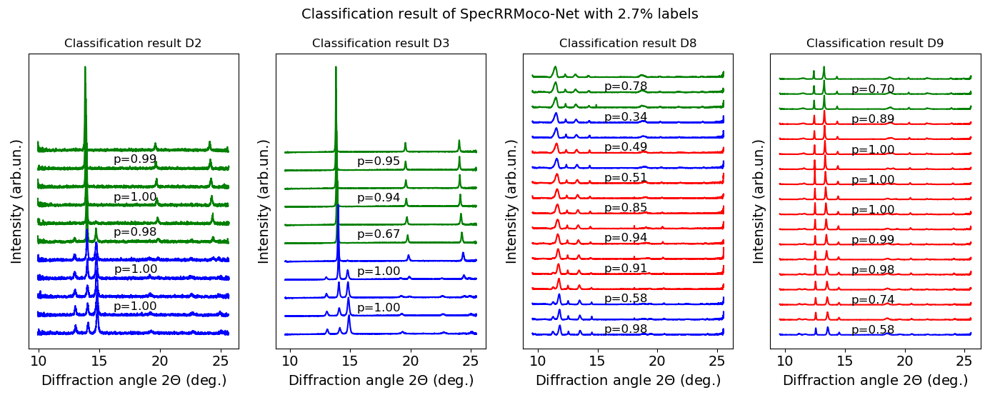

In [366]:
fig, ax = plt.subplots(1,6, figsize=(14,5.6))

if Train_num == 'one_tenth': #'half', one_tenth:

    fast_index_tmp = range(np.max((C0_fast-plt_bias,0)), np.min((C1_fast+plt_bias,len(intensity_Fastcmp))),2)
    slow_index_tmp = range(np.max((C0_slow-plt_bias,0)), np.min((C1_slow+plt_bias,len(intensity))), 4)
    
    Subplot_data_cut_2theta(141,angle_d2, intensity_d2, d2_index, prob_d2, c = FinlPredLabel_d2, title = 'Classification result D2', Text_gap = 2)
    Subplot_data_cut_2theta(142,angle_d3, intensity_d3, d3_index, prob_d3, c = FinlPredLabel_d3, title = 'Classification result D3', Text_gap = 2)
    Subplot_data_cut_2theta(143,angle_Fastcmp, intensity_Fastcmp, fast_index_tmp, prob_fast, c = FinlPredLabel_fast, title = 'Classification result D8', Text_gap = 2)
    Subplot_data_cut_2theta(144,angle, intensity,  slow_index_tmp, prob_slow, c = FinlPredLabel, title = 'Classification result D9',figsize=(10,10), Text_gap = 2)
    plt.suptitle('Classification result of SpecRRMoco-Net with 2.7% labels', fontsize=14)
    plt.show()
    fig.tight_layout(rect=[0, 0.0, 1, 0.93])
    plt.savefig(save_figures_to+"Classification result of SpecRRMoco with 2.7% labels.png", bbox_inches='tight', dpi=400)

elif Train_num == 'half':
    fast_index_tmp = range(np.max((C0_fast-plt_bias,0)), np.min((C1_fast+plt_bias,len(intensity_Fastcmp))),1)
    slow_index_tmp = range(np.max((C0_slow-plt_bias,0)), np.min((C1_slow+plt_bias,len(intensity))), 2)

    Subplot_data_cut_2theta(141,angle_Fastcmp, intensity_Fastcmp, fast_index_tmp, prob_fast, c = FinlPredLabel_fast, title = 'Classification result Fastcomp', Text_gap = 1)
    Subplot_data_cut_2theta(142,angle, intensity,  slow_index_tmp, prob_slow, c = FinlPredLabel, title = 'Classification result Slowcomp', Text_gap = 2)
    Subplot_data_cut_2theta(143,angle_d2, intensity_d2, d2_index, prob_d2, c = FinlPredLabel_d2, title = 'Classification result d2', Text_gap = 1)
    Subplot_data_cut_2theta(144,angle_d3, intensity_d3, d3_index, prob_d3, c = FinlPredLabel_d3, title = 'Classification result d3', Text_gap = 1)

    plt.suptitle('Classification result of RRMoco-Net with 10% labels', fontsize=14)
    plt.show()
    fig.tight_layout(rect=[0, 0.0, 1, 0.93])
    plt.savefig(save_figures_to+"Classification result of RRMoco with 10% labels.png", bbox_inches='tight', dpi=400)


<IPython.core.display.Javascript object>


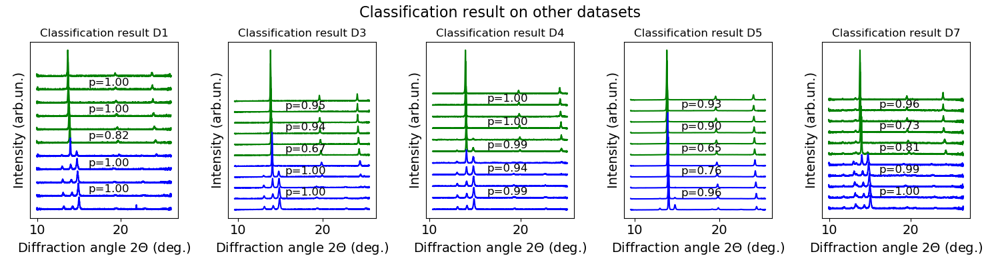

In [365]:
# fig, ax = plt.subplots(1,3, figsize=(16,4))
fig, ax = plt.subplots(1,5, figsize=(15,4))

# plt.subplots_adjust(left= 0.05, right = 0.95,top=0.9,bottom = 0.05)

Subplot_data_cut_2theta(151,Org_angle_d1, Org_intensity_d1 , d1_index, prob_d1, c = FinlPredLabel_d1 , title = 'Classification result D1')
Subplot_data_cut_2theta(152,angle_d3, intensity_d3 , d3_index, prob_d3, c = FinlPredLabel_d3 , title = 'Classification result D3')
Subplot_data_cut_2theta(153,Org_angle_d4, Org_intensity_d4 , d4_index, prob_d4, c = FinlPredLabel_d4 , title = 'Classification result D4')
Subplot_data_cut_2theta(154,Org_angle_d5, Org_intensity_d5 , d5_index, prob_d5, c = FinlPredLabel_d5 , title = 'Classification result D5')
Subplot_data_cut_2theta(155,angle_d7, intensity_d7 , d7_index, prob_d7, c = FinlPredLabel_d7 , title = 'Classification result D7')

plt.suptitle('Classification result on other datasets', fontsize=16)

plt.show()
# plt.tight_layout()
fig.tight_layout(rect=[0, 0.0, 1, 0.93])

plt.savefig(save_figures_to+"Classification result of SpecRRMoco on other datasets with 2.7% labels.png", bbox_inches='tight', dpi=400)

In [363]:
dfkokgeo

NameError: name 'dfkokgeo' is not defined

In [ ]:
opt.loss_coef

In [ ]:
# fhthyju

In [ ]:
def Exmp_plot_data(Intensity, angle, index, c, d=0, auto=False, zoom=1, title = 'Representation from 3 classes',figsize=(8,6)):
    X = angle 
    Y = Intensity 
    c = np.array(c.cpu())
    plt.figure(figsize=figsize)
    ax = plt.subplot(111)
#     ax.set_ylabel('Intensity', )#fontsize = 16,
    ax.set_xlabel('Diffraction angle 2$\Theta$ (deg.)', fontsize = 16)
    ax.set_ylabel('Intensity (arb.un.)', fontsize = 16)
  
    plt.rc('xtick') #,labelsize=16
    plt.rc('ytick') #,labelsize=16
    ax.set_yticklabels([]) 
#     ax.xaxis.set_major_locator(MultipleLocator(20))
    ax.yaxis.grid(False)
#     ax.axes.yaxis.set_visible(False)

    ax.yaxis.set_major_locator(plt.NullLocator())
    
    for i in range(X.shape[0]):  

        label=''
        if index[i] in [15]:
            label='before phase transition'
        elif index[i] in [76]:
            label='during phase transition'
        elif index[i] in [120]:
            label='after phase transition'
        else:
#             label=''
            pass
            
        plt.plot(X[i], Y[i]-i*0.2, color= "g" if c[i]==0 else ('r' if c[i]==1 else 'b'), label=label)
#         plt.text( X[i][int(len(X[i])/2)],Y[i][int(len(Y[i])/2)]-i*0.2, "i={}".format(index[i]) ,size= 8)
#         if i%2==0:
#             plt.text( X[i][1500],Y[i][1500]-i*0.2, "i={}".format(index[i]) ,size= 14)
    plt.title(title, fontsize = 16)
    plt.legend(fontsize = 16,loc='upper right')
    plt.tight_layout()
    plt.savefig(save_figures_to+"Representative spectral curves in each phase.png", bbox_inches='tight', dpi=300)

fast_index = list(range(10,50,5)) + list(range(70, 86, 2)) + list(range(100,140, 5))
Exmp_plot_data(intensity_Fastcmp[fast_index], angle_Fastcmp[fast_index], fast_index, c = FinlPredLabel_fast[fast_index] , title = 'Representative spectra of different phases',figsize=(8,6))


In [ ]:
mljj

## ====Standard ML methods======

In [ ]:
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn import metrics

db = DBSCAN(eps=0.3, min_samples=5).fit(intensity)
labels = db.labels_
labels

In [ ]:
from sklearn.cluster import KMeans
import numpy as np
# kmeans = KMeans(n_clusters=3, random_state=0, n_init="auto").fit(intensity)
kmeans = KMeans(n_clusters=3, random_state=0, n_init= 4).fit(intensity)
kmeans.labels_

In [ ]:
intensity.shape

## ===============================

In [ ]:
tt = torch.from_numpy(intensity[0:11])

In [ ]:
tt.shape

In [ ]:
o = torch.nn.functional.normalize(tt, dim=1)
s =  torch.norm(o, p=2, dim=1)

In [ ]:
print(s)

In [ ]:

# import datetime
# from dataloader.ucr2018 import load_ucr2018
# from optim.train import supervised_train
# import argparse
# import torch


# if __name__ == "__main__":
#     import os
# #     os.environ['CUDA_VISIBLE_DEVICES']='0'
#     import numpy as np


# #     Seeds = [0, 1, 2, 3]
#     Seeds = [1]
#     Runs = range(0, 3, 1)

#     model_name='SupCE'

#     exp = 'exp-linear-evaluation'

#     aug1 = 'magnitude_warp'
#     aug2 = 'time_warp'

#     model_paras='none'

#     results=[]
#     if aug1 == aug2:
#         opt.aug_type = [aug1]
#     elif type(aug1) is list:
#         opt.aug_type = aug1 + aug2
#     else:
#         opt.aug_type = [aug1, aug2]

#     log_dir = './results/{}/{}/{}'.format(
#         exp, opt.dataset_name, opt.model_name)

#     if not os.path.exists(log_dir):
#         os.makedirs(log_dir)

#     file2print = open("{}/test.log".format(log_dir), 'a+')
#     print(datetime.datetime.now(), file=file2print)
#     print("Dataset\tAcc_mean\tAcc_std\tEpoch_max", file=file2print)
#     file2print.flush()

#     file2print_detail = open("{}/test_detail.log".format(log_dir), 'a+')
#     print(datetime.datetime.now(), file=file2print_detail)
#     print("Dataset\tTrain\tTest\tDimension\tClass\tSeed\tAcc_max\tEpoch_max",
#           file=file2print_detail)
#     file2print_detail.flush()

#     MAX_EPOCHs_seed = {}
#     ACCs_seed = {}
#     for seed in Seeds:
#         np.random.seed(seed)
#         torch.manual_seed(seed)

#         ACCs_run={}
#         MAX_EPOCHs_run = {}
#         for run in Runs:

#             opt.ckpt_dir = './ckpt/{}/{}/{}/{}/{}/{}'.format(
#                 exp, opt.model_name, opt.dataset_name, '_'.join(opt.aug_type),
#                 model_paras, str(seed))

#             if not os.path.exists(opt.ckpt_dir):
#                 os.makedirs(opt.ckpt_dir)

#             print('[INFO] Running at:', opt.dataset_name)

# #             x_train, y_train, x_val, y_val, x_test, y_test, nb_class, _ \
# #                 = load_ucr2018(opt.ucr_path, opt.dataset_name)
#             ####
#             # Test
#             ####
#             acc_test, epoch_max_point = supervised_train(
#                 x_train, y_train, x_val, y_val, x_test, y_test,nb_class,
#                 opt)

#             ACCs_run[run] = acc_test
#             MAX_EPOCHs_run[run] = epoch_max_point

#         ACCs_seed[seed] = round(np.mean(list(ACCs_run.values())), 2)
#         MAX_EPOCHs_seed[seed] = np.max(list(MAX_EPOCHs_run.values()))

#         print("{}\t{}\t{}\t{}\t{}\t{}\t{}\t{}".format(
#             opt.dataset_name, x_train.shape[0], x_test.shape[0], x_train.shape[1], nb_class,
#             seed,ACCs_seed[seed],MAX_EPOCHs_seed[seed]
#         ), file=file2print_detail)
#         file2print_detail.flush()

#     ACCs_seed_mean = round(np.mean(list(ACCs_seed.values())), 2)
#     ACCs_seed_std = round(np.std(list(ACCs_seed.values())), 2)
#     MAX_EPOCHs_seed_max = np.max(list(MAX_EPOCHs_seed.values()))

#     print("{}\t{}\t{}\t{}".format(
#         opt.dataset_name, ACCs_seed_mean, ACCs_seed_std, MAX_EPOCHs_seed_max),     file=file2print)
#     file2print.flush()



## Illustration of timestamps, inter-temporal relation reasoning module

In [ ]:
color_dict = {0:'red', 1:'black', 2:'blue', 3:'brown', 4:'green'}

    
plt.figure(figsize=(8,8))
ax = plt.subplot(111)
ax.set_ylabel('Relative Intensity', )#fontsize = 16,
ax.set_xlabel('Data points', )#fontsize = 16,
Y = intensity_d1
    
print(Y.shape)
 
plt.rc('xtick') #,labelsize=16
plt.rc('ytick') #,labelsize=16
for i in range(Y.shape[0]):    
    plt.plot( intensity_d1[i]-i*0.2, color= color_dict[y_d1_tmp[i]],lw=1)        
    plt.text( int(len(Y[i])/2),Y[i][int(len(Y[i])/2)]-i*0.2, "i={}, T={:d}".format(i,int(y_d1_tmp[i])) ,size= 7.5 )
plt.title('Illustration of labels/timestamps in the inter-temporal relation reasoning module')
# plt.legend([str(i) for i in range(typeC)])
# plt.title('D1 dataset, illustration of timestamps in the inter-temporal relation reasoning module')
plt.tight_layout()

## =====SupCont + SpectralClustering=====

### Slow dataset====

In [ ]:
    
with torch.no_grad():
    data = torch.from_numpy(intensity).type(torch.FloatTensor).to(device)
    output = backbone_lineval.encoder_q.encoder(data).detach()
X2_data = output.cpu()


X_i = intensity

###### After Backbone encoder===

In [ ]:
from sklearn.cluster import SpectralClustering
from time import time
t0= time()
n_cluster = 3
### rbf works the best ####
# Kluster = SpectralClustering(n_clusters= n_cluster, affinity='rbf', assign_labels='discretize')
Kluster = SpectralClustering(n_clusters= n_cluster,assign_labels='kmeans')
y_pred = Kluster.fit_predict(X2_data)
t1= time()
print("training done in %0.6fs" % ((t1 - t0)/X2_data.shape[0]))
print(Kluster)
print(y_pred)

# y_pred_train = Kluster.labels_

In [ ]:
# if 2 in y_pred:
#     index_0 = np.where(y_pred==0)[0][0]
#     index_1 = np.where(y_pred==1)[0][0]
#     index_2 = np.where(y_pred==2)[0][0]
#     print(index_0,index_1, index_2)
# elif y_pred[0]==1:
#     y_pred = 1-y_pred
#     a1,a2 = ClsBoundaryDet(y_pred)
# else:
#     a1,a2 = ClsBoundaryDet(y_pred)

In [ ]:
if 2 in y_pred:
    index_0 = np.where(y_pred==0)[0][0]
    index_1 = np.where(y_pred==1)[0][0]
    index_2 = np.where(y_pred==2)[0][0]
    print(index_0,index_1, index_2)
    Class_Start = np.sort([index_0,index_1, index_2])
    print(Class_Start )
    
    Cluster_label_fast = np.zeros_like(y_pred)
    Cluster_label_fast[np.where(y_pred==y_pred[Class_Start[0]])[0]] = 0
    Cluster_label_fast[np.where(y_pred==y_pred[Class_Start[1]])[0]] = 1
    Cluster_label_fast[np.where(y_pred==y_pred[Class_Start[2]])[0]] = 2
    print(Cluster_label_fast)
    
#     if y_pred[0]==2:
#         y_pred = 2-y_pred
#         a1,a2 = ClsBoundaryDet(y_pred)
#     elif y_pred[0]==1:
#         print('ddg')
#         y_pred = 1-y_pred
#         a1,a2 = ClsBoundaryDet(y_pred)
#     else:
#         a1,a2 = ClsBoundaryDet(y_pred)

y_pred = Cluster_label_fast

###### Before Backbone encoder (only spectral clustering)===

In [ ]:
from sklearn.cluster import SpectralClustering
from time import time
t0= time()
n_cluster = 3
### rbf works the best ####
Kluster = SpectralClustering(n_clusters= n_cluster, affinity='rbf', assign_labels='discretize')
# Kluster = SpectralClustering(n_clusters= n_cluster,assign_labels='kmeans')
y_pred_orig = Kluster.fit_predict(intensity)
t1= time()
print("training done in %0.6fs" % ((t1 - t0)/X2_data.shape[0]))
print(Kluster)
print(y_pred_orig)

# y_pred_train = Kluster.labels_

In [ ]:
# if 2 in y_pred_orig:
#     index_0 = np.where(y_pred_orig==0)[0][0]
#     index_1 = np.where(y_pred_orig==1)[0][0]
#     index_2 = np.where(y_pred_orig==2)[0][0]
#     print(index_0,index_1, index_2)
# elif y_pred_orig[0]==1:
#     y_pred_orig = 1-y_pred_orig
#     a1,a2 = ClsBoundaryDet(y_pred_orig)
# else:
#     a1,a2 = ClsBoundaryDet(y_pred_orig)

In [ ]:
if 2 in y_pred:
    index_0 = np.where(y_pred_orig==0)[0][0]
    index_1 = np.where(y_pred_orig==1)[0][0]
    index_2 = np.where(y_pred_orig==2)[0][0]
    print(index_0,index_1, index_2)
    Class_Start = np.sort([index_0,index_1, index_2])
    print(Class_Start )
    
    Cluster_label_fast = np.zeros_like(y_pred_orig)
    Cluster_label_fast[np.where(y_pred_orig==y_pred_orig[Class_Start[0]])[0]] = 0
    Cluster_label_fast[np.where(y_pred_orig==y_pred_orig[Class_Start[1]])[0]] = 1
    Cluster_label_fast[np.where(y_pred_orig==y_pred_orig[Class_Start[2]])[0]] = 2
    print(Cluster_label_fast)

y_pred_orig = Cluster_label_fast

In [ ]:
from sklearn.manifold import TSNE

def plot_OrigDataset(intensity, FinlPredLabel, nb_class, title = 't-SNE visualization of SlowCompress Data', ):  
    
    plt.figure(figsize=(6,6))

    feats = np.array([]).reshape((0,intensity.shape[1]))

    y_train = FinlPredLabel 
#     feats = np.append(feats,out,axis = 0)

    tsne = TSNE(n_components = 2, perplexity = 100)
    x_feats = tsne.fit_transform(intensity)

    num_samples = intensity.shape[0] 
    print('num_samples:',num_samples)

    for i in range(nb_class):

        plt.scatter(x_feats[y_train[:num_samples]==i, 1],x_feats[y_train[:num_samples]==i, 0])

    plt.legend([str(i) for i in range(nb_class)])
    plt.title(title)
    plt.show()


In [ ]:
### Labels are predicted by (self-supervised backbone + spectral clustering)
plot_OrigDataset(X2_data, y_pred, n_cluster, title = 't-SNE visualization of after backbone model (self-sup label)', )
### Labels are predicted by (self-supervised backbone + spectral clustering)
plot_OrigDataset(X_i, y_pred, n_cluster, title = 't-SNE visualization of Original Data (self-sup label)', ) 

In [ ]:
### Labels are predicted by (only spectral clustering)
plot_OrigDataset(X_i, y_pred_orig, n_cluster, title = 't-SNE visualization of Original Data (Clustering label)', )
# plot_OrigDataset(X2_data, y_pred_orig, n_cluster, title = 't-SNE visualization of Data after Backbone (Clustering label)', ) 

In [ ]:
y_pred_slow, y_pred_orig_slow, n_cluster_slow, emb_slow = y_pred, y_pred_orig, n_cluster,X2_data

In [ ]:
y_pred_orig_slow.shape

In [ ]:
print('Dataset (test) classification result:')
B_l, B_h = ClsBoundaryDet(np.array(y_pred))

In [ ]:
slow_index

In [ ]:
y_pred_slow

### Fast dataset===

In [ ]:
intensity_Fastcmp.shape

In [ ]:
X_i = intensity_Fastcmp
with torch.no_grad():
    data = torch.from_numpy(X_i).type(torch.FloatTensor).to(device)
    output = backbone_lineval.encoder_q.encoder(data).detach()
X2_data = output.cpu()

In [ ]:
from sklearn.cluster import SpectralClustering
from time import time
t0= time()
n_cluster = 3
### rbf works the best ####
# Kluster = SpectralClustering(n_clusters= n_cluster, affinity='rbf', assign_labels='kmeans')
# Kluster = SpectralClustering(n_clusters= n_cluster,assign_labels='kmeans')
Kluster = SpectralClustering(n_clusters= n_cluster, affinity='rbf', assign_labels='discretize',random_state=0)
# Kluster = SpectralClustering(n_clusters= n_cluster, affinity='nearest_neighbors', assign_labels='kmeans')
# Kluster = SpectralClustering(n_clusters= n_cluster)

# Kluster = SpectralClustering(n_clusters= n_cluster,assign_labels='kmeans')
y_pred = Kluster.fit_predict(X2_data)
t1= time()
print("training done in %0.6fs" % ((t1 - t0)/X2_data.shape[0]))
print(Kluster)
print(y_pred)

# y_pred_train = Kluster.labels_

In [ ]:
if 2 in y_pred:
    index_0 = np.where(y_pred==0)[0][0]
    index_1 = np.where(y_pred==1)[0][0]
    index_2 = np.where(y_pred==2)[0][0]
    print(index_0,index_1, index_2)
    Class_Start = np.sort([index_0,index_1, index_2])
    print(Class_Start )
    
    Cluster_label_fast = np.zeros_like(y_pred)
    Cluster_label_fast[np.where(y_pred==y_pred[Class_Start[0]])[0]] = 0
    Cluster_label_fast[np.where(y_pred==y_pred[Class_Start[1]])[0]] = 1
    Cluster_label_fast[np.where(y_pred==y_pred[Class_Start[2]])[0]] = 2
    print(Cluster_label_fast)
    
#     if y_pred[0]==2:
#         y_pred = 2-y_pred
#         a1,a2 = ClsBoundaryDet(y_pred)
#     elif y_pred[0]==1:
#         print('ddg')
#         y_pred = 1-y_pred
#         a1,a2 = ClsBoundaryDet(y_pred)
#     else:
#         a1,a2 = ClsBoundaryDet(y_pred)

y_pred = Cluster_label_fast

In [ ]:
y_pred

#### Before Backbone encoder (only spectral clustering)===

In [ ]:


from sklearn.cluster import SpectralClustering
from time import time
t0= time()
n_cluster = 3
### rbf works the best ####
Kluster = SpectralClustering(n_clusters= n_cluster, affinity='rbf', assign_labels='discretize')
# Kluster = SpectralClustering(n_clusters= n_cluster,assign_labels='kmeans')
y_pred_orig = Kluster.fit_predict(X_i)
t1= time()
print("training done in %0.6fs" % ((t1 - t0)/X_i.shape[0]))
print(Kluster)
print(y_pred_orig)

# y_pred_train = Kluster.labels_

In [ ]:
# if 2 in y_pred:
#     index_0 = np.where(y_pred_orig==0)[0][0]
#     index_1 = np.where(y_pred_orig==1)[0][0]
#     index_2 = np.where(y_pred_orig==2)[0][0]
#     print(index_0,index_1, index_2)
# elif y_pred_orig[0]==1:
#     y_pred_orig = 1-y_pred_orig
#     a1,a2 = ClsBoundaryDet(y_pred_orig)
# else:
#     a1,a2 = ClsBoundaryDet(y_pred_orig)

In [ ]:
if 2 in y_pred:
    index_0 = np.where(y_pred_orig==0)[0][0]
    index_1 = np.where(y_pred_orig==1)[0][0]
    index_2 = np.where(y_pred_orig==2)[0][0]
    print(index_0,index_1, index_2)
    Class_Start = np.sort([index_0,index_1, index_2])
    print(Class_Start )
    
    Cluster_label_fast = np.zeros_like(y_pred_orig)
    Cluster_label_fast[np.where(y_pred_orig==y_pred_orig[Class_Start[0]])[0]] = 0
    Cluster_label_fast[np.where(y_pred_orig==y_pred_orig[Class_Start[1]])[0]] = 1
    Cluster_label_fast[np.where(y_pred_orig==y_pred_orig[Class_Start[2]])[0]] = 2
    print(Cluster_label_fast)

y_pred_orig = Cluster_label_fast

In [ ]:
fast_index,y_pred_orig

In [ ]:
### Labels are predicted by (self-supervised backbone + spectral clustering)
plot_OrigDataset(X2_data, y_pred, n_cluster, title = 't-SNE visualization of after backbone model (self-sup label)', ) 
### Labels are predicted by (only spectral clustering)
plot_OrigDataset(X_i, y_pred_orig, n_cluster, title = 't-SNE visualization of Original Data (Clustering label)', ) 

In [ ]:
y_pred_fast, y_pred_orig_fast, n_cluster_fast, emb_fast = y_pred, y_pred_orig, n_cluster,X2_data

### d5===

In [ ]:
from sklearn.manifold import TSNE

def plot_Dataset_2D(intensity, FinlPredLabel, nb_class, title = 't-SNE visualization of SlowCompress Data', figsize=(6,6) ):  
    
    plt.figure(figsize=figsize)

    feats = np.array([]).reshape((0,intensity.shape[1]))

    y_train = FinlPredLabel 
#     feats = np.append(feats,out,axis = 0)

    tsne = TSNE(n_components = 2, perplexity = 30)
    x_feats = tsne.fit_transform(intensity)

    num_samples = intensity.shape[0] 
    print('num_samples:',num_samples)

    for i in range(nb_class):

        plt.scatter(x_feats[y_train[:num_samples]==i, 1],x_feats[y_train[:num_samples]==i, 0])

    plt.legend([str(i) for i in range(nb_class)])
    plt.title(title)
    plt.show()


In [ ]:
X_i = intensity_d5
with torch.no_grad():
    data = torch.from_numpy(X_i).type(torch.FloatTensor).to(device)
    output = backbone_lineval.encoder_q.encoder(data).detach()
X2_data = output.cpu()

In [ ]:
from sklearn.cluster import SpectralClustering
from time import time
t0= time()
n_cluster = 2
### rbf works the best ####
# Kluster = SpectralClustering(n_clusters= n_cluster, affinity='nearest_neighbors', assign_labels='kmeans')
Kluster = SpectralClustering(n_clusters= n_cluster, affinity='rbf', assign_labels='discretize')

# Kluster = SpectralClustering(n_clusters= n_cluster,assign_labels='kmeans')
y_pred = Kluster.fit_predict(X2_data)
t1= time()
print("training done in %0.6fs" % ((t1 - t0)/X2_data.shape[0]))
print(Kluster)
print(y_pred)

# y_pred_train = Kluster.labels_

In [ ]:
d5_index

In [ ]:
from sklearn.cluster import SpectralClustering
from time import time
t0= time()
n_cluster = 2
### rbf works the best ####
# Kluster = SpectralClustering(n_clusters= n_cluster, affinity='nearest_neighbors', assign_labels='kmeans')
Kluster = SpectralClustering(n_clusters= n_cluster, affinity='rbf', assign_labels='discretize')

y_pred_orig = Kluster.fit_predict(X_i)
t1= time()
print("training done in %0.6fs" % ((t1 - t0)/X_i.shape[0]))
print(Kluster)
print(y_pred_orig)

# y_pred_train = Kluster.labels_

In [ ]:
if 2 in y_pred:
    index_0 = np.where(y_pred==0)[0][0]
    index_1 = np.where(y_pred==1)[0][0]
    index_2 = np.where(y_pred==2)[0][0]
    print(index_0,index_1, index_2)
elif y_pred[0]==1:
    y_pred = 1-y_pred
    a1,a2 = ClsBoundaryDet(y_pred)
else:
    a1,a2 = ClsBoundaryDet(y_pred)

In [ ]:

if 2 in y_pred_orig:
    index_0 = np.where(y_pred_orig==0)[0][0]
    index_1 = np.where(y_pred_orig==1)[0][0]
    index_2 = np.where(y_pred_orig==2)[0][0]
    print(index_0,index_1, index_2)
elif y_pred_orig[0]==1:
    y_pred_orig = 1-y_pred_orig
    a1,a2 = ClsBoundaryDet(y_pred_orig)
else:
    a1,a2 = ClsBoundaryDet(y_pred_orig)


In [ ]:
### Labels are predicted by (self-supervised backbone + spectral clustering)
plot_Dataset_2D(X2_data, y_pred, n_cluster, title = 't-SNE visualization of after backbone model (self-sup label)', ) 
plot_Dataset_2D(X_i, y_pred_orig, n_cluster, title = 't-SNE visualization of original (self-sup label)', ) 

In [ ]:
y_pred_d5, y_pred_orig_d5, n_cluster_d5, emb_d5 = y_pred, y_pred_orig, n_cluster,X2_data

#### d1 ===

In [ ]:
X_i = intensity_d1

with torch.no_grad():
    data = torch.from_numpy(intensity_d1).type(torch.FloatTensor).to(device)
    output = backbone_lineval.encoder_q.encoder(data).detach()
X2_data = output.cpu()




In [ ]:

from sklearn.cluster import SpectralClustering
from time import time
t0= time()
n_cluster = 2
### rbf works the best ####
Kluster = SpectralClustering(n_clusters= n_cluster, affinity='nearest_neighbors', assign_labels='discretize')
# Kluster = SpectralClustering(n_clusters= n_cluster,assign_labels='kmeans')
y_pred = Kluster.fit_predict(X2_data)
t1= time()
print("training done in %0.6fs" % ((t1 - t0)/X2_data.shape[0]))
print(Kluster)
print(y_pred)

In [ ]:

# y_pred_train = Kluster.labels_

if 2 in y_pred:
    index_0 = np.where(y_pred==0)[0][0]
    index_1 = np.where(y_pred==1)[0][0]
    index_2 = np.where(y_pred==2)[0][0]
    print(index_0,index_1, index_2)
elif y_pred[0]==1:
    y_pred = 1-y_pred
    a1,a2 = ClsBoundaryDet(y_pred)
else:
    a1,a2 = ClsBoundaryDet(y_pred)


In [ ]:
from sklearn.cluster import SpectralClustering
from time import time
t0= time()
n_cluster = 2
### rbf works the best ####
Kluster = SpectralClustering(n_clusters= n_cluster, affinity='nearest_neighbors', assign_labels='kmeans')
# Kluster = SpectralClustering(n_clusters= n_cluster, affinity='rbf', assign_labels='discretize')

y_pred_orig = Kluster.fit_predict(X_i)
t1= time()
print("training done in %0.6fs" % ((t1 - t0)/X2_data.shape[0]))
print(Kluster)
print(y_pred_orig)

 
if 2 in y_pred_orig:
    index_0 = np.where(y_pred_orig==0)[0][0]
    index_1 = np.where(y_pred_orig==1)[0][0]
    index_2 = np.where(y_pred_orig==2)[0][0]
    print(index_0,index_1, index_2)
elif y_pred_orig[0]==1:
    y_pred_orig = 1-y_pred_orig
    a1,a2 = ClsBoundaryDet(y_pred_orig)
else:
    a1,a2 = ClsBoundaryDet(y_pred_orig)

# y_pred_train = Kluster.labels_

In [ ]:
### Labels are predicted by (self-supervised backbone + spectral clustering)
plot_Dataset_2D(X2_data, y_pred, n_cluster, title = 't-SNE visualization of after backbone model (self-sup label)', ) 
plot_Dataset_2D(X_i, y_pred_orig, n_cluster, title = 't-SNE visualization of original (self-sup label)', ) 

In [ ]:
y_pred_d1, y_pred_orig_d1, n_cluster_d1, emb_d1 = y_pred, y_pred_orig, n_cluster,X2_data

#### d4=====

In [ ]:
X_i = intensity_d4

with torch.no_grad():
    data = torch.from_numpy(intensity_d4).type(torch.FloatTensor).to(device)
    output = backbone_lineval.encoder_q.encoder(data).detach()
X2_data = output.cpu()

from sklearn.cluster import SpectralClustering
from time import time
t0= time()
n_cluster = 2
### rbf works the best ####
# Kluster = SpectralClustering(n_clusters= n_cluster, affinity='nearest_neighbors', assign_labels='kmeans')
# Kluster = SpectralClustering(n_clusters= n_cluster,assign_labels='kmeans')
Kluster = SpectralClustering(n_clusters= n_cluster, affinity='rbf', assign_labels='discretize')
y_pred = Kluster.fit_predict(X2_data)
t1= time()
print("training done in %0.6fs" % ((t1 - t0)/X2_data.shape[0]))
print(Kluster)
print(y_pred)

# y_pred_train = Kluster.labels_

if 2 in y_pred:
    index_0 = np.where(y_pred==0)[0][0]
    index_1 = np.where(y_pred==1)[0][0]
    index_2 = np.where(y_pred==2)[0][0]
    print(index_0,index_1, index_2)
elif y_pred[0]==1:
    y_pred = 1-y_pred
    a1,a2 = ClsBoundaryDet(y_pred)
else:
    a1,a2 = ClsBoundaryDet(y_pred)



In [ ]:
from sklearn.cluster import SpectralClustering
from time import time
t0= time()
n_cluster = 2
### rbf works the best ####
# Kluster = SpectralClustering(n_clusters= n_cluster, affinity='nearest_neighbors', assign_labels='kmeans')
Kluster = SpectralClustering(n_clusters= n_cluster, affinity='rbf', assign_labels='discretize')

y_pred_orig = Kluster.fit_predict(X_i)
t1= time()
print("training done in %0.6fs" % ((t1 - t0)/X2_data.shape[0]))
print(Kluster)
print(y_pred_orig)
 
if 2 in y_pred_orig:
    index_0 = np.where(y_pred_orig==0)[0][0]
    index_1 = np.where(y_pred_orig==1)[0][0]
    index_2 = np.where(y_pred_orig==2)[0][0]
    print(index_0,index_1, index_2)
elif y_pred_orig[0]==1:
    y_pred_orig = 1-y_pred_orig
    a1,a2 = ClsBoundaryDet(y_pred_orig)
else:
    a1,a2 = ClsBoundaryDet(y_pred_orig)

# y_pred_train = Kluster.labels_

In [ ]:
### Labels are predicted by (self-supervised backbone + spectral clustering)
plot_Dataset_2D(X2_data, y_pred, n_cluster, title = 't-SNE visualization of after backbone model (self-sup label)', ) 
plot_Dataset_2D(X_i, y_pred_orig, n_cluster, title = 't-SNE visualization of original (self-sup label)', ) 

In [ ]:
y_pred_d4, y_pred_orig_d4, n_cluster_d4, emb_d4 = y_pred, y_pred_orig, n_cluster,X2_data

#### d7=====

In [ ]:
X_i = intensity_d7

with torch.no_grad():
    data = torch.from_numpy(intensity_d7).type(torch.FloatTensor).to(device)
    output = backbone_lineval.encoder_q.encoder(data).detach()
X2_data = output.cpu()

from sklearn.cluster import SpectralClustering
from time import time
t0= time()
n_cluster = 2
### rbf works the best ####
# Kluster = SpectralClustering(n_clusters= n_cluster, affinity='nearest_neighbors', assign_labels='kmeans')
# Kluster = SpectralClustering(n_clusters= n_cluster,assign_labels='kmeans')
Kluster = SpectralClustering(n_clusters= n_cluster, affinity='rbf', assign_labels='discretize')
y_pred = Kluster.fit_predict(X2_data)
t1= time()
print("training done in %0.6fs" % ((t1 - t0)/X2_data.shape[0]))
print(Kluster)
print(y_pred)

# y_pred_train = Kluster.labels_

if 2 in y_pred:
    index_0 = np.where(y_pred==0)[0][0]
    index_1 = np.where(y_pred==1)[0][0]
    index_2 = np.where(y_pred==2)[0][0]
    print(index_0,index_1, index_2)
elif y_pred[0]==1:
    y_pred = 1-y_pred
    a1,a2 = ClsBoundaryDet(y_pred)
else:
    a1,a2 = ClsBoundaryDet(y_pred)



In [ ]:
from sklearn.cluster import SpectralClustering
from time import time
t0= time()
n_cluster = 2
### rbf works the best ####
# Kluster = SpectralClustering(n_clusters= n_cluster, affinity='nearest_neighbors', assign_labels='kmeans')
Kluster = SpectralClustering(n_clusters= n_cluster, affinity='rbf', assign_labels='discretize')

y_pred_orig = Kluster.fit_predict(X_i)
t1= time()
print("training done in %0.6fs" % ((t1 - t0)/X2_data.shape[0]))
print(Kluster)
print(y_pred_orig)
 
if 2 in y_pred_orig:
    index_0 = np.where(y_pred_orig==0)[0][0]
    index_1 = np.where(y_pred_orig==1)[0][0]
    index_2 = np.where(y_pred_orig==2)[0][0]
    print(index_0,index_1, index_2)
elif y_pred_orig[0]==1:
    y_pred_orig = 1-y_pred_orig
    a1,a2 = ClsBoundaryDet(y_pred_orig)
else:
    a1,a2 = ClsBoundaryDet(y_pred_orig)

# y_pred_train = Kluster.labels_

In [ ]:
### Labels are predicted by (self-supervised backbone + spectral clustering)
plot_Dataset_2D(X2_data, y_pred, n_cluster, title = 't-SNE visualization of after backbone model (self-sup label)', ) 
plot_Dataset_2D(X_i, y_pred_orig, n_cluster, title = 't-SNE visualization of original (self-sup label)', ) 

In [ ]:
y_pred_d7, y_pred_orig_d7, n_cluster_d7, emb_d7 = y_pred, y_pred_orig, n_cluster,X2_data

#### d6=====

In [ ]:
X_i = intensity_d6

with torch.no_grad():
    data = torch.from_numpy(intensity_d6).type(torch.FloatTensor).to(device)
    output = backbone_lineval.encoder_q.encoder(data).detach()
X2_data = output.cpu()

from sklearn.cluster import SpectralClustering
from time import time
t0= time()
n_cluster = 2
### rbf works the best ####
# Kluster = SpectralClustering(n_clusters= n_cluster, affinity='nearest_neighbors', assign_labels='kmeans')
# Kluster = SpectralClustering(n_clusters= n_cluster,assign_labels='kmeans')
Kluster = SpectralClustering(n_clusters= n_cluster, affinity='rbf', assign_labels='discretize')
y_pred = Kluster.fit_predict(X2_data)
t1= time()
print("training done in %0.6fs" % ((t1 - t0)/X2_data.shape[0]))
print(Kluster)
print(y_pred)

# y_pred_train = Kluster.labels_

if 2 in y_pred:
    index_0 = np.where(y_pred==0)[0][0]
    index_1 = np.where(y_pred==1)[0][0]
    index_2 = np.where(y_pred==2)[0][0]
    print(index_0,index_1, index_2)
elif y_pred[0]==1:
    y_pred = 1-y_pred
    a1,a2 = ClsBoundaryDet(y_pred)
else:
    a1,a2 = ClsBoundaryDet(y_pred)



In [ ]:
from sklearn.cluster import SpectralClustering
from time import time
t0= time()
n_cluster = 2
### rbf works the best ####
# Kluster = SpectralClustering(n_clusters= n_cluster, affinity='nearest_neighbors', assign_labels='kmeans')
Kluster = SpectralClustering(n_clusters= n_cluster, affinity='rbf', assign_labels='discretize')

y_pred_orig = Kluster.fit_predict(X_i)
t1= time()
print("training done in %0.6fs" % ((t1 - t0)/X2_data.shape[0]))
print(Kluster)
print(y_pred_orig)
 
if 2 in y_pred_orig:
    index_0 = np.where(y_pred_orig==0)[0][0]
    index_1 = np.where(y_pred_orig==1)[0][0]
    index_2 = np.where(y_pred_orig==2)[0][0]
    print(index_0,index_1, index_2)
elif y_pred_orig[0]==1:
    y_pred_orig = 1-y_pred_orig
    a1,a2 = ClsBoundaryDet(y_pred_orig)
else:
    a1,a2 = ClsBoundaryDet(y_pred_orig)

# y_pred_train = Kluster.labels_

In [ ]:
### Labels are predicted by (self-supervised backbone + spectral clustering)
plot_Dataset_2D(X2_data, y_pred, n_cluster, title = 't-SNE visualization of after backbone model (self-sup label)', ) 
plot_Dataset_2D(X_i, y_pred_orig, n_cluster, title = 't-SNE visualization of original (self-sup label)', ) 

In [ ]:
y_pred_d6, y_pred_orig_d6, n_cluster_d6, emb_d6 = y_pred, y_pred_orig, n_cluster,X2_data

#### d3=====

In [ ]:
X_i = intensity_d3

with torch.no_grad():
    data = torch.from_numpy(X_i).type(torch.FloatTensor).to(device)
    output = backbone_lineval.encoder_q.encoder(data).detach()
X2_data = output.cpu()

from sklearn.cluster import SpectralClustering
from time import time
t0= time()
n_cluster = 2
### rbf works the best ####
Kluster = SpectralClustering(n_clusters= n_cluster, affinity='nearest_neighbors', assign_labels='kmeans')
# Kluster = SpectralClustering(n_clusters= n_cluster,assign_labels='kmeans')
y_pred = Kluster.fit_predict(X2_data)
t1= time()
print("training done in %0.6fs" % ((t1 - t0)/X2_data.shape[0]))
print(Kluster)
print(y_pred)

# y_pred_train = Kluster.labels_

if 2 in y_pred:
    index_0 = np.where(y_pred==0)[0][0]
    index_1 = np.where(y_pred==1)[0][0]
    index_2 = np.where(y_pred==2)[0][0]
    print(index_0,index_1, index_2)
elif y_pred[0]==1:
    y_pred = 1-y_pred
    a1,a2 = ClsBoundaryDet(y_pred)
else:
    a1,a2 = ClsBoundaryDet(y_pred)



In [ ]:
from sklearn.cluster import SpectralClustering
from time import time
t0= time()
n_cluster = 2
### rbf works the best ####
# Kluster = SpectralClustering(n_clusters= n_cluster, affinity='nearest_neighbors', assign_labels='kmeans')
Kluster = SpectralClustering(n_clusters= n_cluster, affinity='rbf', assign_labels='discretize')

y_pred_orig = Kluster.fit_predict(X_i)
t1= time()
print("training done in %0.6fs" % ((t1 - t0)/X2_data.shape[0]))
print(Kluster)
print(y_pred_orig)

# y_pred_train = Kluster.labels_


 
if 2 in y_pred_orig:
    index_0 = np.where(y_pred_orig==0)[0][0]
    index_1 = np.where(y_pred_orig==1)[0][0]
    index_2 = np.where(y_pred_orig==2)[0][0]
    print(index_0,index_1, index_2)
elif y_pred_orig[0]==1:
    y_pred_orig = 1-y_pred_orig
    a1,a2 = ClsBoundaryDet(y_pred_orig)
else:
    a1,a2 = ClsBoundaryDet(y_pred_orig)



In [ ]:
### Labels are predicted by (self-supervised backbone + spectral clustering)
plot_Dataset_2D(X2_data, y_pred, n_cluster, title = 't-SNE visualization of after backbone model (self-sup label)', ) 
plot_Dataset_2D(X_i, y_pred_orig, n_cluster, title = 't-SNE visualization of original (self-sup label)', ) 

In [ ]:
y_pred_d3, y_pred_orig_d3, n_cluster_d3, emb_d3 = y_pred, y_pred_orig, n_cluster,X2_data

#### d2=====

In [ ]:
X_i = intensity_d2

with torch.no_grad():
    data = torch.from_numpy(X_i).type(torch.FloatTensor).to(device)
    output = backbone_lineval.encoder_q.encoder(data).detach()
X2_data = output.cpu()

from sklearn.cluster import SpectralClustering
from time import time
t0= time()
n_cluster = 2
### rbf works the best ####
Kluster = SpectralClustering(n_clusters= n_cluster, affinity='nearest_neighbors', assign_labels='kmeans')
# Kluster = SpectralClustering(n_clusters= n_cluster,assign_labels='kmeans')
y_pred = Kluster.fit_predict(X2_data)
t1= time()
print("training done in %0.6fs" % ((t1 - t0)/X2_data.shape[0]))
print(Kluster)
print(y_pred)

# y_pred_train = Kluster.labels_

if 2 in y_pred:
    index_0 = np.where(y_pred==0)[0][0]
    index_1 = np.where(y_pred==1)[0][0]
    index_2 = np.where(y_pred==2)[0][0]
    print(index_0,index_1, index_2)
elif y_pred[0]==1:
    y_pred = 1-y_pred
    a1,a2 = ClsBoundaryDet(y_pred)
else:
    a1,a2 = ClsBoundaryDet(y_pred)



In [ ]:
from sklearn.cluster import SpectralClustering
from time import time
t0= time()
n_cluster = 2
### rbf works the best ####
# Kluster = SpectralClustering(n_clusters= n_cluster, affinity='nearest_neighbors', assign_labels='kmeans')
Kluster = SpectralClustering(n_clusters= n_cluster, affinity='rbf', assign_labels='discretize')

y_pred_orig = Kluster.fit_predict(X_i)
t1= time()
print("training done in %0.6fs" % ((t1 - t0)/X2_data.shape[0]))
print(Kluster)
print(y_pred_orig)

# y_pred_train = Kluster.labels_



 
if 2 in y_pred_orig:
    index_0 = np.where(y_pred_orig==0)[0][0]
    index_1 = np.where(y_pred_orig==1)[0][0]
    index_2 = np.where(y_pred_orig==2)[0][0]
    print(index_0,index_1, index_2)
elif y_pred_orig[0]==1:
    y_pred_orig = 1-y_pred_orig
    a1,a2 = ClsBoundaryDet(y_pred_orig)
else:
    a1,a2 = ClsBoundaryDet(y_pred_orig)



In [ ]:
### Labels are predicted by (self-supervised backbone + spectral clustering)
plot_Dataset_2D(X2_data, y_pred, n_cluster, title = 't-SNE visualization of after backbone model (self-sup label)', ) 
plot_Dataset_2D(X_i, y_pred_orig, n_cluster, title = 't-SNE visualization of original (self-sup label)', ) 

In [ ]:
y_pred_d2, y_pred_orig_d2, n_cluster_d2, emb_d2 = y_pred, y_pred_orig, n_cluster,X2_data

In [ ]:
from sklearn.manifold import TSNE

def TSNE_Comp(subplt_n,  intensity, FinlPredLabel, nb_class, title = 't-SNE visualization of SlowCompress Data',perplexity = 30 ):  
        
    ax = plt.subplot(subplt_n)

    feats = np.array([]).reshape((0,intensity.shape[1]))

    y_train = FinlPredLabel 
#     feats = np.append(feats,out,axis = 0)

    tsne = TSNE(n_components = 2, perplexity = perplexity)
    x_feats = tsne.fit_transform(intensity)

    num_samples = intensity.shape[0] 
    print('num_samples:',num_samples)

    for i in range(nb_class):

        plt.scatter(x_feats[y_train[:num_samples]==i, 1], x_feats[y_train[:num_samples]==i, 0])

#     plt.legend([str(i) for i in range(nb_class)])
    plt.title(title)
#     plt.show()

    

# def TSNE_Comp(subplt_n, Intensity,index,prob, c, d=0, auto=False, zoom=1,title = 'Classification result',figsize=(8,6)):

#     Y = Intensity 
#     c = np.array(c.cpu())
    
#     ax = plt.subplot(subplt_n)
#     ax.set_ylabel('Intensity', )#fontsize = 16,

#     plt.rc('xtick') #,labelsize=16
#     plt.rc('ytick') #,labelsize=16
#     for i in index:    
#         plt.plot( Y[i]-i*0.2, color= "g" if c[i]==0 else ('r' if c[i]==1 else 'b'))        
#         plt.text( int(len(Y[i])/2),Y[i][int(len(Y[i])/2)]-i*0.2, "i={}, p={:.3f}".format(i,prob[i]) ,size= 6 )
#     plt.title(title)

In [ ]:
save_figures_to

In [ ]:
pwd

In [ ]:
fig, ax = plt.subplots(2,4, figsize=(12,6))
### Labels are predicted by (self-supervised backbone + spectral clustering)
TSNE_Comp(241,  emb_fast, y_pred_fast, n_cluster_fast, title = 'Fast data', perplexity = 100,) 
TSNE_Comp(242,  emb_slow, y_pred_slow, n_cluster_slow, title = 'Slow data', perplexity = 100,) 
TSNE_Comp(243, emb_d2, y_pred_d2, n_cluster_d2, title = 'D2 data', ) 
TSNE_Comp(244, emb_d6, y_pred_d6, n_cluster_d6, title = 'D6 data', ) 

TSNE_Comp(245, intensity_Fastcmp, y_pred_orig_fast, n_cluster_fast, title = 'Fast data', perplexity = 100,) 
TSNE_Comp(246,  intensity, y_pred_orig_slow, n_cluster_slow, title = 'Slow data', perplexity = 100,) 
TSNE_Comp(247, intensity_d2, y_pred_orig_d2, n_cluster_d2, title = 'D2 data', ) 
TSNE_Comp(248, intensity_d6, y_pred_orig_d6, n_cluster_d6, title = 'D6 data', ) 
intensity_d2

plt.suptitle('t-SNE visualization result of orignial datasets or after backbone model', fontsize=16)

plt.show()
# plt.tight_layout()
fig.tight_layout(rect=[0, 0.0, 1, 0.93])

# plt.savefig(save_figures_to+"t-SNE visualization result of orignial datasets or after backbone model.png", bbox_inches='tight', dpi=300)

In [ ]:
FinlPredLabel_d6

In [ ]:
def TSNE_Comp(subplt_n,  intensity, FinlPredLabel, nb_class, title = 't-SNE visualization of SlowCompress Data',perplexity = 30 ):  
        
    ax = plt.subplot(subplt_n)

    feats = np.array([]).reshape((0,intensity.shape[1]))

    y_train = FinlPredLabel 
#     feats = np.append(feats,out,axis = 0)

    tsne = TSNE(n_components = 2, perplexity = perplexity)
    x_feats = tsne.fit_transform(intensity)

    num_samples = intensity.shape[0] 
    print('num_samples:',num_samples)

    for i in range(nb_class):

        plt.scatter(x_feats[y_train[:num_samples]==i, 1], x_feats[y_train[:num_samples]==i, 0])

#     plt.legend([str(i) for i in range(nb_class)])
    plt.title(title)
    plt.xlabel('t-SNE Dim1',fontsize = 14)
    plt.ylabel('t-SNE Dim2',fontsize = 14)
#     plt.show()


In [ ]:
fig, ax = plt.subplots(1,6, figsize=(18,4))
### Labels are predicted by (self-supervised backbone + spectral clustering)
# TSNE_Comp(161,  emb_fast, FinlPredLabel_fast.cpu(), n_cluster_fast, title = 'Fast data', perplexity = 100,) 
# TSNE_Comp(162,  emb_slow, FinlPredLabel.cpu(), n_cluster_slow, title = 'Slow data', perplexity = 100,) 
# TSNE_Comp(163, emb_d2, FinlPredLabel_d2.cpu(), 3, title = 'D2 data', ) 
# TSNE_Comp(164, emb_d3, FinlPredLabel_d3.cpu(), 3, title = 'D3 data', ) 
# TSNE_Comp(165, emb_d4, FinlPredLabel_d4.cpu(), 3, title = 'D4 data', ) 
# TSNE_Comp(166, emb_d6, FinlPredLabel_d6.cpu(), 3, title = 'D6 data', ) 

TSNE_Comp(161, emb_d2, FinlPredLabel_d2.cpu(), 3, title = 'D2 data', ) 
TSNE_Comp(162, emb_d3, FinlPredLabel_d3.cpu(), 3, title = 'D3 data', ) 
TSNE_Comp(163, emb_d4, FinlPredLabel_d4.cpu(), 3, title = 'D4 data', ) 
TSNE_Comp(164, emb_d6, FinlPredLabel_d6.cpu(), 3, title = 'D6 data', ) 
TSNE_Comp(165,  emb_fast, FinlPredLabel_fast.cpu(), n_cluster_fast, title = 'D8 data', perplexity = 100,) 
TSNE_Comp(166,  emb_slow, FinlPredLabel.cpu(), n_cluster_slow, title = 'D9 data', perplexity = 100,) 


plt.suptitle('t-SNE visualization result of SpecRRMoco encoder', fontsize=16)

plt.show()
# plt.tight_layout()
fig.tight_layout(rect=[0, 0.0, 1, 0.93])

plt.savefig(save_figures_to+"t-SNE visualization result of SpecRRMoco backbone model.png", bbox_inches='tight', dpi=300)

In [ ]:
fig, ax = plt.subplots(1,6, figsize=(18,4))
### Labels are predicted by (self-supervised backbone + spectral clustering)
# TSNE_Comp(161,  emb_fast, y_pred_fast, n_cluster_fast, title = 'Fast data', perplexity = 100,) 
# TSNE_Comp(162,  emb_slow, y_pred_slow, n_cluster_slow, title = 'Slow data', perplexity = 100,) 
# TSNE_Comp(163, emb_d2, y_pred_d2, 3, title = 'D2 data', ) 
# TSNE_Comp(164, emb_d3, y_pred_d3, 3, title = 'D3 data', ) 
# TSNE_Comp(165, emb_d4, y_pred_d4, 3, title = 'D4 data', ) 
# TSNE_Comp(166, emb_d6, y_pred_d6, 3, title = 'D6 data', ) 

TSNE_Comp(161, emb_d2, y_pred_d2 , 3, title = 'D2 data', ) 
TSNE_Comp(162, emb_d3, y_pred_d3 , 3, title = 'D3 data', ) 
TSNE_Comp(163, emb_d4, y_pred_d4 , 3, title = 'D4 data', ) 
TSNE_Comp(164, emb_d6, y_pred_d6 , 3, title = 'D6 data', ) 
TSNE_Comp(165,  emb_fast, y_pred_fast , n_cluster_fast, title = 'D8 data', perplexity = 100,) 
TSNE_Comp(166,  emb_slow, y_pred_slow , n_cluster_slow, title = 'D9 data', perplexity = 100,) 


plt.suptitle('t-SNE visualization result of SpecRRMoco encoder (labeled by spectral clustering)', fontsize=16)

plt.show()
# plt.tight_layout()
fig.tight_layout(rect=[0, 0.0, 1, 0.93])

plt.savefig(save_figures_to+"t-SNE visualization result of SpecRRMoco backbone model (labeled by spectral clustering).png", bbox_inches='tight', dpi=300)

In [ ]:
save_figures_to

In [ ]:
fig, ax = plt.subplots(1,4, figsize=(18,4))
### Labels are predicted by (self-supervised backbone + spectral clustering)
TSNE_Comp(161, intensity_d2, y_pred_orig_d2, n_cluster_d2, title = 'D2 data', ) 
TSNE_Comp(162, intensity_d3, y_pred_orig_d3, n_cluster_d3, title = 'D3 data', ) 
TSNE_Comp(163, intensity_d4, y_pred_orig_d4, n_cluster_d4, title = 'D4 data', ) 
TSNE_Comp(164, intensity_d6, y_pred_orig_d6, n_cluster_d6, title = 'D6 data', )  
TSNE_Comp(165, intensity_Fastcmp, y_pred_orig_fast, n_cluster_fast, title = 'D8 data', perplexity = 100,) 
TSNE_Comp(166,  intensity, y_pred_orig_slow, n_cluster_slow, title = 'D9 data', perplexity = 100,) 

plt.suptitle('t-SNE visualization result of original data', fontsize=16)

plt.show()
# plt.tight_layout()
fig.tight_layout(rect=[0, 0.0, 1, 0.93])

plt.savefig(save_figures_to+"t-SNE visualization result of original data.png", bbox_inches='tight', dpi=300)

In [ ]:
save_figures_to

In [ ]:
intensity.shape

In [ ]:
y_pred_orig_slow.shape

## ======silhouette_score, RRMoCo======

In [ ]:

# tsne = TSNE(n_components = 2, perplexity = 100)

# x_feats2D_fast = tsne.fit_transform(emb_fast)   
# x_feats2D_slow = tsne.fit_transform(emb_slow)

# tsne = TSNE(n_components = 2, perplexity = 50)

# x_feats2D_d1 = tsne.fit_transform(emb_d1)   
# x_feats2D_d2 = tsne.fit_transform(emb_d2)
# x_feats2D_d3 = tsne.fit_transform(emb_d3)
# x_feats2D_d4 = tsne.fit_transform(emb_d4)
# x_feats2D_d5 = tsne.fit_transform(emb_d5)
# x_feats2D_d6 = tsne.fit_transform(emb_d6)
# x_feats2D_d7 = tsne.fit_transform(emb_d7)


# #####################################################
# from sklearn import metrics

# d_fast = metrics.silhouette_score(x_feats2D_fast, FinlPredLabel_fast.cpu(), metric="sqeuclidean")
# d_slow = metrics.silhouette_score(x_feats2D_slow, FinlPredLabel.cpu(), metric="sqeuclidean")
# d_d1 = metrics.silhouette_score(x_feats2D_d1, FinlPredLabel_d1.cpu(), metric="sqeuclidean")
# d_d2 = metrics.silhouette_score(x_feats2D_d2, FinlPredLabel_d2.cpu(), metric="sqeuclidean")
# d_d3 = metrics.silhouette_score(x_feats2D_d3, FinlPredLabel_d3.cpu(), metric="sqeuclidean")
# d_d4 = metrics.silhouette_score(x_feats2D_d4, FinlPredLabel_d4.cpu(), metric="sqeuclidean")
# d_d5 = metrics.silhouette_score(x_feats2D_d5, FinlPredLabel_d5.cpu(), metric="sqeuclidean")
# d_d6 = metrics.silhouette_score(x_feats2D_d6, FinlPredLabel_d6.cpu(), metric="sqeuclidean")
# d_d7 = metrics.silhouette_score(x_feats2D_d7, FinlPredLabel_d7.cpu(), metric="sqeuclidean")

# print(d_slow,d_fast,d_d1,d_d2,d_d3, d_d4, d_d5, d_d6, d_d7)

In [ ]:
FinlPredLabel_d1

one-tenth data:
0.5680212420582532 0.646966624808506 0.612098109290036 0.8129232874428799 0.9744415624749706 0.857826485514937 0.8749549985338393 0.8582497561355845 0.5279403932499189

### with Spectral-clustering only, no DL, silhouette_score and acc：

In [ ]:

tsne = TSNE(n_components = 2, perplexity = 80)

xOrg_embs2D_fast = tsne.fit_transform(intensity_Fastcmp)   
xOrg_embs2D_slow = tsne.fit_transform(intensity)

tsne = TSNE(n_components = 2, perplexity = 50)

xOrg_embs2D_d1 = tsne.fit_transform(intensity_d1)
xOrg_embs2D_d2 = tsne.fit_transform(intensity_d2)
xOrg_embs2D_d3 = tsne.fit_transform(intensity_d3)
xOrg_embs2D_d4 = tsne.fit_transform(intensity_d4)
xOrg_embs2D_d5 = tsne.fit_transform(intensity_d5)
xOrg_embs2D_d6 = tsne.fit_transform(intensity_d6)
xOrg_embs2D_d7 = tsne.fit_transform(intensity_d7)


# Orgd_fast = metrics.silhouette_score(xOrg_embs2D_fast, y_pred_orig_fast , metric="sqeuclidean")
# Orgd_slow = metrics.silhouette_score(xOrg_embs2D_slow, y_pred_orig_slow , metric="sqeuclidean")
# Orgd_d1 = metrics.silhouette_score(xOrg_embs2D_d1, y_pred_orig_d1 , metric="sqeuclidean")
# Orgd_d2 = metrics.silhouette_score(xOrg_embs2D_d2, y_pred_orig_d2 , metric="sqeuclidean")
# Orgd_d3 = metrics.silhouette_score(xOrg_embs2D_d3, y_pred_orig_d3 , metric="sqeuclidean")
# Orgd_d4 = metrics.silhouette_score(xOrg_embs2D_d4, y_pred_orig_d4 , metric="sqeuclidean")
# Orgd_d5 = metrics.silhouette_score(xOrg_embs2D_d5, y_pred_orig_d5 , metric="sqeuclidean")
# Orgd_d6 = metrics.silhouette_score(xOrg_embs2D_d6, y_pred_orig_d6 , metric="sqeuclidean")
# Orgd_d7 = metrics.silhouette_score(xOrg_embs2D_d7, y_pred_orig_d7 , metric="sqeuclidean")


Orgd_fast = metrics.silhouette_score(intensity_Fastcmp, y_pred_orig_fast , metric="sqeuclidean")
Orgd_slow = metrics.silhouette_score(intensity, y_pred_orig_slow , metric="sqeuclidean")
Orgd_d1 = metrics.silhouette_score(intensity_d1, y_pred_orig_d1 , metric="sqeuclidean")
Orgd_d2 = metrics.silhouette_score(intensity_d2, y_pred_orig_d2 , metric="sqeuclidean")
Orgd_d3 = metrics.silhouette_score(intensity_d3, y_pred_orig_d3 , metric="sqeuclidean")
Orgd_d4 = metrics.silhouette_score(intensity_d4, y_pred_orig_d4 , metric="sqeuclidean")
Orgd_d5 = metrics.silhouette_score(intensity_d5, y_pred_orig_d5 , metric="sqeuclidean")
Orgd_d6 = metrics.silhouette_score(intensity_d6, y_pred_orig_d6 , metric="sqeuclidean")
Orgd_d7 = metrics.silhouette_score(intensity_d7, y_pred_orig_d7 , metric="sqeuclidean")
Orgd_Silh_mean = np.mean((Orgd_fast, Orgd_slow,Orgd_d1,Orgd_d2, Orgd_d3 , Orgd_d4 , Orgd_d5 , Orgd_d6, Orgd_d7))


print(Orgd_slow, Orgd_fast,Orgd_d1, Orgd_d2, Orgd_d3, Orgd_d4, Orgd_d5, Orgd_d6, Orgd_d7)

In [ ]:
Orgd_Silh_mean

In [ ]:

Cluster_acc_fast = accuracy_score(TrueLabel_fast, y_pred_orig_fast )
Cluster_acc_slow = accuracy_score(TrueLabel_slow, y_pred_orig_slow )
Cluster_acc_d1 = accuracy_score(TrueLabel_d1, y_pred_orig_d1*2 )
Cluster_acc_d2 = accuracy_score(TrueLabel_d2, y_pred_orig_d2*2 )
Cluster_acc_d3 = accuracy_score(TrueLabel_d3, y_pred_orig_d3*2 )
Cluster_acc_d4 = accuracy_score(TrueLabel_d4, y_pred_orig_d4*2 )
Cluster_acc_d5 = accuracy_score(TrueLabel_d5, y_pred_orig_d5*2)
Cluster_acc_d6 = accuracy_score(TrueLabel_d6, y_pred_orig_d6*2)
Cluster_acc_d7 = accuracy_score(TrueLabel_d7, y_pred_orig_d7*2)

print(Cluster_acc_slow, Cluster_acc_fast,  Cluster_acc_d1, Cluster_acc_d2, Cluster_acc_d3, Cluster_acc_d4, Cluster_acc_d5, Cluster_acc_d6, Cluster_acc_d7)

In [ ]:
y_pred_fast,TrueLabel_fast

In [ ]:
y_pred_slow

### For Spectral-clustering + RRMoco acc：

In [ ]:

RRMocoCluster_acc_fast = accuracy_score(TrueLabel_fast, y_pred_fast )
RRMocoCluster_acc_slow = accuracy_score(TrueLabel_slow, y_pred_slow )
RRMocoCluster_acc_d1 = accuracy_score(TrueLabel_d1, y_pred_d1*2 )
RRMocoCluster_acc_d2 = accuracy_score(TrueLabel_d2, y_pred_d2*2 )
RRMocoCluster_acc_d3 = accuracy_score(TrueLabel_d3, y_pred_d3*2 )
RRMocoCluster_acc_d4 = accuracy_score(TrueLabel_d4, y_pred_d4*2 )
RRMocoCluster_acc_d5 = accuracy_score(TrueLabel_d5, y_pred_d5*2)
RRMocoCluster_acc_d6 = accuracy_score(TrueLabel_d6, y_pred_d6*2)
RRMocoCluster_acc_d7 = accuracy_score(TrueLabel_d7, y_pred_d7*2)
RRMocoCluster_acc_mean = np.mean((RRMocoCluster_acc_fast, RRMocoCluster_acc_slow,RRMocoCluster_acc_d1,RRMocoCluster_acc_d2,RRMocoCluster_acc_d3, RRMocoCluster_acc_d4, RRMocoCluster_acc_d5, RRMocoCluster_acc_d6, RRMocoCluster_acc_d7))

print(RRMocoCluster_acc_slow, RRMocoCluster_acc_fast,  RRMocoCluster_acc_d1, RRMocoCluster_acc_d2, RRMocoCluster_acc_d3, RRMocoCluster_acc_d4, RRMocoCluster_acc_d5, RRMocoCluster_acc_d6, RRMocoCluster_acc_d7, RRMocoCluster_acc_mean)

In [ ]:
np.mean((0.8956521739130435, 0.7747747747747747, 0.9833333333333333, 0.9913793103448276, 0.9857142857142858, 0.9923076923076923, 0.9923076923076923, 1.0, 1.0))


In [ ]:
# RRMocoCluster_d_fast = metrics.silhouette_score(x_feats2D_fast, y_pred_fast , metric="sqeuclidean")
# RRMocoCluster_d_slow = metrics.silhouette_score(x_feats2D_slow, y_pred_slow , metric="sqeuclidean")
# RRMocoCluster_d_d1 = metrics.silhouette_score(x_feats2D_d1, y_pred_d1 , metric="sqeuclidean")
# RRMocoCluster_d_d2 = metrics.silhouette_score(x_feats2D_d2, y_pred_d2 , metric="sqeuclidean")
# RRMocoCluster_d_d3 = metrics.silhouette_score(x_feats2D_d3, y_pred_d3 , metric="sqeuclidean")
# RRMocoCluster_d_d4 = metrics.silhouette_score(x_feats2D_d4, y_pred_d4 , metric="sqeuclidean")
# RRMocoCluster_d_d5 = metrics.silhouette_score(x_feats2D_d5, y_pred_d5 , metric="sqeuclidean")
# RRMocoCluster_d_d6 = metrics.silhouette_score(x_feats2D_d6, y_pred_d6 , metric="sqeuclidean")
# RRMocoCluster_d_d7 = metrics.silhouette_score(x_feats2D_d7, y_pred_d7 , metric="sqeuclidean")

# print(RRMocoCluster_d_slow, RRMocoCluster_d_fast,RRMocoCluster_d_d1,RRMocoCluster_d_d2,RRMocoCluster_d_d3, RRMocoCluster_d_d4, RRMocoCluster_d_d5, RRMocoCluster_d_d6, RRMocoCluster_d_d7)

RRMocoCluster_d_fast = metrics.silhouette_score(emb_fast, y_pred_fast , metric="sqeuclidean")
RRMocoCluster_d_slow = metrics.silhouette_score(emb_slow, y_pred_slow , metric="sqeuclidean")
RRMocoCluster_d_d1 = metrics.silhouette_score(emb_d1, y_pred_d1 , metric="sqeuclidean")
RRMocoCluster_d_d2 = metrics.silhouette_score(emb_d2, y_pred_d2 , metric="sqeuclidean")
RRMocoCluster_d_d3 = metrics.silhouette_score(emb_d3, y_pred_d3 , metric="sqeuclidean")
RRMocoCluster_d_d4 = metrics.silhouette_score(emb_d4, y_pred_d4 , metric="sqeuclidean")
RRMocoCluster_d_d5 = metrics.silhouette_score(emb_d5, y_pred_d5 , metric="sqeuclidean")
RRMocoCluster_d_d6 = metrics.silhouette_score(emb_d6, y_pred_d6 , metric="sqeuclidean")
RRMocoCluster_d_d7 = metrics.silhouette_score(emb_d7, y_pred_d7 , metric="sqeuclidean")
Silh_value_mean = np.mean((RRMocoCluster_d_slow, RRMocoCluster_d_fast,RRMocoCluster_d_d1,RRMocoCluster_d_d2,RRMocoCluster_d_d3, RRMocoCluster_d_d4, RRMocoCluster_d_d5, RRMocoCluster_d_d6, RRMocoCluster_d_d7))

print(RRMocoCluster_d_slow, RRMocoCluster_d_fast,RRMocoCluster_d_d1,RRMocoCluster_d_d2,RRMocoCluster_d_d3, RRMocoCluster_d_d4, RRMocoCluster_d_d5, RRMocoCluster_d_d6, RRMocoCluster_d_d7,Silh_value_mean)

print(' %.3f %.3f %.3f %.3f %.3f %.3f %.3f %.3f %.3f %.3f '%(RRMocoCluster_d_slow, RRMocoCluster_d_fast,RRMocoCluster_d_d1,RRMocoCluster_d_d2,RRMocoCluster_d_d3, RRMocoCluster_d_d4, RRMocoCluster_d_d5, RRMocoCluster_d_d6, RRMocoCluster_d_d7,Silh_value_mean))


In [ ]:
f_coef =  open('Ablation_study_SilhValue.txt', 'a+')
f_coef.write('\n') 
f_coef.write('Epoch_{}\tLr_{:.3f}\tLossCoef_{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}'.format(backname, opt.learning_rate,opt.loss_coef,  RRMocoCluster_d_slow, RRMocoCluster_d_fast,RRMocoCluster_d_d1,RRMocoCluster_d_d2,RRMocoCluster_d_d3, RRMocoCluster_d_d4, RRMocoCluster_d_d5, RRMocoCluster_d_d6, RRMocoCluster_d_d7,Silh_value_mean ))
f_coef.close()
# f_coef.write('{:.5f}\t{:.5f}\t{:.5f}\t{:.5f}\t{:.5f}\t{:.5f}\t{:.5f}\t{:.5f}\t{:.5f}\t{:.5f}'.format(opt.loss_coef,acc_slow, acc_fast,  acc_d1,acc_d2,acc_d3,acc_d4, acc_d5, acc_d6, acc_d7 ))


In [ ]:
dgrgh

In [ ]:
opt.loss_coef

### epoch 300

In [ ]:
coef_loss_0: 0.6274456504317025 0.599789468695194 0.7965589297577963 0.7968676958380173 0.9218308928645764 0.8953425826096527 0.8940220559802539 0.8423408524912461 0.9719132517740001 0.8162345978269376
coef_loss_0.1: 0.5802733280346969 0.5442497549694922 0.8064537165424499 0.7987009521725541 0.9120498435240473 0.875744848720709 0.8058795272936663 0.8424521658749355 0.95423020048413 0.7911149264018534
coef_loss_inf:     0.4849919933581141 0.48960877712980583 0.851323353257898 0.8604730839595734 0.9408996769921785 0.9253732791442183 0.8661586880425552 0.8922517799005375 0.9790977663272407 0.810019822012458

### epoch 200

In [ ]:
coef_loss_0:  0.6139804126379462 0.6344848765195791 0.8331043528613141 0.8237189665307929 0.9067780584200269 0.8989767711902912 0.8806963130892715 0.8670530913723299 0.9738090347865697 0.8258446530453468
coef_loss_0.1: 0.621287523248392 0.5894451720142414 0.8232814681826572 0.7850002060722117 0.9103458485748669 0.8702910280739397 0.8151805595133503 0.84428888909388 0.9522004953360096 0.8012579100121722
coef_loss_inf:     0.4849919933581141 0.48960877712980583 0.851323353257898 0.8604730839595734 0.9408996769921785 0.9253732791442183 0.8661586880425552 0.8922517799005375 0.9790977663272407 0.810019822012458

In [ ]:
sljgkep;

### #####=================================##################

### #####=================================##################

## Test on noise data

#### d5=====

In [ ]:
# X_i = intensity_d6

### add some noise:
din = intensity_d4
X_i = np.random.rand(din.shape[0],din.shape[1])/2 +din

# X_i = intensity_d6_n1

with torch.no_grad():
    data = torch.from_numpy(X_i).type(torch.FloatTensor).to(device)
    output = backbone_lineval.encoder_q.encoder(data).detach()
X2_data = output.cpu()

from sklearn.cluster import SpectralClustering
from time import time
t0= time()
n_cluster = 2
### rbf works the best ####
# Kluster = SpectralClustering(n_clusters= n_cluster, affinity='nearest_neighbors', assign_labels='kmeans')
Kluster = SpectralClustering(n_clusters= n_cluster, affinity='rbf', assign_labels='discretize')
# Kluster = SpectralClustering(n_clusters= n_cluster,assign_labels='kmeans')
y_pred = Kluster.fit_predict(X2_data)
t1= time()
print("training done in %0.6fs" % ((t1 - t0)/X2_data.shape[0]))
print(Kluster)
print(y_pred)

# y_pred_train = Kluster.labels_

if 2 in y_pred:
    index_0 = np.where(y_pred==0)[0][0]
    index_1 = np.where(y_pred==1)[0][0]
    index_2 = np.where(y_pred==2)[0][0]
    print(index_0,index_1, index_2)
elif y_pred[0]==1:
    y_pred = 1-y_pred
    a1,a2 = ClsBoundaryDet(y_pred)
else:
    a1,a2 = ClsBoundaryDet(y_pred)



In [ ]:
    
    with torch.no_grad():

        data = torch.from_numpy(din).type(torch.FloatTensor).to(device)

        output = backbone_lineval.encoder_q.encoder(data).detach()
        output = linear_layer(output)
        prob_d5 = torch.max (nn.Softmax()(output),1)[0]
        # estimate the accuracy
        prediction_d5 = output.argmax(-1)
        
    print(prob_d5)

    FinlPredLabel_d5 =     prediction_d5        

    print(FinlPredLabel_d5,FinlPredLabel_d5.shape)

In [ ]:
from sklearn.cluster import SpectralClustering
from time import time
t0= time()
# n_cluster = 2
### rbf works the best ####
# Kluster = SpectralClustering(n_clusters= n_cluster, affinity='nearest_neighbors', assign_labels='kmeans')
Kluster = SpectralClustering(n_clusters= n_cluster, affinity='rbf', assign_labels='discretize')

y_pred_orig = Kluster.fit_predict(X_i)
t1= time()
print("training done in %0.6fs" % ((t1 - t0)/X2_data.shape[0]))
print(Kluster)
print(y_pred_orig)

# y_pred_train = Kluster.labels_


 
if 2 in y_pred_orig:
    index_0 = np.where(y_pred_orig==0)[0][0]
    index_1 = np.where(y_pred_orig==1)[0][0]
    index_2 = np.where(y_pred_orig==2)[0][0]
    print(index_0,index_1, index_2)
elif y_pred_orig[0]==1:
    y_pred_orig = 1-y_pred_orig
    a1,a2 = ClsBoundaryDet(y_pred_orig)
else:
    a1,a2 = ClsBoundaryDet(y_pred_orig)



In [ ]:
def plot_Dataset_2D_noise(intensity, FinlPredLabel, nb_class, title = 't-SNE visualization of SlowCompress Data', figsize=(6,6) ):  
    
    

    feats = np.array([]).reshape((0,intensity.shape[1]))

    y_train = FinlPredLabel 
#     feats = np.append(feats,out,axis = 0)

    tsne = TSNE(n_components = 2, perplexity = 30)
    x_feats = tsne.fit_transform(intensity)

    num_samples = intensity.shape[0] 
    print('num_samples:',num_samples)

    for i in range(nb_class):

        plt.scatter(x_feats[y_train[:num_samples]==i, 1],x_feats[y_train[:num_samples]==i, 0])

    plt.legend([str(i) for i in range(nb_class)])
    plt.title(title)
    plt.xlabel('t-SNE Dim1',fontsize = 14)
    plt.ylabel('t-SNE Dim2',fontsize = 14)
    plt.show()


In [ ]:
### Labels are predicted by (self-supervised backbone + spectral clustering)

plt.figure(figsize=(6,5))
plot_Dataset_2D_noise(X2_data, y_pred, n_cluster, title = 't-SNE visualization of learned representations on noisy data') # , figsize = (6,5)
plt.savefig(save_figures_to+"t-SNE visualization of learned representations on noisy data.png", bbox_inches='tight', dpi=300) 

plt.figure(figsize=(6,5))
plot_Dataset_2D_noise(X_i, y_pred_orig, n_cluster, title = 't-SNE visualization of noisy data') #, figsize = (6,5)
plt.savefig(save_figures_to+"t-SNE visualization result of noisy data.png", bbox_inches='tight', dpi=300)

In [ ]:

Noise_Cluster_acc_d5_SC = accuracy_score(TrueLabel_d5, y_pred_orig*2)
Noise_Cluster_acc_d5_RRMoco = accuracy_score(TrueLabel_d5, y_pred*2)
print(Noise_Cluster_acc_d5_RRMoco,Noise_Cluster_acc_d5_SC )

### #####==========Visualization of learned representations=======================##################

In [ ]:
matplotlib.rc('xtick', labelsize=14) 
matplotlib.rc('ytick', labelsize=14) 

### ====d4====

In [ ]:
with torch.no_grad():
    data = torch.from_numpy(intensity_d4).type(torch.FloatTensor).to(device)
    Reprst_d4 = backbone_lineval.encoder_q.encoder(data).detach()
    output = linear_layer(Reprst_d4).cpu()
print(Reprst_d4.shape)

In [ ]:
FontSize = 14
fig, ax = plt.subplots(figsize=(8,6))
im = plt.imshow(Reprst_d4.cpu(),cmap=cm.jet)
# ax.tick_params(labelsize = 12)
cbar = fig.colorbar(im)
cbar.ax.set_ylabel('Learned representation value',fontsize = FontSize)#,fontsize =14
plt.title('Representations learned from dataset d4',fontsize = FontSize)
plt.ylabel('Relative time stamps',fontsize = FontSize)
plt.xlabel('Dimensions of latent space',fontsize = FontSize)
plt.tight_layout()

plt.savefig(save_figures_to+"Visualization in latent space_d4.png", bbox_inches='tight', dpi=300)

### ===Slow dataset===

In [ ]:
with torch.no_grad():
    data = torch.from_numpy(X_2).type(torch.FloatTensor).to(device)
    Reprst_Slow = backbone_lineval.encoder_q.encoder(data).detach()
    output = linear_layer(Reprst_Slow).cpu()
print(Reprst_Slow.shape, Reprst_Slow.max())

In [ ]:
fig, ax = plt.subplots(figsize=(8,6))
im = ax.imshow(Reprst_Slow.cpu(),cmap=cm.jet)
D_gap = 10
plt.yticks(np.arange(0,len(Reprst_Slow),D_gap))
ax.set_yticklabels(num_pct_slow[0:-1:D_gap]) #,fontsize = 12
# ax.tick_params(labelsize = 12)
FontSize = 14

cbar = fig.colorbar(im)
cbar.ax.set_ylabel('Learned representation value',fontsize =FontSize)
cbar.ax.tick_params(labelsize = FontSize)
# plt.title('Learned representations from Fastcompress dataset')
plt.title('Representations learned from dataset D9',fontsize = FontSize)
plt.ylabel('Relative time stamps',fontsize = FontSize)
plt.xlabel('Dimensions of latent space',fontsize = FontSize)
plt.tight_layout()

plt.savefig(save_figures_to+"Visualization in latent space_Slowcomp.png", bbox_inches='tight', dpi=300)

### ===Fast dataset===

In [ ]:
num_pct_fast.shape,X_2_fast.shape

In [ ]:
with torch.no_grad():
    data = torch.from_numpy(X_2_fast).type(torch.FloatTensor).to(device)
    Reprst_Fast = backbone_lineval.encoder_q.encoder(data).detach()
    output = linear_layer(Reprst_Fast).cpu()
print(Reprst_Fast.shape, Reprst_Fast.max())

In [ ]:
fig, ax = plt.subplots(figsize=(8,4))
im = ax.imshow(Reprst_Fast.cpu(),cmap=cm.jet)
plt.yticks(np.arange(0,len(Reprst_Fast),D_gap))
ax.set_yticklabels(num_pct_fast[0:-1:D_gap])  #,fontsize = 12
# ax.tick_params(labelsize = 12)

cbar = fig.colorbar(im)
cbar.ax.set_ylabel('Learned representation value',fontsize = FontSize)
cbar.ax.tick_params(labelsize = FontSize)
plt.title('Learned representations from dataset D8')
plt.ylabel('Relative time stamps',fontsize = FontSize)
plt.xlabel('Dimensions of latent space',fontsize = FontSize)
plt.tight_layout()

plt.savefig(save_figures_to+"Visualization in latent space_Fastcomp.png", bbox_inches='tight', dpi=300)

### =====Feature importance analysis======

#### ====fast===

In [ ]:
# set model to eval mode
model = backbone_lineval
model.zero_grad()
model.eval()

model_linear = linear_layer
model_linear.zero_grad()
model_linear.eval()

i = 0
x_att_inp = torch.from_numpy(Extrm_I_fast[i]).type(torch.FloatTensor).to(device)    
y_true = torch.from_numpy( np.array(y_fast[0:Extrm_I_fast[0].shape[0]]) ).type(torch.long).to(device) 

criterion = torch.nn.CrossEntropyLoss()
x_with_grad = torch.autograd.Variable(x_att_inp, requires_grad=True)
print('x_with_grad shape:',x_with_grad.shape)


output = model.encoder_q.encoder(x_with_grad)
output = model_linear(output)
loss = criterion(output, y_true)
loss.backward()


dydx = x_with_grad.grad
f_impt = torch.sum((torch.squeeze(dydx)),axis=(0))
f_impt_s = torch.sum(torch.pow((torch.squeeze(dydx)), 2),axis=(0))
print('dydx:',dydx.shape)
print('feature importance:',f_impt.shape)


fix, axs = plt.subplots(1,  constrained_layout=True,figsize=(12,2),)  #
cmaps = ["Reds","Blues","gray_r"]
im = axs.imshow(dydx.view(-1,N).cpu().detach().numpy(),   cmap=cm.seismic)#cmaps[0] cmap= plt.cm.coolwarm
axs.set_title('Feature importance of each training examples in FNN1D-based model')
cbar = axs.figure.colorbar(im, ax=axs,shrink=0.4)
cbar.ax.set_ylabel('Feature importance', rotation=-90, va="bottom") #,labelsize=12
axs.tick_params(labelsize=12)
cbar.ax.tick_params(labelsize=12)


fig, axs = plt.subplots(3, figsize=(10,8))
axs[0].plot(x_att_inp[0].cpu().detach().numpy().T,label='Representative spectra of class 0 ')
axs[0].plot(x_att_inp[-1].cpu().detach().numpy().T, label='Representative spectra of class 1 ')
axs[0].set_ylabel("intensity")
axs[0].legend()
axs[0].grid()
# axs[1].plot(x_with_grad.grad[0].cpu().numpy().T,'b',linewidth=1,label='gradient')
axs[1].plot(f_impt.cpu().numpy(),'b',linewidth=1,label='feature importance/gradient')
axs[1].set_ylabel("feature importance")
axs[1].axhline(y=0, color='r', linestyle='-')
axs[1].legend()
axs[1].grid()
axs[2].plot(f_impt_s.cpu().numpy(),'b',linewidth=1,label='feature importance/gradient')
axs[2].set_ylabel("feature importance")
axs[2].axhline(y=0, color='r', linestyle='-')
axs[2].legend()
axs[2].grid()
plt.suptitle('Feature importance in CNN-based model')




fig, axs = plt.subplots(2, figsize=(10,6))
axs[0].plot(x_att_inp[0].cpu().detach().numpy().T,label='Representative spectra of class 0 ')
axs[0].plot(x_att_inp[33].cpu().detach().numpy().T, label='Representative spectra of class 1')
axs[0].plot(x_att_inp[-1].cpu().detach().numpy().T, label='Representative spectra of class 2 ')
axs[0].set_ylabel("intensity")
axs[0].legend()
axs[0].grid()
# axs[1].plot(x_with_grad.grad[0].cpu().numpy().T,'b',linewidth=1,label='gradient')
axs[1].plot(f_impt.cpu().numpy(),'b',linewidth=1,label='feature importance/gradient')
axs[1].set_ylabel("feature importance")
axs[1].axhline(y=0, color='r', linestyle='-')
axs[1].legend()
axs[1].grid()
plt.suptitle('Feature importance analysis of the classification model',y=0.95)
# plt.subplots_adjust(top=0.15)
# plt.tight_layout()
plt.savefig(save_figures_to+"Feature importance analysis of the classification model.svg")
# plt.savefig(save_figures_to+"Feature importance analysis of the classification model.svg", bbox_inches='tight', dpi=300)




fig, host = plt.subplots( figsize=(10,4))
par1 = host.twinx()
p1, =host.plot(x_att_inp[0].cpu().detach().numpy().T,label='Representative spectra of class 0 ')
p1, =host.plot(x_att_inp[-1].cpu().detach().numpy().T, label='Representative spectra of class 1 ')
p2, =par1.plot(f_impt.cpu().numpy(),'b',linewidth=1,label='feature importance/gradient')

host.set_ylabel("Intensity")
par1.set_ylabel("Feature importance")
host.yaxis.label.set_color(p1.get_color())
par1.yaxis.label.set_color(p2.get_color())

tkw = dict(size=4, width=1.5)
host.tick_params(axis='y', colors=p1.get_color(), **tkw)
par1.tick_params(axis='y', colors=p2.get_color(), **tkw)
plt.title('Classification results of different models')
lines = [p1, p2]
host.legend(lines, [l.get_label() for l in lines],loc='upper right')
# plt.xticks('',rotation=15) 
plt.grid(True)



#### =====slow====

In [ ]:
num_pct_slow

In [ ]:
# set model to eval mode
model = backbone_lineval
model.zero_grad()
model.eval()

model_linear = linear_layer
model_linear.zero_grad()
model_linear.eval()

i = 0
# x_att_inp = torch.from_numpy(Extrm_I_fast[i]).type(torch.FloatTensor).to(device)    
# y_true = torch.from_numpy( np.array(y_fast[0:Extrm_I_fast[0].shape[0]]) ).type(torch.long).to(device) 
   
x_att_inp = torch.from_numpy(Extrm_I[i]).type(torch.FloatTensor).to(device) 
y_true = torch.from_numpy( np.array(y[0:Extrm_I[0].shape[0]]) ).type(torch.long).to(device) 
   
criterion = torch.nn.CrossEntropyLoss()
x_with_grad = torch.autograd.Variable(x_att_inp, requires_grad=True)
print('x_with_grad shape:',x_with_grad.shape)


output = model.encoder_q.encoder(x_with_grad)
output = model_linear(output)
loss = criterion(output, y_true)
loss.backward()


dydx = x_with_grad.grad
f_impt = torch.sum((torch.squeeze(dydx)),axis=(0))
f_impt_s = torch.sum(torch.pow((torch.squeeze(dydx)), 2),axis=(0))
print('dydx:',dydx.shape)
print('feature importance:',f_impt.shape)


fix, axs = plt.subplots(1,  constrained_layout=True,figsize=(12,2),)  #
cmaps = ["Reds","Blues","gray_r"]
im = axs.imshow(dydx.view(-1,N).cpu().detach().numpy(),   cmap=cm.seismic)#cmaps[0] cmap= plt.cm.coolwarm
axs.set_title('Feature importance of each training examples in FNN1D-based model')
cbar = axs.figure.colorbar(im, ax=axs,shrink=0.4)
cbar.ax.set_ylabel('Feature importance', rotation=-90, va="bottom") #,labelsize=12
axs.tick_params(labelsize=12)
cbar.ax.tick_params(labelsize=12)


fig, axs = plt.subplots(3, figsize=(10,8))
axs[0].plot(x_att_inp[0].cpu().detach().numpy().T,label='Representative spectra of class 0 ')
axs[0].plot(x_att_inp[-1].cpu().detach().numpy().T, label='Representative spectra of class 1 ')
axs[0].set_ylabel("intensity")
axs[0].legend()
axs[0].grid()
# axs[1].plot(x_with_grad.grad[0].cpu().numpy().T,'b',linewidth=1,label='gradient')
axs[1].plot(f_impt.cpu().numpy(),'b',linewidth=1,label='feature importance/gradient')
axs[1].set_ylabel("feature importance")
axs[1].axhline(y=0, color='r', linestyle='-')
axs[1].legend()
axs[1].grid()
axs[2].plot(f_impt_s.cpu().numpy(),'b',linewidth=1,label='feature importance/gradient')
axs[2].set_ylabel("feature importance")
axs[2].axhline(y=0, color='r', linestyle='-')
axs[2].legend()
axs[2].grid()
plt.suptitle('Feature importance in CNN-based model')




fig, axs = plt.subplots(2, figsize=(10,6))
axs[0].plot(x_att_inp[0].cpu().detach().numpy().T,label='Representative spectra of class 0 ')
axs[0].plot(x_att_inp[53].cpu().detach().numpy().T, label='Representative spectra of class 1')
axs[0].plot(x_att_inp[-5].cpu().detach().numpy().T, label='Representative spectra of class 2 ')
axs[0].set_ylabel("intensity")
axs[0].legend()
axs[0].grid()
# axs[1].plot(x_with_grad.grad[0].cpu().numpy().T,'b',linewidth=1,label='gradient')
axs[1].plot(f_impt.cpu().numpy(),'b',linewidth=1,label='feature importance/gradient')
axs[1].set_ylabel("feature importance")
axs[1].axhline(y=0, color='r', linestyle='-')
axs[1].legend()
axs[1].grid()
plt.suptitle('Feature importance analysis of the classification model',y=0.95)
# plt.subplots_adjust(top=0.15)
# plt.tight_layout()
# plt.savefig(save_figures_to+"Feature importance analysis of RRMoco-Net model.svg")
plt.savefig(save_figures_to+"Feature importance analysis of RRMoco-Net model.png", bbox_inches='tight', dpi=300)
# plt.savefig(save_figures_to+"Feature importance analysis of the classification model.svg", bbox_inches='tight', dpi=300)




# fig, host = plt.subplots( figsize=(10,4))
# par1 = host.twinx()
# p1, =host.plot(x_att_inp[0].cpu().detach().numpy().T,label='Representative spectra of class 0 ')
# p1, =host.plot(x_att_inp[-1].cpu().detach().numpy().T, label='Representative spectra of class 1 ')
# p2, =par1.plot(f_impt.cpu().numpy(),'b',linewidth=1,label='feature importance/gradient')

# host.set_ylabel("Intensity")
# par1.set_ylabel("Feature importance")
# host.yaxis.label.set_color(p1.get_color())
# par1.yaxis.label.set_color(p2.get_color())

# tkw = dict(size=4, width=1.5)
# host.tick_params(axis='y', colors=p1.get_color(), **tkw)
# par1.tick_params(axis='y', colors=p2.get_color(), **tkw)
# plt.title('Classification results of different models')
# lines = [p1, p2]
# host.legend(lines, [l.get_label() for l in lines],loc='upper right')
# # plt.xticks('',rotation=15) 
# plt.grid(True)



In [ ]:
Extrm_I[0].shape,  Extrm_I_fast[0].shape

In [ ]:
angle[0].shape

In [ ]:
# set model to eval mode
model = backbone_lineval
model.zero_grad()
model.eval()

model_linear = linear_layer
model_linear.zero_grad()
model_linear.eval()

i = 0
# x_att_inp = torch.from_numpy(Extrm_I_fast[i]).type(torch.FloatTensor).to(device)    
# y_true = torch.from_numpy( np.array(y_fast[0:Extrm_I_fast[0].shape[0]]) ).type(torch.long).to(device) 
   
x_att_inp = torch.from_numpy(Extrm_I[i]).type(torch.FloatTensor).to(device) 
y_true = torch.from_numpy( np.array(y[0:Extrm_I[0].shape[0]]) ).type(torch.long).to(device) 
   
criterion = torch.nn.CrossEntropyLoss()
x_with_grad = torch.autograd.Variable(x_att_inp, requires_grad=True)
print('x_with_grad shape:',x_with_grad.shape)


output = model.encoder_q.encoder(x_with_grad)
output = model_linear(output)
loss = criterion(output, y_true)
loss.backward()


dydx = x_with_grad.grad
f_impt = torch.sum((torch.squeeze(dydx)),axis=(0))
f_impt_s = torch.sum(torch.pow((torch.squeeze(dydx)), 2),axis=(0))
print('dydx:',dydx.shape)
print('feature importance:',f_impt.shape)


fix, axs = plt.subplots(1,  constrained_layout=True,figsize=(12,2),)  #
cmaps = ["Reds","Blues","gray_r"]
im = axs.imshow(dydx.view(-1,N).cpu().detach().numpy(),   cmap=cm.seismic)#cmaps[0] cmap= plt.cm.coolwarm
axs.set_title('Feature importance of each training examples in FNN1D-based model')
cbar = axs.figure.colorbar(im, ax=axs,shrink=0.4)
cbar.ax.set_ylabel('Feature importance', rotation=-90, va="bottom") #,labelsize=12
axs.tick_params(labelsize=12)
cbar.ax.tick_params(labelsize=12)


fig, axs = plt.subplots(3, figsize=(10,8))
axs[0].plot(x_att_inp[0].cpu().detach().numpy().T,label='Representative spectra of class 0 ')
axs[0].plot(x_att_inp[-1].cpu().detach().numpy().T, label='Representative spectra of class 1 ')
axs[0].set_ylabel("intensity")
axs[0].legend()
axs[0].grid()
# axs[1].plot(x_with_grad.grad[0].cpu().numpy().T,'b',linewidth=1,label='gradient')
axs[1].plot(f_impt.cpu().numpy(),'b',linewidth=1,label='feature importance/gradient')
axs[1].set_ylabel("feature importance")
axs[1].axhline(y=0, color='r', linestyle='-')
axs[1].legend()
axs[1].grid()
axs[2].plot(f_impt_s.cpu().numpy(),'b',linewidth=1,label='feature importance/gradient')
axs[2].set_ylabel("feature importance")
axs[2].axhline(y=0, color='r', linestyle='-')
axs[2].legend()
axs[2].grid()
plt.suptitle('Feature importance in CNN-based model')




fig, axs = plt.subplots(2, figsize=(10,6))
axs[0].plot(angle[0], x_att_inp[0].cpu().detach().numpy().T,label='Representative spectra of class 0 ')
axs[0].plot(angle[0], x_att_inp[53].cpu().detach().numpy().T, label='Representative spectra of class 1')
axs[0].plot(angle[0], x_att_inp[-5].cpu().detach().numpy().T, label='Representative spectra of class 2 ')
axs[0].set_ylabel("intensity",fontsize = 14)
axs[0].legend()
axs[0].grid()
# axs[1].plot(x_with_grad.grad[0].cpu().numpy().T,'b',linewidth=1,label='gradient')
axs[1].plot(angle[0], f_impt.cpu().numpy(),'b',linewidth=1,label='feature importance/gradient')
axs[1].set_ylabel("feature importance",fontsize = 14)
axs[1].axhline(y=0, color='r', linestyle='-')
axs[1].legend()
axs[1].grid()
plt.suptitle('Feature importance analysis of the classification model',y=0.95)
plt.xlabel('Diffraction angle 2$\Theta$ (deg.)' ,fontsize = 14 )#fontsize = 16
# plt.subplots_adjust(top=0.15)
# plt.tight_layout()
# plt.savefig(save_figures_to+"Feature importance analysis of RRMoco-Net model.svg")
plt.savefig(save_figures_to+"Feature importance analysis of RRMoco-Net model.png", bbox_inches='tight', dpi=300)
# plt.savefig(save_figures_to+"Feature importance analysis of the classification model.svg", bbox_inches='tight', dpi=300)




# fig, host = plt.subplots( figsize=(10,4))
# par1 = host.twinx()
# p1, =host.plot(x_att_inp[0].cpu().detach().numpy().T,label='Representative spectra of class 0 ')
# p1, =host.plot(x_att_inp[-1].cpu().detach().numpy().T, label='Representative spectra of class 1 ')
# p2, =par1.plot(f_impt.cpu().numpy(),'b',linewidth=1,label='feature importance/gradient')

# host.set_ylabel("Intensity")
# par1.set_ylabel("Feature importance")
# host.yaxis.label.set_color(p1.get_color())
# par1.yaxis.label.set_color(p2.get_color())

# tkw = dict(size=4, width=1.5)
# host.tick_params(axis='y', colors=p1.get_color(), **tkw)
# par1.tick_params(axis='y', colors=p2.get_color(), **tkw)
# plt.title('Classification results of different models')
# lines = [p1, p2]
# host.legend(lines, [l.get_label() for l in lines],loc='upper right')
# # plt.xticks('',rotation=15) 
# plt.grid(True)



## Manually label peaks information

### ===Slow dataset===

In [ ]:

int_noise_avg = np.mean(intensity_noise)
int_noise_avg

In [ ]:
'''make sure that you have the right command directory selected'''
Peak_Fst = []
fname = '/home/sunyue/my_gpfs/Spectra_classification_Third_Paper/SelfTime/peak_information'
Peak_Fst = np.loadtxt(fname, skiprows=2, unpack=True) # reads all files in range and assigns 1st column to thetas and 2nd to Is
P_Slw_1 = Peak_Fst[0].astype(int)
print(P_Slw_1)

In [ ]:
def Spec_PeakW_detection(x,avg_noise, thresh_n,thrd_ratio = 1.2 ):
    left_ips = 0
    right_ips = 0
    ratio = thrd_ratio
    
    for i in range(len(x)):
        n = 0
        k = 0
#         print('i',i)
        for j in range(thresh_n):
            if x[i+j]>avg_noise:
                n +=1
            if x[i+j]>avg_noise*ratio:
                k +=1
#         print('n',n)
        if n >= thresh_n-2 and k>= int(thresh_n/2):
            left_ips = i
            break
    
    for i in range(len(x)-1,0,-1): 
        n = 0
        k = 0
#         print('i',i)
        for j in range(thresh_n):
            if x[i-j]>avg_noise:
                n +=1
            if x[i-j]>avg_noise*ratio:
                k +=1
        if n >= thresh_n-2 and k>= int(thresh_n/2):
            right_ips = i
            break
    return left_ips,right_ips

#### First peak 1 ====

In [ ]:
plt.figure(figsize=(10,12))

n1 = 0 # 50
n2 = len(X_2) #80 #len(X_2)
bias_pt = 120
bias_pt_left = 300
Fst_pt = 760
for pct in range(n1, n2,1):
    bias = pct*0.01
    data = X_2[pct][0:Fst_pt]
    plt.plot( data-bias,'-.',lw=0.6,)
    x = P_Slw_1[pct]
    
    ymax = X_2[pct,x]-bias
    ymin = -bias
#     plt.axvline(x= x, lw = 0.5)
    plt.plot([x, x], [ymin, ymax],lw = 0.8)
    # calculate the starting pt and ending point of each peak
    din= X_2[pct,x-bias_pt_left:x+bias_pt]
    left_ips,right_ips = Spec_PeakW_detection(din,int_noise_avg, 30 ,1.4) 
#     print('left_ips,right_ips:',left_ips,right_ips)
    left_ips,right_ips = left_ips +x-bias_pt_left,right_ips +x-bias_pt_left
    
    ind = [left_ips,right_ips]
    plt.plot(ind, data[ind]-bias,'*',lw = 0.5)
    plt.axhline(y = int_noise_avg-bias,lw = 0.2 )
    if pct == 0:
#         plt.axvline(x= x, ymax= ymax,ymin = -1, lw = 0.5)
        print(x,ymax)
# plt.grid()  

    
W_Slw_1 = np.array([])
left_ips_Slw_1 = np.array([])
right_ips_Slw_1 = np.array([])
for pct in range(len(X_2)):
    bias = pct*0.05
    data = X_2[pct][0:Fst_pt]
#     plt.plot( data-bias,'--',lw=0.6,)
    x = P_Slw_1[pct]
    ymax = X_2[pct,x]-bias
    ymin = -bias
#     plt.axvline(x= x, lw = 0.5)
#     plt.plot([x, x], [ymin, ymax],lw = 0.5)
    
    # calculate the starting pt and ending point of each peak
    din= X_2[pct,x-bias_pt_left:x+bias_pt]
    left_ips,right_ips = Spec_PeakW_detection(din,int_noise_avg, 30,1.4 ) 
    left_ips,right_ips = left_ips +x-bias_pt_left,right_ips +x-bias_pt_left
    
    ind = [left_ips,right_ips]
    width = right_ips-left_ips
    W_Slw_1 = np.append(W_Slw_1,width)    
    left_ips_Slw_1 = np.append(left_ips_Slw_1,left_ips)    
    right_ips_Slw_1 = np.append(right_ips_Slw_1,right_ips)
    
#     plt.plot(ind, data[ind]-bias,'*',lw = 0.5)
W_Slw_1,left_ips_Slw_1,right_ips_Slw_1

In [ ]:
n_s = 850
n_e = 1100
P_Slw_3 = np.argmax(X_2[0:,n_s:n_e],axis = 1) + n_s
print(P_Slw_3)
# P_scd_2[0:30] = []

n_s = 600
n_e = 850
P_Slw_2 = np.argmax(X_2[0:,n_s:n_e],axis = 1) + n_s
print(P_Slw_2)

In [ ]:
# plt.figure(figsize=(10,10))
# n = 100
# for pct in range(n,n+35,5):
#     bias = pct*0.02
#     plt.plot(X_2[pct][0:900] -bias,'--',lw=0.6,)
#     x = P_Slw_2[pct]
#     ymax = X_2[pct,x]-bias
#     ymin = -bias
# #     plt.axvline(x= x, lw = 0.5)
#     plt.plot([x, x], [ymin, ymax],lw = 0.5)
#     if pct == 0:
# #         plt.axvline(x= x, ymax= ymax,ymin = -1, lw = 0.5)
#         print(x,ymax)


In [ ]:
def broaden_detection(x,avg_noise, thresh_n,thresh_ratio = 1.5 ):
    left_ips = 0
    right_ips = 0
    bias_pt = 3
    for i in range(len(x)):
        n = 0
        k = 0
#         print('i',i)
        for j in range(thresh_n):
            if x[i+j]>avg_noise:
                n +=1
            if x[i+j]>avg_noise * thresh_ratio:
                k +=1
#         print('n',n)
#         if n >= thresh_n-bias_pt and k>= int(thresh_n/2):
        if x[i]<avg_noise * thresh_ratio and n >= thresh_n-bias_pt and k>= int(thresh_n/2):
            left_ips = i
            break
    
    for i in range(len(x)-1,0,-1): 
        n = 0
        k = 0
#         print('i',i)
        for j in range(thresh_n):
            if x[i-j]>avg_noise:
                n +=1
            if x[i-j]>avg_noise * thresh_ratio:
                k +=1
#         if n >= thresh_n-bias_pt and k>= int(thresh_n/2):
        if x[i]>avg_noise * thresh_ratio and n >= thresh_n-bias_pt and k>= int(thresh_n/2):
            right_ips = i
            break
    return left_ips,right_ips

In [ ]:

int_noise_avg = np.mean(intensity_noise)
int_noise_avg

#### Second peak===

In [ ]:

n1 = 10
n2= len(X_2)
bias_pt = 55
plt.figure(figsize=(8,8))
for pct in range(n1,n2,5):
    bias = pct*0.05
    data = X_2[pct][0:900]
    plt.plot( data-bias,'--',lw=0.6,)
    x = P_Slw_2[pct]
    ymax = X_2[pct,x]-bias
    ymin = -bias
#     plt.axvline(x= x, lw = 0.5)
    plt.plot([x, x], [ymin, ymax],lw = 0.5)
    # calculate the starting pt and ending point of each peak
    din= X_2[pct,x-bias_pt:x+bias_pt]
    left_ips,right_ips = broaden_detection(din,int_noise_avg, 20 ) 
    left_ips,right_ips = left_ips +x-bias_pt,right_ips +x-bias_pt
    
    ind = [left_ips,right_ips]
    width = right_ips-left_ips
#     print(ind)
    plt.plot(ind, data[ind]-bias,'*',lw = 0.5)
    if pct == 0:
#         plt.axvline(x= x, ymax= ymax,ymin = -1, lw = 0.5)
        print(x,ymax)



W_Slw_2 = np.array([])
left_ips_Slw_2 = np.array([])
right_ips_Slw_2 = np.array([])
for pct in range(len(X_2)):
    bias = pct*0.05
    data = X_2[pct][0:900]
#     plt.plot( data-bias,'--',lw=0.6,)
    x = P_Slw_2[pct]
    ymax = X_2[pct,x]-bias
    ymin = -bias
    
    # calculate the starting pt and ending point of each peak
    din= X_2[pct,x-bias_pt:x+bias_pt]
    left_ips,right_ips = broaden_detection(din,int_noise_avg, 20 ) 
    left_ips,right_ips = left_ips +x-bias_pt,right_ips +x-bias_pt
    
    ind = [left_ips,right_ips]
    width = right_ips-left_ips
    W_Slw_2 = np.append(W_Slw_2,width)
    left_ips_Slw_2 = np.append(left_ips_Slw_2,left_ips)    
    right_ips_Slw_2 = np.append(right_ips_Slw_2,right_ips)
#     plt.plot(ind, data[ind]-bias,'*',lw = 0.5)
    if pct == 0:
        print(x,ymax)
W_Slw_2, left_ips_Slw_2,right_ips_Slw_2

#### Third peak===

In [ ]:
plt.figure(figsize=(10,8))

n1 = 10
n2= len(X_2)
bias_pt = 150
for pct in range(n1,n2,3):
    bias = pct*0.05
    data = X_2[pct][0:1300]
    plt.plot( data-bias,'--',lw=0.6,)
    x = P_Slw_3[pct]
    ymax = X_2[pct,x]-bias
    ymin = -bias
#     plt.axvline(x= x, lw = 0.5)
    plt.plot([x, x], [ymin, ymax],lw = 0.5)
    # calculate the starting pt and ending point of each peak
    din= X_2[pct,x-bias_pt:x+bias_pt]
    left_ips,right_ips = broaden_detection(din,int_noise_avg, 20 ) 
    left_ips,right_ips = left_ips +x-bias_pt,right_ips +x-bias_pt
    
    ind = [left_ips,right_ips]
    plt.plot(ind, data[ind]-bias,'*',lw = 0.5)
    if pct == 0:
#         plt.axvline(x= x, ymax= ymax,ymin = -1, lw = 0.5)
        print(x,ymax)

    

    
W_Slw_3 = np.array([])
left_ips_Slw_3 = np.array([])
right_ips_Slw_3 = np.array([])
for pct in range(len(X_2)):
    bias = pct*0.05
    data = X_2[pct][0:1300]
#     plt.plot( data-bias,'--',lw=0.6,)
    x = P_Slw_3[pct]
    ymax = X_2[pct,x]-bias
    ymin = -bias
#     plt.axvline(x= x, lw = 0.5)
#     plt.plot([x, x], [ymin, ymax],lw = 0.5)
    
    # calculate the starting pt and ending point of each peak
    din= X_2[pct,x-bias_pt:x+bias_pt]
    left_ips,right_ips = broaden_detection(din,int_noise_avg, 20 ) 
    left_ips,right_ips = left_ips +x-bias_pt,right_ips +x-bias_pt
    
    ind = [left_ips,right_ips]
    width = right_ips-left_ips
    W_Slw_3 = np.append(W_Slw_3,width)    
    left_ips_Slw_3 = np.append(left_ips_Slw_3,left_ips)    
    right_ips_Slw_3 = np.append(right_ips_Slw_3,right_ips)
    
#     plt.plot(ind, data[ind]-bias,'*',lw = 0.5)
W_Slw_3,right_ips_Slw_3,left_ips_Slw_3

In [ ]:
import matplotlib.pyplot as plt
from scipy.misc import electrocardiogram
from scipy.signal import find_peaks

n = np.random.randint(len(X_2),size = 1).item()
print(n)

plt.figure(figsize=(8,6))
x = X_2[n][0:1400]
peaks, properties = find_peaks(x,height = 0.03, prominence=0.02, width=20,rel_height=0.96)
print(properties["prominences"], properties["widths"],peaks) 
plt.plot(x,'--',lw=0.6)
plt.plot(peaks, x[peaks], "x")
plt.vlines(x=peaks, ymin=x[peaks] - properties["prominences"],
           ymax = x[peaks], color = "C1")
plt.hlines(y=properties["width_heights"], xmin=properties["left_ips"],
           xmax=properties["right_ips"], color = "C1")
plt.axhline(y=0.015,lw=0.8)
plt.show()



In [ ]:
bias_pt = 180
x = X_2[66][peaks[1]-bias_pt: peaks[1]+bias_pt]
left_ips,right_ips = broaden_detection(x,int_noise_avg, 20 ) 
print(left_ips,right_ips)

plt.figure(figsize=(6,4))
plt.plot(x,'--',lw=0.6)  
plt.axvline([left_ips],lw=0.8)
plt.axvline([right_ips],lw=0.8)


In [ ]:
print(properties["prominences"], properties["peak_heights"], properties["widths"], properties["left_ips"],) 

### ===Fast dataset===

In [ ]:
n_s = 0
n_e = 700
P_Fast_1 = np.argmax(X_2_orgfast[0:,n_s:n_e],axis = 1) + n_s
n_s = 500
P_Fast_1 [-3:]= np.argmax(X_2_orgfast[-3:,n_s:n_e],axis = 1) + n_s
print(P_Fast_1)

n_s = 650
n_e = 800
P_Fast_2 = np.argmax(X_2_orgfast[0:,n_s:n_e],axis = 1) + n_s
print(P_Fast_2)

n_s = 800
n_e = 1100
P_Fast_3 = np.argmax(X_2_orgfast[0:,n_s:n_e],axis = 1) + n_s
print(P_Fast_3)

In [ ]:
plt.figure(figsize=(10,8))

n1 = 0
n2 =  len(X_2_orgfast)# 35 # len(X_2_orgfast)

bias_pt = 100 #  Roughly define the width of the left half of the peak
bias_pt_left = 250 # Roughly define the width of the right half of the peak
Fst_pt = 700 # Roughly define the Peak position cutoff
for pct in range(n1,n2,1):
    bias = pct*0.05
    data = X_2_orgfast[pct][0:Fst_pt]
    plt.plot( data-bias,'--',lw=0.6,)
    x = P_Fast_1[pct]
    
    ymax = X_2_orgfast[pct,x]-bias
    ymin = -bias
#     plt.axvline(x= x, lw = 0.5)
    plt.plot([x, x], [ymin, ymax],lw = 0.5)
    # calculate the starting pt and ending point of each peak
    din= X_2_orgfast[pct,x-bias_pt_left:x+bias_pt]
    left_ips,right_ips = Spec_PeakW_detection(din,int_noise_avg, 30 ,thrd_ratio = 1.5) 
#     print('left_ips,right_ips:',left_ips,right_ips)
    left_ips,right_ips = left_ips +x-bias_pt_left,right_ips +x-bias_pt_left
    
    ind = [left_ips,right_ips]
    plt.plot(ind, data[ind]-bias,'*',lw = 0.5)
    plt.axhline(y = int_noise_avg-bias,lw = 0.2 )
    if pct == 0:
        print(x,ymax)

    
W_Fast_1 = np.array([])
left_ips_Fast_1 = np.array([])
right_ips_Fast_1 = np.array([])
for pct in range(len(X_2_orgfast)):
    bias = pct*0.05
    data = X_2_orgfast[pct][0:Fst_pt]
#     plt.plot( data-bias,'--',lw=0.6,)
    x = P_Fast_1[pct]
    ymax = X_2_orgfast[pct,x]-bias
    ymin = -bias
#     plt.axvline(x= x, lw = 0.5)
#     plt.plot([x, x], [ymin, ymax],lw = 0.5)
    
    # calculate the starting pt and ending point of each peak
    din= X_2_orgfast[pct,x-bias_pt_left:x+bias_pt]
    left_ips,right_ips = Spec_PeakW_detection(din,int_noise_avg, 30 ,thrd_ratio = 1.5) 
    left_ips,right_ips = left_ips +x-bias_pt_left,right_ips +x-bias_pt_left
    
    ind = [left_ips,right_ips]
    width = right_ips-left_ips
    W_Fast_1 = np.append(W_Fast_1,width)    
    left_ips_Fast_1 = np.append(left_ips_Fast_1,left_ips)    
    right_ips_Fast_1 = np.append(right_ips_Fast_1,right_ips)
    
#     plt.plot(ind, data[ind]-bias,'*',lw = 0.5)
W_Fast_1,left_ips_Fast_1,right_ips_Fast_1

In [ ]:
len(X_2_orgfast)

In [ ]:

n = 0
bias_pt = 80
plt.figure(figsize=(8,8))
for pct in range(n,len(X_2_orgfast),2):
    bias = pct*0.03
    data = X_2_orgfast[pct][0:900]
    plt.plot( data-bias,'--',lw=0.6,)
    x = P_Fast_2[pct]
    ymax = X_2_orgfast[pct,x]-bias
    ymin = -bias
#     plt.axvline(x= x, lw = 0.5)
    plt.plot([x, x], [ymin, ymax],lw = 0.5)
    # calculate the starting pt and ending point of each peak
    din= X_2_orgfast[pct,x-bias_pt:x+bias_pt]
    left_ips,right_ips = broaden_detection(din,int_noise_avg, 20 ) 
    left_ips,right_ips = left_ips +x-bias_pt,right_ips +x-bias_pt
    
    ind = [left_ips,right_ips]
    width = right_ips-left_ips
#     print(ind)
    plt.plot(ind, data[ind]-bias,'*',lw = 0.5)

    if pct == 0:
#         plt.axvline(x= x, ymax= ymax,ymin = -1, lw = 0.5)
        print(x,ymax)
plt.axvline(x = 650,lw = 0.6)

    
    
W_Fast_2 = np.array([])
left_ips_Fast_2 = np.array([])
right_ips_Fast_2 = np.array([])
for pct in range(len(X_2_orgfast)):
    bias = pct*0.05
    data = X_2_orgfast[pct][0:900]
#     plt.plot( data-bias,'--',lw=0.6,)
    x = P_Fast_2[pct]
    ymax = X_2_orgfast[pct,x]-bias
    ymin = -bias
    
    # calculate the starting pt and ending point of each peak
    din= X_2_orgfast[pct,x-bias_pt:x+bias_pt]
    left_ips,right_ips = broaden_detection(din,int_noise_avg, 20 ) 
    left_ips,right_ips = left_ips +x-bias_pt,right_ips +x-bias_pt
    
    ind = [left_ips,right_ips]
    width = right_ips-left_ips
    W_Fast_2 = np.append(W_Fast_2,width)
    left_ips_Fast_2 = np.append(left_ips_Fast_2,left_ips)    
    right_ips_Fast_2 = np.append(right_ips_Fast_2,right_ips)
#     plt.plot(ind, data[ind]-bias,'*',lw = 0.5)
    if pct == 0:
        print(x,ymax)
W_Fast_2, left_ips_Fast_2,right_ips_Fast_2

In [ ]:
plt.figure(figsize=(10,8))
n1 = 0
n2 = len(X_2_orgfast)
bias_pt = 150
for pct in range(n1,n2,3):
    bias = pct*0.01
    data = X_2_orgfast[pct][0:1100]
    plt.plot( data-bias,'--',lw=0.6,)
    x = P_Fast_3[pct]
    ymax = X_2_orgfast[pct,x]-bias
    ymin = -bias
    plt.plot([x, x], [ymin, ymax],lw = 0.5)
    # calculate the starting pt and ending point of each peak
    din= X_2_orgfast[pct,x-bias_pt:x+bias_pt]
    left_ips,right_ips = broaden_detection(din,int_noise_avg, 20 ) 
    left_ips,right_ips = left_ips +x-bias_pt,right_ips +x-bias_pt
    
    ind = [left_ips,right_ips]
    plt.plot(ind, data[ind]-bias,'*',lw = 0.5)
    if pct == 0:
#         plt.axvline(x= x, ymax= ymax,ymin = -1, lw = 0.5)
        print(x,ymax)


W_Fast_3 = np.array([])
left_ips_Fast_3 = np.array([])
right_ips_Fast_3 = np.array([])
for pct in range(len(X_2_orgfast)):
    bias = pct*0.05
    data = X_2_orgfast[pct][0:1300]
#     plt.plot( data-bias,'--',lw=0.6,)
    x = P_Fast_3[pct]
    ymax = X_2_orgfast[pct,x]-bias
    ymin = -bias
#     plt.axvline(x= x, lw = 0.5)
#     plt.plot([x, x], [ymin, ymax],lw = 0.5)
    
    # calculate the starting pt and ending point of each peak
    din= X_2_orgfast[pct,x-bias_pt:x+bias_pt]
    left_ips,right_ips = broaden_detection(din,int_noise_avg, 20 ) 
    left_ips,right_ips = left_ips +x-bias_pt,right_ips +x-bias_pt
    
    ind = [left_ips,right_ips]
    width = right_ips-left_ips
    W_Fast_3 = np.append(W_Fast_3,width)    
    left_ips_Fast_3 = np.append(left_ips_Fast_3,left_ips)    
    right_ips_Fast_3 = np.append(right_ips_Fast_3,right_ips)
    
#     plt.plot(ind, data[ind]-bias,'*',lw = 0.5)
W_Fast_3,left_ips_Fast_3,right_ips_Fast_3 

### ===D4 dataset===

#### whole dataset peak postion

In [ ]:
import matplotlib.pyplot as plt
from scipy.misc import electrocardiogram
from scipy.signal import find_peaks

n = np.random.randint(len(intensity_d4),size = 1).item()
print(n)

n= 3
plt.figure(figsize=(8,6))
x = intensity_d4[n][0:]*1.8
peaks, properties = find_peaks(x,height = 0.012, prominence=0.018, width=5,rel_height=0.96)
print(properties["prominences"], properties["widths"],peaks) 
plt.plot(x,'--',lw=0.6)
plt.plot(peaks, x[peaks], "x")
plt.vlines(x=peaks, ymin=x[peaks] - properties["prominences"],
           ymax = x[peaks], color = "C1")
plt.hlines(y=properties["width_heights"], xmin=properties["left_ips"],
           xmax=properties["right_ips"], color = "C1")
plt.axhline(y=0.015,lw=0.8)
plt.show()



In [ ]:
import os
import math
import random

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import optimize, signal

from lmfit import models

In [ ]:
def generate_model(spec):
    composite_model = None
    params = None
    x = spec['x']
    y = spec['y']
    x_min = np.min(x)
    x_max = np.max(x)
    x_range = x_max - x_min
    y_max = np.max(y)
    for i, basis_func in enumerate(spec['model']):
        prefix = f'm{i}_'
        model = getattr(models, basis_func['type'])(prefix=prefix)
        if basis_func['type'] in ['GaussianModel', 'LorentzianModel', 'VoigtModel']: # for now VoigtModel has gamma constrained to sigma
            model.set_param_hint('sigma', min=1e-6, max=x_range)
            model.set_param_hint('center', min=x_min, max=x_max)
            model.set_param_hint('height', min=1e-6, max=1.1*y_max)
            model.set_param_hint('amplitude', min=1e-6)
            # default guess is horrible!! do not use guess()
            default_params = {
                prefix+'center': x_min + x_range * random.random(),
                prefix+'height': y_max * random.random(),
                prefix+'sigma': x_range * random.random()
            }
        else:
            raise NotImplemented(f'model {basis_func["type"]} not implemented yet')
        if 'help' in basis_func:  # allow override of settings in parameter
            for param, options in basis_func['help'].items():
                model.set_param_hint(param, **options)
        model_params = model.make_params(**default_params, **basis_func.get('params', {}))
        if params is None:
            params = model_params
        else:
            params.update(model_params)
        if composite_model is None:
            composite_model = model
        else:
            composite_model = composite_model + model
    return composite_model, params



def update_spec_from_peaks(spec, model_indicies, peak_widths=(50, 100), **kwargs):
    x = spec['x']
    y = spec['y']
    x_range = np.max(x) - np.min(x)
    peak_indicies = signal.find_peaks_cwt(y, peak_widths)
#     np.random.shuffle(peak_indicies)
    for peak_indicie, model_indicie in zip(peak_indicies.tolist(), model_indicies):
        model = spec['model'][model_indicie]
        if model['type'] in ['GaussianModel', 'LorentzianModel', 'VoigtModel']:
            params = {
                'height': y[peak_indicie],
                'sigma': x_range / len(x) * np.min(peak_widths),
                'center': x[peak_indicie]
            }
            if 'params' in model:
                model.update(params)
            else:
                model['params'] = params
        else:
            raise NotImplemented(f'model {basis_func["type"]} not implemented yet')
    return peak_indicies

In [ ]:
opt.peak_num_neuron

In [ ]:
opt.ckpt_dir

In [ ]:
int_noise_avg

In [ ]:
plt.figure(figsize=(10,18))
n1 = 0
n2 = len(intensity_d4)
bias_pt = 150
plt.axvline(x = 3400)
plt.axvline(x = 600)
plt.axvline(x = 2200)
plt.axvline(x = 2500)
plt.axvline(x = 3050)

Peak_Pos_d4 = np.zeros((len(intensity_d4),opt.peak_num_neuron) ,dtype = np.long)
Peak_Num_d4 = np.zeros( len(intensity_d4) ,dtype = np.long)

for pct in range(n1,n2,1):
# for pct in [0]:
    bias = pct*0.06
    data = intensity_d4[pct][0:]
    y = data
    x = np.arange(len(intensity_d4[0] ))
    plt.plot( y-bias,'--',lw=0.6,)
    text_p = 1400
    plt.text( text_p,y[text_p]-bias, "i={}".format(pct) ,size= 8)
    
    
    spec = {
        'x': x,
        'y': y,
        'model': [
            {'type': 'VoigtModel'},
            {'type': 'VoigtModel'},
            {'type': 'VoigtModel'},
            {'type': 'VoigtModel'},
            {'type': 'GaussianModel'},
            {'type': 'GaussianModel'},
            {'type': 'GaussianModel'},
            {'type': 'GaussianModel'},
            {'type': 'LorentzianModel'},
            {'type': 'LorentzianModel'},
            {'type': 'LorentzianModel'}, ] }

    peaks_found = update_spec_from_peaks(spec, [0, 1, 2], peak_widths=(18,20,22,25,30,40,60))
    Fnl_peak = peaks_found[y[peaks_found]>int_noise_avg* 1.3]  #1.35
    
    Fnl_peak = Fnl_peak[ Fnl_peak>600]
    
    if pct<= 31:
        Fnl_peak = Fnl_peak[ ((Fnl_peak>800) & (Fnl_peak<1000))| ((Fnl_peak>2200) & (Fnl_peak<2500)) |((Fnl_peak>3400) & (Fnl_peak<3600)) ]
    if pct> 34:
        Fnl_peak = Fnl_peak[ Fnl_peak<3400 ]
        Fnl_peak = Fnl_peak[ ((Fnl_peak>600) & (Fnl_peak<1400))| ((Fnl_peak>2200) & (Fnl_peak<2500)) |((Fnl_peak>3050) & (Fnl_peak<3600)) ]
    if pct == 71:
        Fnl_peak = Fnl_peak[[0,1,2,3,5]]
    if pct == 37:
        Fnl_peak = Fnl_peak[[0,1,2,3,4]]
    if pct == 36:
        Fnl_peak = Fnl_peak[[0,1,2,3,5]]
        
#     print(pct,Fnl_peak)
    
    Peak_Pos_d4[pct,0:len(Fnl_peak)] = Fnl_peak
    Peak_Num_d4[pct]=len(Fnl_peak)
    
    for i in Fnl_peak:
        plt.plot(i, y[i]-bias,'*',lw = 0.5)
    
        ymax = y[i]-bias
        ymin = -bias
        plt.plot([i,i], [ymin, ymax],lw = 0.5)
    
print(Peak_Pos_d4, Peak_Num_d4)

In [ ]:
Peak_Num_d4

In [ ]:
n = np.random.randint(len(intensity_d4),size = 1).item()

n = 36

print(n)
x = np.arange(len(intensity_d4[0]))
y = intensity_d4[n] 
print(x.shape, y.shape)

spec = {
    'x': x,
    'y': y,
    'model': [
        {'type': 'VoigtModel'},
        {'type': 'VoigtModel'},
        {'type': 'VoigtModel'},
        {'type': 'VoigtModel'},
        {'type': 'GaussianModel'},
        {'type': 'GaussianModel'},
        {'type': 'GaussianModel'},
        {'type': 'GaussianModel'},
        {'type': 'LorentzianModel'},
        {'type': 'LorentzianModel'},
        {'type': 'LorentzianModel'},
    ]
}


peaks_found = update_spec_from_peaks(spec, [0, 1, 2], peak_widths=(18,20,22,23,25,30,40,60))
Fnl_peak = peaks_found[y[peaks_found]>int_noise_avg* 1.3]  #1.35

Fnl_peak = Fnl_peak[ Fnl_peak>550]

print(peaks_found,Fnl_peak,y[Fnl_peak])
fig, ax = plt.subplots(figsize=(10,8))

plt.plot( y,'--',lw=0.6,)
text_p = 1400
plt.text( text_p,y[text_p], "i={}".format(n) ,size= 8)
   
# ax.scatter(spec['x'], spec['y'], s=4)

for i in Fnl_peak:
    plt.plot(i, y[i],'*',lw = 0.5)
    
# for i in Fnl_peak:
#     ax.axvline(x=spec['x'][i], c='black', linestyle='dotted')


In [ ]:

model, params = generate_model(spec)
output = model.fit(spec['y'], params, x=spec['x'])
fig, gridspec = output.plot(data_kws={'markersize': 1})

In [ ]:
fig, ax = plt.subplots()
ax.scatter(spec['x'], spec['y'], s=4)
components = output.eval_components(x=spec['x'])
print(len(spec['model']))
for i, model in enumerate(spec['model']):
    ax.plot(spec['x'], components[f'm{i}_'])


#### ====Specificpeak postion and width in d4 dataset===

In [ ]:

n1 = 0 # 31
n2 = len(intensity_d4)# 35 # len(X_2_d4)

bias_pt = 100 #  Roughly define the width of the left half of the peak
bias_pt_left = 100 # Roughly define the width of the right half of the peak
d2_pt = 1200 # Roughly define the Peak position cutoff
plt.figure(figsize=(10,8))
for pct in range(n1,n2,2):
    bias = pct*0.01
    data = intensity_d4[pct][0:]
    plt.plot( data-bias,'-.',lw=0.6,)



# plt.figure(figsize=(10,8))
# d2_pt = 1200 # Roughly define the Peak position cutoff
# for pct in range(0,33,1):
#     bias = pct*0.03
#     data = intensity_d4[pct][0:]
#     plt.plot( data-bias,'-.',lw=0.6,)


In [ ]:
# Get the first peak postion in d4 dataset.
n_s = 830
n_e = 1100
P_d4_1 = np.argmax(X_2_orgd4[0:,n_s:n_e],axis = 1) + n_s
P_d4_1[-7] = 1028
print(P_d4_1,len(P_d4_1))
# n_s = 700
# n_e = 800
# P_d4_2 = np.argmax(X_2_orgd4[0:,n_s:n_e],axis = 1) + n_s
# print(P_d4_2)

# n_s = 800
# n_e = 1100
# P_d4_3 = np.argmax(X_2_orgd4[0:,n_s:n_e],axis = 1) + n_s
# print(P_d4_3)

In [ ]:
plt.figure(figsize=(10,8))

n1 = 1 # 31
n2 = len(X_2_d4)# 35 # len(X_2_d4)

bias_pt = 100 #  Roughly define the width of the left half of the peak
bias_pt_left = 100 # Roughly define the width of the right half of the peak
d4_pt = 1200 # Roughly define the Peak position cutoff
for pct in range(n1,n2,1):
    bias = pct*0.05
    data = X_2_orgd4[pct][0:d4_pt]
    plt.plot( data-bias,'--',lw=0.6,)
    x = P_d4_1[pct]
    
    ymax = X_2_orgd4[pct,x]-bias
    ymin = -bias
#     plt.axvline(x= x, lw = 0.5)
    plt.plot([x, x], [ymin, ymax],lw = 0.5)
    # calculate the starting pt and ending point of each peak
    din= X_2_orgd4[pct,x-bias_pt_left:x+bias_pt]
    left_ips,right_ips = Spec_PeakW_detection(din,int_noise_avg, 30 ,thrd_ratio = 1.3) 
#     print('left_ips,right_ips:',left_ips,right_ips)
    left_ips,right_ips = left_ips +x-bias_pt_left,right_ips +x-bias_pt_left
    
    ind = [left_ips,right_ips]
    plt.plot(ind, data[ind]-bias,'*',lw = 0.5)
    plt.axhline(y = int_noise_avg-bias,lw = 0.2 )
    if pct == 0:
        print(x,ymax)

    
W_d4_1 = np.array([])
left_ips_d4_1 = np.array([])
right_ips_d4_1 = np.array([])
for pct in range(len(X_2_orgd4)):
    bias = pct*0.05
    data = X_2_orgd4[pct][0:d4_pt]
#     plt.plot( data-bias,'--',lw=0.6,)
    x = P_d4_1[pct]
    ymax = X_2_orgd4[pct,x]-bias
    ymin = -bias
#     plt.axvline(x= x, lw = 0.5)
#     plt.plot([x, x], [ymin, ymax],lw = 0.5)
    
    # calculate the starting pt and ending point of each peak
    din= X_2_orgd4[pct,x-bias_pt_left:x+bias_pt]
    left_ips,right_ips = Spec_PeakW_detection(din,int_noise_avg, 30 ,thrd_ratio = 1.3) 
    left_ips,right_ips = left_ips +x-bias_pt_left,right_ips +x-bias_pt_left
    
    ind = [left_ips,right_ips]
    width = right_ips-left_ips
    W_d4_1 = np.append(W_d4_1,width)    
    left_ips_d4_1 = np.append(left_ips_d4_1,left_ips)    
    right_ips_d4_1 = np.append(right_ips_d4_1,right_ips)
    
#     plt.plot(ind, data[ind]-bias,'*',lw = 0.5)
print('W_d4_1,left_ips_d4_1,right_ips_d4_1:',W_d4_1,left_ips_d4_1,right_ips_d4_1)

### ===D3===

#### Whole peak position

In [ ]:
intensity_d3.shape

In [ ]:
plt.figure(figsize=(10,18))
n1 = 0
n2 = len(intensity_d3)
bias_pt = 150
plt.axvline(x = 800)
plt.axvline(x = 2300)
plt.axvline(x = 2700)
plt.axvline(x = 3500)
plt.axvline(x = 3880)

Peak_Pos_d3 = np.zeros((len(intensity_d3),opt.peak_num_neuron) ,dtype = np.long)
Peak_Num_d3 = np.zeros( len(intensity_d3) ,dtype = np.long)

for pct in range(n1,n2,1):
# for pct in [0]:
    bias = pct*0.06
    data = intensity_d3[pct][0:]
    y = data
    x = np.arange(len(intensity_d3[0] ))
    plt.plot( y-bias,'--',lw=0.6,)
    text_p = 1700
    plt.text( text_p,y[text_p]-bias, "i={}".format(pct) ,size= 8)
    
    
    spec = {
        'x': x,
        'y': y,
        'model': [
            {'type': 'VoigtModel'},
            {'type': 'VoigtModel'},
            {'type': 'VoigtModel'},
            {'type': 'VoigtModel'},
            {'type': 'GaussianModel'},
            {'type': 'GaussianModel'},
            {'type': 'GaussianModel'},
            {'type': 'GaussianModel'},
            {'type': 'LorentzianModel'},
            {'type': 'LorentzianModel'},
            {'type': 'LorentzianModel'}, ] }

    peaks_found = update_spec_from_peaks(spec, [0, 1, 2], peak_widths=(18,20,22,25,30,40,60))
    Fnl_peak = peaks_found[y[peaks_found]>int_noise_avg* 1.3]  #1.35
    
    Fnl_peak = Fnl_peak[ Fnl_peak<3880]
    
#     if pct<= 31:
#         Fnl_peak = Fnl_peak[ ((Fnl_peak>800) & (Fnl_peak<1000))| ((Fnl_peak>2200) & (Fnl_peak<2500)) |((Fnl_peak>3400) & (Fnl_peak<3600)) ]
#     if pct> 34:
#         Fnl_peak = Fnl_peak[ Fnl_peak<3400 ]
#         Fnl_peak = Fnl_peak[ ((Fnl_peak>600) & (Fnl_peak<1400))| ((Fnl_peak>2200) & (Fnl_peak<2500)) |((Fnl_peak>3050) & (Fnl_peak<3600)) ]
    if pct in[35,61]:
        Fnl_peak = Fnl_peak[[0,1,2,3,5]]
    if pct in [52,53,54,55,56,57,59,63,68]:
        Fnl_peak = Fnl_peak[[0,1,2,3,4]]
#     if pct == 36:
#         Fnl_peak = Fnl_peak[[0,1,2,3,5]]
        
#     print(pct,Fnl_peak)
    
    Peak_Pos_d3[pct,0:len(Fnl_peak)] = Fnl_peak
    Peak_Num_d3[pct]=len(Fnl_peak)
    
    for i in Fnl_peak:
        plt.plot(i, y[i]-bias,'*',lw = 0.5)
    
        ymax = y[i]-bias
        ymin = -bias
        plt.plot([i,i], [ymin, ymax],lw = 0.5)
    
print(Peak_Pos_d3, Peak_Num_d3)

In [ ]:
n = np.random.randint(len(intensity_d3),size = 1).item()

n = 68

print(n)
x = np.arange(len(intensity_d3[0]))
y = intensity_d3[n] 
print(x.shape, y.shape)

spec = {
    'x': x,
    'y': y,
    'model': [
        {'type': 'VoigtModel'},
        {'type': 'VoigtModel'},
        {'type': 'VoigtModel'},
        {'type': 'VoigtModel'},
        {'type': 'GaussianModel'},
        {'type': 'GaussianModel'},
        {'type': 'GaussianModel'},
        {'type': 'GaussianModel'},
        {'type': 'LorentzianModel'},
        {'type': 'LorentzianModel'},
        {'type': 'LorentzianModel'},
    ]
}


peaks_found = update_spec_from_peaks(spec, [0, 1, 2], peak_widths=(18,20,22,23,25,30,40,60))
Fnl_peak = peaks_found[y[peaks_found]>int_noise_avg* 1.3]  #1.35

Fnl_peak = Fnl_peak[ Fnl_peak>550]

print(peaks_found,Fnl_peak,y[Fnl_peak])
fig, ax = plt.subplots(figsize=(10,8))

plt.plot( y,'--',lw=0.6,)
text_p = 1400
plt.text( text_p,y[text_p], "i={}".format(n) ,size= 8)
    
# ax.scatter(spec['x'], spec['y'], s=4)

for i in Fnl_peak:
    plt.plot(i, y[i],'*',lw = 0.5)
    
# for i in Fnl_peak:
#     ax.axvline(x=spec['x'][i], c='black', linestyle='dotted')


### ===d7 (not finished)===

#### Whole peak position

In [ ]:
plt.figure(figsize=(10,18))
n1 = 0
n2 = len(intensity_d7)
bias_pt = 150
plt.axvline(x = 800)
plt.axvline(x = 2300)
plt.axvline(x = 2700)
plt.axvline(x = 3500)
plt.axvline(x = 3880)

Peak_Pos_d7 = np.zeros((len(intensity_d7),33) ,dtype = np.long)
Peak_Num_d7 = np.zeros( len(intensity_d7) ,dtype = np.long)

for pct in range(n1,n2,5):
# for pct in [0]:
    bias = pct*0.01
    data = intensity_d7[pct][0:]
    y = data
    x = np.arange(len(intensity_d7[0] ))
    plt.plot( y-bias,'--',lw=0.6,)
    text_p = 1700
    plt.text( text_p,y[text_p]-bias, "i={}".format(pct) ,size= 8)
    
    
    spec = {
        'x': x,
        'y': y,
        'model': [
            {'type': 'VoigtModel'},
            {'type': 'VoigtModel'},
            {'type': 'VoigtModel'},
            {'type': 'VoigtModel'},
            {'type': 'GaussianModel'},
            {'type': 'GaussianModel'},
            {'type': 'GaussianModel'},
            {'type': 'GaussianModel'},
            {'type': 'LorentzianModel'},
            {'type': 'LorentzianModel'},
            {'type': 'LorentzianModel'}, ] }

    peaks_found = update_spec_from_peaks(spec, [0, 1, 2, 3, 4, 5, 6], peak_widths=( 16,18, 20,22,23,25,30,40,50,60))
    p_bias = 3
    Fnl_peak = peaks_found[np.array([np.amax(y[np.arange(np.amax((0,(i-p_bias))),np.amin(((i+p_bias),len(intensity_d7[0]))) )]) for i in peaks_found])>int_noise_avg* 2.8]
#     Fnl_peak = peaks_found[y[peaks_found]>int_noise_avg* 1.85]  #1.35
    
    Fnl_peak = Fnl_peak[ Fnl_peak<3880]
    
#     if pct<= 31:
#         Fnl_peak = Fnl_peak[ ((Fnl_peak>800) & (Fnl_peak<1000))| ((Fnl_peak>2200) & (Fnl_peak<2500)) |((Fnl_peak>3400) & (Fnl_peak<3600)) ]
#     if pct> 34:
#         Fnl_peak = Fnl_peak[ Fnl_peak<3400 ]
#         Fnl_peak = Fnl_peak[ ((Fnl_peak>600) & (Fnl_peak<1400))| ((Fnl_peak>2200) & (Fnl_peak<2500)) |((Fnl_peak>3050) & (Fnl_peak<3600)) ]
#     if pct in[35,61]:
#         Fnl_peak = Fnl_peak[[0,1,2,3,5]]
#     if pct in [52,53,54,55,56,57,59,63,68]:
#         Fnl_peak = Fnl_peak[[0,1,2,3,4]]
#     if pct == 36:
#         Fnl_peak = Fnl_peak[[0,1,2,3,5]]
        
    print(pct,Fnl_peak)
    
    Peak_Pos_d7[pct,0:len(Fnl_peak)] = Fnl_peak
    Peak_Num_d7[pct]=len(Fnl_peak)
    
    for i in Fnl_peak:
        plt.plot(i, y[i]-bias,'b*',lw = 0.5)
    
        ymax = y[i]-bias
        ymin = -bias
        plt.plot([i,i], [ymin, ymax],lw = 0.5)
    
print(Peak_Pos_d7, Peak_Num_d7)

In [ ]:
n = np.random.randint(len(intensity_d7),size = 1).item()

n = 70

print(n)
x = np.arange(len(intensity_d7[0]))
y = intensity_d7[n] 
print(x.shape, y.shape)

spec = {
    'x': x,
    'y': y,
    'model': [
        {'type': 'VoigtModel'},
        {'type': 'VoigtModel'},
        {'type': 'VoigtModel'},
        {'type': 'VoigtModel'},
        {'type': 'GaussianModel'},
        {'type': 'GaussianModel'},
        {'type': 'GaussianModel'},
        {'type': 'GaussianModel'},
        {'type': 'LorentzianModel'},
        {'type': 'LorentzianModel'},
        {'type': 'LorentzianModel'},
    ]
}


peaks_found = update_spec_from_peaks(spec, [0, 1, 2, 3, 4, 5, 6], peak_widths=( 20,22,23,25,30,40,60))
Fnl_peak = peaks_found[y[peaks_found]>int_noise_avg* 1.85]  #1.35

Fnl_peak = Fnl_peak[ Fnl_peak>550]

print(peaks_found,Fnl_peak,y[Fnl_peak])
fig, ax = plt.subplots(figsize=(10,8))

plt.plot( y,'--',lw=0.6,)
text_p = 1400
plt.text( text_p,y[text_p], "i={}".format(n) ,size= 8)
    
# ax.scatter(spec['x'], spec['y'], s=4)

for i in Fnl_peak:
    plt.plot(i, y[i],'*',lw = 0.5)
    
# for i in Fnl_peak:
#     ax.axvline(x=spec['x'][i], c='black', linestyle='dotted')


In [ ]:

model, params = generate_model(spec)
output = model.fit(spec['y'], params, x=spec['x'])
fig, gridspec = output.plot(data_kws={'markersize': 1})

In [ ]:
fig, ax = plt.subplots()
ax.scatter(spec['x'], spec['y'], s=4)
components = output.eval_components(x=spec['x'])
print(len(spec['model']))
for i, model in enumerate(spec['model']):
    ax.plot(spec['x'], components[f'm{i}_'])


### ===D2 dataset (not finished)===

### ===d2 (not finished)===

In [ ]:
plt.figure(figsize=(10,8))

n1 = 66 # 31
n2 = len(intensity_d2)# 35 # len(X_2_d4)

bias_pt = 100 #  Roughly define the width of the left half of the peak
bias_pt_left = 100 # Roughly define the width of the right half of the peak
d2_pt = 1200 # Roughly define the Peak position cutoff
for pct in range(n1,n2,1):
    bias = pct*0.05
    data = intensity_d2[pct][0:]
    plt.plot( data-bias,'-.',lw=0.6,)
    
    
    
    
plt.figure(figsize=(10,8))

n1 = 55 # 31
plt.plot( intensity_d2[n1],'-.',lw=0.6,)

In [ ]:
n2

In [ ]:
plt.figure(figsize=(10,8))

n1 = 0 # 31
n2 = len(intensity_d2)# 35 # len(X_2_d4)

bias_pt = 100 #  Roughly define the width of the left half of the peak
bias_pt_left = 100 # Roughly define the width of the right half of the peak
d2_pt = 1200 # Roughly define the Peak position cutoff
for pct in range(n1,n2,2):
    bias = pct*0.01
    data = intensity_d2[pct][0:]
    plt.plot( data-bias,'-.',lw=0.6,)


In [ ]:
plt.figure(figsize=(10,18))
n1 = 0
n2 = len(intensity_d2)
bias_pt = 150
plt.axvline(x = 900, c='black',lw = 0.5)
plt.axvline(x = 700, c='black',lw = 0.5)
plt.axvline(x = 1300, c='black',lw = 0.5)
plt.axvline(x = 2300, c='black',lw = 0.5)
plt.axvline(x = 2700, c='black',lw = 0.5)
plt.axvline(x = 3500, c='black',lw = 0.5)
plt.axvline(x = 3880, c='black',lw = 0.5)

Peak_Pos_d2 = np.zeros((len(intensity_d2),12) ,dtype = np.long)
Peak_Num_d2 = np.zeros( len(intensity_d2) ,dtype = np.long)

for pct in range(n1,n2,1):
# for pct in [0]:
    bias = pct*0.06
    data = intensity_d2[pct][0:]
    y = data
    x = np.arange(len(intensity_d2[0] ))
    plt.plot( y-bias,'--',lw=0.6,)
    text_p = 1700
    plt.text( text_p,y[text_p]-bias, "i={}".format(pct) ,size= 8)
    
    
    spec = {
        'x': x,
        'y': y,
        'model': [
            {'type': 'VoigtModel'},
            {'type': 'VoigtModel'},
            {'type': 'VoigtModel'},
            {'type': 'VoigtModel'},
            {'type': 'GaussianModel'},
            {'type': 'GaussianModel'},
            {'type': 'GaussianModel'},
            {'type': 'GaussianModel'},
            {'type': 'LorentzianModel'},
            {'type': 'LorentzianModel'},
            {'type': 'LorentzianModel'}, ] }

    peaks_found = update_spec_from_peaks(spec, [0, 1, 2,3,4,5,6,7], peak_widths=(22,25,30,40,50,60,70))
#     Fnl_peak = peaks_found[y[peaks_found]>int_noise_avg* 1.8]  #1.35
    p_bias = 3
    Fnl_peak = peaks_found[np.array([np.amax(y[np.arange(np.amax((0,(i-p_bias))),np.amin(((i+p_bias),len(intensity_d2[0]))) )]) for i in peaks_found])>int_noise_avg* 2.6]
    
#     Fnl_peak = Fnl_peak[ Fnl_peak<3880]
    
#     if pct<= 31:
#         Fnl_peak = Fnl_peak[ ((Fnl_peak>800) & (Fnl_peak<1000))| ((Fnl_peak>2200) & (Fnl_peak<2500)) |((Fnl_peak>3400) & (Fnl_peak<3600)) ]
#     if pct> 34:
#         Fnl_peak = Fnl_peak[ Fnl_peak<3400 ]
#         Fnl_peak = Fnl_peak[ ((Fnl_peak>600) & (Fnl_peak<1400))| ((Fnl_peak>2200) & (Fnl_peak<2500)) |((Fnl_peak>3050) & (Fnl_peak<3600)) ]
#     if pct in[35,61]:
#         Fnl_peak = Fnl_peak[[0,1,2,3,5]]
#     if pct in [52,53,54,55,56,57,59,63,68]:
#         Fnl_peak = Fnl_peak[[0,1,2,3,4]]
#     if pct == 36:
#         Fnl_peak = Fnl_peak[[0,1,2,3,5]]
        
    print(pct,Fnl_peak)
    
    Peak_Pos_d2[pct,0:len(Fnl_peak)] = Fnl_peak
    Peak_Num_d2[pct]=len(Fnl_peak)
    
    for i in Fnl_peak:
        plt.plot(i, y[i]-bias,'b*',lw = 0.5)
    
        ymax = y[i]-bias
        ymin = -bias
        plt.plot([i,i], [ymin, ymax],lw = 0.5)
    
print(Peak_Pos_d2, Peak_Num_d2)

In [ ]:
n = np.random.randint(len(intensity_d2),size = 1).item()

n = 95

print(n)
x = np.arange(len(intensity_d2[0]))
y = intensity_d2[n] 
print(x.shape, y.shape)

spec = {
    'x': x,
    'y': y,
    'model': [
        {'type': 'VoigtModel'},
        {'type': 'VoigtModel'},
        {'type': 'VoigtModel'},
        {'type': 'VoigtModel'},
        {'type': 'GaussianModel'},
        {'type': 'GaussianModel'},
        {'type': 'GaussianModel'},
        {'type': 'GaussianModel'},
        {'type': 'LorentzianModel'},
        {'type': 'LorentzianModel'},
        {'type': 'LorentzianModel'},
    ]
}


peaks_found = update_spec_from_peaks(spec, [0, 1, 2,3,4,5,6,7], peak_widths=(22,25,30,40,50,60,70))
# Fnl_peak = peaks_found[ y[peaks_found] > int_noise_avg* 1.65 ]  #1.35
p_bias = 3
Fnl_peak = peaks_found[np.array([np.amax(y[np.arange(np.amax((0,(i-p_bias))),np.amin(((i+p_bias),len(intensity_d2[0]))) )]) for i in peaks_found])>int_noise_avg* 2.6]

Fnl_peak = Fnl_peak[ Fnl_peak>550]

print(peaks_found,Fnl_peak,y[Fnl_peak])
fig, ax = plt.subplots(figsize=(10,8))

plt.plot( y,'--',lw=0.6,)
text_p = 1400
plt.text( text_p,y[text_p], "i={}".format(n) ,size= 8)
    
# ax.scatter(spec['x'], spec['y'], s=4)

for i in Fnl_peak:
    plt.plot(i, y[i],'r*',lw = 0.8)
    
# for i in Fnl_peak:
#     ax.axvline(x=spec['x'][i], c='black', linestyle='dotted')


In [ ]:
peaks_found,y[peaks_found]

In [ ]:
a = np.arange((peaks_found[0]-5),(peaks_found[0]+5))
print(a)
# [np.amax(((i+1),99) )for i in peaks_found]
bias = 5
np.array([np.amax(y[np.arange(np.amax((0,(i-bias))),np.amin(((i+bias),len(intensity_d2[0]))) )]) for i in peaks_found])>int_noise_avg* 6

In [ ]:
np.amax(((i+1),99) )

In [ ]:
import matplotlib.pyplot as plt
from scipy.misc import electrocardiogram
from scipy.signal import find_peaks

n = np.random.randint(len(intensity_d2),size = 1).item()
print(n)

plt.figure(figsize=(8,6))
x = intensity_d2[n][0:]
peaks, properties = find_peaks(x,height = 0.038, prominence=0.038, width=40,rel_height=0.96)
print(properties["prominences"], properties["widths"],peaks) 
plt.plot(x,'--',lw=0.6)
plt.plot(peaks, x[peaks], "x")
plt.vlines(x=peaks, ymin=x[peaks] - properties["prominences"],
           ymax = x[peaks], color = "C1")
plt.hlines(y=properties["width_heights"], xmin=properties["left_ips"],
           xmax=properties["right_ips"], color = "C1")
plt.axhline(y=0.015,lw=0.8)
plt.show()



In [ ]:

model, params = generate_model(spec)
output = model.fit(spec['y'], params, x=spec['x'])
fig, gridspec = output.plot(data_kws={'markersize': 1})

In [ ]:
fig, ax = plt.subplots()
ax.scatter(spec['x'], spec['y'], s=4)
components = output.eval_components(x=spec['x'])
print(len(spec['model']))
for i, model in enumerate(spec['model']):
    ax.plot(spec['x'], components[f'm{i}_'])


## Correlation matrix

### SPecific peaks

### ===d4 dataset===

In [ ]:
    
    with torch.no_grad():

        data = torch.from_numpy(X_2_orgd4).type(torch.FloatTensor).to(device)

#         output = backbone_lineval.encoder(data).detach()
        Reprst_d4 = backbone_lineval.encoder_q.encoder(data).detach()
        output = linear_layer(Reprst_d4)
        prob_d4 = torch.max (nn.Softmax()(output),1)[0]
        # estimate the accuracy
        prediction_d4 = output.argmax(-1)
        
    print(prob_d4)

    FinlPredLabel_d4 =     prediction_d4        

    print(FinlPredLabel_d4,FinlPredLabel_d4.shape)

In [ ]:
Reprst_d4.shape,X_2_orgd4.shape

In [ ]:
P_d4_1.shape

In [ ]:
Peak_l_d4 = np.reshape(P_d4_1, (-1, 1))
W_d4_1 = np.reshape(W_d4_1, (-1, 1))
print(Peak_l_d4.shape)

In [ ]:
V_d4 = np.concatenate((Reprst_d4.cpu(), Peak_l_d4,W_d4_1), axis=1)
print(V_d4.shape, V_d4.transpose().shape)

In [ ]:
R_d4 = np.corrcoef(V_d4.transpose())
print(R_d4.shape,np.max(R_d4))

In [ ]:
fig, ax = plt.subplots(figsize=(8,6))
im = plt.imshow(R_d4,cmap=cm.rainbow)
cbar = fig.colorbar(im)
cbar.ax.set_ylabel('Correlation value')
plt.title('Correlation matrix in d4 data set')
plt.tight_layout()

In [ ]:
fig, ax = plt.subplots(figsize=(8,2))
im = plt.plot(R_d4[-1,:])

plt.title('Correlation matrix in d4 data set')
plt.tight_layout()

### ===Slow dataset===

In [ ]:
with torch.no_grad():
    data = torch.from_numpy(X_2).type(torch.FloatTensor).to(device)
    Reprst_Slw = backbone_lineval.encoder_q.encoder(data).detach()
    output = linear_layer(Reprst_Slw)
print(Reprst_Slw.shape)

In [ ]:
fig, ax = plt.subplots(figsize=(8,6))
im = ax.imshow(Reprst_Slw.cpu(),cmap=cm.rainbow)

D_gap = 10
plt.yticks(np.arange(0,len(Reprst_Slw),D_gap))
ax.set_yticklabels(num_pct_slow[0:-1:D_gap])

# ax.set_yticks(num_pct_slow[0:-1:D_gap])
# ax.set_xticks(np.arange(Reprst_Slw.shape[1]))
    
# x_label_list = ['A1', 'B1', 'C1', 'D1']
# ax.set_xticks([20,40,60,80])
# ax.set_xticklabels(x_label_list)

cbar = fig.colorbar(im)
cbar.ax.set_ylabel('Correlation value')
plt.title('Representations in SLow data set')
plt.tight_layout()

In [ ]:
len(Reprst_Slw)

In [ ]:
ax.get_yticklabels()

In [ ]:
num_pct_slow[0:-1:10]

In [ ]:
num_pct_slow

In [ ]:
num_pct_slow.shape, Reprst_Slw.shape

In [ ]:
W_Slw_1 = np.reshape(W_Slw_1, (-1, 1))
P_Slw_1 = np.reshape(P_Slw_1, (-1, 1))

W_Slw_2 = np.reshape(W_Slw_2, (-1, 1))
P_Slw_2 = np.reshape(P_Slw_2, (-1, 1))

W_Slw_3 = np.reshape(W_Slw_3, (-1, 1))
P_Slw_3 = np.reshape(P_Slw_3, (-1, 1))

print(W_Slw_3.shape,P_Slw_3.shape,Reprst_Slw.shape)

In [ ]:
V_Slw = np.concatenate((Reprst_Slw.cpu(), P_Slw_1,W_Slw_1,P_Slw_2,W_Slw_2,P_Slw_3,W_Slw_3), axis=1)
print(Reprst_Slw.shape, V_Slw.transpose().shape)

R_Slw = np.corrcoef(V_Slw.transpose())
print(R_Slw.shape,np.max(R_Slw))

In [ ]:
fig, ax = plt.subplots(figsize=(8,6))
im = plt.imshow(R_Slw,cmap=cm.rainbow)
cbar = fig.colorbar(im)
cbar.ax.set_ylabel('Correlation value')
plt.title('Correlation matrix in SLow data set')
plt.tight_layout()

In [ ]:
fig, ax = plt.subplots(figsize=(8,2))
im = plt.imshow(R_Slw[-6:],cmap=cm.rainbow)
cbar = fig.colorbar(im)
cbar.ax.set_ylabel('Correlation value')
plt.title('Correlation (Peak Pos & Width) in SLow data set')
plt.tight_layout()

### ====d4====

In [ ]:
with torch.no_grad():
    data = torch.from_numpy(intensity_d4).type(torch.FloatTensor).to(device)
    Reprst_d4 = backbone_lineval.encoder_q.encoder(data).detach()
    output = linear_layer(Reprst_d4).cpu()
print(Reprst_d4.shape)

In [ ]:
fig, ax = plt.subplots(figsize=(8,6))
im = plt.imshow(Reprst_d4.cpu(),cmap=cm.jet)
cbar = fig.colorbar(im)
cbar.ax.set_ylabel('Learned representation value')
plt.title('Learned representations')
plt.tight_layout()


### ===Fast dataset===

In [ ]:
with torch.no_grad():
    data = torch.from_numpy(X_2_orgfast).type(torch.FloatTensor).to(device)
    Reprst_Fast = backbone_lineval.encoder_q.encoder(data).detach()
    output = linear_layer(Reprst_Fast).cpu()
print(Reprst_Fast.shape, Reprst_Fast.max())

In [ ]:
fig, ax = plt.subplots(figsize=(8,4))
im = plt.imshow(Reprst_Fast.cpu(),cmap=cm.jet)
cbar = fig.colorbar(im)
cbar.ax.set_ylabel('Learned representation value')
plt.title('Learned representations from Fastcompress dataset')
plt.tight_layout()


In [ ]:
P_Fast_1 = np.reshape(P_Fast_1, (-1, 1))
W_Fast_1 = np.reshape(W_Fast_1, (-1, 1))

P_Fast_2 = np.reshape(P_Fast_2, (-1, 1))
W_Fast_2 = np.reshape(W_Fast_2, (-1, 1))

P_Fast_3 = np.reshape(P_Fast_3, (-1, 1))
W_Fast_3 = np.reshape(W_Fast_3, (-1, 1))

print(P_Fast_3.shape,W_Fast_3.shape)
print(P_Fast_1.T,W_Fast_1.T,P_Fast_2.T,W_Fast_2.T,P_Fast_3.T,W_Fast_3.T,sep='\n')

In [ ]:
V_Fast = np.concatenate((Reprst_Fast.cpu(), P_Fast_1,W_Fast_1,P_Fast_2,W_Fast_2,P_Fast_3,W_Fast_3), axis=1)
print(Reprst_Fast.shape, V_Fast.transpose().shape)

R_Fast = np.corrcoef(V_Fast.transpose())
print(R_Fast.shape,np.max(R_Fast))

In [ ]:
fig, ax = plt.subplots(figsize=(8,6))
im = plt.imshow(R_Fast,cmap=cm.rainbow)
cbar = fig.colorbar(im)
cbar.ax.set_ylabel('Correlation value')
plt.title('Correlation matrix in Fast data set')
plt.tight_layout()

In [ ]:
print(R_Fast[-1,:].shape,R_Fast[-5,:].shape, R_Fast[-2,:],sep = '\n')

In [ ]:
fig, ax = plt.subplots(figsize=(8,2))
im = plt.imshow(R_Fast[-6:,:],cmap=cm.rainbow)
cbar = fig.colorbar(im)
cbar.ax.set_ylabel('Correlation value')
plt.title('Correlation (Peak Pos & Width) in Fast data set')
plt.tight_layout()

In [ ]:
Repres = Reprst_Fast.cpu()
print(Repres.shape)
fig, ax = plt.subplots(figsize=(8,4))        

n1,n2= 8,13
plt.scatter(Repres[:,n1],Repres[:,n2],c= 'red',label = 'Neg correlation({},{})'.format(n1,n2))
n1,n2= 53,54
plt.scatter(Repres[:,n1],Repres[:,n2],c = 'blue',label = 'Pos correlation({},{})'.format(n1,n2))
n1,n2= 53,39
plt.scatter(Repres[:,n1],Repres[:,n2],c = 'green',label = 'Not related({},{})'.format(n1,n2))
n1,n2= 17,54
plt.scatter(Repres[:,n1],Repres[:,n2],c = 'yellow',label = 'Neg correlation({},{})'.format(n1,n2))
plt.title('Pairs of variables in the latent vector that are closely related to peak Pos and Width (Fast data)')
plt.legend()
plt.tight_layout()

In [ ]:
R_Fast[-6:,:].shape

In [ ]:
import numpy as np
rng = np.random.default_rng(seed=42)
i = rng.random((4, 111))
j = rng.random((1, 111))
Rcorr = np.corrcoef(i,j)
print(Rcorr,Rcorr.shape,i.shape,j.shape,sep = '\n')

In [ ]:
t = np.concatenate((i,j), axis=0)
print(t.shape)

r = np.corrcoef(t)
print(r.shape,r)

In [ ]:
# acc_test_peak, epoch_max_point = supervised_train_PeakNum(
#                 x_train, y_train, x_val, y_val, x_test, y_test,y_train_Peak , y_val_Peak , y_test_Peak,nb_class,
#                 opt)

## Prediction of peak num

In [ ]:
opt.peak_number = 10

In [ ]:
opt.learning_rate

In [ ]:
opt.backbone

In [ ]:
opt.aug_type

In [ ]:
# -*- coding: utf-8 -*-
CUDA_LAUNCH_BLOCKING=1
# -*- coding: utf-8 -*-

import torch
import torch.nn as nn
import utils.transforms as transforms
from dataloader.ucr2018 import UCR2018, UCR2018_Peaks
import torch.utils.data as data
from optim.pytorchtools import EarlyStopping
# from model.model_backbone import SimConv4
import utils.transforms as transforms_ts
from model.model_backbone import SimConv4,ConvSC,linear_classifier, ConvSC_NoFdfwd,CovSC_FdFwd
# from optim.MOCOv2Train import ModelMoCo,MocoConvSC
from optim.MOCOv2_RelationRsn_Train_file import ModelMoCo,MocoConvSC


aug1 = 'magnitude_warp'
aug2 = 'time_warp'
model_paras='none'
seed = 0
exp = 'exp-linear-evaluation'
results=[]
if aug1 == aug2:
    opt.aug_type = [aug1]
elif type(aug1) is list:
    opt.aug_type = aug1 + aug2
else:
    opt.aug_type = [aug1, aug2]
    
    
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

def supervised_train_PeakNum(x_train, y_train, x_val, y_val, x_test, y_test, y_train_Peak , y_val_Peak , y_test_Peak, nb_class, opt):
    # construct data loader
    # Those are the transformations used in the paper
    prob = 0.2  # Transform Probability
    cutout = transforms_ts.Cutout(sigma=0.1, p=prob)
    jitter = transforms_ts.Jitter(sigma=0.2, p=prob)  # CIFAR10
    scaling = transforms_ts.Scaling(sigma=0.4, p=prob)
    magnitude_warp = transforms_ts.MagnitudeWrap(sigma=0.3, knot=4, p=prob)
    time_warp = transforms_ts.TimeWarp(sigma=0.2, knot=8, p=prob)
    window_slice = transforms_ts.WindowSlice(reduce_ratio=0.8, p=prob)
    window_warp = transforms_ts.WindowWarp(window_ratio=0.3, scales=(0.5, 2), p=prob)

    transforms_list = {'jitter': [jitter],
                       'cutout': [cutout],
                       'scaling': [scaling],
                       'magnitude_warp': [magnitude_warp],
                       'time_warp': [time_warp],
                       'window_slice': [window_slice],
                       'window_warp': [window_warp],
                       'G0': [jitter, magnitude_warp, window_slice],
                       'G1': [jitter, time_warp, window_slice],
                       'G2': [jitter, time_warp, window_slice, window_warp, cutout],
                       'none': []}

    transforms_targets = list()
    for name in opt.aug_type:
        for item in transforms_list[name]:
            transforms_targets.append(item)

    train_transform = transforms_ts.Compose(transforms_targets + [transforms_ts.ToTensor()])
    transform_lineval = transforms.Compose([transforms.ToTensor()])

    train_set_lineval = UCR2018_Peaks(data=x_train, targets=y_train,targets_peak =y_train_Peak , transform=train_transform)
    val_set_lineval = UCR2018_Peaks(data=x_val, targets=y_val, targets_peak = y_val_Peak,transform=transform_lineval)
    test_set_lineval = UCR2018_Peaks(data=x_test, targets=y_test, targets_peak = y_test_Peak,transform=transform_lineval)

    train_loader_lineval = torch.utils.data.DataLoader(train_set_lineval, batch_size = opt.batch_size, shuffle=True) # 128
    val_loader_lineval = torch.utils.data.DataLoader(val_set_lineval, batch_size = opt.batch_size, shuffle=False) # 128
    test_loader_lineval = torch.utils.data.DataLoader(test_set_lineval, batch_size = opt.batch_size, shuffle=False) # 128
    
    



    OUT_Dim =1  
    O_FeatCOV=1
    O_CHENNEL = 16
    O_EmbDim = opt.feature_size

    if opt.backbone == 'MocoConvSC' or 'RltRsn_Moco_ConvSC':
        backbone_lineval = ModelMoCo(
            dim = opt.moco_dim,
            K = opt.moco_k,
            m = opt.moco_m,
            T = opt.moco_t,
            bn_splits= opt.bn_splits,
            symmetric= opt.symmetric,
            opt = opt,
            nb_class = opt.CutPiece_type, 
            tmp_C = opt.tmp_C,
            feature_size =  opt.moco_dim #opt.feature_size
            ).to(device)

        model = backbone_lineval.encoder_q.encoder
        print('model:',model)
    else:
        print('Wrong model.')
        pass
        
    
 
    checkpoint = torch.load(ckpt, map_location='cpu')
    backbone_lineval.load_state_dict(checkpoint['state_dict'])
    
#     checkpoint = torch.load(ckpt, map_location='cpu')
#     backbone_lineval.load_state_dict(checkpoint)
    
    linear_layer_Peaks = LinearClassifier_Peaks(opt.linear_layer,opt.feature_size,opt.peak_number).to(device)
    
    optimizer = torch.optim.Adam([ {'params': linear_layer_Peaks.parameters()}], lr=opt.learning_rate, weight_decay=opt.lambda_l2)

    CE = torch.nn.CrossEntropyLoss()
    
    Peak_linear_early_stopping = EarlyStopping(opt.patience_test, verbose=True,
                                   checkpoint_pth='{}/linear_best_peak_Num.tar'.format(opt.ckpt_dir))

    best_acc = 0
    best_epoch = 0

    print('Supervised Train')
    for epoch in range(opt.epochs_test):
        backbone_lineval.eval()
        linear_layer_Peaks.train()

        acc_trains = list()
        acc_trains_peak = list()
        for i, (data, target,target_peak) in enumerate(train_loader_lineval):
#             if i ==0:
#                 print(data.shape)
                
            optimizer.zero_grad()
            data = data.to(device)
            target = target.to(device)
            target_peak = target_peak.to(device)
            
            output = backbone_lineval.encoder_q.encoder(data)
            o_numPeaks = linear_layer_Peaks(output)
            
            #######################################################
            loss_peak = CE(o_numPeaks, target_peak)/10
            #######################################################
                
            loss = loss_peak
    
            
            loss.backward()
            optimizer.step()
            
#             prediction_peak = torch.round(o_numPeaks) #o_numPeaks.argmax(-1)
            prediction_peak =  o_numPeaks.argmax(-1)
            if i == 0:
                print('prediction_peak',torch.t(prediction_peak[0:55]))
                print('target_peak',torch.t(target_peak[0:55]))
                
            correct_peak = prediction_peak.eq(target_peak.view_as(prediction_peak)).sum()
            accuracy_peak = (100.0 * correct_peak / len(target_peak))
            acc_trains_peak.append(accuracy_peak.item())

        print('[Train-{}][{}] loss: {:.5f}; \t  \t Peak num Acc: {:.2f}%' \
              .format(epoch + 1, opt.model_name, loss.item(), sum(acc_trains_peak) / len(acc_trains_peak)))


        acc_vals_peak = list()
        acc_tests_peak = list()

        backbone_lineval.eval()
        linear_layer_Peaks.eval()
        
        with torch.no_grad():
            for i, (data, target,target_peak) in enumerate(val_loader_lineval):
                data = data.to(device)
                target = target.to(device)
                target_peak = target_peak.to(device)

                output = backbone_lineval.encoder_q.encoder(data).detach()
                o_numPeaks = linear_layer_Peaks(output)
                
                prediction_peak = o_numPeaks.argmax(-1)
#                 prediction_peak = torch.round(o_numPeaks) #o_numPeaks.argmax(-1)
                correct_peak = prediction_peak.eq(target_peak.view_as(prediction_peak)).sum()
                accuracy_peak = (100.0 * correct_peak / len(target_peak))
                acc_vals_peak.append(accuracy_peak.item())

            val_acc_peak = sum(acc_vals_peak) / len(acc_vals_peak)
            
            
            if val_acc_peak >= best_acc:
                best_acc = val_acc_peak
                
                best_epoch = epoch
                for i, (data, target, target_peak) in enumerate(test_loader_lineval):
                    data = data.to(device)
                    target = target.to(device)
                    target_peak = target_peak.to(device)

                    output = backbone_lineval.encoder_q.encoder(data).detach()
                    o_numPeaks = linear_layer_Peaks(output)
                    
                    prediction_peak = o_numPeaks.argmax(-1)
#                     prediction_peak = torch.round(o_numPeaks) #o_numPeaks.argmax(-1)
                    correct_peak = prediction_peak.eq(target_peak.view_as(prediction_peak)).sum()
                    accuracy_peak = (100.0 * correct_peak / len(target_peak))
                    acc_tests_peak.append(accuracy_peak.item())

                test_acc_peak = sum(acc_tests_peak) / len(acc_tests_peak)

        print('[Test-{}] Peak_Val ACC:{:.2f}%, Best Peak_Test ACC.: {:.2f}% in Epoch {}'.format(
            epoch, val_acc_peak, test_acc_peak, best_epoch))
        
        
        Peak_linear_early_stopping(val_acc_peak+sum(acc_trains_peak) / len(acc_trains_peak),linear_layer_Peaks)
        
        if Peak_linear_early_stopping.early_stop:
            print("Early stopping")
            break
            
    torch.save(linear_layer_Peaks.state_dict(), '{}/linear_last_peak_Num.tar'.format(opt.ckpt_dir))

    return test_acc_peak, best_epoch




    
    
    
class LinearClassifier_Peaks(torch.nn.Module):
    def __init__(self, method,feature_size, nb_class):  #opt.linear_layer
        super(LinearClassifier_Peaks, self).__init__()
        self.feature_size = feature_size
        if method == 'single':
            self.linear_layer = torch.nn.Sequential(
            torch.nn.Linear(self.feature_size, nb_class), #128
#             torch.nn.Softmax()
        )
        else:
            self.linear_layer = torch.nn.Sequential(
                    torch.nn.Linear(self.feature_size,64),
                    torch.nn.BatchNorm1d(64),
                    torch.nn.LeakyReLU(),
                    torch.nn.Linear(64, nb_class) )
        self._create_weights()  
        
    def _create_weights(self, mean=0.0, std=0.05):
        for module in self.modules():
            if isinstance(module, nn.Conv1d) or isinstance(module, nn.Linear):
                module.weight.data.normal_(mean, std) 
            if isinstance(module, nn.BatchNorm1d):
                module.weight.data.normal_(mean, std) 

    def forward(self, x):
        cout = self.linear_layer(x)
        return cout


### ====d4, d3====

In [ ]:
print(Peak_Num_d4,Peak_Num_d3)
print(intensity_d4.shape,intensity_d3.shape)
intensity_d3_resz = np.zeros((intensity_d3.shape[0],intensity_d4.shape[1]))
intensity_d3_resz[:,0:intensity_d3.shape[1]] = intensity_d3 
print(intensity_d4.shape)

In [ ]:
print(Peak_Pos_d4.shape,Peak_Pos_d3.shape)

In [ ]:
x_all = np.concatenate((intensity_d4,intensity_d3_resz ),axis = 0)
y_all =  np.concatenate((Peak_Num_d4,Peak_Num_d3 ))
print(x_all.shape,y_all.shape)



ts_idx = list(range(x_all.shape[0]))
np.random.shuffle(ts_idx)

x_all =  x_all[ts_idx]
y_all =  y_all[ts_idx]

ratio = 0.75
ratio_e = 0.90 ### The last time series will be used as test
x_train = x_all[0:int(ratio*x_all.shape[0])]
y_train = y_all[0:int(ratio*x_all.shape[0])]
# y_train_Peak = y_all_Peak[0:int(ratio*x_all.shape[0])]

x_val = x_all[int(ratio*x_all.shape[0]):int(ratio_e*x_all.shape[0]):]
y_val = y_all[int(ratio*x_all.shape[0]):int(ratio_e*x_all.shape[0]):]
# y_val_Peak = y_all_Peak[int(ratio*x_all.shape[0]):int(ratio_e*x_all.shape[0]):]

x_test = x_all[int(ratio_e*x_all.shape[0]):]
y_test = y_all[int(ratio_e*x_all.shape[0]):]
# y_test_Peak = y_all_Peak[int(ratio_e*x_all.shape[0]):]


x_train = np.expand_dims(x_train,-1)
x_val = np.expand_dims(x_val,-1)
x_test = np.expand_dims(x_test,-1)

print('x_test:',x_test.shape)
print('x_train,x_val:',x_train.shape,x_val.shape)

print('y_test:',y_test.shape)
print('y_train,y_val:',y_train.shape,y_val.shape)

In [ ]:
y_train_Peak , y_val_Peak , y_test_Peak = y_train,  y_val,  y_test

In [ ]:
opt.linear_layer = 'single'

In [ ]:
acc_test_peak, epoch_max_point = supervised_train_PeakNum(
                x_train, y_train, x_val, y_val, x_test, y_test,y_train_Peak , y_val_Peak , y_test_Peak,nb_class,
                opt)

In [ ]:
     
    linear_layer_Peaks = LinearClassifier_Peaks(opt.linear_layer,opt.feature_size,opt.peak_number).to(device)
    print(linear_layer_Peaks)
       
    checkpoint_linear_PeakNum = torch.load(  '{}/linear_last_peak_Num.tar'.format(opt.ckpt_dir), map_location='cpu')
    
    linear_layer_Peaks.load_state_dict(checkpoint_linear_PeakNum)
    
    linear_layer_Peaks.eval()
    backbone_lineval.eval()
    
    
    with torch.no_grad():

        data = torch.from_numpy(np.squeeze(x_test)).type(torch.FloatTensor).to(device)

        output = backbone_lineval.encoder_q.encoder(data).detach()
        o_numPeaks = linear_layer_Peaks(output)      
        prediction_peak = o_numPeaks.argmax(-1)
                    
                    
        output_Peaks = np.array(prediction_peak.cpu(),dtype = np.long)
    print(prediction_peak.shape, prediction_peak.T)


In [ ]:
y_test

## ====================

## Prediction of Specific peak postions

### ===Slow, Fst, d4===

In [ ]:

print(P_Slw_1.shape,  P_Fast_1.shape,P_d4_1.shape )
print(P_d4_1 )

In [ ]:
X_2.shape

In [ ]:


print(X_2.shape[0], X_2_orgfast.shape[0], X_2_orgd4.shape[0] )

x_all =  np.concatenate((X_2,X_2_orgfast, X_2_orgd4 ),0) #[ts_idx]
y_all =  np.concatenate((np.squeeze(P_Slw_1), np.squeeze(P_Fast_1), np.squeeze(P_d4_1) ),0)  #[ts_idx]
print(x_all.shape,y_all.shape)
# y_all = y_all/X_2.shape[1]

# x_all_n = np.random.rand(x_all.shape[0],x_all.shape[1])/12 + x_all

# x_all = np.concatenate((x_all, x_all_n), axis=0) 
# y_all = np.concatenate((y_all, y_all ), axis=0)
# print(x_all.shape)


ts_idx = list(range(x_all.shape[0]))
np.random.shuffle(ts_idx)

x_all =  x_all[ts_idx]
y_all =  y_all[ts_idx]

ratio = 0.80
ratio_e = 0.95 ### The last time series will be used as test
x_train = x_all[0:int(ratio*x_all.shape[0])]
y_train = y_all[0:int(ratio*x_all.shape[0])]
# y_train_Peak = y_all_Peak[0:int(ratio*x_all.shape[0])]

x_val = x_all[int(ratio*x_all.shape[0]):int(ratio_e*x_all.shape[0]):]
y_val = y_all[int(ratio*x_all.shape[0]):int(ratio_e*x_all.shape[0]):]
# y_val_Peak = y_all_Peak[int(ratio*x_all.shape[0]):int(ratio_e*x_all.shape[0]):]

x_test = x_all[int(ratio_e*x_all.shape[0]):]
y_test = y_all[int(ratio_e*x_all.shape[0]):]
# y_test_Peak = y_all_Peak[int(ratio_e*x_all.shape[0]):]


x_train = np.expand_dims(x_train,-1)
x_val = np.expand_dims(x_val,-1)
x_test = np.expand_dims(x_test,-1)

print('x_test:',x_test.shape)
print('x_train,x_val:',x_train.shape,x_val.shape)

print('y_test:',y_test.shape)
print('y_train,y_val:',y_train.shape,y_val.shape,y_val)


In [ ]:
print(opt.aug_type)

In [ ]:
opt.epochs_PeakPos = 800

In [ ]:
opt.moco_dim

In [ ]:
opt.learning_rate_PeakPos = 1e-3
opt.weight_decay_PeakPos = 1e-4

In [ ]:
# -*- coding: utf-8 -*-
CUDA_LAUNCH_BLOCKING=1

import torch
import torch.nn as nn
import utils.transforms as transforms
from dataloader.ucr2018 import UCR2018, UCR2018_Peaks
import torch.utils.data as data
from optim.pytorchtools import EarlyStopping
# from model.model_backbone import SimConv4
import utils.transforms as transforms_ts

from model.model_backbone import SimConv4,ConvSC,linear_classifier, ConvSC_NoFdfwd,CovSC_FdFwd
from optim.MOCOv2_RelationRsn_Train_file import ModelMoCo,MocoConvSC

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")


# exp = 'exp-linear-evaluation'
# aug1 = 'magnitude_warp'
# aug2 = 'time_warp'
# model_paras='none'
# results=[]
# if aug1 == aug2:
#     opt.aug_type = [aug1]
# elif type(aug1) is list:
#     opt.aug_type = aug1 + aug2
# else:
#     opt.aug_type = [aug1, aug2]


Loss_ratio = 1
Pos_ratio = 500  

def supervised_train_PeakPos(x_train, y_train, x_val, y_val, x_test, y_test, nb_class, opt):
    # construct data loader
    # Those are the transformations used in the paper
    prob = 0.2  # Transform Probability
    cutout = transforms_ts.Cutout(sigma=0.1, p=prob)
    jitter = transforms_ts.Jitter(sigma=0.2, p=prob)  # CIFAR10
    scaling = transforms_ts.Scaling(sigma=0.4, p=prob)
    magnitude_warp = transforms_ts.MagnitudeWrap(sigma=0.3, knot=4, p=prob)
    time_warp = transforms_ts.TimeWarp(sigma=0.2, knot=8, p=prob)
    window_slice = transforms_ts.WindowSlice(reduce_ratio=0.8, p=prob)
    window_warp = transforms_ts.WindowWarp(window_ratio=0.3, scales=(0.5, 2), p=prob)

    transforms_list = {'jitter': [jitter],
                       'cutout': [cutout],
                       'scaling': [scaling],
                       'magnitude_warp': [magnitude_warp],
                       'time_warp': [time_warp],
                       'window_slice': [window_slice],
                       'window_warp': [window_warp],
                       'G0': [jitter, magnitude_warp, window_slice],
                       'G1': [jitter, time_warp, window_slice],
                       'G2': [jitter, time_warp, window_slice, window_warp, cutout],
                       'none': []}

    print(opt.aug_type)
    transforms_targets = list()
    for name in opt.aug_type:
        for item in transforms_list[name]:
            transforms_targets.append(item)

    train_transform = transforms.Compose([transforms.ToTensor()]) ##transforms_ts.Compose(transforms_targets + [transforms_ts.ToTensor()])
    transform_lineval = transforms.Compose([transforms.ToTensor()])

    train_set_lineval = UCR2018(data=x_train, targets=y_train, transform=train_transform)
    val_set_lineval = UCR2018(data=x_val, targets=y_val, transform=transform_lineval)
    test_set_lineval = UCR2018(data=x_test, targets=y_test, transform=transform_lineval)

    train_loader_lineval = torch.utils.data.DataLoader(train_set_lineval, batch_size = opt.batch_size, shuffle=True) # 128
    val_loader_lineval = torch.utils.data.DataLoader(val_set_lineval, batch_size = opt.batch_size, shuffle=False) # 128
    test_loader_lineval = torch.utils.data.DataLoader(test_set_lineval, batch_size = opt.batch_size, shuffle=False) # 128  
    
    
    
    OUT_Dim =1  
    O_FeatCOV=1
    O_CHENNEL = 16
#     O_EmbDim = 128
    if opt.backbone == 'RltRsn_Moco_ConvSC':
        backbone_lineval = ModelMoCo(
            dim = opt.moco_dim,
            K = opt.moco_k,
            m = opt.moco_m,
            T = opt.moco_t,
            bn_splits= opt.bn_splits,
            symmetric= opt.symmetric,
            opt = opt,
            nb_class = opt.CutPiece_type, 
            tmp_C = opt.tmp_C,
            feature_size = opt.moco_dim#opt.feature_size
            ).to(device)
        
        model = backbone_lineval.encoder_q
#         print('model:',backbone_lineval.encoder_q)
    else:
        backbone_lineval = SimConv4().to(device)
   

    
 
    checkpoint = torch.load(ckpt, map_location='cpu')
    backbone_lineval.load_state_dict(checkpoint['state_dict'])    
    
#     checkpoint = torch.load(ckpt, map_location='cpu')
#     backbone_lineval.load_state_dict(checkpoint)
    
    linear_layer_Peaks = LinearClassifier_Peaks_Pos(opt.linear_layer,opt.feature_size,opt.peak_number).to(device)
    print(linear_layer_Peaks)
    
#     optimizer = torch.optim.Adam([ {'params': linear_layer_Peaks.parameters()}], lr=opt.learning_rate, weight_decay=opt.lambda_l2)
    optimizer = torch.optim.Adam([ {'params': linear_layer_Peaks.parameters()}], lr=opt.learning_rate_PeakPos, weight_decay=opt.weight_decay_PeakPos)

#     optimizer = torch.optim.SGD(linear_layer_Peaks.parameters(),
#                           lr=opt.learning_rate,
#                           weight_decay=opt.lambda_l2)
    
#     CE = torch.nn.CrossEntropyLoss()
    MSE = nn.MSELoss()
    
#     Peak_linear_early_stopping = EarlyStopping(opt.patience_test, verbose=True,
#                                    checkpoint_pth='{}/linear_best_peak_M2.tar'.format(opt.ckpt_dir))

    best_acc = 0
    best_epoch = 0
    


    print('Supervised Train')
    for epoch in range(opt.epochs_PeakPos):
        backbone_lineval.eval()
        linear_layer_Peaks.train()

        acc_trains = list()
        acc_trains_peak = list()
        for i, (data,target_peak_pos) in enumerate(train_loader_lineval):
#             if i ==0:
#                 print(data.shape)

            target_peak_pos = target_peak_pos.float()/Pos_ratio
            target_peak_pos = target_peak_pos.float()
            
#             print('target_peak_pos',target_peak_pos)  
        
            optimizer.zero_grad()
            data = data.to(device)
            target_peak_pos = target_peak_pos.to(device)
            
            output = backbone_lineval.encoder_q.encoder(data)
            o_numPeaks = linear_layer_Peaks(output)
            
            #######################################################
            loss_peak = MSE(o_numPeaks, target_peak_pos)/Loss_ratio
#             loss_peak = MSE(o_numPeaks, target_peak_pos)
            #######################################################
            print('loss_peak',loss_peak)    
            loss = loss_peak
    
            
            loss.backward()
            optimizer.step()
            
            prediction_peak = torch.round(o_numPeaks) #o_numPeaks.argmax(-1)
#             prediction_peak =  o_numPeaks.argmax(-1)
            if i == 0:
                print('prediction_peak',torch.t(o_numPeaks[0:20])*Pos_ratio)
                print('target_peak_pos',torch.t(target_peak_pos[0:20])*Pos_ratio)
                
#             correct_peak = prediction_peak.eq(target_peak_pos.view_as(prediction_peak)).sum()
#             accuracy_peak = (100.0 * correct_peak / len(target_peak_pos))
#             acc_trains_peak.append(accuracy_peak.item())

#         print('[Train-{}][{}] loss: {:.5f}; \t  \t Peak num Acc: {:.2f}%' \
#               .format(epoch + 1, opt.model_name, loss.item(), sum(acc_trains_peak) / len(acc_trains_peak)))

        print('[Train-{}][{}] loss: {:.5f}; \t  ' \
              .format(epoch + 1, opt.model_name, loss.item()) )


#         acc_vals_peak = list()
#         acc_tests_peak = list()

#         backbone_lineval.eval()
#         linear_layer_Peaks.eval()
        
#         with torch.no_grad():
#             for i, (data, target_peak_pos) in enumerate(val_loader_lineval):
#                 data = data.to(device)
#                 target_peak_pos = target_peak_pos.to(device)

#                 output = backbone_lineval.encoder_q.encoder(data).detach()
#                 o_numPeaks = linear_layer_Peaks(output)
                
# #                 prediction_peak = o_numPeaks.argmax(-1)
#                 prediction_peak = torch.round(o_numPeaks) #o_numPeaks.argmax(-1)
#                 correct_peak = prediction_peak.eq(target_peak_pos.view_as(prediction_peak)).sum()
#                 accuracy_peak = (100.0 * correct_peak / len(target_peak_pos))
#                 acc_vals_peak.append(accuracy_peak.item())

#             val_acc_peak = sum(acc_vals_peak) / len(acc_vals_peak)
            
            
#             if val_acc_peak >= best_acc:
#                 best_acc = val_acc_peak
                
#                 best_epoch = epoch
#                 for i, (data, target_peak_pos) in enumerate(test_loader_lineval):
#                     data = data.to(device)
#                     target_peak_pos = target_peak_pos.to(device)

#                     output = backbone_lineval.encoder_q.encoder(data).detach()
#                     o_numPeaks = linear_layer_Peaks(output)
                    
# #                     prediction_peak = o_numPeaks.argmax(-1)
#                     prediction_peak = torch.round(o_numPeaks) #o_numPeaks.argmax(-1)
#                     correct_peak = prediction_peak.eq(target_peak_pos.view_as(prediction_peak)).sum()
#                     accuracy_peak = (100.0 * correct_peak / len(target_peak_pos))
#                     acc_tests_peak.append(accuracy_peak.item())

#                 test_acc_peak = sum(acc_tests_peak) / len(acc_tests_peak)

#         print('[Test-{}] Peak_Val ACC:{:.2f}%, Best Peak_Test ACC.: {:.2f}% in Epoch {}'.format(
#             epoch, val_acc_peak, test_acc_peak, best_epoch))
        
        
#         Peak_linear_early_stopping(val_acc_peak,linear_layer_Peaks)
        
#         if Peak_linear_early_stopping.early_stop:
#             print("Early stopping")
#             break
            
    torch.save(linear_layer_Peaks.state_dict(), '{}/linear_last_peak_M1.tar'.format(opt.ckpt_dir))

    return loss, best_epoch


    
class LinearClassifier_Peaks_Pos(torch.nn.Module):
    def __init__(self, method,feature_size, nb_class):  #opt.linear_layer
        super(LinearClassifier_Peaks_Pos, self).__init__()
        self.feature_size = feature_size
        if method == 'single':
            self.linear_layer = torch.nn.Sequential(
            torch.nn.Linear(self.feature_size, 1), #128
#             torch.nn.ReLU()
#             torch.nn.Softmax()
        )
        else:
            self.linear_layer = torch.nn.Sequential(
                    torch.nn.Linear(self.feature_size,64),
                    torch.nn.BatchNorm1d(64),
                    torch.nn.LeakyReLU(),
                    torch.nn.Linear(64, 1) )
        self._create_weights()  
        
    def _create_weights(self, mean=0.0, std=0.05):
        for module in self.modules():
            if isinstance(module, nn.Conv1d) or isinstance(module, nn.Linear):
                module.weight.data.normal_(mean, std) 
            if isinstance(module, nn.BatchNorm1d):
                module.weight.data.normal_(mean, std) 

    def forward(self, x):
        cout = self.linear_layer(x)
        return cout


In [ ]:
nb_class = 3
supervised_train_PeakPos(x_train, y_train, x_val, y_val, x_test, y_test, nb_class, opt)

In [ ]:
     
    linear_layer_Peaks = LinearClassifier_Peaks_Pos(opt.linear_layer,opt.feature_size,opt.peak_number).to(device)
    print(linear_layer_Peaks)
       
    checkpoint_linear_PeakPosWhole = torch.load(  '{}/linear_last_peak_M1.tar'.format(opt.ckpt_dir), map_location='cpu')
    
    linear_layer_Peaks.load_state_dict(checkpoint_linear_PeakPosWhole)
    
    linear_layer_Peaks.eval()
    backbone_lineval.eval()
    
    
    with torch.no_grad():

        data = torch.from_numpy(np.squeeze(x_test)).type(torch.FloatTensor).to(device)

#         output = backbone_lineval.encoder(data).detach()
        Reprst_Slow = backbone_lineval.encoder_q.encoder(data).detach()
        output_Peaks = torch.round(linear_layer_Peaks(Reprst_Slow)* Pos_ratio)
        output_Peaks = np.array(output_Peaks.cpu(),dtype = np.long)
    print(output_Peaks.shape, output_Peaks.T)


In [ ]:
Pos_ratio

In [ ]:
y_test,x_test.shape

In [ ]:
plt.figure(figsize=(10,8))
n1 = 0
n2 = len(y_test)
bias_pt = 150

for pct in range(0,len(y_test),1):
    bias = pct*0.3
    data = np.squeeze(x_test)[pct][0:]
    y = data
    x = np.arange(len(x_test[1] ))
    plt.plot( y-bias,'--',lw=0.6,)
#     text_p = 1700
#     plt.text( text_p,y[text_p]-bias, "i={}".format(pct) ,size= 8)

    Fnl_peak = y_test[pct ]
    
    Pred_peak =  output_Peaks[pct]
    
#     print(pct,Fnl_peak,Pred_peak,sep= '\n')


    label = 'Manually labeled peak Pos' if  pct == 0 else None 
    plt.plot(Fnl_peak, y[Fnl_peak]-bias,'b*',lw = 0.5,label = label)

    ymax = y[Fnl_peak]-bias
    ymin = -bias
    plt.plot([Fnl_peak,Fnl_peak], [ymin, ymax],lw = 0.5)
    
    
    label = 'Predicted peak Pos' if  pct == 0 else None 
    plt.plot(Pred_peak, y[Pred_peak]-bias,'r*',lw = 0.5,label = label)        
plt.legend()


In [ ]:
plt.figure(figsize=(10,2))
n1 = 0
n2 = len(y_test)
bias_pt = 150

plt.plot(x_test[-1] ,lw = 0.5) 
plt.legend()


# Predict the whole peak postion

In [ ]:
# opt.peak_num_neuron = 8
# opt.epochs_PeakPosWhole = 800

# opt.linear_layer = 'two'
opt.epochs_PeakPosWhole = 500

In [ ]:
opt.feature_size

In [ ]:
opt.backbone

In [ ]:
# # -*- coding: utf-8 -*-
# CUDA_LAUNCH_BLOCKING=1

# import torch
# import torch.nn as nn
# import utils.transforms as transforms
# from dataloader.ucr2018 import UCR2018, UCR2018_Peaks
# import torch.utils.data as data
# from optim.pytorchtools import EarlyStopping
# # from model.model_backbone import SimConv4
# import utils.transforms as transforms_ts
# from model.model_backbone import SimConv4,ConvSC,linear_classifier, ConvSC_NoFdfwd
# from optim.MOCOv2_RelationRsn_Train_file import ModelMoCo,MocoConvSC

# device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")


# exp = 'exp-linear-evaluation'

# aug1 = 'magnitude_warp'
# aug2 = 'time_warp'

# model_paras='none'

# results=[]
# if aug1 == aug2:
#     opt.aug_type = [aug1]
# elif type(aug1) is list:
#     opt.aug_type = aug1 + aug2
# else:
#     opt.aug_type = [aug1, aug2]
        

# def supervised_train_WholePeakPos(x_train, y_train, x_val, y_val, x_test, y_test, nb_class, opt):
#     # construct data loader
#     # Those are the transformations used in the paper
#     prob = 0.2  # Transform Probability
#     cutout = transforms_ts.Cutout(sigma=0.1, p=prob)
#     jitter = transforms_ts.Jitter(sigma=0.2, p=prob)  # CIFAR10
#     scaling = transforms_ts.Scaling(sigma=0.4, p=prob)
#     magnitude_warp = transforms_ts.MagnitudeWrap(sigma=0.3, knot=4, p=prob)
#     time_warp = transforms_ts.TimeWarp(sigma=0.2, knot=8, p=prob)
#     window_slice = transforms_ts.WindowSlice(reduce_ratio=0.8, p=prob)
#     window_warp = transforms_ts.WindowWarp(window_ratio=0.3, scales=(0.5, 2), p=prob)

#     transforms_list = {'jitter': [jitter],
#                        'cutout': [cutout],
#                        'scaling': [scaling],
#                        'magnitude_warp': [magnitude_warp],
#                        'time_warp': [time_warp],
#                        'window_slice': [window_slice],
#                        'window_warp': [window_warp],
#                        'G0': [jitter, magnitude_warp, window_slice],
#                        'G1': [jitter, time_warp, window_slice],
#                        'G2': [jitter, time_warp, window_slice, window_warp, cutout],
#                        'none': []}

#     print(opt.aug_type)
#     transforms_targets = list()
#     for name in opt.aug_type:
#         for item in transforms_list[name]:
#             transforms_targets.append(item)

#     train_transform = transforms.Compose([transforms.ToTensor()]) ##transforms_ts.Compose(transforms_targets + [transforms_ts.ToTensor()])
#     transform_lineval = transforms.Compose([transforms.ToTensor()])

#     train_set_lineval = UCR2018(data=x_train, targets=y_train, transform=train_transform)
#     val_set_lineval = UCR2018(data=x_val, targets=y_val, transform=transform_lineval)
#     test_set_lineval = UCR2018(data=x_test, targets=y_test, transform=transform_lineval)

#     train_loader_lineval = torch.utils.data.DataLoader(train_set_lineval, batch_size = opt.batch_size, shuffle=False) # 128
#     val_loader_lineval = torch.utils.data.DataLoader(val_set_lineval, batch_size = opt.batch_size, shuffle=False) # 128
#     test_loader_lineval = torch.utils.data.DataLoader(test_set_lineval, batch_size = opt.batch_size, shuffle=False) # 128  
    

    
        
#     OUT_Dim =1  
#     O_FeatCOV=1
#     O_CHENNEL = 16
# #     O_EmbDim = 128
#     if opt.backbone == 'RltRsn_Moco_ConvSC':
#         backbone_lineval = ModelMoCo(
#             dim = opt.moco_dim,
#             K = opt.moco_k,
#             m = opt.moco_m,
#             T = opt.moco_t,
#             bn_splits= opt.bn_splits,
#             symmetric= opt.symmetric,
#             opt = opt,
#             nb_class = opt.CutPiece_type, 
#             tmp_C = opt.tmp_C,
#             feature_size = opt.moco_dim#opt.feature_size
#             ).to(device)

#         model = backbone_lineval.encoder_q
# #         print('model:',backbone_lineval.encoder_q)
#     else:
#         backbone_lineval = SimConv4().to(device)
   

    
    
    
#     checkpoint = torch.load(ckpt, map_location='cpu')
#     backbone_lineval.load_state_dict(checkpoint['state_dict'])    
    
# #     checkpoint = torch.load(ckpt, map_location='cpu')
# #     backbone_lineval.load_state_dict(checkpoint)
    
#     linear_layer_Peaks = LinearClassifier_Peaks_Pos(opt.linear_layer,opt.feature_size,opt.peak_number).to(device)
#     print(linear_layer_Peaks)
    
#     optimizer = torch.optim.Adam([ {'params': linear_layer_Peaks.parameters()}], lr=opt.learning_rate, weight_decay=opt.lambda_l2)

# #     optimizer = torch.optim.SGD(linear_layer_Peaks.parameters(),
# #                           lr=opt.learning_rate,
# #                           weight_decay=opt.lambda_l2)
    
# #     CE = torch.nn.CrossEntropyLoss()
#     MSE = nn.MSELoss()
    
#     Peak_linear_early_stopping = EarlyStopping(opt.patience_test, verbose=True,
#                                    checkpoint_pth='{}/linear_best_peak_M2.tar'.format(opt.ckpt_dir))
    
# #     Peak_linear_early_stopping = EarlyStopping(opt.patience_test, verbose=True,
# #                                    checkpoint_pth='{}/linear_best_peak_M2.tar'.format(opt.ckpt_dir))

#     best_acc = 0
#     best_epoch = 0
    
#     best_loss = np.Inf
#     best_epoch = 0
    
#     Pos_ratio = 1000
#     Loss_ratio = 1

#     print('Supervised Train')
#     for epoch in range(opt.epochs_PeakPosWhole):
#         backbone_lineval.eval()
#         linear_layer_Peaks.train()

#         acc_trains = list()
#         acc_trains_peak = list()
#         for i, (data,target_peak_pos) in enumerate(train_loader_lineval):
# #             if i ==0:
# #                 print(data.shape)

#             target_peak_pos = target_peak_pos.float()/Pos_ratio
#             target_peak_pos = target_peak_pos.float()
            
# #             print('target_peak_pos',target_peak_pos)  
        
#             optimizer.zero_grad()
#             data = data.to(device)
#             target_peak_pos = target_peak_pos.to(device)
            
#             output = backbone_lineval.encoder_q.encoder(data)
#             o_numPeaks = linear_layer_Peaks(output)
            
#             print(target_peak_pos.shape,o_numPeaks.shape)
#             #######################################################
#             loss_peak = MSE(o_numPeaks, target_peak_pos)/Loss_ratio
# #             loss_peak = MSE(o_numPeaks, target_peak_pos)
#             #######################################################
#             print('loss_peak',loss_peak)    
#             loss = loss_peak
    
            
#             loss.backward()
#             optimizer.step()
            
#             prediction_peak = torch.round(o_numPeaks) #o_numPeaks.argmax(-1)
# #             prediction_peak =  o_numPeaks.argmax(-1)
#             if i == 0:
#                 print('prediction_peak',o_numPeaks.shape, (o_numPeaks[0:10,:])*Pos_ratio)
#                 print('target_peak_pos',target_peak_pos.shape, (target_peak_pos[0:10,:])*Pos_ratio)
                
# #             correct_peak = prediction_peak.eq(target_peak_pos.view_as(prediction_peak)).sum()
# #             accuracy_peak = (100.0 * correct_peak / len(target_peak_pos))
# #             acc_trains_peak.append(accuracy_peak.item())

# #         print('[Train-{}][{}] loss: {:.5f}; \t  \t Peak num Acc: {:.2f}%' \
# #               .format(epoch + 1, opt.model_name, loss.item(), sum(acc_trains_peak) / len(acc_trains_peak)))

#         print('[Train-{}][{}] loss: {:.5f}; \t  ' \
#               .format(epoch + 1, opt.model_name, loss.item()) )


# #         acc_vals_peak = list()
# #         acc_tests_peak = list()

# #         backbone_lineval.eval()
# #         linear_layer_Peaks.eval()
        
# #         with torch.no_grad():
# #             for i, (data, target_peak_pos) in enumerate(val_loader_lineval):
# #                 data = data.to(device)
# #                 target_peak_pos = target_peak_pos.to(device)

# #                 output = backbone_lineval(data).detach()
# #                 o_numPeaks = linear_layer_Peaks(output)
                
# # #                 prediction_peak = o_numPeaks.argmax(-1)
# #                 prediction_peak = torch.round(o_numPeaks) #o_numPeaks.argmax(-1)
# #                 correct_peak = prediction_peak.eq(target_peak_pos.view_as(prediction_peak)).sum()
# #                 accuracy_peak = (100.0 * correct_peak / len(target_peak_pos))
# #                 acc_vals_peak.append(accuracy_peak.item())

# #             val_acc_peak = sum(acc_vals_peak) / len(acc_vals_peak)
            
            
# #             if val_acc_peak >= best_acc:
# #                 best_acc = val_acc_peak
                
# #                 best_epoch = epoch
# #                 for i, (data, target_peak_pos) in enumerate(test_loader_lineval):
# #                     data = data.to(device)
# #                     target_peak_pos = target_peak_pos.to(device)

# #                     output = backbone_lineval(data).detach()
# #                     o_numPeaks = linear_layer_Peaks(output)
                    
# # #                     prediction_peak = o_numPeaks.argmax(-1)
# #                     prediction_peak = torch.round(o_numPeaks) #o_numPeaks.argmax(-1)
# #                     correct_peak = prediction_peak.eq(target_peak_pos.view_as(prediction_peak)).sum()
# #                     accuracy_peak = (100.0 * correct_peak / len(target_peak_pos))
# #                     acc_tests_peak.append(accuracy_peak.item())

# #                 test_acc_peak = sum(acc_tests_peak) / len(acc_tests_peak)

# #         print('[Test-{}] Peak_Val ACC:{:.2f}%, Best Peak_Test ACC.: {:.2f}% in Epoch {}'.format(
# #             epoch, val_acc_peak, test_acc_peak, best_epoch))
        
        
# #         Peak_linear_early_stopping(val_acc_peak,linear_layer_Peaks)
        
# #         if Peak_linear_early_stopping.early_stop:
# #             print("Early stopping")
# #             break
            
#     torch.save(linear_layer_Peaks.state_dict(), '{}/linear_last_peak_M2.tar'.format(opt.ckpt_dir))

#     return loss, best_epoch




    
    
    
# class LinearClassifier_Peaks_Pos(torch.nn.Module):
#     def __init__(self, method,feature_size, nb_class):  #opt.linear_layer
#         super(LinearClassifier_Peaks_Pos, self).__init__()
#         self.feature_size = feature_size
#         if method == 'single':
#             self.linear_layer = torch.nn.Sequential(
#             torch.nn.Linear(self.feature_size, opt.peak_num_neuron), #128 
#             torch.nn.ReLU(),
# #             torch.nn.Softmax()
#         )
#         else:
#             self.linear_layer = torch.nn.Sequential(
#                     torch.nn.Linear(self.feature_size,64),
#                     torch.nn.BatchNorm1d(64),
#                     torch.nn.LeakyReLU(),
#                     torch.nn.Linear(64, opt.peak_num_neuron) )
#         self._create_weights()  
        
#     def _create_weights(self, mean=0.0, std=0.05):
#         for module in self.modules():
#             if isinstance(module, nn.Conv1d) or isinstance(module, nn.Linear):
#                 module.weight.data.normal_(mean, std) 
#             if isinstance(module, nn.BatchNorm1d):
#                 module.weight.data.normal_(mean, std) 

#     def forward(self, x):
#         cout = self.linear_layer(x)
#         return cout


In [ ]:
opt.learning_rate_PeakPos = 1e-3
opt.weight_decay_PeakPos = 1e-4

In [ ]:
# -*- coding: utf-8 -*-
CUDA_LAUNCH_BLOCKING=1

import torch
import torch.nn as nn
import utils.transforms as transforms
from dataloader.ucr2018 import UCR2018, UCR2018_Peaks
import torch.utils.data as data
from optim.pytorchtools import EarlyStopping
# from model.model_backbone import SimConv4
import utils.transforms as transforms_ts
from model.model_backbone import SimConv4,ConvSC,linear_classifier, ConvSC_NoFdfwd
from optim.MOCOv2_RelationRsn_Train_file import ModelMoCo,MocoConvSC


device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

Pos_ratio = 1000
Loss_ratio = 1

def supervised_train_WholePeakPos(x_train, y_train, x_val, y_val, x_test, y_test, nb_class, opt):
    # construct data loader
    # Those are the transformations used in the paper
    prob = 0.2  # Transform Probability
    cutout = transforms_ts.Cutout(sigma=0.1, p=prob)
    jitter = transforms_ts.Jitter(sigma=0.2, p=prob)  # CIFAR10
    scaling = transforms_ts.Scaling(sigma=0.4, p=prob)
    magnitude_warp = transforms_ts.MagnitudeWrap(sigma=0.3, knot=4, p=prob)
    time_warp = transforms_ts.TimeWarp(sigma=0.2, knot=8, p=prob)
    window_slice = transforms_ts.WindowSlice(reduce_ratio=0.8, p=prob)
    window_warp = transforms_ts.WindowWarp(window_ratio=0.3, scales=(0.5, 2), p=prob)

    transforms_list = {'jitter': [jitter],
                       'cutout': [cutout],
                       'scaling': [scaling],
                       'magnitude_warp': [magnitude_warp],
                       'time_warp': [time_warp],
                       'window_slice': [window_slice],
                       'window_warp': [window_warp],
                       'G0': [jitter, magnitude_warp, window_slice],
                       'G1': [jitter, time_warp, window_slice],
                       'G2': [jitter, time_warp, window_slice, window_warp, cutout],
                       'none': []}

    print(opt.aug_type)
    transforms_targets = list()
    for name in opt.aug_type:
        for item in transforms_list[name]:
            transforms_targets.append(item)

    train_transform = transforms.Compose([transforms.ToTensor()]) ##transforms_ts.Compose(transforms_targets + [transforms_ts.ToTensor()])
    transform_lineval = transforms.Compose([transforms.ToTensor()])

    train_set_lineval = UCR2018(data=x_train, targets=y_train, transform=train_transform)
    val_set_lineval = UCR2018(data=x_val, targets=y_val, transform=transform_lineval)
    test_set_lineval = UCR2018(data=x_test, targets=y_test, transform=transform_lineval)

    train_loader_lineval = torch.utils.data.DataLoader(train_set_lineval, batch_size = opt.batch_size, shuffle=False) # 128
    val_loader_lineval = torch.utils.data.DataLoader(val_set_lineval, batch_size = opt.batch_size, shuffle=False) # 128
    test_loader_lineval = torch.utils.data.DataLoader(test_set_lineval, batch_size = opt.batch_size, shuffle=False) # 128  
    
    
    
    
    OUT_Dim =1  
    O_FeatCOV=1
    O_CHENNEL = 16
#     O_EmbDim = 128
    if opt.backbone == 'RltRsn_Moco_ConvSC':
        backbone_lineval = ModelMoCo(
            dim = opt.moco_dim,
            K = opt.moco_k,
            m = opt.moco_m,
            T = opt.moco_t,
            bn_splits= opt.bn_splits,
            symmetric= opt.symmetric,
            opt = opt,
            nb_class = opt.CutPiece_type, 
            tmp_C = opt.tmp_C,
            feature_size = opt.moco_dim#opt.feature_size
            ).to(device)
        
        model = backbone_lineval.encoder_q
#         print('model:',backbone_lineval.encoder_q)
    else:
        backbone_lineval = SimConv4().to(device)
   

    
      
    
    
    checkpoint = torch.load(ckpt, map_location='cpu')
    backbone_lineval.load_state_dict(checkpoint['state_dict'])    
    
#     checkpoint = torch.load(ckpt, map_location='cpu')
#     backbone_lineval.load_state_dict(checkpoint)
    
    linear_layer_Peaks = LinearClassifier_Peaks_Pos(opt.linear_layer,opt.feature_size,opt.peak_number).to(device)
    print(linear_layer_Peaks)
    
#     optimizer = torch.optim.Adam([ {'params': linear_layer_Peaks.parameters()}], lr=opt.learning_rate, weight_decay=opt.lambda_l2)
    optimizer = torch.optim.Adam([ {'params': linear_layer_Peaks.parameters()}], lr=opt.learning_rate_PeakPos, weight_decay=opt.weight_decay_PeakPos)

#     optimizer = torch.optim.SGD(linear_layer_Peaks.parameters(),
#                           lr=opt.learning_rate,
#                           weight_decay=opt.lambda_l2)
    
#     CE = torch.nn.CrossEntropyLoss()
    MSE = nn.MSELoss()
    
    Peak_linear_early_stopping = EarlyStopping(opt.patience_test, verbose=True,
                                   checkpoint_pth='{}/linear_best_peak_M2.tar'.format(opt.ckpt_dir))

#     best_acc = 0
#     best_epoch = 0
    
    best_loss = np.Inf
    best_epoch = 0
    


    print('Supervised Train')
    for epoch in range(opt.epochs_PeakPosWhole):
        backbone_lineval.eval()
        linear_layer_Peaks.train()

        acc_trains = list()
        acc_trains_peak = list()
        for i, (data,target_peak_pos) in enumerate(train_loader_lineval):
#             if i ==0:
#                 print(data.shape)

            target_peak_pos = target_peak_pos.float()/Pos_ratio
            target_peak_pos = target_peak_pos.float()
            
#             print('target_peak_pos',target_peak_pos)  
        
            optimizer.zero_grad()
            data = data.to(device)
            target_peak_pos = target_peak_pos.to(device)
            
            output = backbone_lineval.encoder_q.encoder(data)
            o_numPeaks = linear_layer_Peaks(output)
            
            print(target_peak_pos.shape,o_numPeaks.shape)
            #######################################################
            loss_peak = MSE(o_numPeaks, target_peak_pos)/Loss_ratio
#             loss_peak = MSE(o_numPeaks, target_peak_pos)
            #######################################################
            print('loss_peak',loss_peak)    
            loss = loss_peak
    
            
            loss.backward()
            optimizer.step()
            
            prediction_peak = torch.round(o_numPeaks) #o_numPeaks.argmax(-1)
#             prediction_peak =  o_numPeaks.argmax(-1)
            if i == 0:
                print('prediction_peak',o_numPeaks.shape, (o_numPeaks[0:10,:])*Pos_ratio)
                print('target_peak_pos',target_peak_pos.shape, (target_peak_pos[0:10,:])*Pos_ratio)
                
#             correct_peak = prediction_peak.eq(target_peak_pos.view_as(prediction_peak)).sum()
#             accuracy_peak = (100.0 * correct_peak / len(target_peak_pos))
#             acc_trains_peak.append(accuracy_peak.item())

#         print('[Train-{}][{}] loss: {:.5f}; \t  \t Peak num Acc: {:.2f}%' \
#               .format(epoch + 1, opt.model_name, loss.item(), sum(acc_trains_peak) / len(acc_trains_peak)))

        print('[Train-{}][{}] loss: {:.5f}; \t  ' \
              .format(epoch + 1, opt.model_name, loss.item()) )


#         acc_vals_peak = list()
#         acc_tests_peak = list()
        loss_vals_peak = list()
        loss_test_peak = list()
#         test_loss_peak = np.Inf
#         val_loss_peak = np.Inf

        backbone_lineval.eval()
        linear_layer_Peaks.eval()
        
        Loss_ratio_valtest = 1e5
        
        with torch.no_grad():
            for i, (data, target_peak_pos) in enumerate(val_loader_lineval):
                data = data.to(device)
                target_peak_pos = target_peak_pos.to(device)

                output = backbone_lineval.encoder_q.encoder(data).detach()
                o_numPeaks = linear_layer_Peaks(output)
                loss_val = MSE(o_numPeaks, target_peak_pos)/Loss_ratio_valtest           
#                 prediction_peak = o_numPeaks.argmax(-1)
                prediction_peak = torch.round(o_numPeaks) #o_numPeaks.argmax(-1)
#                 correct_peak = prediction_peak.eq(target_peak_pos.view_as(prediction_peak)).sum()
#                 accuracy_peak = (100.0 * correct_peak / len(target_peak_pos))
#                 acc_vals_peak.append(accuracy_peak.item())
#             val_acc_peak = sum(acc_vals_peak) / len(acc_vals_peak)
                loss_vals_peak.append(loss_val.item())
            val_loss_peak = sum(loss_vals_peak) / len(loss_vals_peak)
            print('loss_vals_peak:',loss_vals_peak)
            if val_loss_peak <= best_loss:
                best_loss = val_loss_peak
                
                best_epoch = epoch
                for i, (data, target_peak_pos) in enumerate(test_loader_lineval):
                    data = data.to(device)
                    target_peak_pos = target_peak_pos.to(device)

                    output = backbone_lineval.encoder_q.encoder(data).detach()
                    o_numPeaks = linear_layer_Peaks(output)
                    loss_test = MSE(o_numPeaks, target_peak_pos)/Loss_ratio_valtest   
                    
#                     prediction_peak = o_numPeaks.argmax(-1)
                    prediction_peak = torch.round(o_numPeaks) #o_numPeaks.argmax(-1)
#                     correct_peak = prediction_peak.eq(target_peak_pos.view_as(prediction_peak)).sum()
#                     accuracy_peak = (100.0 * correct_peak / len(target_peak_pos))
#                     acc_tests_peak.append(accuracy_peak.item())

#                 test_acc_peak = sum(acc_tests_peak) / len(acc_tests_peak)
                    loss_test_peak.append(loss_test.item())
                test_loss_peak = sum(loss_test_peak) / len(loss_test_peak)

        print('[Test-{}] Peak_Val loss:{:.2f}%, Best Peak_Test loss.: {:.2f}% in Epoch {}'.format(
            epoch, loss_val, loss_test, best_epoch))
        
        
        Peak_linear_early_stopping(-loss_val,linear_layer_Peaks)
        
#         if Peak_linear_early_stopping.early_stop:
#             print("Early stopping")
#             break
            
    torch.save(linear_layer_Peaks.state_dict(), '{}/linear_last_peak_M2.tar'.format(opt.ckpt_dir))

    return loss, best_epoch




    
    
    
class LinearClassifier_Peaks_Pos(torch.nn.Module):
    def __init__(self, method,feature_size, nb_class):  #opt.linear_layer
        super(LinearClassifier_Peaks_Pos, self).__init__()
        self.feature_size = feature_size
        if method == 'single':
            self.linear_layer = torch.nn.Sequential(
            torch.nn.Linear(self.feature_size, opt.peak_num_neuron), #128 
            torch.nn.ReLU(),
#             torch.nn.Softmax()
        )
        else:
            self.linear_layer = torch.nn.Sequential(
                    torch.nn.Linear(self.feature_size,64),
                    torch.nn.BatchNorm1d(64),
                    torch.nn.LeakyReLU(),
                    torch.nn.Linear(64, opt.peak_num_neuron),
                    torch.nn.ReLU() 
            )
        self._create_weights()  
        
    def _create_weights(self, mean=0.0, std=0.05):
        for module in self.modules():
            if isinstance(module, nn.Conv1d) or isinstance(module, nn.Linear):
                module.weight.data.normal_(mean, std) 
            if isinstance(module, nn.BatchNorm1d):
                module.weight.data.normal_(mean, std) 

    def forward(self, x):
        cout = self.linear_layer(x)
        return cout

### ===d4,d3===

In [ ]:
opt.peak_num_neuron

In [ ]:

x_all = np.concatenate((intensity_d4,intensity_d3_resz ),axis = 0)
y_all =  np.concatenate((Peak_Pos_d4,Peak_Pos_d3 ),axis = 0)
print(x_all.shape,y_all.shape)



ts_idx = list(range(x_all.shape[0]))
np.random.shuffle(ts_idx)

x_all =  x_all[ts_idx]
y_all =  y_all[ts_idx]

ratio = 0.80
ratio_e = 0.90 ### The last time series will be used as test
x_train = x_all[0:int(ratio*x_all.shape[0])]
y_train = y_all[0:int(ratio*x_all.shape[0])]
# y_train_Peak = y_all_Peak[0:int(ratio*x_all.shape[0])]

x_val = x_all[int(ratio*x_all.shape[0]):int(ratio_e*x_all.shape[0]):]
y_val = y_all[int(ratio*x_all.shape[0]):int(ratio_e*x_all.shape[0]):]
# y_val_Peak = y_all_Peak[int(ratio*x_all.shape[0]):int(ratio_e*x_all.shape[0]):]

x_test = x_all[int(ratio_e*x_all.shape[0]):]
y_test = y_all[int(ratio_e*x_all.shape[0]):]
# y_test_Peak = y_all_Peak[int(ratio_e*x_all.shape[0]):]


x_train = np.expand_dims(x_train,-1)
x_val = np.expand_dims(x_val,-1)
x_test = np.expand_dims(x_test,-1)

print('x_test:',x_test.shape)
print('x_train,x_val:',x_train.shape,x_val.shape)

print('y_test:',y_test.shape)
print('y_train,y_val:',y_train.shape,y_val.shape)

In [ ]:
y_train

In [ ]:
nb_class = 3

supervised_train_WholePeakPos(x_train, y_train, x_val, y_val, x_test, y_test, nb_class, opt)

In [ ]:
     
    linear_layer_Peaks = LinearClassifier_Peaks_Pos(opt.linear_layer,opt.feature_size,opt.peak_number).to(device)
    print(linear_layer_Peaks)
       
    checkpoint_linear_PeakPosWhole = torch.load(  '{}/linear_last_peak_M2.tar'.format(opt.ckpt_dir), map_location='cpu')
    
    linear_layer_Peaks.load_state_dict(checkpoint_linear_PeakPosWhole)
    
    linear_layer_Peaks.eval()
    backbone_lineval.eval()
    
    Din = x_val
    with torch.no_grad():

        data = torch.from_numpy(np.squeeze(Din)).type(torch.FloatTensor).to(device)

#         output = backbone_lineval.encoder(data).detach()
        Reprst_Slow = backbone_lineval.encoder_q.encoder(data).detach()
        output_Peaks = torch.round(linear_layer_Peaks(Reprst_Slow).cpu()*Pos_ratio)
    print(output_Peaks.shape, output_Peaks)


In [ ]:
     
#     linear_layer_Peaks = LinearClassifier_Peaks_Pos(opt.linear_layer,opt.feature_size,opt.peak_number).to(device)
#     print(linear_layer_Peaks)
       
#     checkpoint_linear_PeakPosWhole = torch.load(  '{}/linear_last_peak_M2.tar'.format(opt.ckpt_dir), map_location='cpu')
    
#     linear_layer_Peaks.load_state_dict(checkpoint_linear_PeakPosWhole)
    
#     linear_layer_Peaks.eval()
#     backbone_lineval.eval()
    
    
#     with torch.no_grad():

#         data = torch.from_numpy(np.squeeze(x_train[0:10])).type(torch.FloatTensor).to(device)

# #         output = backbone_lineval.encoder(data).detach()
#         Reprst_Slow = backbone_lineval.encoder_q.encoder(data).detach()
#         output_Peaks = torch.round(linear_layer_Peaks(Reprst_Slow)*1e3)
#     print(output_Peaks.shape, output_Peaks)


In [ ]:
y_val

In [ ]:
plt.figure(figsize=(10,4))
plt.plot(x_val[6])

In [ ]:
plt.figure(figsize=(10,12))
n1 = 0
n2 = len(intensity_d2)
bias_pt = 150

Peak_Pos_d2 = np.zeros((len(intensity_d2),12) ,dtype = np.long)
Peak_Num_d2 = np.zeros( len(intensity_d2) ,dtype = np.long)

for pct in range(0,len(y_val),1):
# for pct in [0]:
    bias = pct*0.1
    data = np.squeeze(Din)[pct][0:]
    y = data
    x = np.arange(len(Din[0] ))
    plt.plot( y-bias,'--',lw=0.6,)
    plt.axhline(-bias,lw=0.2,)
#     text_p = 1700
#     plt.text( text_p,y[text_p]-bias, "i={}".format(pct) ,size= 8)

    Fnl_peak = y_val[pct,0:][y_val[pct]>0]
    
    Pred_peak = np.array(output_Peaks[pct,0:][(output_Peaks[pct]>0)& (output_Peaks[pct]<intensity_d2.shape[1])],dtype =np.long)
    
    print(pct,Fnl_peak,Pred_peak,sep= '\n')

    n=0
    for i in Fnl_peak:
        n +=1
        label = 'Manually labeled peak Pos' if (n in [1]) &(pct == 0) else None
        plt.plot(i, y[i]-bias,'b*',lw = 0.5,label = label)
    
        ymax = y[i]-bias
        ymin = -bias
        plt.plot([i,i], [ymin, ymax],lw = 0.5)
    
    n = 0
    for i in Pred_peak:
        n+=1
        label = 'Predicted peak Pos' if (n in [1]) &(pct == 0) else None
        plt.plot(i, y[i]-bias,'r*',lw = 0.5,label = label)        
plt.legend()


In [ ]:

Pred_peak = np.array(output_Peaks[pct,0:][output_Peaks[pct]>0])
        
Pred_peak

In [ ]:
x_val.shape

In [ ]:

# Din= intensity_d3    

# with torch.no_grad():

#     data = torch.from_numpy(np.squeeze(Din)).type(torch.FloatTensor).to(device)

# #         output = backbone_lineval.encoder(data).detach()
#     Reprst_d1 = backbone_lineval.encoder_q.encoder(data).detach()
#     output_Peaks = torch.round(linear_layer_Peaks(Reprst_d1).cpu()*1e3)
# print(output_Peaks.shape, output_Peaks)


In [ ]:
# plt.figure(figsize=(10,12))
# n1 = 0
# n2 = len(intensity_d2)
# bias_pt = 150

# for pct in range(0,len(Din),5):
# # for pct in [0]:
#     bias = pct*0.05
#     data = np.squeeze(Din)[pct][0:]
#     y = data
#     x = np.arange(len(Din[0] ))
#     plt.plot( y-bias,'--',lw=0.6,)
#     plt.axhline(-bias,lw=0.2,)

#     Pred_peak = np.array(output_Peaks[pct,0:][(output_Peaks[pct]>0)&(output_Peaks[pct]<Din.shape[1])],dtype =np.long)
    
#     print(pct, Pred_peak,sep= '\n')

    
#     n = 0
#     for i in Pred_peak:
#         n+=1
#         label = 'Predicted peak Pos' if (n in [1]) &(pct == 0) else None
#         plt.plot(i, y[i]-bias,'r*',lw = 0.5,label = label)        
# plt.legend()


# Define MoCo wrapper

In [ ]:
# class ModelMoCo(nn.Module):
#     def __init__(self, dim=128, K=512, m=0.99, T=0.1, bn_splits=8, symmetric=True):
#         super(ModelMoCo, self).__init__()

#         self.K = K
#         self.m = m
#         self.T = T
#         self.symmetric = symmetric

#         # create the encoders
#         self.encoder_q = MocoConvSC(opt)
#         self.encoder_k = MocoConvSC(opt)

#         for param_q, param_k in zip(self.encoder_q.parameters(), self.encoder_k.parameters()):
#             param_k.data.copy_(param_q.data)  # initialize
#             param_k.requires_grad = False  # not update by gradient

#         # create the queue
#         self.register_buffer("queue", torch.randn(dim, K))
#         self.queue = nn.functional.normalize(self.queue, dim=0)

#         self.register_buffer("queue_ptr", torch.zeros(1, dtype=torch.long))

#     @torch.no_grad()
#     def _momentum_update_key_encoder(self):
#         """
#         Momentum update of the key encoder
#         """
#         for param_q, param_k in zip(self.encoder_q.parameters(), self.encoder_k.parameters()):
#             param_k.data = param_k.data * self.m + param_q.data * (1. - self.m)

#     @torch.no_grad()
#     def _dequeue_and_enqueue(self, keys):
#         batch_size = keys.shape[0]

#         ptr = int(self.queue_ptr)
# #         assert self.K % batch_size == 0  # for simplicity

#         # replace the keys at ptr (dequeue and enqueue)
#         self.queue[:, ptr:ptr + batch_size] = keys.t()  # transpose
#         ptr = (ptr + batch_size) % self.K  # move pointer

#         self.queue_ptr[0] = ptr

#     @torch.no_grad()
#     def _batch_shuffle_single_gpu(self, x):
#         """
#         Batch shuffle, for making use of BatchNorm.
#         """
#         # random shuffle index
#         idx_shuffle = torch.randperm(x.shape[0]).cuda()

#         # index for restoring
#         idx_unshuffle = torch.argsort(idx_shuffle)

#         return x[idx_shuffle], idx_unshuffle

#     @torch.no_grad()
#     def _batch_unshuffle_single_gpu(self, x, idx_unshuffle):
#         """
#         Undo batch shuffle.
#         """
#         return x[idx_unshuffle]

#     def contrastive_loss(self, im_q, im_k):
#         # compute query features
#         q = self.encoder_q(im_q)  # queries: NxC
#         q = nn.functional.normalize(q, dim=1)  # already normalized

#         # compute key features
#         with torch.no_grad():  # no gradient to keys
#             # shuffle for making use of BN
#             im_k_, idx_unshuffle = self._batch_shuffle_single_gpu(im_k)

#             k = self.encoder_k(im_k_)  # keys: NxC
#             k = nn.functional.normalize(k, dim=1)  # already normalized

#             # undo shuffle
#             k = self._batch_unshuffle_single_gpu(k, idx_unshuffle)

#         # compute logits
#         # Einstein sum is more intuitive
#         # positive logits: Nx1
#         l_pos = torch.einsum('nc,nc->n', [q, k]).unsqueeze(-1)
#         # negative logits: NxK
#         l_neg = torch.einsum('nc,ck->nk', [q, self.queue.clone().detach()])

#         # logits: Nx(1+K)
#         logits = torch.cat([l_pos, l_neg], dim=1)

#         # apply temperature
#         logits /= self.T

#         # labels: positive key indicators
#         labels = torch.zeros(logits.shape[0], dtype=torch.long).cuda()
        
#         loss = nn.CrossEntropyLoss().cuda()(logits, labels)

#         return loss, q, k

#     def forward(self, im1, im2):
#         """
#         Input:
#             im_q: a batch of query images
#             im_k: a batch of key images
#         Output:
#             loss
#         """

#         # update the key encoder
#         with torch.no_grad():  # no gradient to keys
#             self._momentum_update_key_encoder()

#         # compute loss
#         if self.symmetric:  # asymmetric loss
#             loss_12, q1, k2 = self.contrastive_loss(im1, im2)
#             loss_21, q2, k1 = self.contrastive_loss(im2, im1)
#             loss = loss_12 + loss_21
#             k = torch.cat([k1, k2], dim=0)
#         else:  # asymmetric loss
#             loss, q, k = self.contrastive_loss(im1, im2)

#         self._dequeue_and_enqueue(k)

#         return loss



In [ ]:
# # create model
# model = ModelMoCo(
#         dim = opt.moco_dim,
#         K = opt.moco_k,
#         m = opt.moco_m,
#         T = opt.moco_t,
    
#         bn_splits=args.bn_splits,
#         symmetric=args.symmetric,
#     ).to(device)
# print(model.encoder_q)

# Define train/test

In [ ]:
# # test using a knn monitor
# def test(net, memory_data_loader, test_data_loader, epoch, args):
#     net.eval()
#     classes = len(memory_data_loader.dataset.classes)
#     total_top1, total_top5, total_num, feature_bank = 0.0, 0.0, 0, []
#     with torch.no_grad():
#         # generate feature bank
#         for data, target in tqdm(memory_data_loader, desc='Feature extracting'):
#             feature = net(data.cuda(non_blocking=True))
#             feature = F.normalize(feature, dim=1)
#             feature_bank.append(feature)
#         # [D, N]
#         feature_bank = torch.cat(feature_bank, dim=0).t().contiguous()
#         # [N]
#         feature_labels = torch.tensor(memory_data_loader.dataset.targets, device=feature_bank.device)
#         # loop test data to predict the label by weighted knn search
#         test_bar = tqdm(test_data_loader)
#         for data, target in test_bar:
#             data, target = data.cuda(non_blocking=True), target.cuda(non_blocking=True)
#             feature = net(data)
#             feature = F.normalize(feature, dim=1)
            
#             pred_labels = knn_predict(feature, feature_bank, feature_labels, classes, args.knn_k, args.knn_t)

#             total_num += data.size(0)
#             total_top1 += (pred_labels[:, 0] == target).float().sum().item()
#             test_bar.set_description('Test Epoch: [{}/{}] Acc@1:{:.2f}%'.format(epoch, args.epochs, total_top1 / total_num * 100))

#     return total_top1 / total_num * 100

# # knn monitor as in InstDisc https://arxiv.org/abs/1805.01978
# # implementation follows http://github.com/zhirongw/lemniscate.pytorch and https://github.com/leftthomas/SimCLR
# def knn_predict(feature, feature_bank, feature_labels, classes, knn_k, knn_t):
#     # compute cos similarity between each feature vector and feature bank ---> [B, N]
#     sim_matrix = torch.mm(feature, feature_bank)
#     # [B, K]
#     sim_weight, sim_indices = sim_matrix.topk(k=knn_k, dim=-1)
#     # [B, K]
#     sim_labels = torch.gather(feature_labels.expand(feature.size(0), -1), dim=-1, index=sim_indices)
#     sim_weight = (sim_weight / knn_t).exp()

#     # counts for each class
#     one_hot_label = torch.zeros(feature.size(0) * knn_k, classes, device=sim_labels.device)
#     # [B*K, C]
#     one_hot_label = one_hot_label.scatter(dim=-1, index=sim_labels.view(-1, 1), value=1.0)
#     # weighted score ---> [B, C]
#     pred_scores = torch.sum(one_hot_label.view(feature.size(0), -1, classes) * sim_weight.unsqueeze(dim=-1), dim=1)

#     pred_labels = pred_scores.argsort(dim=-1, descending=True)
#     return pred_labels

In [ ]:

# aug1 = ['window_slice','magnitude_warp']
# aug2 = ['time_warp']

aug1 = 'magnitude_warp'
aug2 = 'time_warp'

if aug1 == aug2:
    aug_type = [aug1]
elif type(aug1) is list:
    aug_type = aug1 + aug2
else:
    aug_type = [aug1, aug2]
print(aug_type)

In [ ]:
# aug1 = ['window_slice','magnitude_warp']
# aug2 = ['time_warp']


# if aug1 == aug2:
#     aug_type = [aug1]
# elif type(aug1) is list:
#     aug_type = aug1 + aug2
# else:
#     aug_type = [aug1, aug2]
# print(aug_type)

In [ ]:
import utils.transforms as transforms_ts
prob = 0.2  # Transform Probability
cutout = transforms_ts.Cutout(sigma=0.1,                                                                                                                 p=prob)
jitter = transforms_ts.Jitter(sigma=0.2, p=prob)  # CIFAR10
scaling = transforms_ts.Scaling(sigma=0.4, p=prob)
magnitude_warp = transforms_ts.MagnitudeWrap(sigma=0.3, knot=4, p=prob)
time_warp = transforms_ts.TimeWarp(sigma=0.2, knot=8, p=prob)
window_slice = transforms_ts.WindowSlice(reduce_ratio=0.8, p=prob)
window_warp = transforms_ts.WindowWarp(window_ratio=0.3, scales=(0.5, 2), p=prob)
    
transforms_list = {'jitter': [jitter],
                   'cutout': [cutout],
                   'scaling': [scaling],
                   'magnitude_warp': [magnitude_warp],
                   'time_warp': [time_warp],
                   'window_slice': [window_slice],
                   'window_warp': [window_warp],
                   'G0': [jitter, magnitude_warp, window_slice],
                   'G1': [jitter, time_warp, window_slice],
                   'G2': [jitter, time_warp, window_slice, window_warp, cutout],
                   'none': []}

transforms_targets = list()
for name in aug_type:
    for item in transforms_list[name]:
        transforms_targets.append(item)
print(transforms_targets)


transforms_targets = [transforms_list[name] for name in aug_type]
print(transforms_targets)

In [ ]:
#     # -*- coding: utf-8 -*-

# #     import datetime
#     from optim.pretrain import *
#     import argparse
#     import torch
#     from utils.utils import get_config_from_json

#     parser = argparse.ArgumentParser(description='argument for training')
#     parser.add_argument('--save_freq', type=int, default=10,
#                         help='save frequency')
#     parser.add_argument('--batch_size', type=int, default=128,
#                         help='batch_size')
#     parser.add_argument('--K', type=int, default=16, help='Number of augmentation for each sample') # Bigger is better.

#     parser.add_argument('--feature_size', type=int, default=64,
#                         help='feature_size')
#     parser.add_argument('--num_workers', type=int, default=16,
#                         help='num of workers to use')
#     parser.add_argument('--epochs_test', type=int, default= 1000,
#                         help='number of test epochs')
# #     parser.add_argument('--epochs', type=int, default= 1000,
# #                         help='number of training epochs')
#     #patience :400
#     parser.add_argument('--patience_test', type=int, default=100,
#                         help='number of training epochs')
#     parser.add_argument('--aug_type', type=str, default='none', help='Augmentation type')
#     parser.add_argument('--piece_size', type=float, default=0.2,
#                         help='piece size for time series piece sampling')
#     parser.add_argument('--class_type', type=str, default='3C', help='Classification type')
#     ########################################
#     parser.add_argument('--CutPiece_type', type=int, default= 3, help='My Classification type')
#     #########################################

    
#     # optimization
# #     parser.add_argument('--learning_rate', type=float, default=0.01,
# #                         help='learning rate')    
#     parser.add_argument('--lambda_l2', type=float, default=6e-3,
#                         help='lambda decay')
 
#     parser.add_argument('--learning_rate', type=float, default=0.25,
#                         help='learning rate')
#     parser.add_argument('--lr_decay_epochs', type=str, default='80, 160, 200',
#                         help='where to decay lr, can be a list') # #default='80,160,200',
#     parser.add_argument('--lr_decay_rate', type=float, default=0.1,
#                         help='decay rate for learning rate')
#     parser.add_argument('--weight_decay', type=float, default=1e-4,
#                         help='weight decay')
#     parser.add_argument('--momentum', type=float, default=0.9,
#                         help='momentum')


#     # model dataset
#     parser.add_argument('--dataset_name', type=str, default='FeOSlow_fast_d4_norm',
#                         choices=['CricketX', 'UWaveGestureLibraryAll',
#                                  'InsectWingbeatSound','DodgerLoopDay',
#                                  'MFPT','XJTU','FeOSlow'],
#                         help='dataset')
#     parser.add_argument('--ucr_path', type=str, default='./datasets/',
#                         help='Data root for dataset.')
#     parser.add_argument('--ckpt_dir', type=str, default='./ckpt/',
#                         help='Data path for checkpoint.')
#     # method
#     parser.add_argument('--backbone', type=str, default='ConvSC',
#                         choices=['SimConv4', 'ConvSC'], help='The selflearning model')
#     parser.add_argument('--model_name', type=str, default='SupContLrn',
#                         choices=['InterSample', 'IntraTemporal', 'SelfTime', 'SelfSpectraTime'], help='choose method')
#     parser.add_argument('--config_dir', type=str, default='./config', help='The Configuration Dir')
#     parser.add_argument('--tmp_C', type=int, default=10, help='The number of classes along temporal dimension')

#     parser.add_argument('--logfile', type=str, default='./log/trn_detail.log', help='Training details log')
    
#     # temperature
#     parser.add_argument('--temp', type=float, default=0.1,
#                         help='temperature for loss function')

#     # method
#     parser.add_argument('--method', type=str, default='SupCon',
#                         choices=['SupCon', 'SimCLR'], help='choose method')

#     # other setting
#     parser.add_argument('--cosine', action='store_true',
#                         help='using cosine annealing')
#     parser.add_argument('--syncBN', action='store_true',
#                         help='using synchronized batch normalization')
#     parser.add_argument('--warm', action='store_true',
#                         help='warm-up for large batch training')
#     parser.add_argument('--trial', type=str, default='0',
#                         help='id for recording multiple runs')
    

    
    
    
    
 
    #########################################################################    
#     # lr: 0.06 for batch 512 (or 0.03 for batch 256)
# #     parser.add_argument('--lr', '--learning-rate', default=0.06, type=float, metavar='LR', help='initial learning rate', dest='lr')
#     parser.add_argument('--epochs', default=200, type=int, metavar='N', help='number of total epochs to run')
#     parser.add_argument('--schedule', default=[120, 160], nargs='*', type=int, help='learning rate schedule (when to drop lr by 10x); does not take effect if --cos is on')
#     parser.add_argument('--cos', action='store_true', help='use cosine lr schedule')

#     parser.add_argument('--wd', default=5e-4, type=float, metavar='W', help='weight decay')

#     # moco specific configs:
#     parser.add_argument('--moco_dim', default=128, type=int, help='feature dimension')
#     parser.add_argument('--moco_k', default=4096, type=int, help='queue size; number of negative keys')
#     parser.add_argument('--moco_m', default=0.99, type=float, help='moco momentum of updating key encoder')
#     parser.add_argument('--moco_t', default=0.1, type=float, help='softmax temperature')

#     parser.add_argument('--bn_splits', default=8, type=int, help='simulate multi-gpu behavior of BatchNorm in one gpu; 1 is SyncBatchNorm in multi-gpu')

#     parser.add_argument('--symmetric', action='store_true', help='use a symmetric loss function that backprops to both crops')

#     # knn monitor
#     parser.add_argument('--knn_k', default=200, type=int, help='k in kNN monitor')
#     parser.add_argument('--knn_t', default=0.1, type=float, help='softmax temperature in kNN monitor; could be different with moco-t')

#     # utils
#     parser.add_argument('--resume', default='', type=str, metavar='PATH', help='path to latest checkpoint (default: none)')
#     parser.add_argument('--results_dir', default='', type=str, metavar='PATH', help='path to cache (default: none)')

#     #########################################################################    
    
    
#     opt = parser.parse_args(args=[])
    
    
#     iterations = opt.lr_decay_epochs.split(',')
#     opt.lr_decay_epochs = list([])
#     for it in iterations:
#         opt.lr_decay_epochs.append(int(it))

        
#     if opt.cosine:
#         opt.model_name = '{}_cosine'.format(opt.model_name)

#     # warm-up for large-batch training,
#     if opt.batch_size > 256:
#         opt.warm = True
#     if opt.warm:
#         opt.model_name = '{}_warm'.format(opt.model_name)
#         opt.warmup_from = 0.02
#         opt.warm_epochs = 10
#         if opt.cosine:
#             eta_min = opt.learning_rate * (opt.lr_decay_rate ** 3)
#             opt.warmup_to = eta_min + (opt.learning_rate - eta_min) * (
#                     1 + math.cos(math.pi * opt.warm_epochs / opt.epochs_test)) / 2
#         else:
#             opt.warmup_to = opt.learning_rate            
            
    
# #     O_EmbFtrSize = 256 #256
#     O_EmbFtrSize = 128 #256
    
#     opt.feature_size = O_EmbFtrSize
#     opt.backbone = 'RltRsn_Moco_ConvSC' #'MocoConvSC' #'SimClrConvSC'  #ConvSC_NoFdfwd ConvSC
#     opt.CutPiece_type = 5 # 3
#     opt.model_name = 'RltRsn_MOCOv2ConvSC'
#     opt.piece_size = 0.2
#     opt.method = 'MOCOv2'
    

#     opt.tmp_C = typeC
#     opt.batch_size = 512 #1024 # 512
#     opt.K = 6 #8
#     opt.dataset_name = 'FeOSlow_fast_d4d1_norm'
#     opt.save_freq = 50
#     opt.epochs_test = 100 # 220
#     opt.cosine = 1
    
#     opt.epochs = 800 #360 # 200 #300
#     opt.learning_rate = 0.26 #0.25 # 200 #300
    
#     # set command line arguments here when running in ipynb
#     opt.cos = True
#     opt.schedule = []  # cos in use
#     opt.symmetric = True
#     opt.bn_splits = 8 # to simulate 8 GPUs
    
#     # to make the size of data to be dividable by bn_splits
#     x_train = x_train[0:x_train.shape[0]-x_train.shape[0]%opt.bn_splits]
#     y_train = y_train[0:x_train.shape[0]-x_train.shape[0]%opt.bn_splits]


#     # if opt.symmetric = True, then  two cost items are calculated, in which keys  k = torch.cat([k1, k2], dim=0)
#     opt.moco_k = x_train.shape[0]*2 #if x_train.shape[0]<=1024 else x_train.shape[0]
#     opt.moco_dim = 128
# #     opt.learning_rate = 0.2
    
#     if opt.results_dir == '':
#         opt.results_dir = './cache-' + datetime.now().strftime("%Y-%m-%d-%H-%M-%S-moco")



#     opt.peak_num_neuron = 13
    
#     opt.learning_rate_lineartest = 0.1 #0.06 #0.1 # 0.15 #0.2 #0.3 # learning rate during the training of linear classifier.
    
#     opt.loss_coef = 0.05 #0.001 #0.01 # 0.2 #0.15 #3 # 2 # 0.5 #1
    
    
    
#     if opt.loss_coef == 0.1:
#         opt.epochs = 800
#     elif opt.loss_coef <=0.05:
#         opt.epochs = 1000 #360 # 200 #300
#         if opt.batch_size > 256:
#             opt.warm = True
#         if opt.warm:
#             opt.model_name = '{}_warm'.format(opt.model_name)
#             opt.warmup_from = 0.02
#             opt.warm_epochs = 50 # 10
#             if opt.cosine:
#                 eta_min = opt.learning_rate * (opt.lr_decay_rate ** 3)
#                 opt.warmup_to = eta_min + (opt.learning_rate - eta_min) * (
#                         1 + math.cos(math.pi * opt.warm_epochs / opt.epochs_test)) / 2
#             else:
#                 opt.warmup_to = opt.learning_rate 
#     elif opt.loss_coef <=0.2:
#         opt.learning_rate = 0.26 #0.25 # 200 #300
#         opt.epochs = 800 #360 # 200 #300
#     elif opt.loss_coef <=1:
#         opt.learning_rate = 0.06 #0.25 # 200 #300
#     elif opt.loss_coef <=2:
#         opt.learning_rate = 0.06 #0.25 # 200 #300
#         opt.epochs = 1000 #360 # 200 #300
#     else:
#         opt.learning_rate = 0.1 #0.2 #0.25 # 200 #300
#         opt.epochs = 800 #360 # 200 #300
#         if opt.batch_size > 256:
#             opt.warm = True
#         if opt.warm:
#             opt.model_name = '{}_warm'.format(opt.model_name)
#             opt.warmup_from = 0.02
#             opt.warm_epochs = 50 # 10
#             if opt.cosine:
#                 eta_min = opt.learning_rate * (opt.lr_decay_rate ** 3)
#                 opt.warmup_to = eta_min + (opt.learning_rate - eta_min) * (
#                         1 + math.cos(math.pi * opt.warm_epochs / opt.epochs_test)) / 2
#             else:
#                 opt.warmup_to = opt.learning_rate 